In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import openpyxl
import re
import seaborn as sns
import umap
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict
from sklearn.preprocessing import OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve, auc, ConfusionMatrixDisplay, log_loss, make_scorer
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier as XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.semi_supervised import SelfTrainingClassifier, LabelSpreading
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold, mutual_info_classif, RFE, RFECV
import joblib

# Préparation base de données

In [20]:
cols_to_keep = ['adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_rv_imc', 'di_rv_tabac',
                'di_ti_aa', 'di_ti_aod', 'di_ti_avk', 'ec_pad', 'ec_pas', 'bio_cockroft', 'bio_crea', 'bio_hba1c', 'bio_ntprobnp', 'ecpl_bio_cockroft',
                'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'ici_acm_profond_d', 'ici_acm_profond_g',  'ici_acm_supant_d', 
                'ici_acm_supant_g', 'ici_acm_suppost_d', 'ici_willis_normal', 'ici_acm_suppost_g', 'ici_flair_seqavc', 'ici_swan_thrombus', 
                'ici_willis_d_ant', 'ici_willis_d_autre', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_d_m2_dist', 
                'ici_willis_d_m2_prox', 'ici_willis_d_m3m4', 'ici_willis_d_pica', 'ici_willis_d_post', 'ici_willis_d_terminal', 'ici_willis_d_vert', 
                'ici_willis_g_ant', 'ici_willis_g_autre', 'ici_willis_g_cere', 'ici_willis_g_interne', 'ici_willis_g_m1', 'ici_willis_g_m2_dist', 
                'ici_willis_g_m2_prox', 'ici_willis_g_m3m4', 'ici_willis_g_pica', 'ici_willis_g_post', 'ici_willis_g_terminal', 'ici_willis_g_vert', 
                'NIHSS Initial', 'pavc.Etio CE']

df = pd.read_excel("Database.xlsx", usecols=cols_to_keep)

df.to_excel("selected_columns_database.xlsx", index=False)

In [21]:
df = pd.read_excel("selected_columns_database.xlsx")

# Remplissage des cases vides de ces deux colonnes par un 'non' 
df['ici_flair_seqavc'] = df['ici_flair_seqavc'].fillna('non')
df['ici_swan_thrombus'] = df['ici_swan_thrombus'].fillna('non')

#Remplissage des cases vides de la colonne label par 'Indetermine'
df['pavc.Etio CE'] = df['pavc.Etio CE'].fillna('Indetermine')

In [22]:
# Remplacement des cases vides par'Indéfini'  dans la colonne 'di_rv_imc'
df['di_rv_imc'] = df['di_rv_imc'].replace('Indéfini', pd.NA)

# Remplacement des valeurs supérieures à 100 par des cases vides dans la colonne 'di_rv_imc'
df['di_rv_imc'] = pd.to_numeric(df['di_rv_imc'], errors='coerce')
df.loc[df['di_rv_imc'] > 100, 'di_rv_imc'] = pd.NA

In [23]:
df.reset_index(drop=True, inplace=True)
df.to_excel("selected_columns_database.xlsx", index=False)

In [24]:
df = pd.read_excel("selected_columns_database.xlsx")
colonnes_a_traiter = ['bio_cockroft', 'bio_crea', 'bio_hba1c', 'bio_ntprobnp', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp']

# Fonction pour extraire les valeurs numériques des chaînes de caractères
def extraire_valeur_numerique(texte):
    match = re.search(r'<\^([\d.]+)', str(texte))
    if match:
        return float(match.group(1))
    else:
        return texte
for colonne in colonnes_a_traiter:
    df[colonne] = df[colonne].apply(extraire_valeur_numerique)

# Convertir les valeurs numériques au format texte en nombres
df[colonnes_a_traiter] = df[colonnes_a_traiter].apply(pd.to_numeric, errors='coerce')
df['adm_ec_age'] = df['adm_ec_age'].apply(pd.to_numeric, errors='coerce') # Pas testé cette ligne, si code marche pas c'est à cause de cette ligne

In [25]:
# Remplissage des colonnes des résultats de bio ecpl avec son homologue que si la case dans la colonne ecpl est vide
df.loc[df['ecpl_bio_cockroft'].isna(), 'ecpl_bio_cockroft'] = df['bio_cockroft']
df.loc[df['ecpl_bio_crea'].isna(), 'ecpl_bio_crea'] = df['bio_crea']
df.loc[df['ecpl_bio_hba1c'].isna(), 'ecpl_bio_hba1c'] = df['bio_hba1c']
df.loc[df['ecpl_bio_ntprobnp'].isna(), 'ecpl_bio_ntprobnp'] = df['bio_ntprobnp']

In [26]:
# Suppression des colonnes de résultats de bio inutiles
df.drop(columns=['bio_cockroft'], inplace=True)
df.drop(columns=['bio_crea'], inplace=True)
df.drop(columns=['bio_hba1c'], inplace=True)
df.drop(columns=['bio_ntprobnp'], inplace=True)

df.to_excel("selected_columns_database.xlsx", index=False)

In [27]:
df = pd.read_excel("selected_columns_database.xlsx")

#Remplacement des valeurs 'Distale' et 'Proximale' par un 'oui'
df['ici_willis_d_m1'] = df['ici_willis_d_m1'].replace({'Distale': 'oui', 'Proximale': 'oui'})
df['ici_willis_g_m1'] = df['ici_willis_g_m1'].replace({'Distale': 'oui', 'Proximale': 'oui'})

df.to_excel("selected_columns_database.xlsx", index=False)

In [28]:
df = pd.read_excel("selected_columns_database.xlsx")

# Liste des colonnes à traiter par une fusion
colonnes = [
    ('ici_acm_profond_d', 'ici_acm_profond_g'),
    ('ici_acm_supant_d', 'ici_acm_supant_g'),
    ('ici_acm_suppost_d', 'ici_acm_suppost_g'),
    ('ici_willis_d_ant', 'ici_willis_g_ant'),
    ('ici_willis_d_autre', 'ici_willis_g_autre'),
    ('ici_willis_d_cere', 'ici_willis_g_cere'),
    ('ici_willis_d_interne', 'ici_willis_g_interne'),
    ('ici_willis_d_m1', 'ici_willis_g_m1'),
    ('ici_willis_d_m2_dist', 'ici_willis_g_m2_dist'),
    ('ici_willis_d_m2_prox', 'ici_willis_g_m2_prox'),
    ('ici_willis_d_m3m4', 'ici_willis_g_m3m4'),
    ('ici_willis_d_pica', 'ici_willis_g_pica'),
    ('ici_willis_d_post', 'ici_willis_g_post'),
    ('ici_willis_d_terminal', 'ici_willis_g_terminal'),
    ('ici_willis_d_vert', 'ici_willis_g_vert')
]

for colonne_d, colonne_g in colonnes:
    df[colonne_d] = df.apply(lambda row: row[colonne_g] if pd.isna(row[colonne_d]) and pd.notna(row[colonne_g]) else row[colonne_d], axis=1)

In [29]:
# Liste des colonnes à supprimer car toutes les données sont dans les colonnes du côté droit
colonnes_a_supprimer = [
    'ici_acm_profond_g',
    'ici_acm_supant_g',
    'ici_acm_suppost_g',
    'ici_willis_g_ant',
    'ici_willis_g_autre',
    'ici_willis_g_cere',
    'ici_willis_g_interne',
    'ici_willis_g_m1',
    'ici_willis_g_m2_dist',
    'ici_willis_g_m2_prox',
    'ici_willis_g_m3m4',
    'ici_willis_g_pica',
    'ici_willis_g_post',
    'ici_willis_g_terminal',
    'ici_willis_g_vert'
]

df.drop(columns=colonnes_a_supprimer, inplace=True)

In [30]:
# Liste des colonnes à fusionner dont le résultat sera dans une nouvelle colonne
colonnes_a_fusionner = [
    'ici_willis_d_m2_dist',
    'ici_willis_d_m2_prox'
]

nouvelle_colonne = 'ici_willis_m2'

# Fonction pour fusionner les valeurs des colonnes spécifiées
def fusionner_valeurs(row):
    valeurs = [row[colonne] for colonne in colonnes_a_fusionner if pd.notna(row[colonne])]
    if 'oui' in valeurs:
        return 'oui'
    elif 'non' in valeurs:
        return 'non'
    else:
        return np.nan

df[nouvelle_colonne] = df.apply(fusionner_valeurs, axis=1)

df.drop(columns=colonnes_a_fusionner, inplace=True)

In [31]:
# Identification des colonnes commençant par 'ici_willis'
colonnes_ici_willis = [col for col in df.columns if col.startswith('ici_willis')]

# Convertir les colonnes cibles en type object (str)
df[colonnes_ici_willis] = df[colonnes_ici_willis].astype(object)

# Remplissage des valeurs manquantes par 'non' dans les colonnes identifiées lorsqu'il y a 'normal' dans 'ici_willis_normal'
for col in colonnes_ici_willis:
    if col != 'ici_willis_normal':  # Exclure la colonne 'ici_willis_normal'
        df.loc[df['ici_willis_normal'] == 'normal', col] = df.loc[df['ici_willis_normal'] == 'normal', col].fillna('non')

# Suppression de la colonne 'ici_willis_normal' inutile
df.drop(columns=['ici_willis_normal'], inplace=True)

In [32]:
# Suppression des lignes ne contenant aucune valeur dans au moins 1 colonne
colonnes_a_comparer = [
    'ici_acm_profond_d',
    'ici_acm_supant_d',
    'ici_acm_suppost_d',
    'ici_willis_d_ant',
    'ici_willis_d_autre',
    'ici_willis_d_cere',
    'ici_willis_d_interne',
    'ici_willis_d_m1',
    'ici_willis_m2',
    'ici_willis_d_m3m4',
    'ici_willis_d_pica',
    'ici_willis_d_post',
    'ici_willis_d_terminal',
    'ici_willis_d_vert'
]

df.dropna(subset=colonnes_a_comparer, how='all', inplace=True)

# Ajout d'un 'non' dans les colonnes quand il y a une valeur manquante
df[colonnes_a_comparer] = df[colonnes_a_comparer].fillna('non')
df['ici_flair_seqavc'] = df['ici_flair_seqavc'].fillna('non')
df['ici_swan_thrombus'] = df['ici_swan_thrombus'].fillna('non')

In [33]:
df.reset_index(drop=True, inplace=True)
df.to_excel("selected_columns_database.xlsx", index=False)

In [34]:
df = pd.read_excel("selected_columns_database.xlsx")

# Affichage du nombre de colonnes contenant des valeurs manquantes
colonnes_manquantes = df.columns[df.isnull().any()]

print("Colonnes contenant des valeurs manquantes :")
for colonne in colonnes_manquantes:
    print(colonne)

nb_colonnes_totales = len(df.columns)
print("Nombre total de colonnes :", nb_colonnes_totales)

nb_colonnes_manquantes = len(colonnes_manquantes)
print("Nombre de colonnes avec des valeurs manquantes :", nb_colonnes_manquantes)

Colonnes contenant des valeurs manquantes :
adm_ec_sexe
adm_pds_col3
di_av_avc
di_rv_hta
di_rv_hyperchol
di_rv_imc
di_rv_tabac
di_ti_aa
di_ti_aod
di_ti_avk
ec_pad
ec_pas
ecpl_bio_cockroft
ecpl_bio_crea
ecpl_bio_hba1c
ecpl_bio_ntprobnp
Nombre total de colonnes : 36
Nombre de colonnes avec des valeurs manquantes : 16


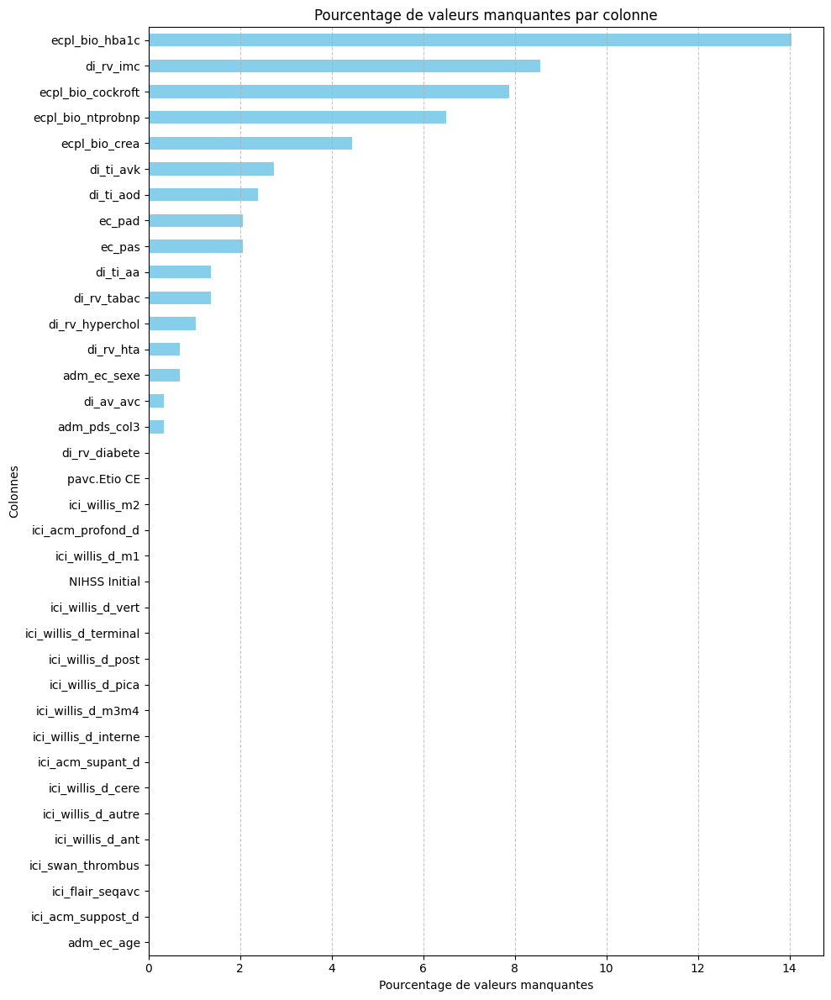

In [35]:
# Affichage du pourcentage de valeur manquante pour chaque colonne
pourcentage_valeurs_manquantes = df.isnull().mean() * 100
plt.figure(figsize=(10, 12))
pourcentage_valeurs_manquantes.sort_values().plot(kind='barh', color='skyblue')
plt.title('Pourcentage de valeurs manquantes par colonne')
plt.xlabel('Pourcentage de valeurs manquantes')
plt.ylabel('Colonnes')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

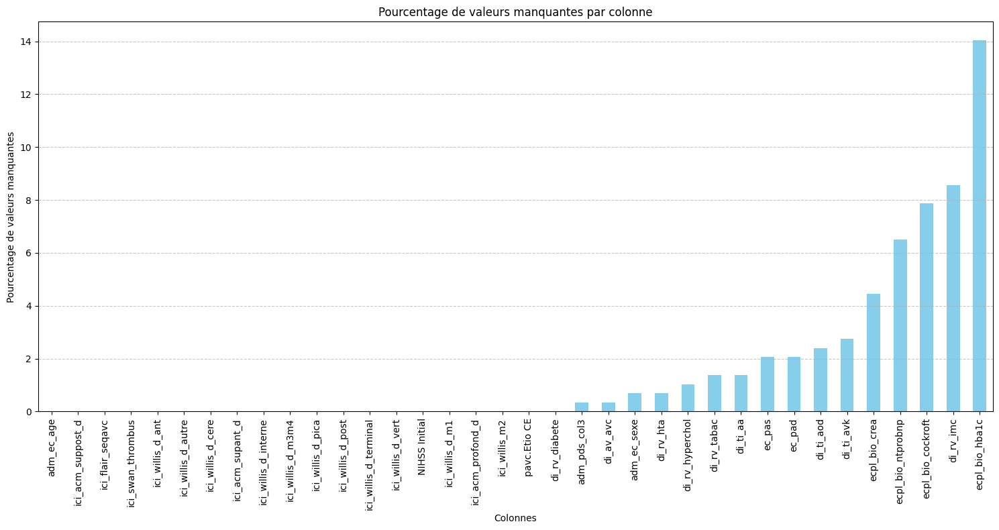

In [36]:
# Affichage du pourcentage de valeur manquante pour chaque colonne
pourcentage_valeurs_manquantes = df.isnull().mean() * 100
plt.figure(figsize=(15, 8))
pourcentage_valeurs_manquantes.sort_values().plot(kind='bar', color='skyblue')
plt.title('Pourcentage de valeurs manquantes par colonne')
plt.ylabel('Pourcentage de valeurs manquantes')
plt.xlabel('Colonnes')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

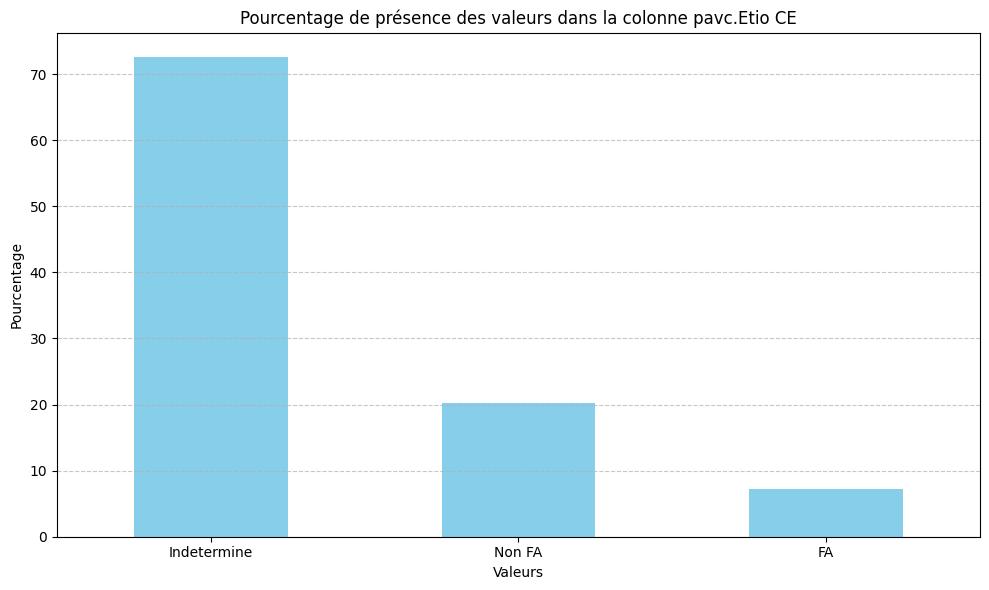

In [37]:
# Calcul du pourcentage de présence des valeurs pour chaque catégorie dans 'pavc.Etio CE'
pourcentage_valeurs = df['pavc.Etio CE'].value_counts(normalize=True) * 100

# Affichage du graphique en bâtons
plt.figure(figsize=(10, 6))
pourcentage_valeurs.plot(kind='bar', color='skyblue')
plt.title('Pourcentage de présence des valeurs dans la colonne pavc.Etio CE')
plt.ylabel('Pourcentage')
plt.xlabel('Valeurs')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [38]:
# Suppression des colonnes non numériques pour KNNImputer
cols_non_numeriques = ['adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol',
                      'di_rv_tabac', 'di_ti_aa', 'di_ti_aod', 'di_ti_avk', 'ici_acm_profond_d', 'ici_acm_supant_d', 
                       'ici_acm_suppost_d', 'ici_flair_seqavc', 'ici_swan_thrombus', 'ici_willis_d_ant', 'ici_willis_d_autre', 'ici_willis_d_cere', 
                       'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_m2', 'ici_willis_d_m3m4', 'ici_willis_d_pica', 'ici_willis_d_post', 
                       'ici_willis_d_terminal', 'ici_willis_d_vert', 'NIHSS Initial', 'pavc.Etio CE']

df_numeric = df.drop(columns=cols_non_numeriques)

# Application de KNNImputer pour remplir les valeurs manquantes
imputer = KNNImputer(n_neighbors=5)
df_numeric_imputed = pd.DataFrame(imputer.fit_transform(df_numeric), columns=df_numeric.columns)

df = pd.concat([df_numeric_imputed, df[cols_non_numeriques]], axis=1)
df = df.dropna()

In [39]:
df.reset_index(drop=True, inplace=True)
df.to_excel("selected_columns_database.xlsx", index=False)

In [2]:
df = pd.read_excel("selected_columns_database.xlsx")

# Etude statistique sur les colonnes 'di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age'
colonnes_a_etudier = [
    'di_rv_imc',
    'ec_pad',
    'ec_pas',
    'ecpl_bio_cockroft',
    'ecpl_bio_crea',
    'ecpl_bio_hba1c',
    'ecpl_bio_ntprobnp',
    'adm_ec_age'
]

statistiques_descriptives = df[colonnes_a_etudier].describe()
print(statistiques_descriptives)

        di_rv_imc      ec_pad      ec_pas  ecpl_bio_cockroft  ecpl_bio_crea  \
count  273.000000  273.000000  273.000000         273.000000     273.000000   
mean    26.825752   85.196347  153.319424          88.533486      85.268158   
std      5.213794   14.708745   27.519431          33.948352      46.753704   
min      2.400000   40.000000   18.000000          10.000000      36.000000   
25%     23.700000   77.000000  136.000000          68.000000      65.000000   
50%     26.100000   85.000000  151.000000          83.000000      78.000000   
75%     29.400000   94.000000  172.000000         105.000000      91.000000   
max     48.900000  129.000000  230.000000         246.000000     566.000000   

       ecpl_bio_hba1c  ecpl_bio_ntprobnp  adm_ec_age  
count      273.000000         273.000000  273.000000  
mean         5.999428         417.769150   65.007326  
std          1.171037         981.996843   14.252965  
min          4.400000          10.000000   22.000000  
25%          

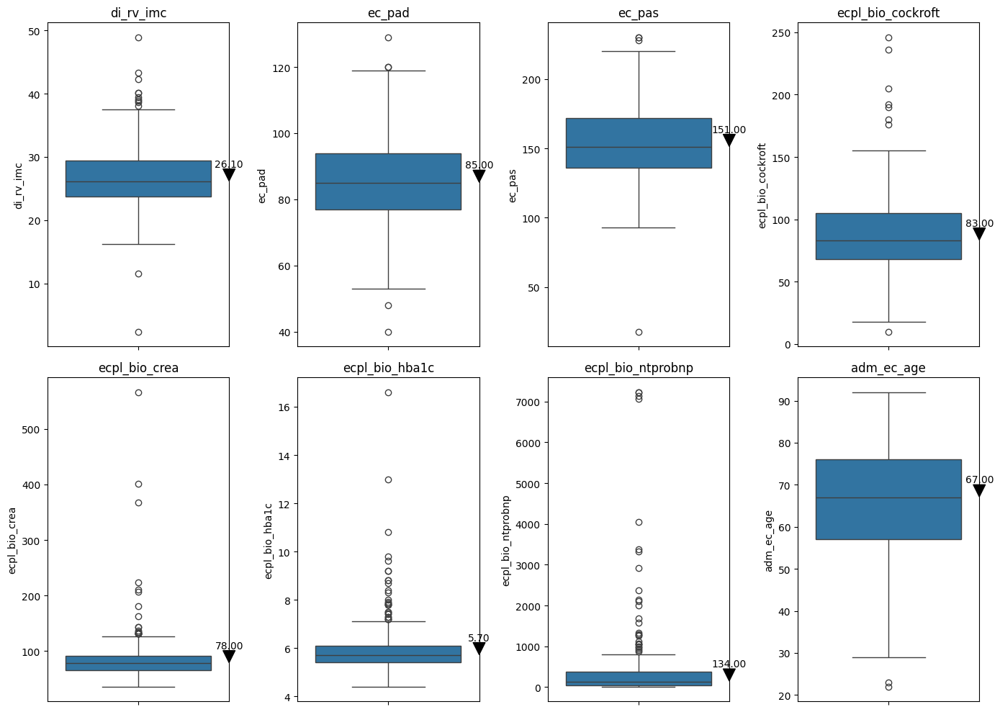

In [3]:
# Affichage des résultats
plt.figure(figsize=(14, 10))

for i, col in enumerate(colonnes_a_etudier, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(data=df[col])
    median = df[col].median()
    plt.title(col)
    plt.annotate(f'{median:.2f}', xy=(0.5, median), xytext=(0.5, median + 0.05 * (df[col].max() - df[col].min())),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 ha='center')

plt.tight_layout()
plt.show()

C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


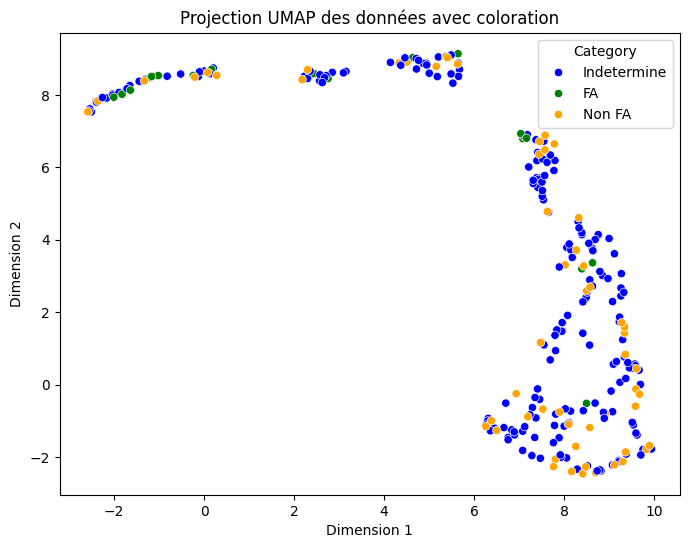

In [4]:
df = pd.read_excel("selected_columns_database.xlsx")

# Sélection des colonnes sur lesquelles appliquer UMAP
colonnes_a_reduire = [
    'di_rv_imc',
    'ec_pad',
    'ec_pas',
    'ecpl_bio_cockroft',
    'ecpl_bio_crea',
    'ecpl_bio_hba1c',
    'ecpl_bio_ntprobnp',
    'adm_ec_age'
]


data = df[colonnes_a_reduire]
df['color'] = df['pavc.Etio CE'].fillna('Unknown')
umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
embedding = umap_reducer.fit_transform(data)

# Conversion des résultats en DataFrame pour la visualisation
embedding_df = pd.DataFrame(embedding, columns=['Dimension 1', 'Dimension 2'])
embedding_df['color'] = df['color']

custom_palette = {'Non FA': 'orange', 'FA': 'green', 'Indetermine': 'blue'}

# Visualisation des résultats avec coloration
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='color', data=embedding_df, palette=custom_palette, legend='full')
plt.title('Projection UMAP des données avec coloration')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Category', loc='upper right')
plt.show()

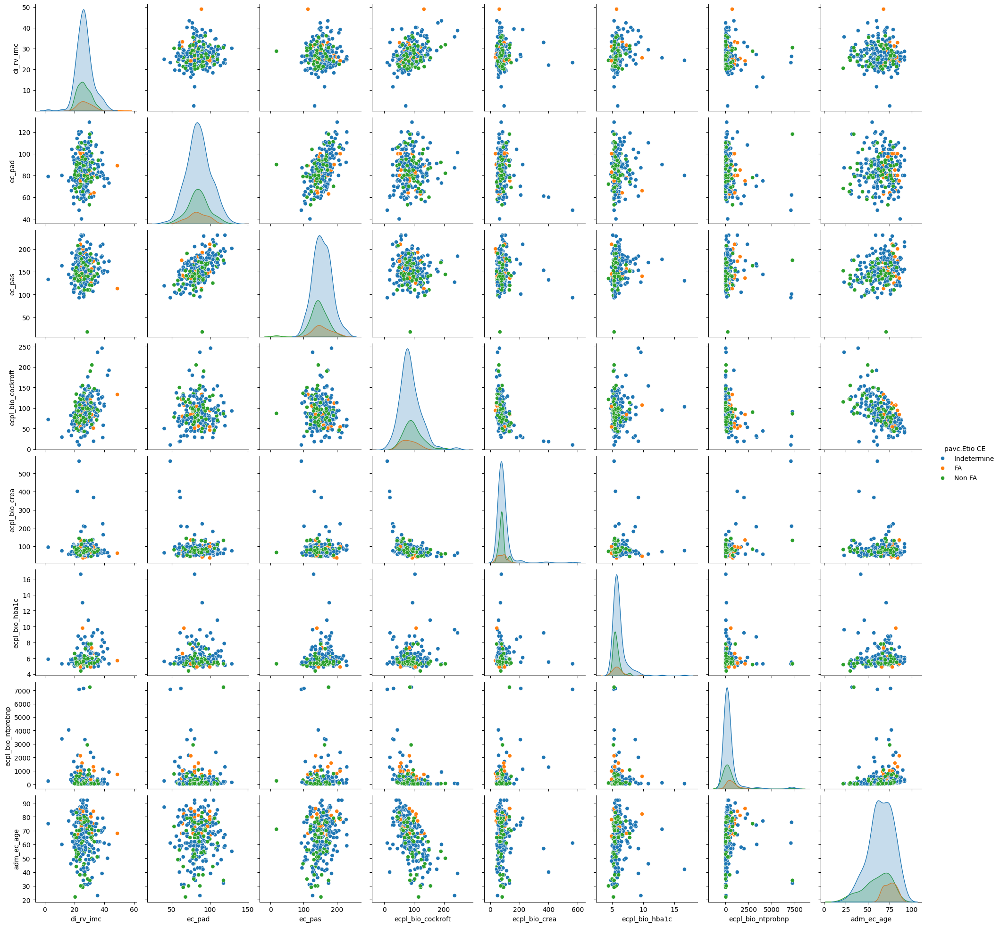

In [44]:
sns.pairplot(df.drop("NIHSS Initial", axis=1), hue='pavc.Etio CE')

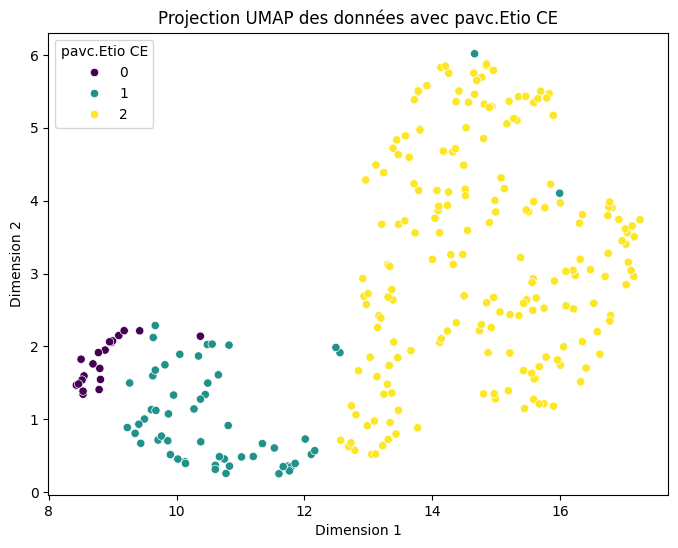

In [45]:
df = pd.read_excel("selected_columns_database.xlsx")

# Mapping de la colonne 'pavc.Etio CE'
etio_mapping = {"FA": 0, "Non FA": 1, "Indetermine": 2}
df['pavc.Etio CE'] = df['pavc.Etio CE'].map(etio_mapping)

# Sélection des colonnes
columns_for_umap = [
    'di_rv_imc',
    'ec_pad',
    'ec_pas',
    'ecpl_bio_cockroft',
    'ecpl_bio_crea',
    'ecpl_bio_hba1c',
    'ecpl_bio_ntprobnp',
    'adm_ec_age',
    'pavc.Etio CE'
]

data = df[columns_for_umap].values
scaled_data = StandardScaler().fit_transform(data)
reducer = umap.UMAP()
embedding = reducer.fit_transform(scaled_data)

# Visualisation avec UMAP
plt.figure(figsize=(8, 6))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=df['pavc.Etio CE'], palette='viridis', legend='full')
plt.title('Projection UMAP des données avec pavc.Etio CE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='pavc.Etio CE', loc='upper left')
plt.show()

In [ ]:
## ENCODAGE DE LA BASE DE DONNEES

In [46]:
df = pd.read_excel("selected_columns_database.xlsx")

# Colonnes à encoder
cols_non_numeriques = [
    'adm_ec_sexe', 'adm_pds_col3', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol',
    'di_rv_tabac', 'di_ti_aa', 'di_ti_aod', 'di_ti_avk', 'ici_acm_profond_d', 'ici_acm_supant_d', 
    'ici_acm_suppost_d', 'ici_flair_seqavc', 'ici_swan_thrombus', 'ici_willis_d_ant', 'ici_willis_d_autre', 
    'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_m2', 'ici_willis_d_m3m4', 
    'ici_willis_d_pica', 'ici_willis_d_post', 'ici_willis_d_terminal', 'ici_willis_d_vert', 'pavc.Etio CE']


# Mappings pour l'encodage
mapping_adm_ec_sexe = {'M': 0, 'F': 1}
mapping_adm_pds_col3 = {'ic': 0, 'ait': 1}
mapping_pavc_Etio_CE = {'FA': 0, 'Non FA': 1, 'Indetermine': 2}

# Appliquer l'encodage one-hot aux colonnes spécifiques
for col in cols_non_numeriques:
    if col == 'adm_ec_sexe':
        df[col] = df[col].map(mapping_adm_ec_sexe)
    elif col == 'adm_pds_col3':
        df[col] = df[col].map(mapping_adm_pds_col3)
    elif col == 'pavc.Etio CE':
        df[col] = df[col].map(mapping_pavc_Etio_CE)
    else:
        df[col] = df[col].apply(lambda x: 1 if x == 'oui' else 0)


df.to_excel('encoded_database.xlsx', index=False)

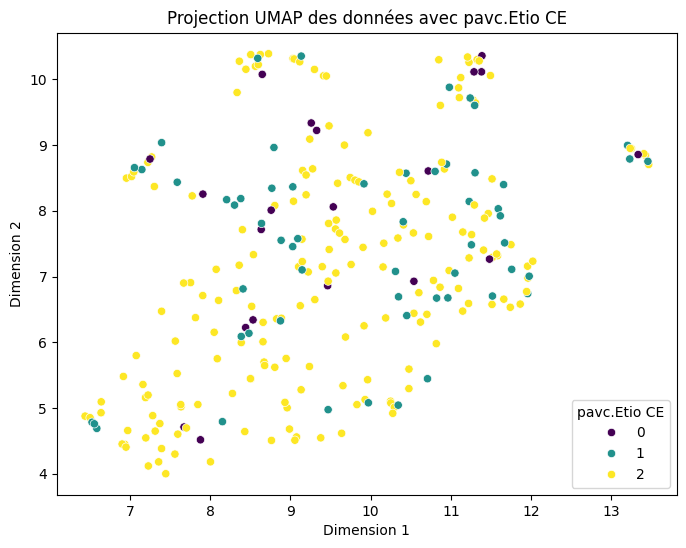

In [79]:
df = pd.read_excel("encoded_database.xlsx")

columns_for_umap = df.columns.tolist()
columns_for_umap.remove('pavc.Etio CE')

data = df[columns_for_umap].values
scaled_data = StandardScaler().fit_transform(data)
reducer = umap.UMAP()
embedding = reducer.fit_transform(scaled_data)

# Visualisation avec UMAP en utilisant la colonne 'pavc.Etio CE' pour la couleur
plt.figure(figsize=(8, 6))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=df['pavc.Etio CE'], palette='viridis', legend='full')
plt.title('Projection UMAP des données avec pavc.Etio CE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='pavc.Etio CE', loc='lower right')
plt.show()

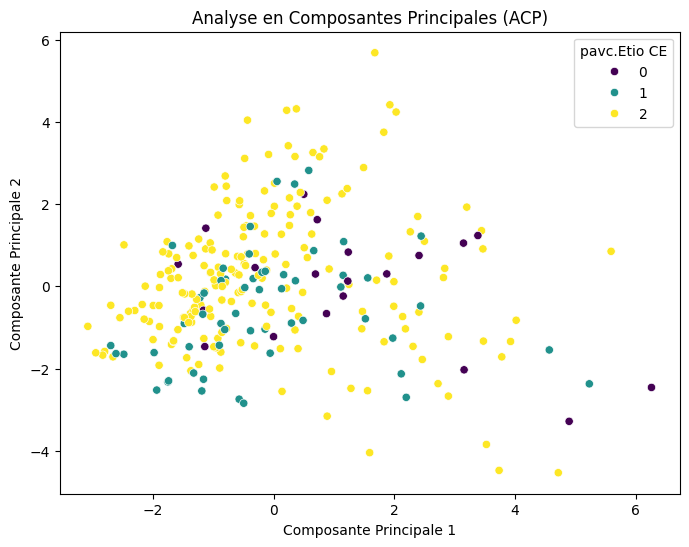

Variance expliquée par chaque composante principale:
[0.08551295 0.07889352]


In [5]:
df = pd.read_excel("encoded_database.xlsx")

# Sélection des colonnes pour l'ACP
columns_for_pca = df.columns.tolist()

if 'pavc.Etio CE' in columns_for_pca:
    columns_for_pca.remove('pavc.Etio CE')

# Préparation des données pour l'ACP
data = df[columns_for_pca].values
scaled_data = StandardScaler().fit_transform(data)

# Initialisation de l'ACP
pca = PCA(n_components=2, random_state=42)
principal_components = pca.fit_transform(scaled_data)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Visualisation des résultats
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue=df['pavc.Etio CE'], data=pca_df, palette='viridis')
plt.title('Analyse en Composantes Principales (ACP)')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.show()

print("Variance expliquée par chaque composante principale:")
print(pca.explained_variance_ratio_)


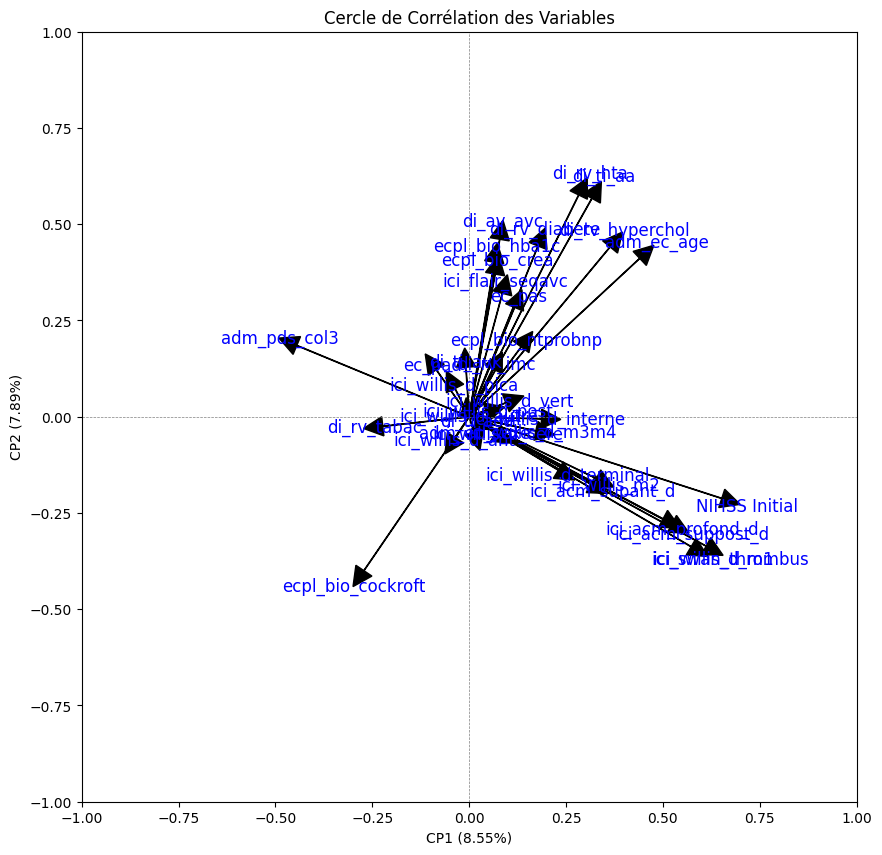

In [53]:
df = pd.read_excel("encoded_database.xlsx")

# Sélection des colonnes pour l'ACP
columns_for_pca = df.columns.tolist()

if 'pavc.Etio CE' in columns_for_pca:
    columns_for_pca.remove('pavc.Etio CE')

data = df[columns_for_pca].values
scaled_data = StandardScaler().fit_transform(data)
pca = PCA(n_components=2, random_state=42)
principal_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

pcs = pca.components_.T * np.sqrt(pca.explained_variance_)

# Création du cercle de corrélation
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)

for i, (pc1, pc2) in enumerate(zip(pcs[:, 0], pcs[:, 1])):
    ax.arrow(0, 0, pc1, pc2, head_width=0.05, head_length=0.05, color='k')
    ax.text(pc1 * 1.1, pc2 * 1.1, columns_for_pca[i], ha='center', va='center', color='blue', fontsize=12)

ax.axhline(0, color='grey', linestyle='--', linewidth=0.5)
ax.axvline(0, color='grey', linestyle='--', linewidth=0.5)
ax.set_xlabel('CP1 ({}%)'.format(round(pca.explained_variance_ratio_[0]*100, 2)))
ax.set_ylabel('CP2 ({}%)'.format(round(pca.explained_variance_ratio_[1]*100, 2)))
plt.title('Cercle de Corrélation des Variables')
plt.show()

# AVEC 3 CLASSES

## SUR ECHANTILLONAGE ET NORMALISATION DES DONNEES

In [251]:
df = pd.read_excel("encoded_database.xlsx")

In [252]:
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']

In [51]:
print("Distribution initiale des classes:")
print(y.value_counts())

Distribution initiale des classes:
pavc.Etio CE
2    196
1     57
0     20
Name: count, dtype: int64


In [253]:
# Sur-échantillonnage des cas FA (classe 0)
#smote = SMOTE(sampling_strategy={0: int(0.5 * sum(y == 2))}, random_state=42)
smote = SMOTE(sampling_strategy={0: int(0.5 * sum(y == 2)), 1: int(3 * sum(y == 1))}, random_state=42)
X_res, y_res = smote.fit_resample(X, y)

In [53]:
print("\nDistribution des classes après rééquilibrage:")
print(y_res.value_counts())


Distribution des classes après rééquilibrage:
pavc.Etio CE
2    196
1    171
0     98
Name: count, dtype: int64


In [254]:
# Normalisation des données
scaler = StandardScaler()
X_res_scaled = scaler.fit_transform(X_res)

In [78]:
# Division des données
X_train, X_test, y_train, y_test = train_test_split(X_res_scaled, y_res, test_size=0.2, random_state=42, stratify=y_res)

In [7]:
print("Distribution initiale des classes :")
print("Ensemble d'entrainement :", y_train.value_counts())
print('-------------------------------------')
print("Ensemble de test :",y_test.value_counts())

Distribution initiale des classes :
Ensemble d'entrainement : pavc.Etio CE
2    157
1    137
0     78
Name: count, dtype: int64
-------------------------------------
Ensemble de test : pavc.Etio CE
2    39
1    34
0    20
Name: count, dtype: int64


## ALGORITHME RANDOM FOREST

In [79]:
rf_model = RandomForestClassifier(random_state=42)
scores = cross_val_score(rf_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.81333333 0.82666667 0.82432432 0.74324324 0.78378378]
Mean cross-validation score: 0.7982702702702702


In [80]:
# Définition des hyperparamètres à optimiser
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_model = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train, y_train)

best_params_rf = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_rf}")

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Meilleurs hyperparamètres : {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [81]:
#best_params_rf = {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

# Initialisation du modèle de Random Forest avec les meilleurs hyperparamètres trouvés
rf_model = RandomForestClassifier(**best_params_rf, random_state=42)

In [82]:
scores = cross_val_score(rf_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.81333333 0.82666667 0.82432432 0.75675676 0.78378378]
Mean cross-validation score: 0.8009729729729731


In [83]:
# Entraînement du modèle
rf_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=20, random_state=42)

In [84]:
# Prédiction sur l'ensemble de test
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)

In [85]:
# Évaluation du modèle
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred, zero_division=0))

Accuracy: 0.78
              precision    recall  f1-score   support

           0       0.85      0.85      0.85        20
           1       0.79      0.68      0.73        34
           2       0.75      0.85      0.80        39

    accuracy                           0.78        93
   macro avg       0.80      0.79      0.79        93
weighted avg       0.79      0.78      0.78        93



In [86]:
# Prédiction sur l'ensemble d'entrainement pour valider la base de données
y_pred_train = rf_model.predict(X_train)

# Évaluation du modèle
accuracy = accuracy_score(y_train, y_pred_train)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_train, y_pred_train, zero_division=0))

Accuracy: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        78
           1       1.00      1.00      1.00       137
           2       1.00      1.00      1.00       157

    accuracy                           1.00       372
   macro avg       1.00      1.00      1.00       372
weighted avg       1.00      1.00      1.00       372



In [87]:
# Affichage du classement des features par importance
importances = rf_model.feature_importances_
feature_importances_df = pd.DataFrame(importances, index=X.columns, columns=['Importance'])
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Classement des features par importance :")
print(feature_importances_df)

Classement des features par importance :
                       Importance
ecpl_bio_ntprobnp        0.123897
adm_ec_age               0.094775
ecpl_bio_cockroft        0.089021
ecpl_bio_crea            0.080353
ecpl_bio_hba1c           0.075293
ec_pas                   0.073649
di_rv_imc                0.070851
ec_pad                   0.066651
di_rv_tabac              0.057343
NIHSS Initial            0.047687
adm_pds_col3             0.028213
adm_ec_sexe              0.025382
ici_flair_seqavc         0.023009
di_ti_aa                 0.020208
di_rv_hyperchol          0.019142
di_rv_diabete            0.016806
ici_acm_suppost_d        0.013804
di_rv_hta                0.013216
ici_swan_thrombus        0.010606
ici_acm_supant_d         0.010165
di_av_avc                0.009709
ici_acm_profond_d        0.007021
ici_willis_d_m1          0.006000
ici_willis_m2            0.004674
ici_willis_d_post        0.002960
ici_willis_d_m3m4        0.002926
ici_willis_d_cere        0.001946
ici_wil

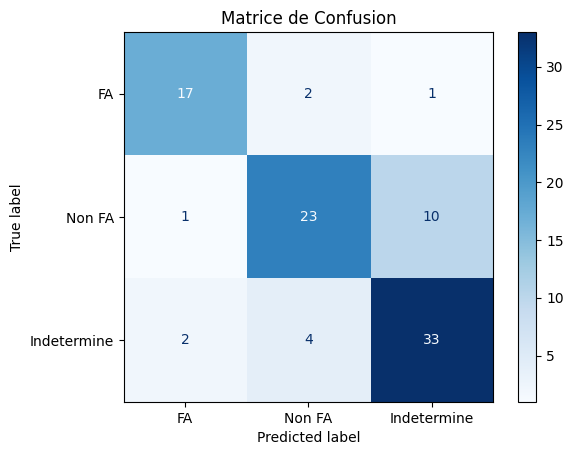

In [88]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA', 'Indetermine'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

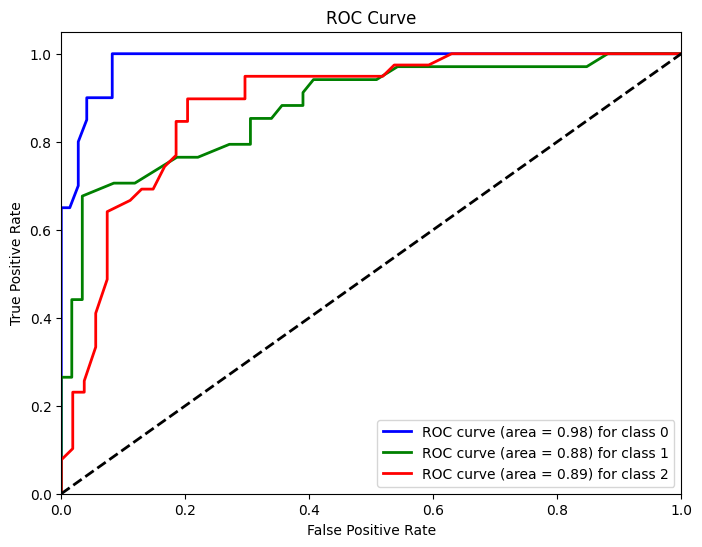

In [90]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green', 'red']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

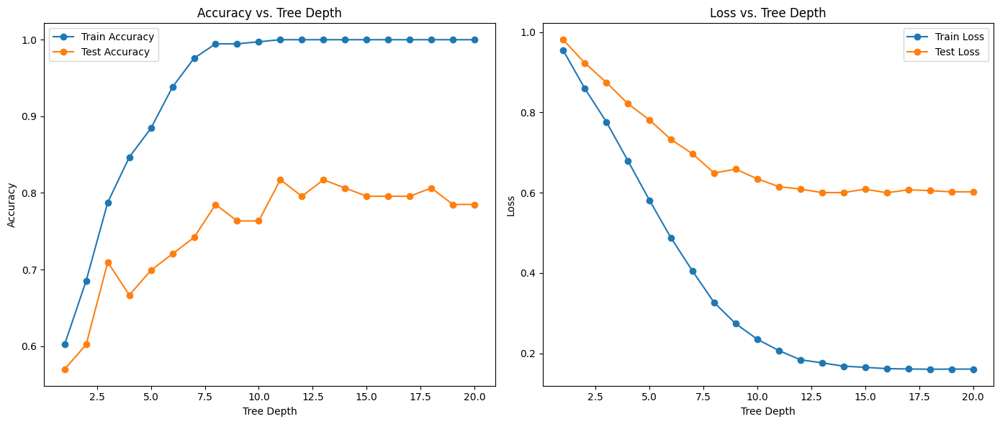

Train Accuracies: [0.6021505376344086, 0.6854838709677419, 0.7876344086021505, 0.8467741935483871, 0.8844086021505376, 0.9381720430107527, 0.9758064516129032, 0.9946236559139785, 0.9946236559139785, 0.9973118279569892, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Test Accuracies: [0.5698924731182796, 0.6021505376344086, 0.7096774193548387, 0.6666666666666666, 0.6989247311827957, 0.7204301075268817, 0.7419354838709677, 0.7849462365591398, 0.7634408602150538, 0.7634408602150538, 0.8172043010752689, 0.7956989247311828, 0.8172043010752689, 0.8064516129032258, 0.7956989247311828, 0.7956989247311828, 0.7956989247311828, 0.8064516129032258, 0.7849462365591398, 0.7849462365591398]
Train Losses: [0.9543472633903316, 0.8596466406150829, 0.7763630400233626, 0.6796941549879062, 0.581276173228985, 0.48738330854966, 0.40464112514613243, 0.3263920596734319, 0.27375658057447394, 0.23503059942477983, 0.2069387636561522, 0.1839246846720083, 0.17647097653665852, 0.16805627116871472, 0.16518712430893

In [91]:
# Profondeurs des arbres à tester
max_depths = range(1, 21)

train_accuracies = []
test_accuracies = []
train_losses = []
test_losses = []

# Boucle sur chaque profondeur
for depth in max_depths:
    rf_model = RandomForestClassifier(max_depth=depth, random_state=42, min_samples_leaf=1, min_samples_split=2, n_estimators=100)
    rf_model.fit(X_train, y_train)
    
    y_train_pred = rf_model.predict(X_train)
    y_train_pred_proba = rf_model.predict_proba(X_train)
    
    y_test_pred = rf_model.predict(X_test)
    y_test_pred_proba = rf_model.predict_proba(X_test)

    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_loss = log_loss(y_train, y_train_pred_proba)
    test_loss = log_loss(y_test, y_test_pred_proba)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    train_losses.append(train_loss)
    test_losses.append(test_loss)

plt.figure(figsize=(14, 6))

# Accuracy vs. Tree Depth
plt.subplot(1, 2, 1)
plt.plot(max_depths, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(max_depths, test_accuracies, label='Test Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Tree Depth')
plt.legend()

# Loss vs. Tree Depth
plt.subplot(1, 2, 2)
plt.plot(max_depths, train_losses, label='Train Loss', marker='o')
plt.plot(max_depths, test_losses, label='Test Loss', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Loss')
plt.title('Loss vs. Tree Depth')
plt.legend()

plt.tight_layout()
plt.show()

print("Train Accuracies:", train_accuracies)
print("Test Accuracies:", test_accuracies)
print("Train Losses:", train_losses)
print("Test Losses:", test_losses)

## ALGORITHME SVM

In [92]:
svm_model = SVC(random_state=42)
scores = cross_val_score(svm_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.70666667 0.72       0.68918919 0.59459459 0.62162162]
Mean cross-validation score: 0.6664144144144144


In [93]:
# Définition des hyperparamètres à optimiser
param_grid = {
        'C': [0.1, 1, 10, 100],
        'gamma': [0.01, 0.1, 1, 10],
        'kernel': ['linear', 'rbf', 'poly']
    }

svm_model = SVC(probability=True)
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train, y_train)

best_params_svm = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_svm}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Meilleurs hyperparamètres : {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}


In [94]:
#best_params_svm = {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}

# Initialisation du modèle de SVM avec les meilleurs hyperparamètres trouvés
svm_model = SVC(**best_params_svm, random_state=42, probability=True)

In [95]:
scores = cross_val_score(svm_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.77333333 0.81333333 0.78378378 0.7027027  0.75675676]
Mean cross-validation score: 0.765981981981982


In [99]:
# Entraînement du modèle
svm_model.fit(X_train, y_train)

SVC(C=100, gamma=0.1, probability=True, random_state=42)

In [100]:
# Prédiction sur l'ensemble de test
y_pred_svm = svm_model.predict(X_test)
y_pred_proba_svm = svm_model.predict_proba(X_test)

In [101]:
# Évaluation du modèle
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"Accuracy: {accuracy_svm:.2f}")
print(classification_report(y_test, y_pred_svm, zero_division=0))

Accuracy: 0.69
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        20
           1       0.69      0.53      0.60        34
           2       0.66      0.79      0.72        39

    accuracy                           0.69        93
   macro avg       0.70      0.69      0.69        93
weighted avg       0.69      0.69      0.68        93



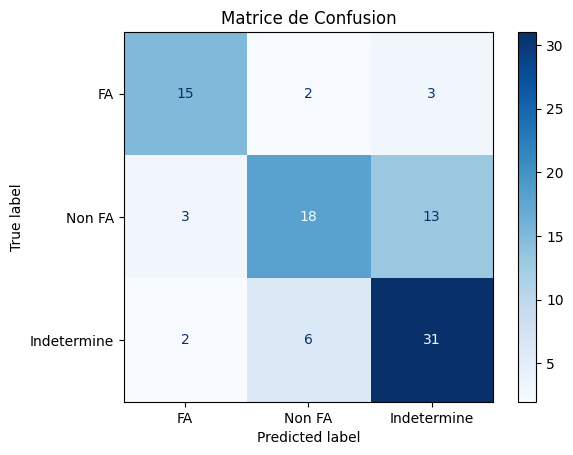

In [102]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_svm)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA', 'Indetermine'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

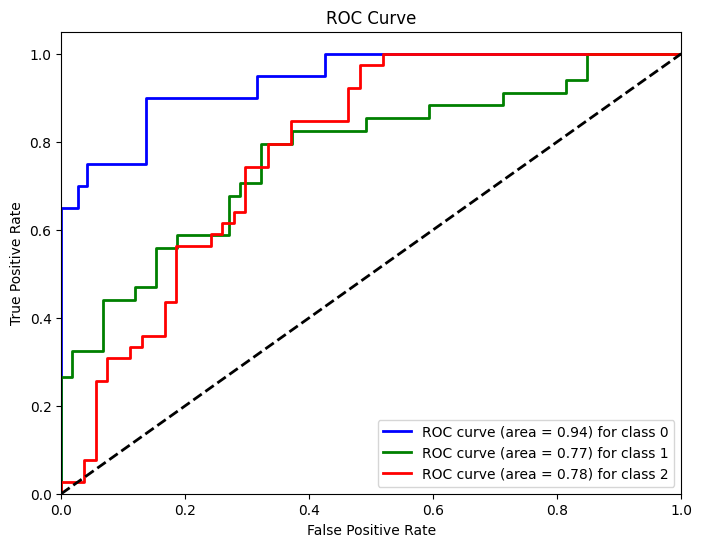

In [104]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_svm, multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_svm[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green', 'red']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

## ALGORITHME LASSO

In [105]:
lasso_model = LogisticRegression()
scores = cross_val_score(lasso_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.68       0.66666667 0.62162162 0.55405405 0.60810811]
Mean cross-validation score: 0.62609009009009


In [106]:
# Définition des hyperparamètres à optimiser
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Valeurs de régularisation inverse
    'solver': ['liblinear'],  # Solver compatible avec L1
    'penalty': ['l1']  # Pénalisation L1
} 

lasso_model = LogisticRegression()
grid_search = GridSearchCV(estimator=lasso_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params_lasso = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_lasso}")

Meilleurs hyperparamètres : {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}


In [107]:
#best_params_lasso = {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}

# Initialisation du modèle Lasso avec les meilleurs hyperparamètres trouvés
lasso_model = LogisticRegression(**best_params_lasso, random_state=42)

In [108]:
scores = cross_val_score(lasso_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.65333333 0.68       0.62162162 0.55405405 0.62162162]
Mean cross-validation score: 0.6261261261261261


In [109]:
# Entraînement du modèle
lasso_model.fit(X_train, y_train)

LogisticRegression(C=1, penalty='l1', random_state=42, solver='liblinear')

In [110]:
# Prédiction sur l'ensemble de test
y_pred_lasso = lasso_model.predict(X_test)
y_pred_proba_lasso = lasso_model.predict_proba(X_test)

In [111]:
# Évaluation du modèle
accuracy_lasso = accuracy_score(y_test, y_pred_lasso)
print(f"Accuracy: {accuracy_lasso:.2f}")
print(classification_report(y_test, y_pred_lasso, zero_division=0))

Accuracy: 0.66
              precision    recall  f1-score   support

           0       0.68      0.75      0.71        20
           1       0.61      0.56      0.58        34
           2       0.68      0.69      0.68        39

    accuracy                           0.66        93
   macro avg       0.66      0.67      0.66        93
weighted avg       0.65      0.66      0.65        93



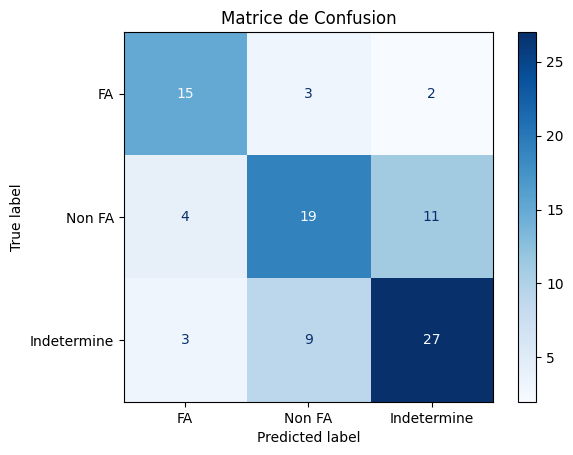

In [112]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_lasso)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA', 'Indetermine'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

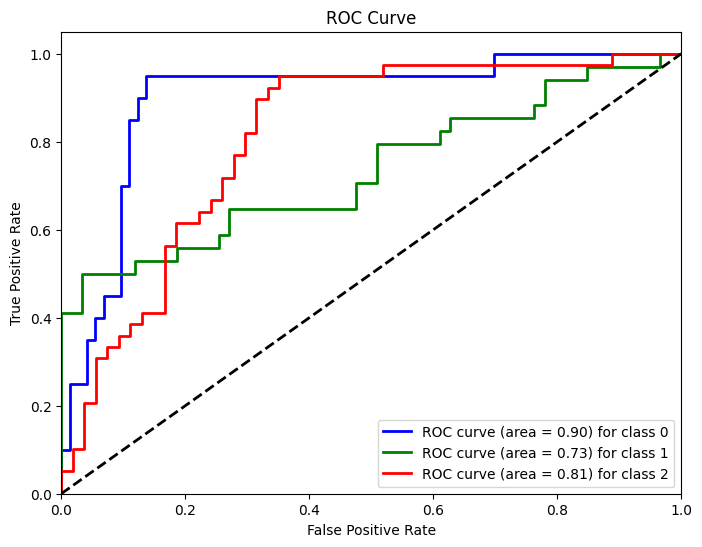

In [114]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_lasso, multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_lasso[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green', 'red']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

## ALGORITHME XGBoost

In [115]:
xgb_model = XGBClassifier()
scores = cross_val_score(xgb_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.68       0.84       0.74324324 0.7027027  0.72972973]
Mean cross-validation score: 0.7391351351351352


In [116]:
param_grid = {
    'n_estimators': [100, 200, 300],  # Nombre d'arbres
    'max_depth': [3, 5, 7, 9],  # Profondeur maximale des arbres
    'learning_rate': [0.01, 0.1, 0.2, 0.3],  # Taux d'apprentissage
    'subsample': [0.6, 0.8, 1.0],  # Fraction des échantillons pour chaque arbre
}

xgb_model = XGBClassifier()
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params_xgb = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_xgb}")

Meilleurs hyperparamètres : {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.6}


In [117]:
#best_params_lasso = {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.6}

# Initialisation du modèle Lasso avec les meilleurs hyperparamètres trouvés
xgb_model = XGBClassifier(**best_params_xgb, random_state=42)

In [118]:
scores = cross_val_score(xgb_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.77333333 0.85333333 0.81081081 0.7972973  0.78378378]
Mean cross-validation score: 0.8037117117117116


In [119]:
# Entraînement du modèle
xgb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, max_depth=7, n_estimators=300,
                           random_state=42, subsample=0.6)

In [120]:
# Prédiction sur l'ensemble de test
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)

In [121]:
# Évaluation du modèle
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Accuracy: {accuracy_xgb:.2f}")
print(classification_report(y_test, y_pred_xgb, zero_division=0))

Accuracy: 0.88
              precision    recall  f1-score   support

           0       0.90      0.95      0.93        20
           1       0.84      0.91      0.87        34
           2       0.91      0.82      0.86        39

    accuracy                           0.88        93
   macro avg       0.89      0.89      0.89        93
weighted avg       0.88      0.88      0.88        93



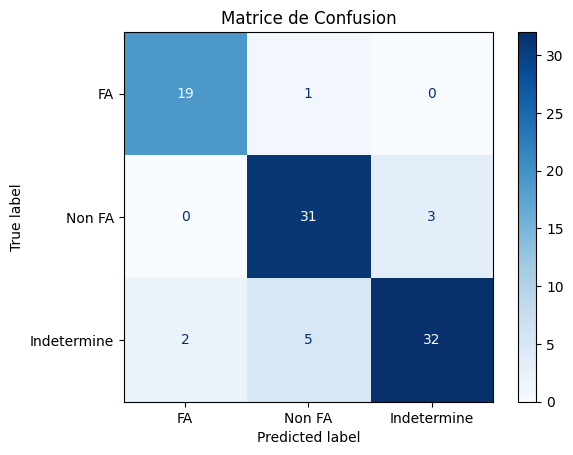

In [122]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_xgb)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA', 'Indetermine'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

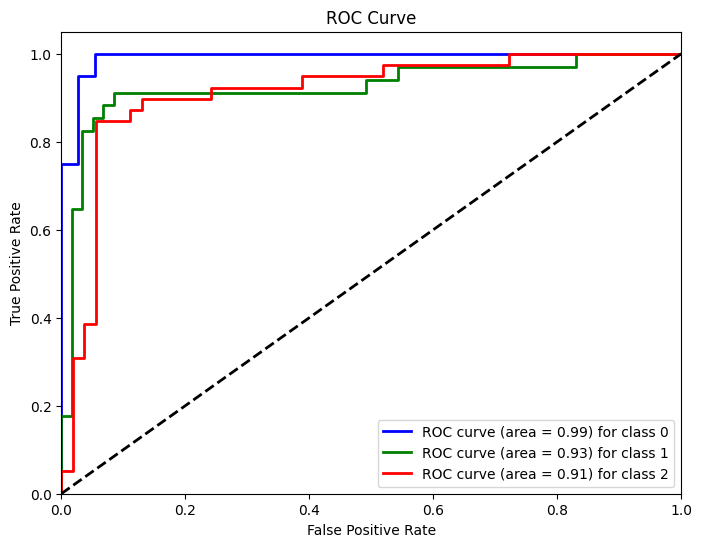

In [123]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_xgb, multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_xgb[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green', 'red']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

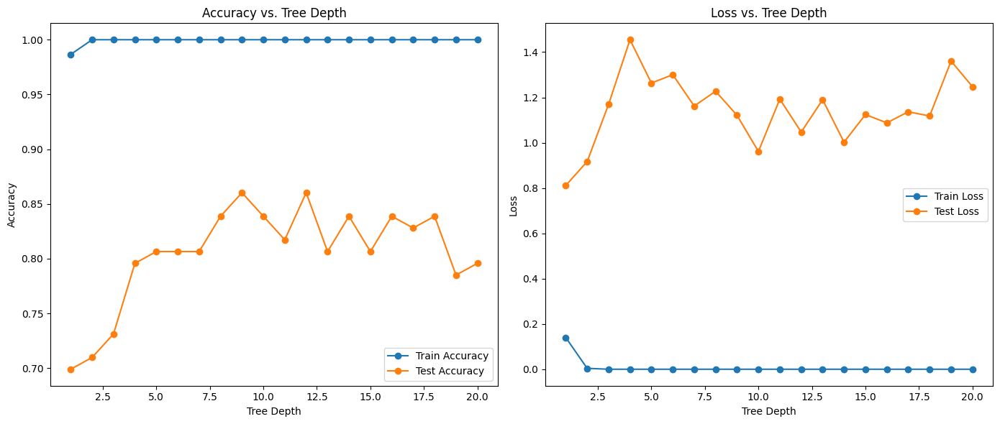

Train Accuracies: [0.9865591397849462, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Test Accuracies: [0.6989247311827957, 0.7096774193548387, 0.7311827956989247, 0.7956989247311828, 0.8064516129032258, 0.8064516129032258, 0.8064516129032258, 0.8387096774193549, 0.8602150537634409, 0.8387096774193549, 0.8172043010752689, 0.8602150537634409, 0.8064516129032258, 0.8387096774193549, 0.8064516129032258, 0.8387096774193549, 0.8279569892473119, 0.8387096774193549, 0.7849462365591398, 0.7956989247311828]
Train Losses: [0.1398813646184046, 0.004054019142909058, 2.5634130149200694e-05, 2.5760700220762265e-08, 1.069282145715894e-08, 9.95923008371457e-09, 1.0630915865015338e-08, 1.0381163257959435e-08, 9.700518654358365e-09, 9.879174342619753e-09, 1.00402860684414e-08, 9.96811916276172e-09, 9.22965354757799e-09, 9.190402753192662e-09, 9.120919982975993e-09, 9.356339033186382e-09, 9.381488723357714e-09, 8.88717017803261e-09, 8.988159415101733e-09, 8

In [124]:
# Profondeurs des arbres à tester
max_depths = range(1, 21)

train_accuracies = []
test_accuracies = []
train_losses = []
test_losses = []

# Boucle sur chaque profondeur
for depth in max_depths:
    xgb_model = XGBClassifier(max_depth=depth, random_state=42, n_estimators=300, learning_rate=0.3, subsample=0.6)
    xgb_model.fit(X_train, y_train)
    
    y_train_pred = xgb_model.predict(X_train)
    y_train_pred_proba = xgb_model.predict_proba(X_train)
    
    y_test_pred = xgb_model.predict(X_test)
    y_test_pred_proba = xgb_model.predict_proba(X_test)

    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_loss = log_loss(y_train, y_train_pred_proba)
    test_loss = log_loss(y_test, y_test_pred_proba)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    train_losses.append(train_loss)
    test_losses.append(test_loss)

plt.figure(figsize=(14, 6))

# Accuracy vs. Tree Depth
plt.subplot(1, 2, 1)
plt.plot(max_depths, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(max_depths, test_accuracies, label='Test Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Tree Depth')
plt.legend()

# Loss vs. Tree Depth
plt.subplot(1, 2, 2)
plt.plot(max_depths, train_losses, label='Train Loss', marker='o')
plt.plot(max_depths, test_losses, label='Test Loss', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Loss')
plt.title('Loss vs. Tree Depth')
plt.legend()

plt.tight_layout()
plt.show()

print("Train Accuracies:", train_accuracies)
print("Test Accuracies:", test_accuracies)
print("Train Losses:", train_losses)
print("Test Losses:", test_losses)

## ALGORITHME SEMI-SUPERVISED LEARNING

In [263]:
y_res_ssl = np.copy(y_res)

# Convertion des étiquettes indéterminées (2) en -1 pour l'apprentissage semi-supervisé
y_res_ssl[y_res_ssl == 2] = -1

# Application du LabelSpreading
label_spread = LabelSpreading(kernel='knn', n_neighbors=5, alpha=0.2, max_iter=30)
label_spread.fit(X_res_scaled, y_res_ssl)

# Récupération des nouvelles étiquettes prédites
y_res_labeled = label_spread.transduction_

X_train_ssl, X_test_ssl, y_train_ssl, y_test_ssl = train_test_split(X_res_scaled, y_res_labeled, test_size=0.2, random_state=42, stratify=y_res)

# Entraînement du modèle sur le nouveau jeu de données avec uniquement des classes 0 et 1
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train_ssl, y_train_ssl)
y_pred_ssl = clf.predict(X_test_ssl)

# Affichage la matrice de confusion et le rapport de classification
class_report = classification_report(y_test_ssl, y_pred_ssl)
accuracy = accuracy_score(y_test_ssl, y_pred_ssl)

print(f"Accuracy: {accuracy:.2f}")
print("\nRapport de classification :\n", class_report)

Accuracy: 0.88

Rapport de classification :
               precision    recall  f1-score   support

           0       0.89      0.76      0.82        33
           1       0.88      0.95      0.91        60

    accuracy                           0.88        93
   macro avg       0.88      0.85      0.87        93
weighted avg       0.88      0.88      0.88        93



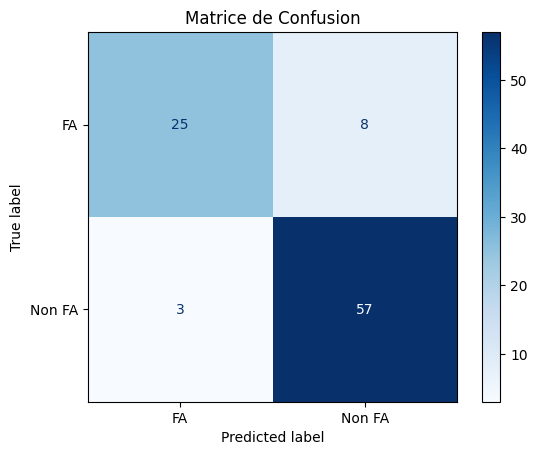

In [261]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test_ssl, y_pred_ssl)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

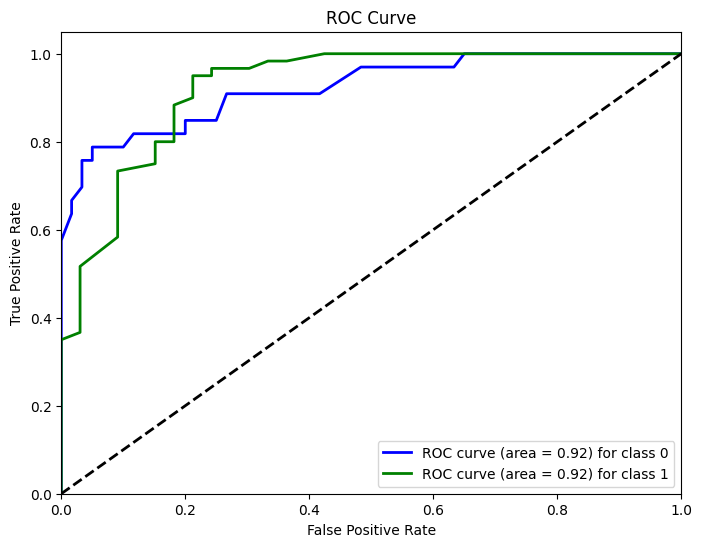

In [265]:
y_pred_proba_ssl = clf.predict_proba(X_test_ssl)

# Calcul du score AUC
roc_auc = roc_auc_score(y_test_ssl, y_pred_proba_ssl[:, 1], multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_ssl[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# AVEC 2 CLASSES

## SUR ECHANTILLONAGE ET NORMALISATION DES DONNEES

In [79]:
df = pd.read_excel("encoded_database.xlsx")

In [80]:
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']

In [81]:
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

In [82]:
print("Distribution initiale des classes:")
print(y_filtered.value_counts())

Distribution initiale des classes:
pavc.Etio CE
1    57
0    20
Name: count, dtype: int64


In [83]:
# Normalisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_filtered)

In [84]:
# Division des données
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_filtered, test_size=0.3, random_state=42, stratify=y_filtered)

In [85]:
print(y_train.value_counts())

pavc.Etio CE
1    39
0    14
Name: count, dtype: int64


In [86]:
# Sur-échantillonnage des cas FA (classe 0)
smote = SMOTE(sampling_strategy={0: int(10 * sum(y_train == 0)), 1: int(4 * sum(y_train == 1))}, random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [87]:
print("\nDistribution des classes après rééquilibrage:")
print(y_train.value_counts())


Distribution des classes après rééquilibrage:
pavc.Etio CE
1    156
0    140
Name: count, dtype: int64


In [88]:
print("Distribution des classes sur l'ensemble d'entrainement et de test :")
print("Ensemble d'entrainement :", y_train.value_counts())
print('-------------------------------------')
print("Ensemble de test :",y_test.value_counts())

Distribution des classes sur l'ensemble d'entrainement et de test :
Ensemble d'entrainement : pavc.Etio CE
1    156
0    140
Name: count, dtype: int64
-------------------------------------
Ensemble de test : pavc.Etio CE
1    18
0     6
Name: count, dtype: int64


## ALGORITHME RANDOM FOREST

In [89]:
rf_model = RandomForestClassifier(random_state=42)
scores = cross_val_score(rf_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.96666667 0.96610169 1.         1.         1.        ]
Mean cross-validation score: 0.9865536723163842


In [90]:
# Définition des hyperparamètres à optimiser
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_model = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train, y_train)

best_params_rf = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_rf}")

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Meilleurs hyperparamètres : {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [91]:
#best_params_rf = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

# Initialisation du modèle de Random Forest avec les meilleurs hyperparamètres trouvés
rf_model = RandomForestClassifier(**best_params_rf, random_state=42)

In [92]:
scores = cross_val_score(rf_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.96666667 0.98305085 1.         1.         1.        ]
Mean cross-validation score: 0.9899435028248588


In [93]:
# Entraînement du modèle
rf_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [94]:
# Prédiction sur l'ensemble de test
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)

In [95]:
# Évaluation du modèle
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred, zero_division=0))

Accuracy: 0.67
              precision    recall  f1-score   support

           0       0.33      0.33      0.33         6
           1       0.78      0.78      0.78        18

    accuracy                           0.67        24
   macro avg       0.56      0.56      0.56        24
weighted avg       0.67      0.67      0.67        24



In [30]:
# Affichage du classement des features par importance
importances = rf_model.feature_importances_
feature_importances_df = pd.DataFrame(importances, index=X.columns, columns=['Importance'])
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Classement des features par importance :")
print(feature_importances_df)

Classement des features par importance :
                       Importance
ecpl_bio_ntprobnp        0.235070
adm_ec_age               0.133529
ecpl_bio_crea            0.069182
ecpl_bio_cockroft        0.064818
ici_acm_supant_d         0.055060
di_rv_hta                0.051536
ec_pas                   0.047150
di_rv_imc                0.042708
di_ti_aa                 0.032804
ec_pad                   0.031907
NIHSS Initial            0.031733
ici_swan_thrombus        0.030884
ecpl_bio_hba1c           0.029943
di_rv_hyperchol          0.021931
adm_ec_sexe              0.017070
ici_willis_m2            0.016726
ici_acm_profond_d        0.015856
adm_pds_col3             0.012865
ici_flair_seqavc         0.009594
ici_acm_suppost_d        0.008114
ici_willis_d_terminal    0.007730
di_rv_tabac              0.007645
di_rv_diabete            0.007538
di_av_avc                0.007220
ici_willis_d_cere        0.003615
ici_willis_d_m1          0.002543
ici_willis_d_post        0.001761
ici_wil

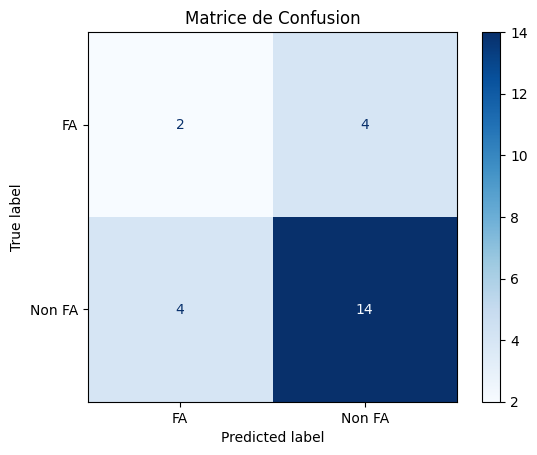

In [96]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

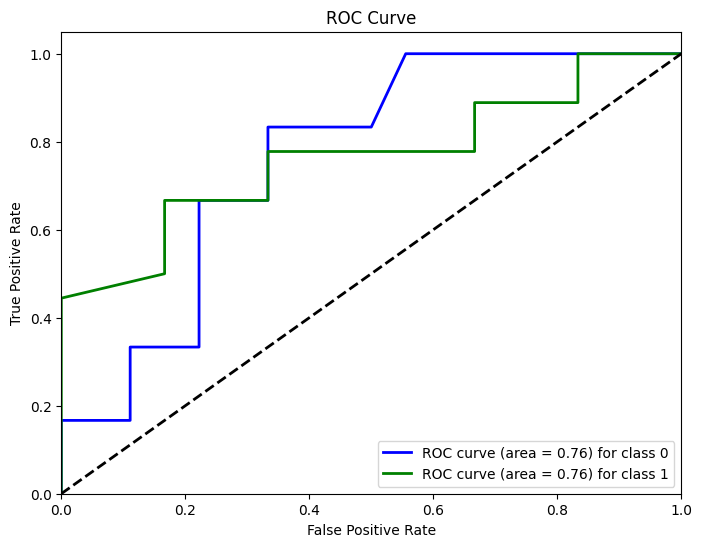

In [97]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba[:, 1], multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

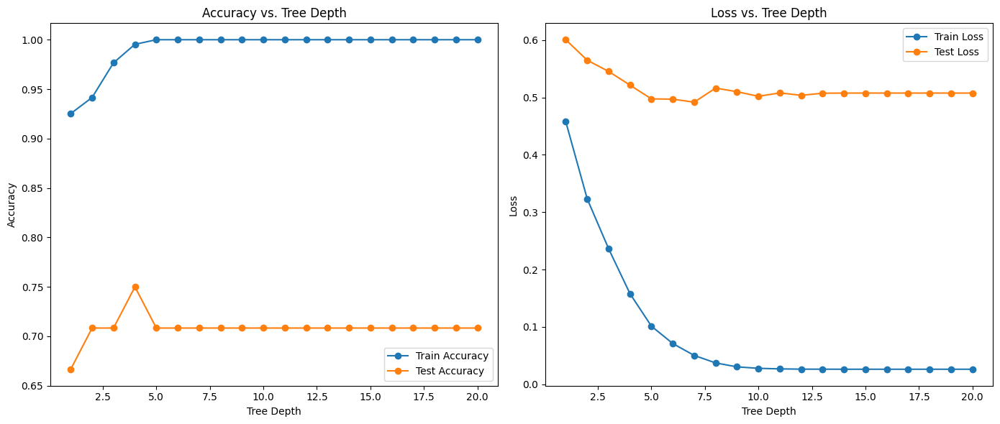

Train Accuracies: [0.9252336448598131, 0.9415887850467289, 0.9766355140186916, 0.9953271028037384, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Test Accuracies: [0.6666666666666666, 0.7083333333333334, 0.7083333333333334, 0.75, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334, 0.7083333333333334]
Train Losses: [0.4578861885385341, 0.3233924297967217, 0.23639955276967553, 0.15785235796175315, 0.10120364473600159, 0.07085147435471462, 0.050123356550457326, 0.03707768674076519, 0.03018514228716381, 0.02767641267599067, 0.02667885988582665, 0.026215529895796674, 0.026153782354555077, 0.026054158497929972, 0.026054158497929972, 0.026054158497929972, 0.026054158497929972, 0.026054158497929972, 0.0260541584979299

In [78]:
# Profondeurs des arbres à tester
max_depths = range(1, 21)

train_accuracies = []
test_accuracies = []
train_losses = []
test_losses = []

# Boucle sur chaque profondeur
for depth in max_depths:
    rf_model = RandomForestClassifier(max_depth=depth, random_state=42, min_samples_leaf=1, min_samples_split=2, n_estimators=100)
    rf_model.fit(X_train, y_train)
    
    y_train_pred = rf_model.predict(X_train)
    y_train_pred_proba = rf_model.predict_proba(X_train)
    
    y_test_pred = rf_model.predict(X_test)
    y_test_pred_proba = rf_model.predict_proba(X_test)

    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_loss = log_loss(y_train, y_train_pred_proba)
    test_loss = log_loss(y_test, y_test_pred_proba)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    train_losses.append(train_loss)
    test_losses.append(test_loss)

plt.figure(figsize=(14, 6))

# Accuracy vs. Tree Depth
plt.subplot(1, 2, 1)
plt.plot(max_depths, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(max_depths, test_accuracies, label='Test Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Tree Depth')
plt.legend()

# Loss vs. Tree Depth
plt.subplot(1, 2, 2)
plt.plot(max_depths, train_losses, label='Train Loss', marker='o')
plt.plot(max_depths, test_losses, label='Test Loss', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Loss')
plt.title('Loss vs. Tree Depth')
plt.legend()

plt.tight_layout()
plt.show()

print("Train Accuracies:", train_accuracies)
print("Test Accuracies:", test_accuracies)
print("Train Losses:", train_losses)
print("Test Losses:", test_losses)

## ALGORITHME SVM

In [98]:
svm_model = SVC(random_state=42)
scores = cross_val_score(svm_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.96666667 0.98305085 1.         0.96610169 1.        ]
Mean cross-validation score: 0.9831638418079096


In [99]:
# Définition des hyperparamètres à optimiser
param_grid = {
        'C': [0.1, 1, 10, 100, 150, 200, 250, 300],
        'gamma': [0.01, 0.08, 0.09, 0.1, 0.2, 0.3, 1, 10],
        'kernel': ['linear', 'rbf', 'poly']
    }

svm_model = SVC(probability=True)
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)
grid_search.fit(X_train, y_train)

best_params_svm = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_svm}")

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Meilleurs hyperparamètres : {'C': 1, 'gamma': 0.08, 'kernel': 'rbf'}


In [100]:
#best_params_svm = {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}

# Initialisation du modèle de SVM avec les meilleurs hyperparamètres trouvés
svm_model = SVC(**best_params_svm, random_state=42, probability=True)

In [101]:
scores = cross_val_score(svm_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.96666667 0.98305085 1.         1.         1.        ]
Mean cross-validation score: 0.9899435028248588


In [106]:
# Entraînement du modèle
svm_model.fit(X_train, y_train)

SVC(C=1, gamma=0.08, probability=True, random_state=42)

In [107]:
# Prédiction sur l'ensemble de test
y_pred_svm = svm_model.predict(X_test)
y_pred_proba_svm = svm_model.predict_proba(X_test)

In [108]:
# Évaluation du modèle
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"Accuracy: {accuracy_svm:.2f}")
print(classification_report(y_test, y_pred_svm, zero_division=0))

Accuracy: 0.67
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         6
           1       0.73      0.89      0.80        18

    accuracy                           0.67        24
   macro avg       0.36      0.44      0.40        24
weighted avg       0.55      0.67      0.60        24



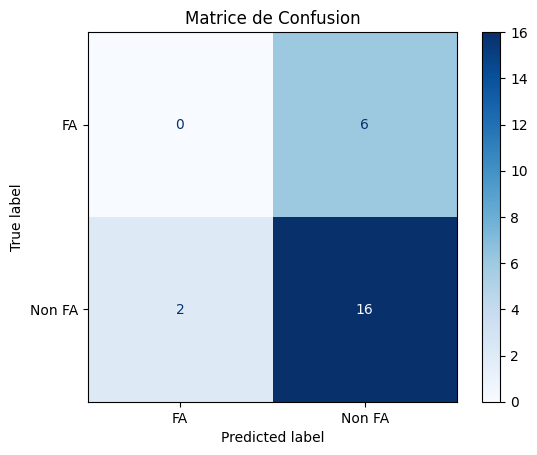

In [105]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_svm)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

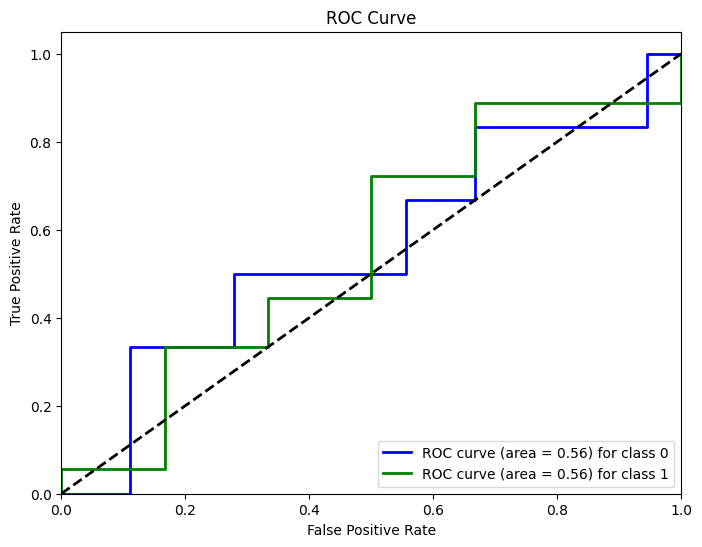

In [109]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_svm[:, 1], multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_svm[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

## ALGORITHME LASSO

In [110]:
lasso_model = LogisticRegression()
scores = cross_val_score(lasso_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.91666667 0.96610169 1.         1.         1.        ]
Mean cross-validation score: 0.9765536723163841


In [112]:
# Définition des hyperparamètres à optimiser
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100, 150, 200],  # Valeurs de régularisation inverse
    'solver': ['liblinear'],  # Solver compatible avec L1
    'penalty': ['l1']  # Pénalisation L1
} 

lasso_model = LogisticRegression()
grid_search = GridSearchCV(estimator=lasso_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params_lasso = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_lasso}")

Meilleurs hyperparamètres : {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [113]:
#best_params_lasso = {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}

# Initialisation du modèle Lasso avec les meilleurs hyperparamètres trouvés
lasso_model = LogisticRegression(**best_params_lasso, random_state=42)

In [114]:
scores = cross_val_score(lasso_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.95       0.96610169 1.         1.         1.        ]
Mean cross-validation score: 0.9832203389830507


In [115]:
# Entraînement du modèle
lasso_model.fit(X_train, y_train)

LogisticRegression(C=100, penalty='l1', random_state=42, solver='liblinear')

In [116]:
# Prédiction sur l'ensemble de test
y_pred_lasso = lasso_model.predict(X_test)
y_pred_proba_lasso = lasso_model.predict_proba(X_test)

In [117]:
# Évaluation du modèle
accuracy_lasso = accuracy_score(y_test, y_pred_lasso)
print(f"Accuracy: {accuracy_lasso:.2f}")
print(classification_report(y_test, y_pred_lasso, zero_division=0))

Accuracy: 0.67
              precision    recall  f1-score   support

           0       0.38      0.50      0.43         6
           1       0.81      0.72      0.76        18

    accuracy                           0.67        24
   macro avg       0.59      0.61      0.60        24
weighted avg       0.70      0.67      0.68        24



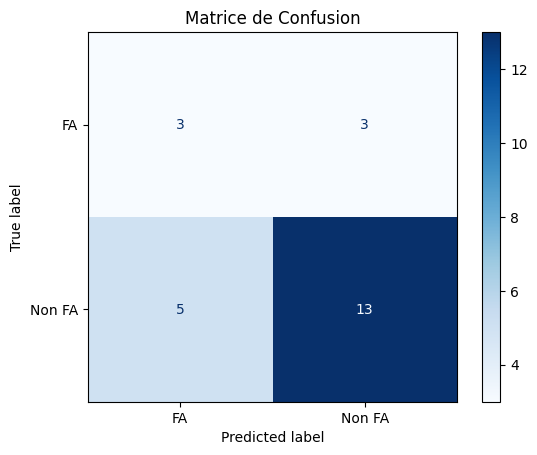

In [118]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_lasso)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

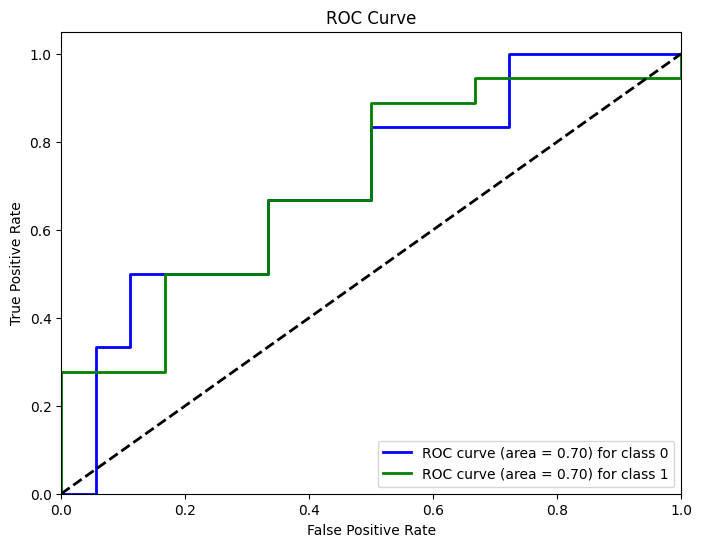

In [119]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_lasso[:, 1], multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_lasso[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

## ALGORITHME XGBOOST

In [132]:
xgb_model = XGBClassifier()
scores = cross_val_score(xgb_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.95       0.98305085 0.96610169 1.         0.94915254]
Mean cross-validation score: 0.9696610169491524


In [121]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': [0.6, 0.8, 1.0],
}

xgb_model = XGBClassifier()
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

best_params_xgb = grid_search.best_params_
print(f"Meilleurs hyperparamètres : {best_params_xgb}")

Meilleurs hyperparamètres : {'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.6}


In [122]:
#best_params_xgb = {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.6}

# Initialisation du modèle Lasso avec les meilleurs hyperparamètres trouvés
xgb_model = XGBClassifier(**best_params_xgb, random_state=42)

In [123]:
scores = cross_val_score(xgb_model, X_train, y_train, cv=5)
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")

Cross-validation scores: [0.95       0.98305085 0.98305085 1.         0.96610169]
Mean cross-validation score: 0.9764406779661018


In [124]:
# Entraînement du modèle
xgb_model.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.3, max_depth=5, random_state=42,
                           subsample=0.6)

In [125]:
# Prédiction sur l'ensemble de test
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)

In [126]:
# Évaluation du modèle
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Accuracy: {accuracy_xgb:.2f}")
print(classification_report(y_test, y_pred_xgb, zero_division=0))

Accuracy: 0.62
              precision    recall  f1-score   support

           0       0.29      0.33      0.31         6
           1       0.76      0.72      0.74        18

    accuracy                           0.62        24
   macro avg       0.53      0.53      0.53        24
weighted avg       0.64      0.62      0.63        24



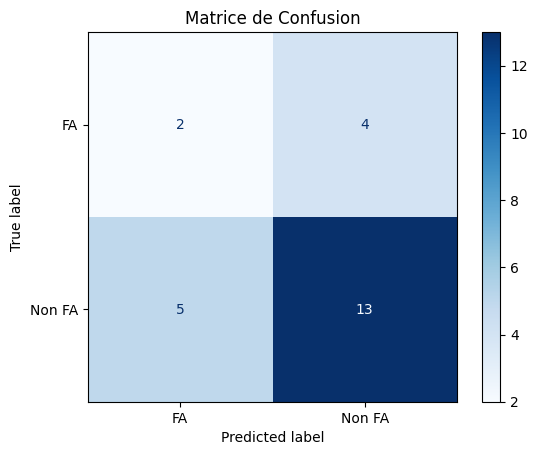

In [127]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test, y_pred_xgb)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion')
plt.show()

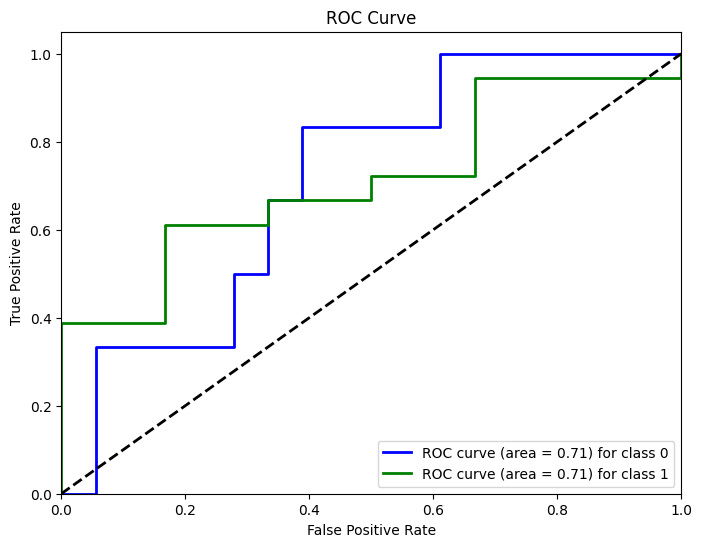

In [128]:
# Calcul du score AUC
roc_auc = roc_auc_score(y_test, y_pred_proba_xgb[:, 1], multi_class='ovr')

# Calcul des courbes ROC pour chaque classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba_xgb[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer toutes les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

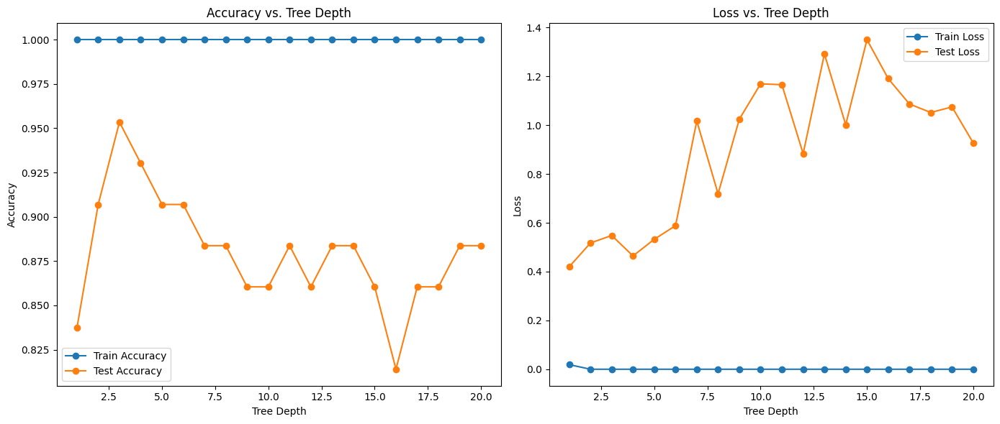

Train Accuracies: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Test Accuracies: [0.8372093023255814, 0.9069767441860465, 0.9534883720930233, 0.9302325581395349, 0.9069767441860465, 0.9069767441860465, 0.8837209302325582, 0.8837209302325582, 0.8604651162790697, 0.8604651162790697, 0.8837209302325582, 0.8604651162790697, 0.8837209302325582, 0.8837209302325582, 0.8604651162790697, 0.813953488372093, 0.8604651162790697, 0.8604651162790697, 0.8837209302325582, 0.8837209302325582]
Train Losses: [0.018962530684275693, 3.1001978830172504e-05, 9.246605953959496e-09, 8.506442521077335e-09, 8.440119030965008e-09, 8.118015279230643e-09, 7.64221058132986e-09, 7.760767605587593e-09, 7.477240394316788e-09, 6.796729655864882e-09, 6.011616814758667e-09, 5.950740185998758e-09, 6.252465225646669e-09, 7.043592594427138e-09, 6.327640454784088e-09, 6.810865456839874e-09, 6.479088066719296e-09, 5.894295019385175e-09, 6.726314387578234e-09, 6.72385650227

In [183]:
# Profondeurs des arbres à tester
max_depths = range(1, 21)

train_accuracies = []
test_accuracies = []
train_losses = []
test_losses = []

# Boucle sur chaque profondeur
for depth in max_depths:
    xgb_model = XGBClassifier(max_depth=depth, random_state=42, n_estimators=300, learning_rate=0.3, subsample=0.6)
    xgb_model.fit(X_train, y_train)
    
    y_train_pred = xgb_model.predict(X_train)
    y_train_pred_proba = xgb_model.predict_proba(X_train)
    
    y_test_pred = xgb_model.predict(X_test)
    y_test_pred_proba = xgb_model.predict_proba(X_test)

    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_loss = log_loss(y_train, y_train_pred_proba)
    test_loss = log_loss(y_test, y_test_pred_proba)
    
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)
    train_losses.append(train_loss)
    test_losses.append(test_loss)

plt.figure(figsize=(14, 6))

# Accuracy vs. Tree Depth
plt.subplot(1, 2, 1)
plt.plot(max_depths, train_accuracies, label='Train Accuracy', marker='o')
plt.plot(max_depths, test_accuracies, label='Test Accuracy', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Tree Depth')
plt.legend()

# Loss vs. Tree Depth
plt.subplot(1, 2, 2)
plt.plot(max_depths, train_losses, label='Train Loss', marker='o')
plt.plot(max_depths, test_losses, label='Test Loss', marker='o')
plt.xlabel('Tree Depth')
plt.ylabel('Loss')
plt.title('Loss vs. Tree Depth')
plt.legend()

plt.tight_layout()
plt.show()

print("Train Accuracies:", train_accuracies)
print("Test Accuracies:", test_accuracies)
print("Train Losses:", train_losses)
print("Test Losses:", test_losses)

# Sur-échantillonnage uniquement sur les données d'entrainement dans la cross-validation

## Avec 2 classes

Best Hyperparameters for SVM: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'poly'}


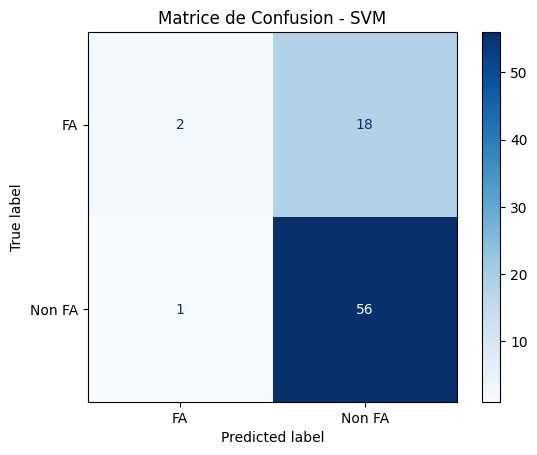

Classification Report for SVM:
Accuracy: 0.75
              precision    recall  f1-score   support

           0       0.67      0.10      0.17        20
           1       0.76      0.98      0.85        57

    accuracy                           0.75        77
   macro avg       0.71      0.54      0.51        77
weighted avg       0.73      0.75      0.68        77



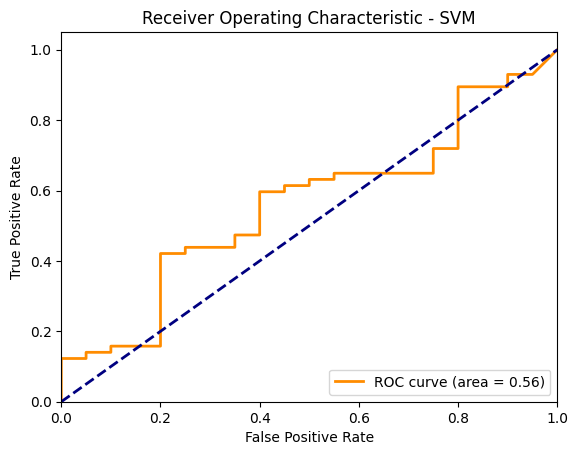

Best Hyperparameters for Lasso: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}


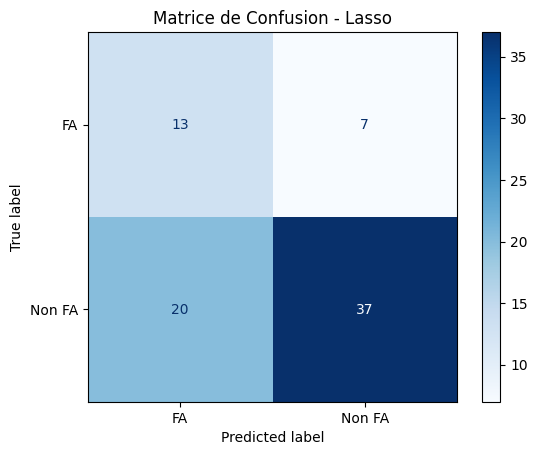

Classification Report for Lasso:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.39      0.65      0.49        20
           1       0.84      0.65      0.73        57

    accuracy                           0.65        77
   macro avg       0.62      0.65      0.61        77
weighted avg       0.72      0.65      0.67        77



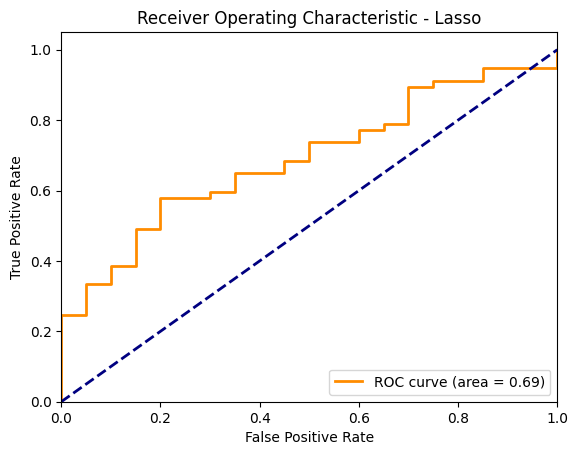

Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 15}


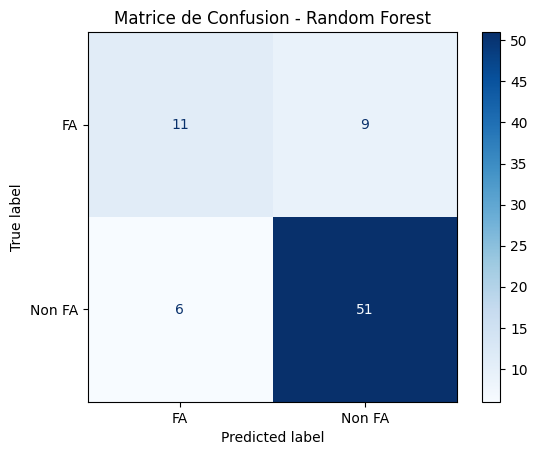

Classification Report for Random Forest:
Accuracy: 0.81
              precision    recall  f1-score   support

           0       0.65      0.55      0.59        20
           1       0.85      0.89      0.87        57

    accuracy                           0.81        77
   macro avg       0.75      0.72      0.73        77
weighted avg       0.80      0.81      0.80        77



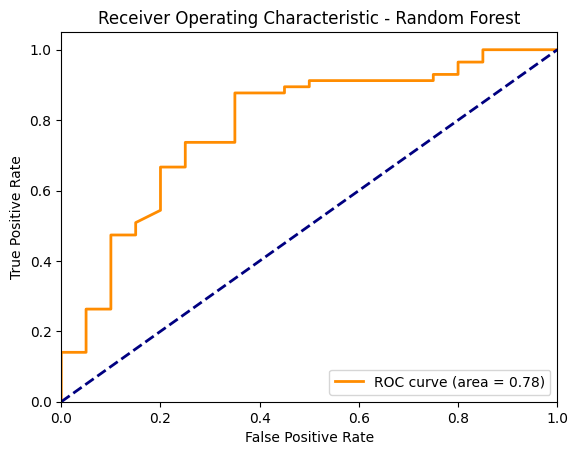

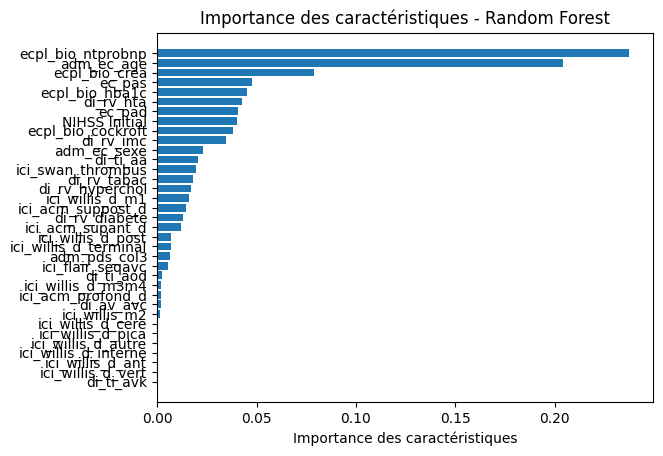

Top 10 Features for Random Forest:
ecpl_bio_ntprobnp: 0.2376
adm_ec_age: 0.2040
ecpl_bio_crea: 0.0789
ec_pas: 0.0475
ecpl_bio_hba1c: 0.0454
di_rv_hta: 0.0429
ec_pad: 0.0407
NIHSS Initial: 0.0401
ecpl_bio_cockroft: 0.0381
di_rv_imc: 0.0347
Best Hyperparameters for XGBoost: {'classifier__learning_rate': 0.005, 'classifier__max_depth': 2, 'classifier__n_estimators': 25, 'classifier__subsample': 0.8}


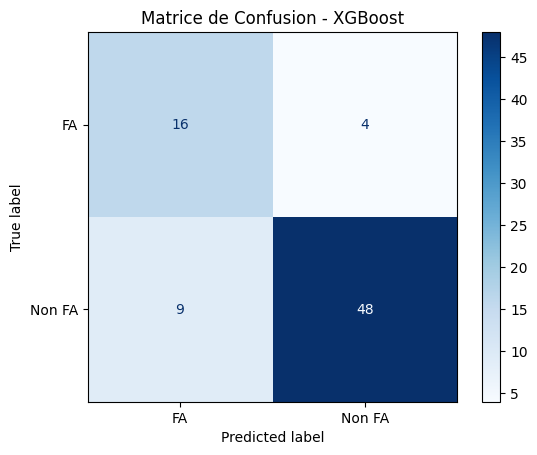

Classification Report for XGBoost:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77



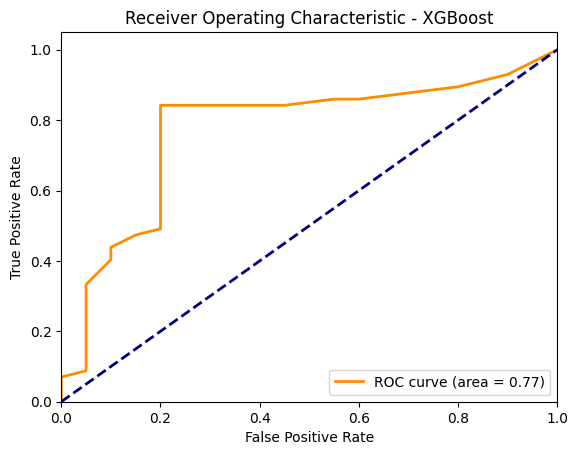

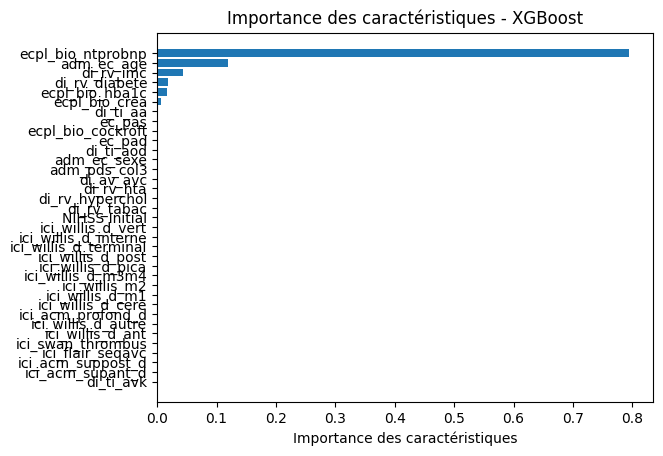

Top 10 Features for XGBoost:
ecpl_bio_ntprobnp: 0.7950
adm_ec_age: 0.1201
di_rv_imc: 0.0429
di_rv_diabete: 0.0179
ecpl_bio_hba1c: 0.0161
ecpl_bio_crea: 0.0057
di_ti_aa: 0.0022
ec_pas: 0.0000
ecpl_bio_cockroft: 0.0000
ec_pad: 0.0000


In [3]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Définition de la validation croisée
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Définition des pipelines pour chaque algorithme

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    'classifier__gamma': [0.02, 0.025, 0.027, 0.03],
    'classifier__kernel': ['linear', 'rbf', 'poly']
}

# Lasso avec GridSearchCV
pipeline_lasso = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', LogisticRegression())
])

param_grid_lasso = {
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09],  # Valeurs de régularisation inverse
    'classifier__solver': ['liblinear'],  # Solver compatible avec L1
    'classifier__penalty': ['l1']  # Pénalisation L1
}

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_svm, param_grid_svm, 'SVM'),
    (pipeline_lasso, param_grid_lasso, 'Lasso'),
    (pipeline_rf, param_grid_rf, 'Random Forest'),
    (pipeline_xgb, param_grid_xgb, 'XGBoost')
]

# Entraînement et évaluation de chaque modèle
for pipeline, param_grid, model_name in pipelines:
    # GridSearch avec validation croisée
    grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_filtered, y_filtered)

    # Meilleurs hyperparamètres
    best_params = grid_search.best_params_
    print(f"Best Hyperparameters for {model_name}: {best_params}")

    # Meilleur modèle trouvé
    best_pipeline = grid_search.best_estimator_

    # Prédictions avec validation croisée
    y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

    # Matrice de confusion
    cm = confusion_matrix(y_filtered, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
    disp.plot(cmap='Blues')
    plt.title(f'Matrice de Confusion - {model_name}')
    plt.show()

    # Rapport de classification
    accuracy = accuracy_score(y_filtered, y_pred)
    class_report = classification_report(y_filtered, y_pred)
    print(f"Classification Report for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(class_report)

    # Courbe ROC
    y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
    fpr, tpr, _ = roc_curve(y_filtered, y_proba[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {model_name}')
    plt.legend(loc="lower right")
    plt.show()

    # Importances des caractéristiques pour Random Forest et XGBoost
    if model_name in ['Random Forest', 'XGBoost']:
        feature_importances = best_pipeline.named_steps['classifier'].feature_importances_
        feature_names = X.columns

        # Trier les caractéristiques par importance décroissante
        sorted_idx = feature_importances.argsort()[::-1]
        sorted_feature_names = feature_names[sorted_idx]
        sorted_importances = feature_importances[sorted_idx]

        # Afficher les importances des caractéristiques
        plt.figure()
        plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
        plt.yticks(range(len(sorted_importances)), sorted_feature_names)
        plt.xlabel('Importance des caractéristiques')
        plt.title(f'Importance des caractéristiques - {model_name}')
        plt.gca().invert_yaxis()
        plt.show()

        # Afficher les 10 caractéristiques les plus importantes
        print(f"Top 10 Features for {model_name}:")
        for i in range(min(10, len(sorted_feature_names))):
            print(f"{sorted_feature_names[i]}: {sorted_importances[i]:.4f}")

## Avec 3 classes

Best Hyperparameters for SVM: {'classifier__C': 1, 'classifier__gamma': 1, 'classifier__kernel': 'rbf'}


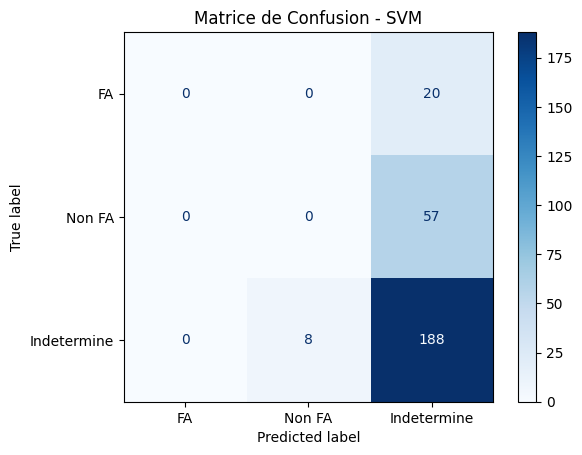

Classification Report for SVM:
Accuracy: 0.69
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.00      0.00      0.00        57
           2       0.71      0.96      0.82       196

    accuracy                           0.69       273
   macro avg       0.24      0.32      0.27       273
weighted avg       0.51      0.69      0.59       273



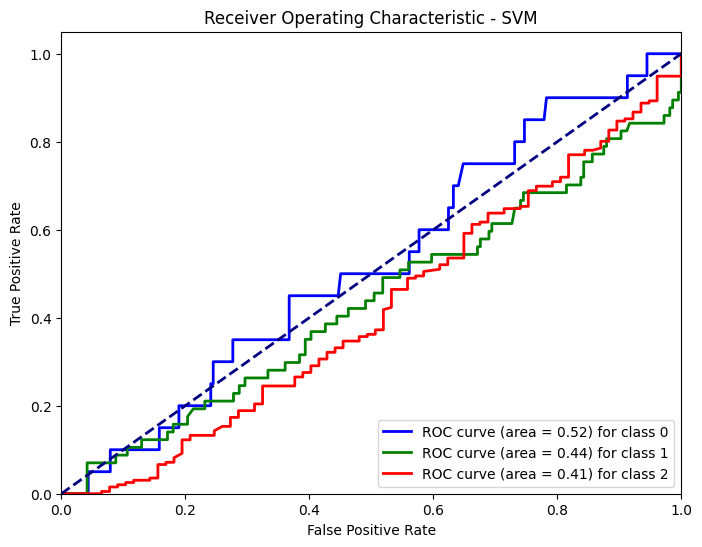

Best Hyperparameters for Lasso: {'classifier__C': 5, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}


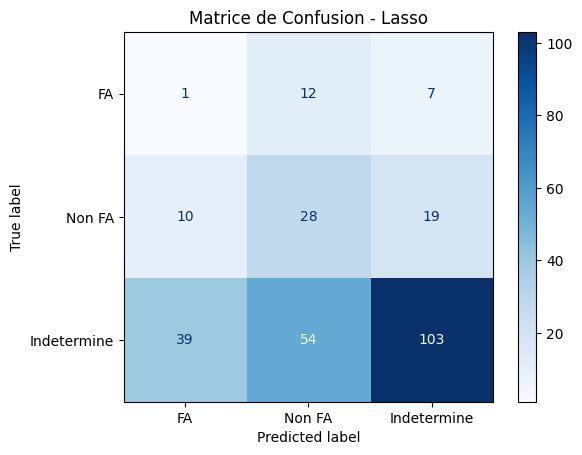

Classification Report for Lasso:
Accuracy: 0.48
              precision    recall  f1-score   support

           0       0.02      0.05      0.03        20
           1       0.30      0.49      0.37        57
           2       0.80      0.53      0.63       196

    accuracy                           0.48       273
   macro avg       0.37      0.36      0.34       273
weighted avg       0.64      0.48      0.53       273



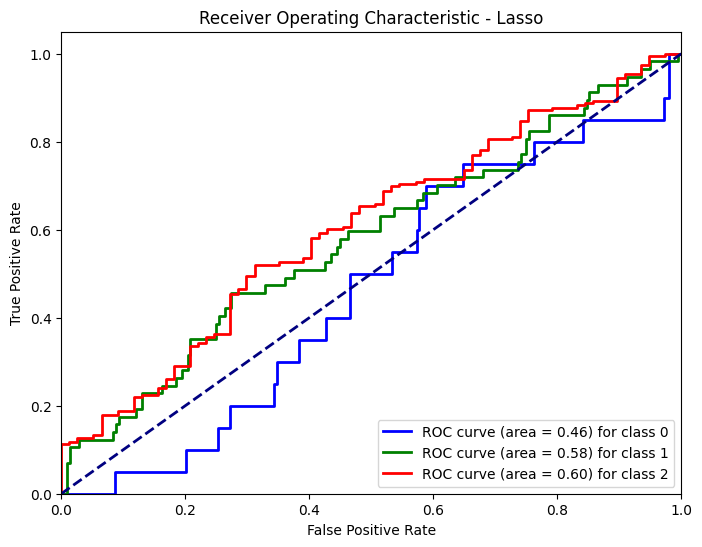

Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 17}


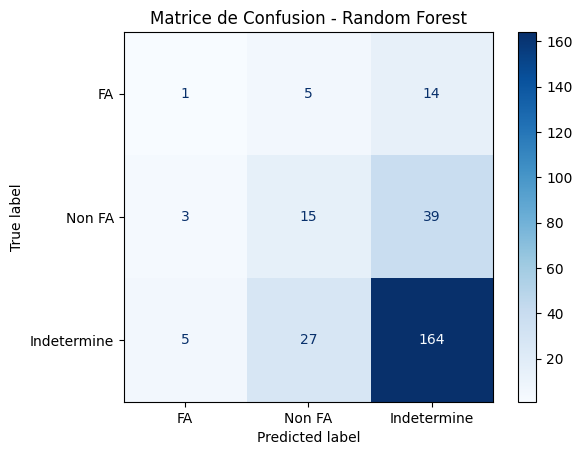

Classification Report for Random Forest:
Accuracy: 0.66
              precision    recall  f1-score   support

           0       0.11      0.05      0.07        20
           1       0.32      0.26      0.29        57
           2       0.76      0.84      0.79       196

    accuracy                           0.66       273
   macro avg       0.40      0.38      0.38       273
weighted avg       0.62      0.66      0.64       273



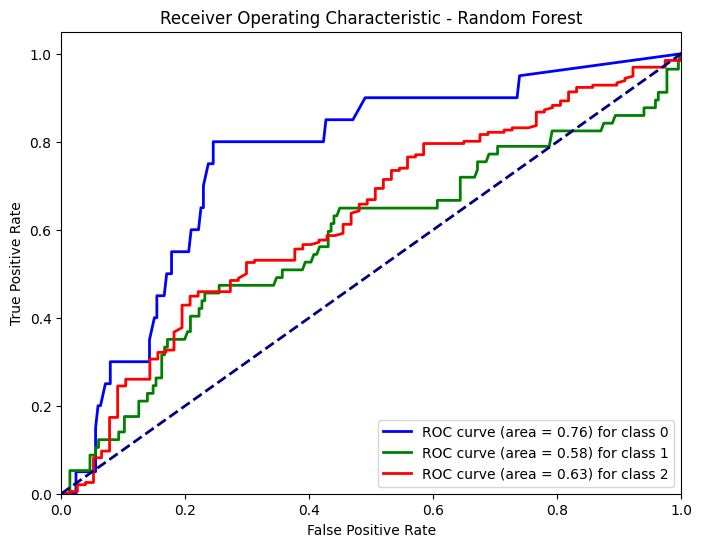

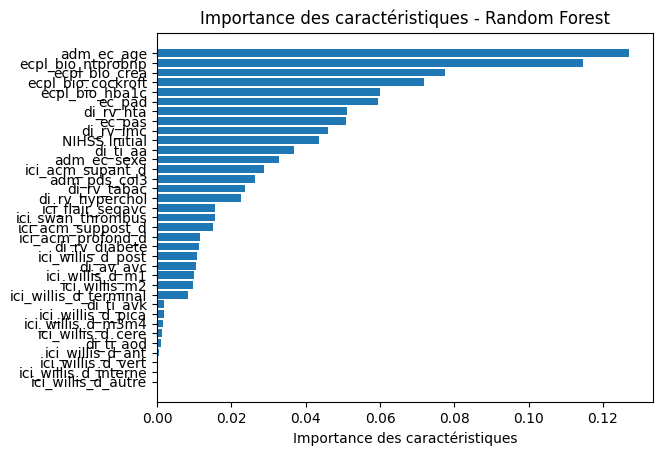

Top 10 Features for Random Forest:
adm_ec_age: 0.1272
ecpl_bio_ntprobnp: 0.1148
ecpl_bio_crea: 0.0776
ecpl_bio_cockroft: 0.0718
ecpl_bio_hba1c: 0.0601
ec_pad: 0.0594
di_rv_hta: 0.0510
ec_pas: 0.0509
di_rv_imc: 0.0459
NIHSS Initial: 0.0435
Best Hyperparameters for XGBoost: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 10, 'classifier__n_estimators': 175, 'classifier__subsample': 0.8}


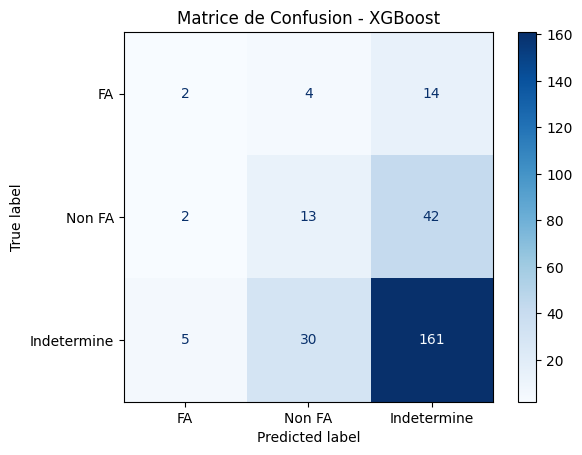

Classification Report for XGBoost:
Accuracy: 0.64
              precision    recall  f1-score   support

           0       0.22      0.10      0.14        20
           1       0.28      0.23      0.25        57
           2       0.74      0.82      0.78       196

    accuracy                           0.64       273
   macro avg       0.41      0.38      0.39       273
weighted avg       0.61      0.64      0.62       273



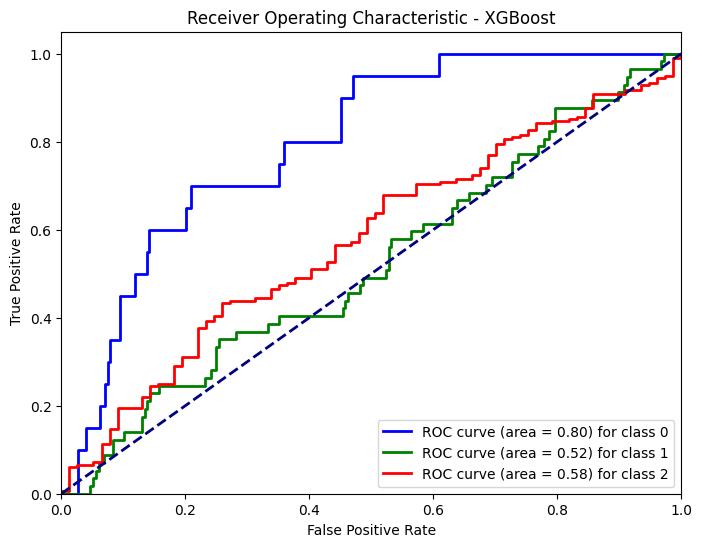

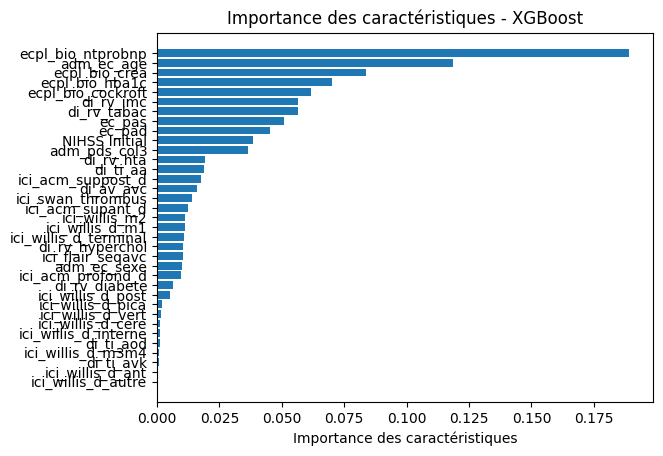

Top 10 Features for XGBoost:
ecpl_bio_ntprobnp: 0.1893
adm_ec_age: 0.1186
ecpl_bio_crea: 0.0838
ecpl_bio_hba1c: 0.0703
ecpl_bio_cockroft: 0.0618
di_rv_imc: 0.0565
di_rv_tabac: 0.0563
ec_pas: 0.0509
ec_pad: 0.0454
NIHSS Initial: 0.0386


In [3]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']

# Définition de la validation croisée
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Définition des pipelines pour chaque algorithme

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y == 0)), 1: int(4 * sum(y == 1))}, random_state=42)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'classifier__C': [0.1, 1, 10, 100],
    'classifier__gamma': [0.03, 0.1, 1, 10],
    'classifier__kernel': ['linear', 'rbf', 'poly']
}

# Lasso avec GridSearchCV
pipeline_lasso = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y == 0)), 1: int(4 * sum(y == 1))}, random_state=42)),
    ('classifier', LogisticRegression())
])

param_grid_lasso = {
    'classifier__C': [1, 5, 10, 15],  # Valeurs de régularisation inverse
    'classifier__solver': ['liblinear'],  # Solver compatible avec L1
    'classifier__penalty': ['l1']  # Pénalisation L1
}

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y == 0)), 1: int(4 * sum(y == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [15, 17, 20],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y == 0)), 1: int(4 * sum(y == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [175, 200, 225],
    'classifier__max_depth': [5, 9, 10],
    'classifier__learning_rate': [0.2, 0.3, 0.4],
    'classifier__subsample': [0.8, 0.85],
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_svm, param_grid_svm, 'SVM'),
    (pipeline_lasso, param_grid_lasso, 'Lasso'),
    (pipeline_rf, param_grid_rf, 'Random Forest'),
    (pipeline_xgb, param_grid_xgb, 'XGBoost')
]

# Entraînement et évaluation de chaque modèle
for pipeline, param_grid, model_name in pipelines:
    # GridSearch avec validation croisée
    grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X, y)

    # Meilleurs hyperparamètres
    best_params = grid_search.best_params_
    print(f"Best Hyperparameters for {model_name}: {best_params}")

    # Meilleur modèle trouvé
    best_pipeline = grid_search.best_estimator_

    # Prédictions avec validation croisée
    y_pred = cross_val_predict(best_pipeline, X, y, cv=kfold)

    # Matrice de confusion
    cm = confusion_matrix(y, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA', 'Indetermine'])
    disp.plot(cmap='Blues')
    plt.title(f'Matrice de Confusion - {model_name}')
    plt.show()

    # Rapport de classification
    accuracy = accuracy_score(y, y_pred)
    class_report = classification_report(y, y_pred, zero_division=0)
    print(f"Classification Report for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(class_report)

    # Courbe ROC
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    y_proba = cross_val_predict(best_pipeline, X, y, cv=kfold, method='predict_proba')
    for i in range(3):
        fpr[i], tpr[i], _ = roc_curve(y, y_proba[:, i], pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Tracer toutes les courbes ROC
    plt.figure(figsize=(8, 6))
    colors = ['blue', 'green', 'red']
    for i, color in zip(range(3), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {model_name}')
    plt.legend(loc="lower right")
    plt.show()

    # Importances des caractéristiques pour Random Forest et XGBoost
    if model_name in ['Random Forest', 'XGBoost']:
        feature_importances = best_pipeline.named_steps['classifier'].feature_importances_
        feature_names = X.columns

        # Trier les caractéristiques par importance décroissante
        sorted_idx = feature_importances.argsort()[::-1]
        sorted_feature_names = feature_names[sorted_idx]
        sorted_importances = feature_importances[sorted_idx]

        # Afficher les importances des caractéristiques
        plt.figure()
        plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
        plt.yticks(range(len(sorted_importances)), sorted_feature_names)
        plt.xlabel('Importance des caractéristiques')
        plt.title(f'Importance des caractéristiques - {model_name}')
        plt.gca().invert_yaxis()
        plt.show()

        # Afficher les 10 caractéristiques les plus importantes
        print(f"Top 10 Features for {model_name}:")
        for i in range(min(10, len(sorted_feature_names))):
            print(f"{sorted_feature_names[i]}: {sorted_importances[i]:.4f}")

## Algorithme semi-supervisé

Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 13}


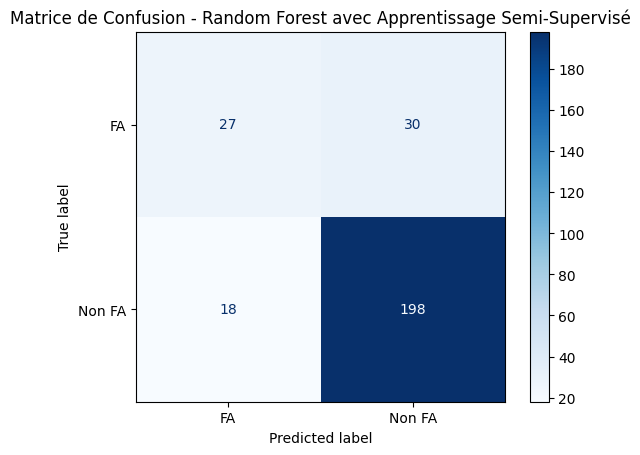

Accuracy: 0.82

Rapport de classification :
               precision    recall  f1-score   support

           0       0.60      0.47      0.53        57
           1       0.87      0.92      0.89       216

    accuracy                           0.82       273
   macro avg       0.73      0.70      0.71       273
weighted avg       0.81      0.82      0.82       273



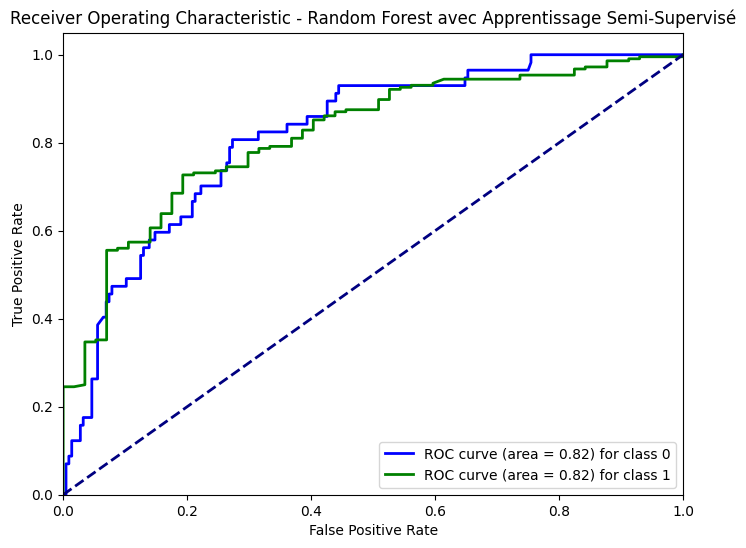

In [14]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']

# Marquer les étiquettes indéterminées comme -1 pour LabelSpreading
y_ssl = np.copy(y)
y_ssl[y_ssl == 2] = -1

# Apprentissage semi-supervisé itératif
max_iter = 10  # Nombre maximal d'itérations
tolerance = 0.01  # Tolérance pour la convergence

for iteration in range(max_iter):
    # Appliquer LabelSpreading
    label_spread = LabelSpreading(kernel='knn', n_neighbors=5, alpha=0.2, max_iter=30)
    label_spread.fit(X, y_ssl)
    
    # Prédire les étiquettes
    y_new = label_spread.transduction_
    
    # Vérifier la convergence
    if np.sum(y_new != y_ssl) / len(y_ssl) < tolerance:
        break
    
    # Mettre à jour les étiquettes
    y_ssl = y_new

# Remplacer les -1 par les nouvelles étiquettes prédites par LabelSpreading
y_labeled = y_ssl

# Entraînement du modèle final sur les étiquettes semi-supervisées
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_labeled == 0)), 1: int(4 * sum(y_labeled == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Définition de la validation croisée
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Hyperparamètres pour GridSearch
param_grid_rf = {
    'classifier__n_estimators': [10, 12, 13, 14],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10, 12, 15],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# GridSearch avec validation croisée
grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X, y_labeled)

# Meilleurs hyperparamètres
best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Prédictions avec validation croisée
y_pred = cross_val_predict(best_pipeline, X, y_labeled, cv=kfold)

# Matrice de confusion
cm = confusion_matrix(y_labeled, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title('Matrice de Confusion - Random Forest avec Apprentissage Semi-Supervisé')
plt.show()

# Rapport de classification
accuracy = accuracy_score(y_labeled, y_pred)
class_report = classification_report(y_labeled, y_pred, zero_division=0)
print(f"Accuracy: {accuracy:.2f}")
print("\nRapport de classification :\n", class_report)

# Courbe ROC
y_proba = cross_val_predict(best_pipeline, X, y_labeled, cv=kfold, method='predict_proba')

fpr = dict()
tpr = dict()
roc_auc = dict()

# Calcul des courbes ROC pour chaque classe
for i in range(2):  # Seulement pour classes 0 et 1
    fpr[i], tpr[i], _ = roc_curve(y_labeled, y_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tracer les courbes ROC
plt.figure(figsize=(8, 6))
colors = ['blue', 'green']
for i, color in zip(range(2), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic - Random Forest avec Apprentissage Semi-Supervisé')
plt.legend(loc="lower right")
plt.show()

# Features selection

## Tests non concluants sur la feature selection

Indices des caractéristiques à variance nulle: [23 24 30]
Noms des caractéristiques à variance nulle: Index(['ici_willis_d_ant', 'ici_willis_d_autre', 'ici_willis_d_pica'], dtype='object')
Best Hyperparameters for SVM with k=2: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


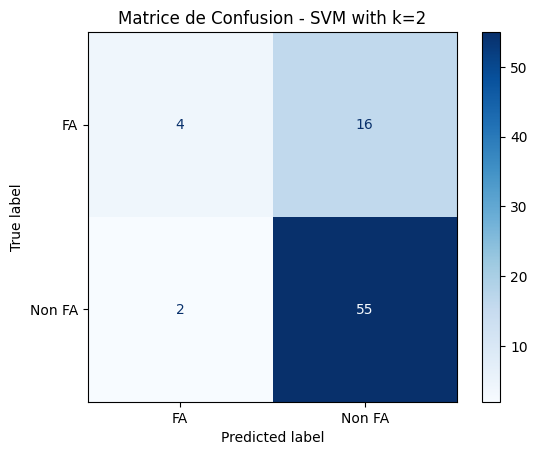

Classification Report for SVM with k=2:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=2: ['ecpl_bio_ntprobnp', 'adm_ec_age']


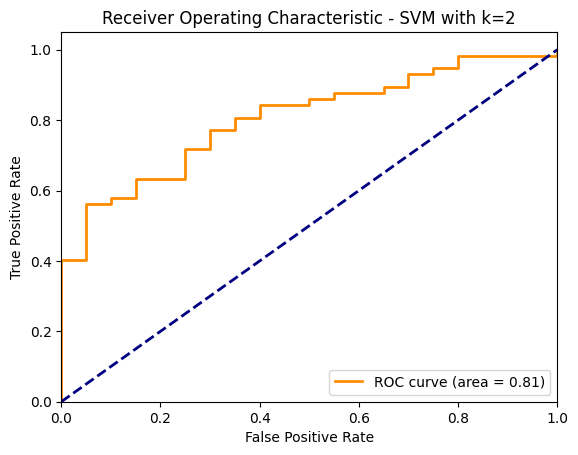

Best Hyperparameters for SVM with k=10: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


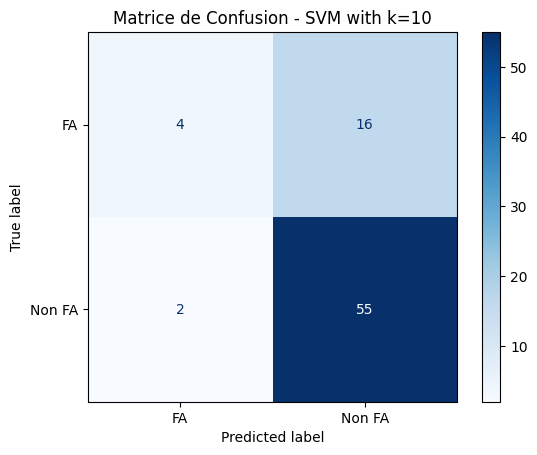

Classification Report for SVM with k=10:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=10: ['ecpl_bio_ntprobnp', 'adm_ec_age']


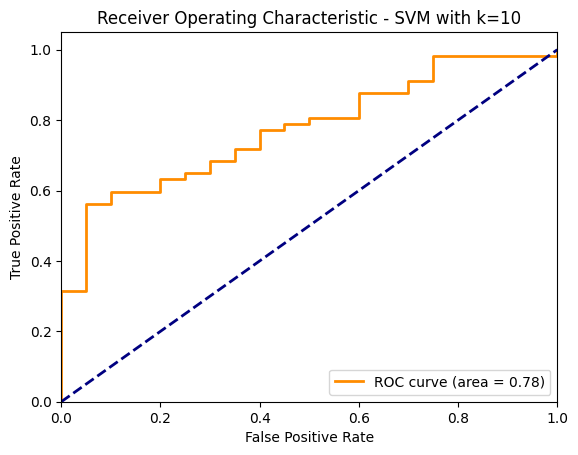

Best Hyperparameters for SVM with k=20: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


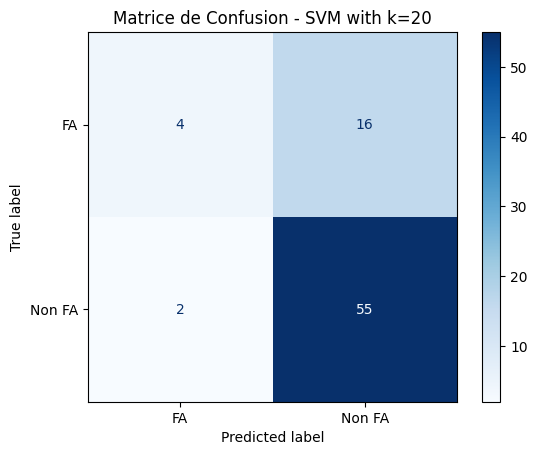

Classification Report for SVM with k=20:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=20: ['ecpl_bio_ntprobnp', 'adm_ec_age']


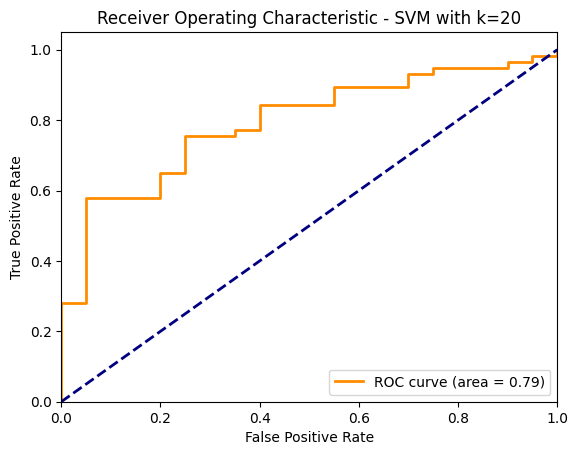

Best Hyperparameters for SVM with k=25: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


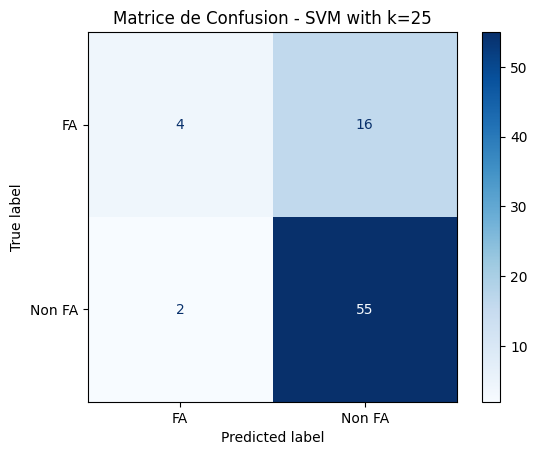

Classification Report for SVM with k=25:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=25: ['ecpl_bio_ntprobnp', 'adm_ec_age']


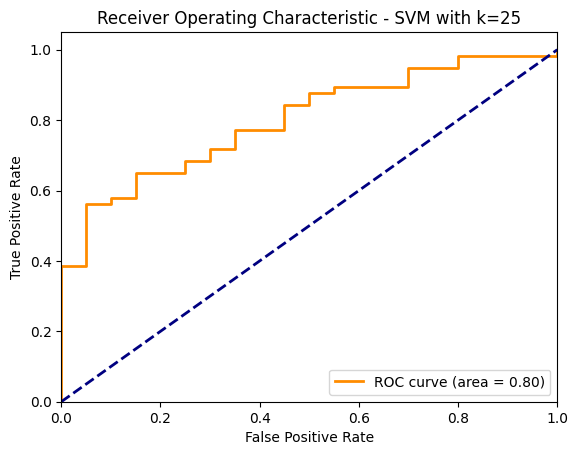

Best Hyperparameters for SVM with k=30: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


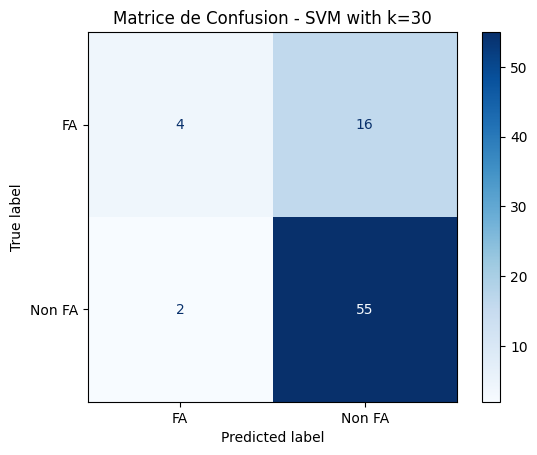

Classification Report for SVM with k=30:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=30: ['ecpl_bio_ntprobnp', 'adm_ec_age']


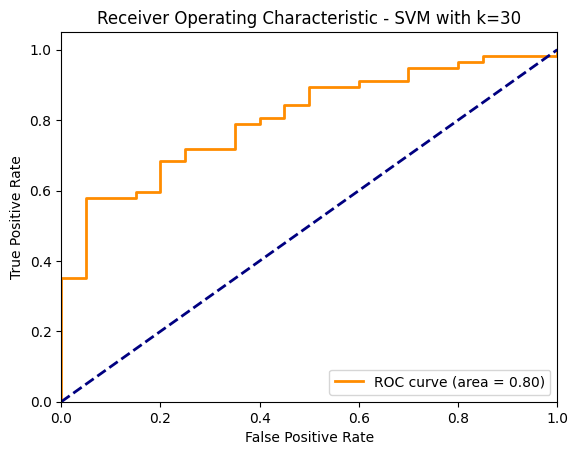

Best Hyperparameters for Lasso with k=2: {'classifier__C': 0.09, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


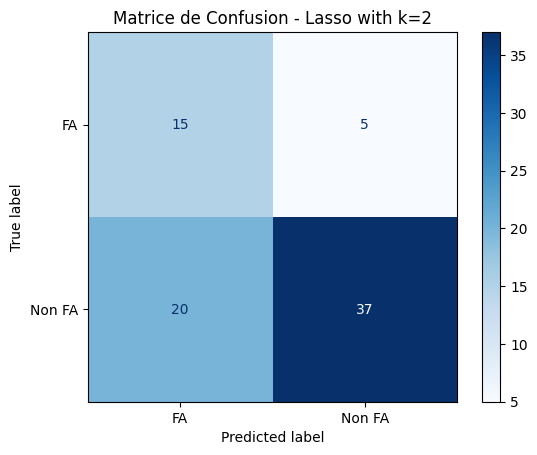

Classification Report for Lasso with k=2:
Accuracy: 0.68
              precision    recall  f1-score   support

           0       0.43      0.75      0.55        20
           1       0.88      0.65      0.75        57

    accuracy                           0.68        77
   macro avg       0.65      0.70      0.65        77
weighted avg       0.76      0.68      0.70        77

Selected Features for Lasso with k=2: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_ti_avk', 'ici_willis_d_post']


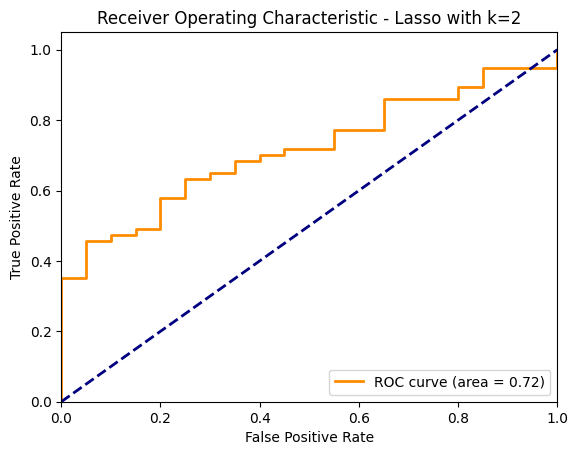

Best Hyperparameters for Lasso with k=10: {'classifier__C': 0.07, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


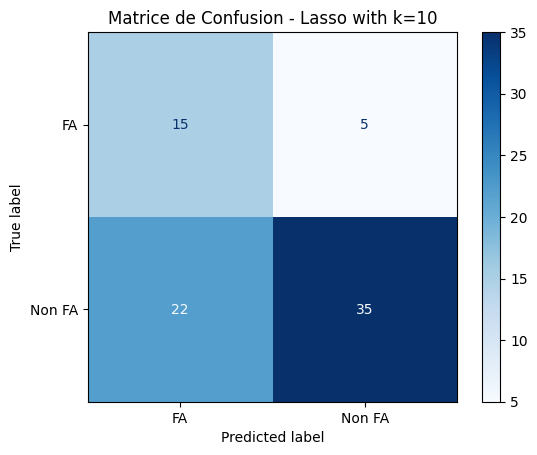

Classification Report for Lasso with k=10:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=10: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'ici_willis_d_cere', 'ici_willis_d_interne']


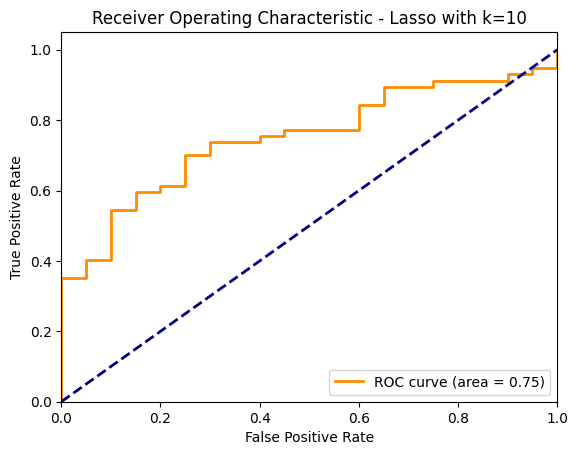

Best Hyperparameters for Lasso with k=20: {'classifier__C': 0.09, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


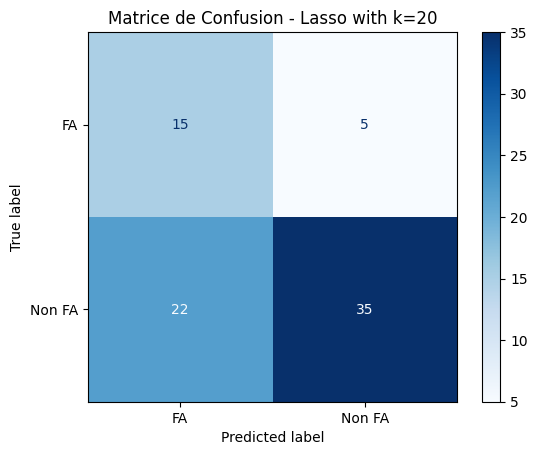

Classification Report for Lasso with k=20:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=20: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_rv_diabete', 'di_ti_aa']


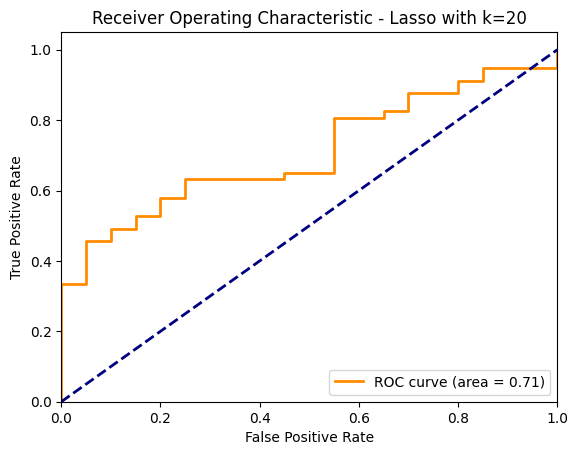

Best Hyperparameters for Lasso with k=25: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


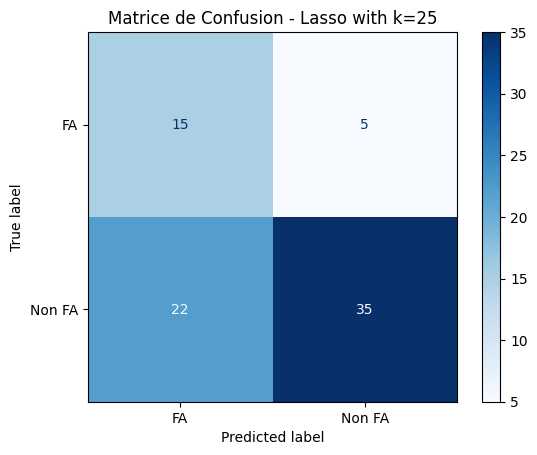

Classification Report for Lasso with k=25:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=25: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'ici_acm_supant_d', 'ici_willis_d_autre']


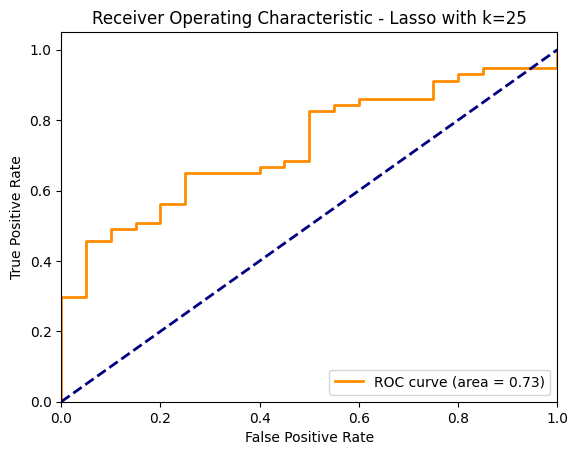

Best Hyperparameters for Lasso with k=30: {'classifier__C': 0.09, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


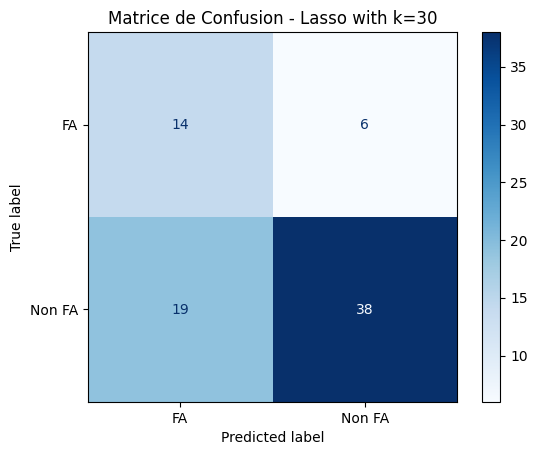

Classification Report for Lasso with k=30:
Accuracy: 0.68
              precision    recall  f1-score   support

           0       0.42      0.70      0.53        20
           1       0.86      0.67      0.75        57

    accuracy                           0.68        77
   macro avg       0.64      0.68      0.64        77
weighted avg       0.75      0.68      0.69        77

Selected Features for Lasso with k=30: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_rv_diabete', 'ici_willis_d_cere']


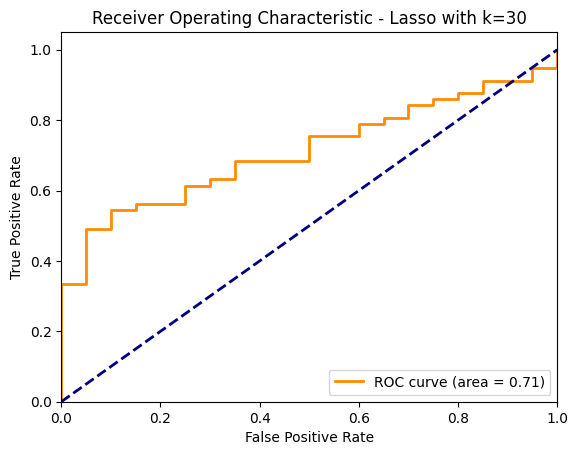

Best Hyperparameters for Random Forest with k=2: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 15, 'selector__k': 20}


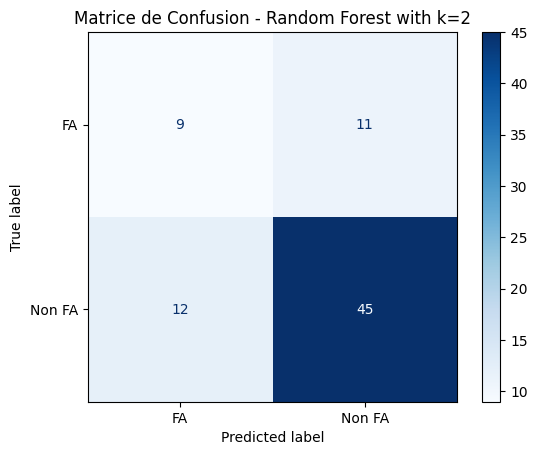

Classification Report for Random Forest with k=2:
Accuracy: 0.70
              precision    recall  f1-score   support

           0       0.43      0.45      0.44        20
           1       0.80      0.79      0.80        57

    accuracy                           0.70        77
   macro avg       0.62      0.62      0.62        77
weighted avg       0.71      0.70      0.70        77

Selected Features for Random Forest with k=2: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_ti_aa', 'ici_acm_profond_d', 'ici_flair_seqavc', 'ici_swan_thrombus', 'ici_willis_d_autre', 'ici_willis_d_cere', 'ici_willis_d_m3m4', 'ici_willis_d_post']


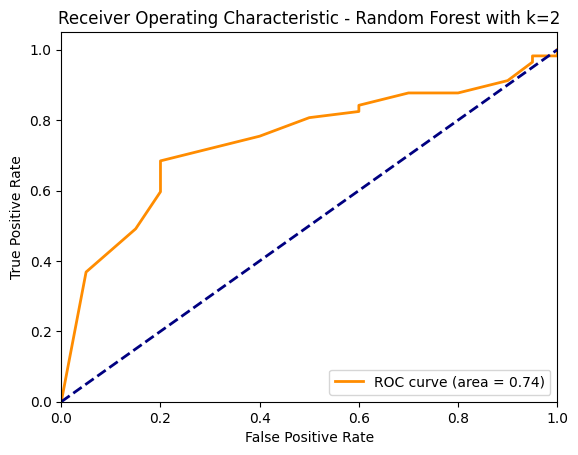

Best Hyperparameters for Random Forest with k=10: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 13, 'selector__k': 20}


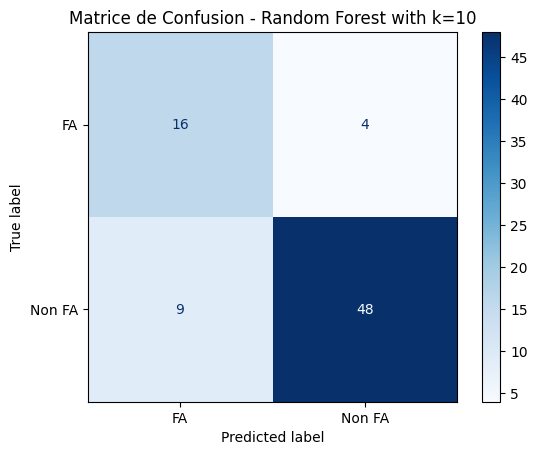

Classification Report for Random Forest with k=10:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=10: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_ti_aa', 'di_ti_avk', 'ici_acm_profond_d', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_m2', 'ici_willis_d_m3m4', 'ici_willis_d_post']


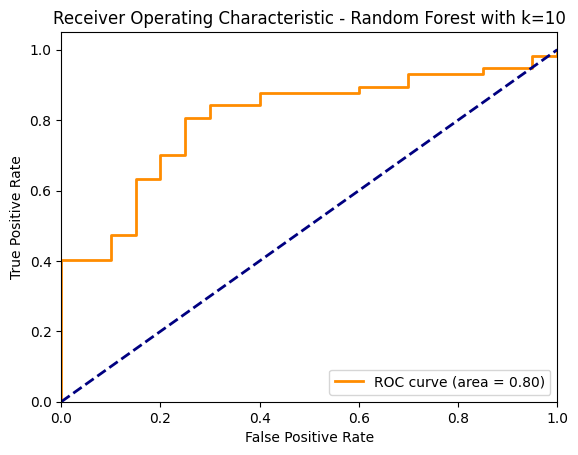

Best Hyperparameters for Random Forest with k=20: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 10, 'selector__k': 20}


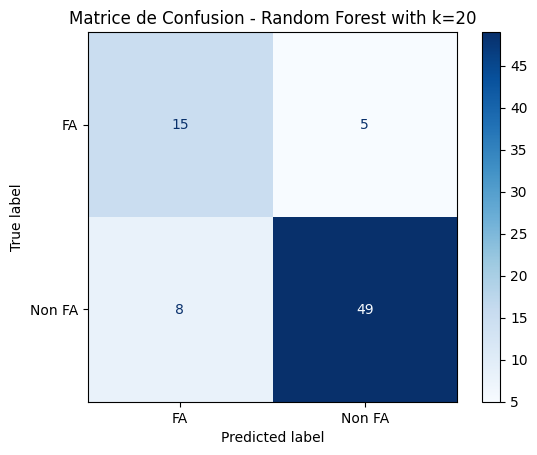

Classification Report for Random Forest with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.65      0.75      0.70        20
           1       0.91      0.86      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.80      0.79        77
weighted avg       0.84      0.83      0.83        77

Selected Features for Random Forest with k=20: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_rv_tabac', 'ici_willis_d_ant', 'ici_willis_d_autre', 'ici_willis_d_interne', 'ici_willis_m2', 'ici_willis_d_m3m4', 'ici_willis_d_post']


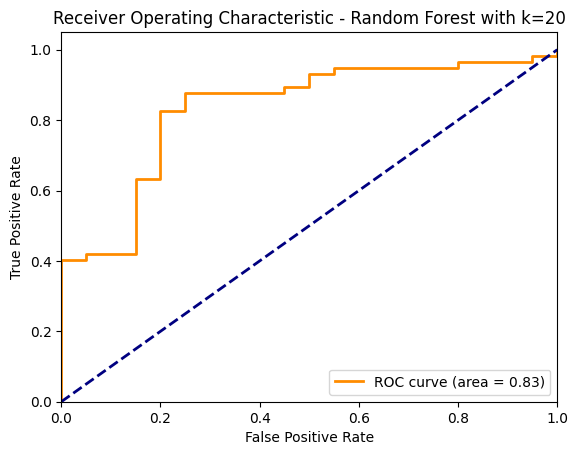

Best Hyperparameters for Random Forest with k=25: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13, 'selector__k': 2}


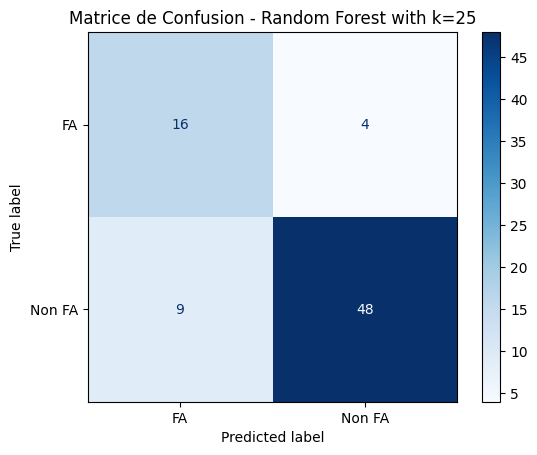

Classification Report for Random Forest with k=25:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=25: ['ecpl_bio_ntprobnp', 'adm_ec_age']


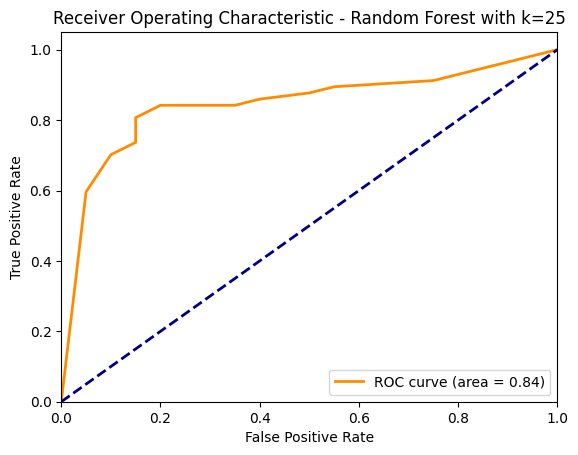

Best Hyperparameters for Random Forest with k=30: {'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 10, 'selector__k': 20}


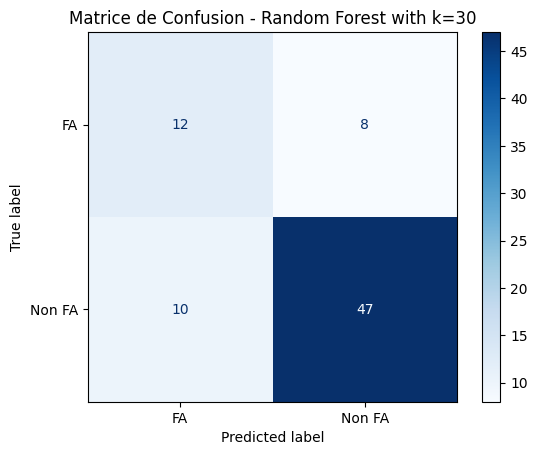

Classification Report for Random Forest with k=30:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.55      0.60      0.57        20
           1       0.85      0.82      0.84        57

    accuracy                           0.77        77
   macro avg       0.70      0.71      0.71        77
weighted avg       0.77      0.77      0.77        77

Selected Features for Random Forest with k=30: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hyperchol', 'di_ti_aa', 'di_ti_aod', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_flair_seqavc', 'ici_willis_d_ant', 'ici_willis_d_interne', 'ici_willis_d_m3m4', 'ici_willis_d_post']


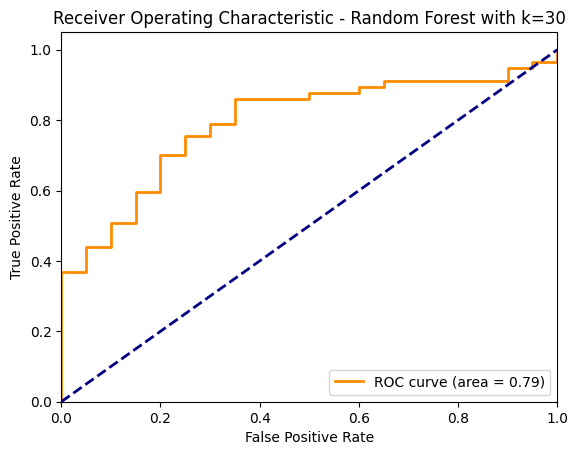

Best Hyperparameters for XGBoost with k=2: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


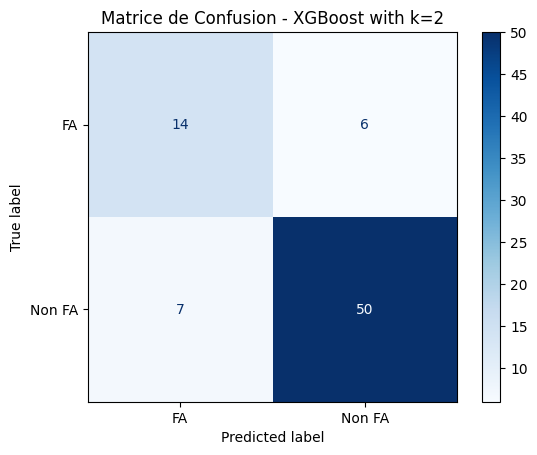

Classification Report for XGBoost with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=2: ['ecpl_bio_ntprobnp', 'adm_ec_age']


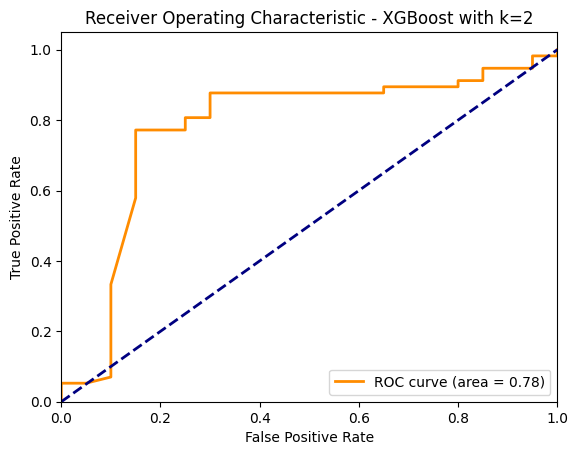

Best Hyperparameters for XGBoost with k=10: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


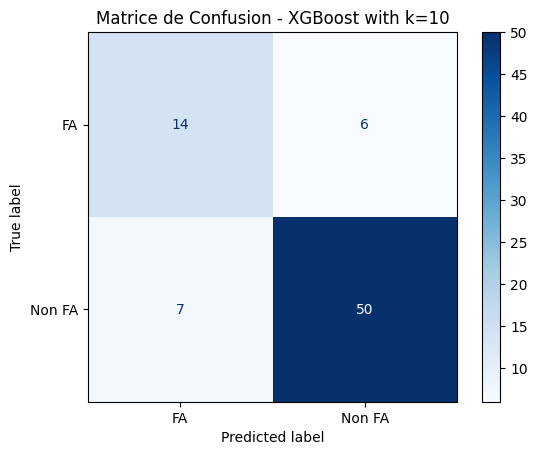

Classification Report for XGBoost with k=10:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=10: ['ecpl_bio_ntprobnp', 'adm_ec_age']


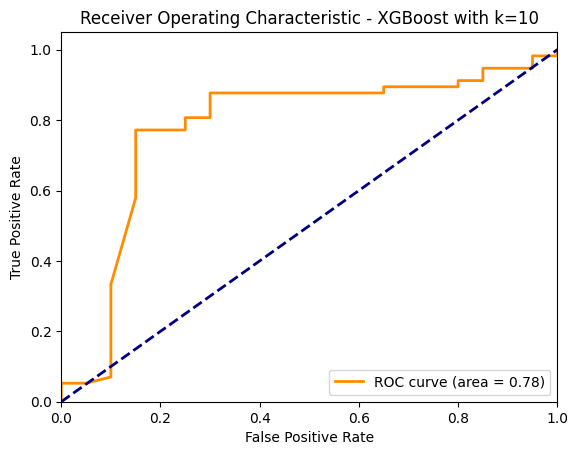

Best Hyperparameters for XGBoost with k=20: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


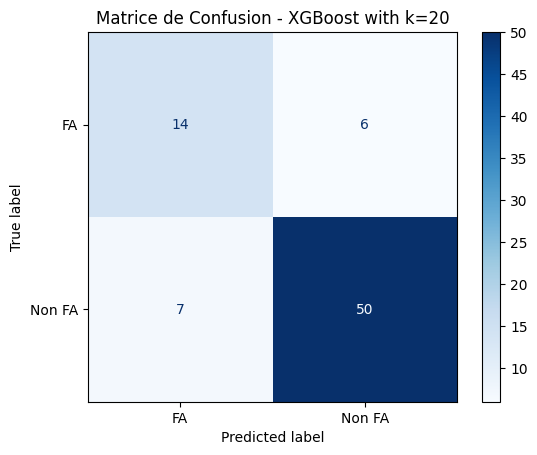

Classification Report for XGBoost with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=20: ['ecpl_bio_ntprobnp', 'adm_ec_age']


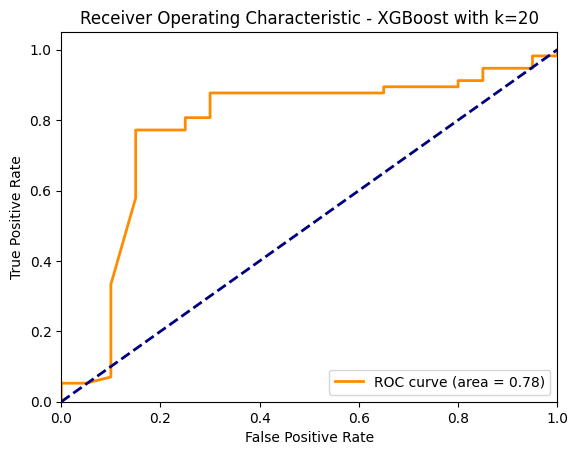

Best Hyperparameters for XGBoost with k=25: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


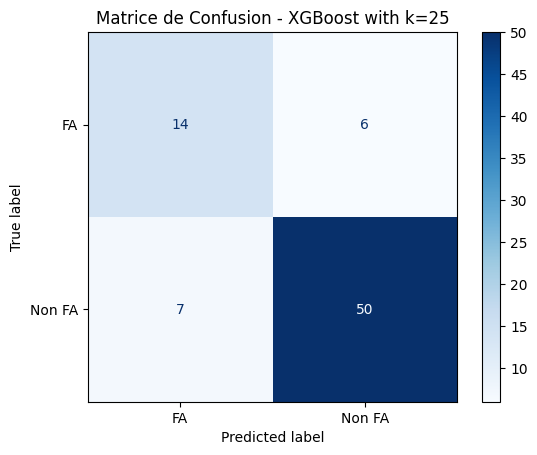

Classification Report for XGBoost with k=25:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=25: ['ecpl_bio_ntprobnp', 'adm_ec_age']


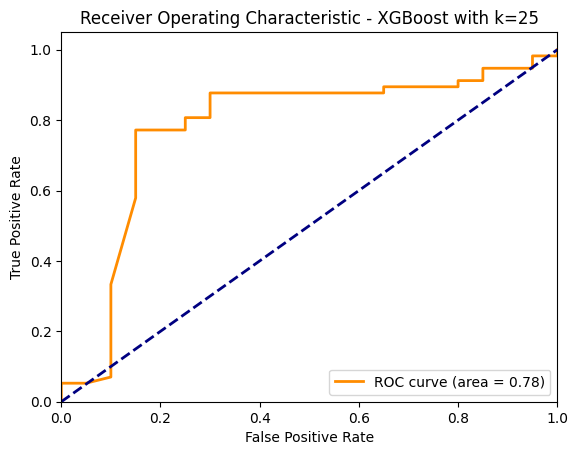

Best Hyperparameters for XGBoost with k=30: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


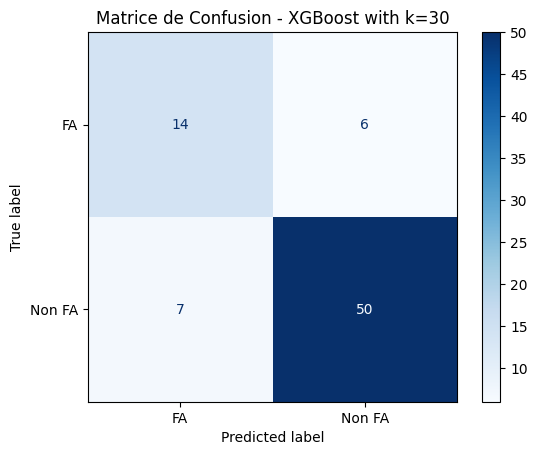

Classification Report for XGBoost with k=30:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=30: ['ecpl_bio_ntprobnp', 'adm_ec_age']


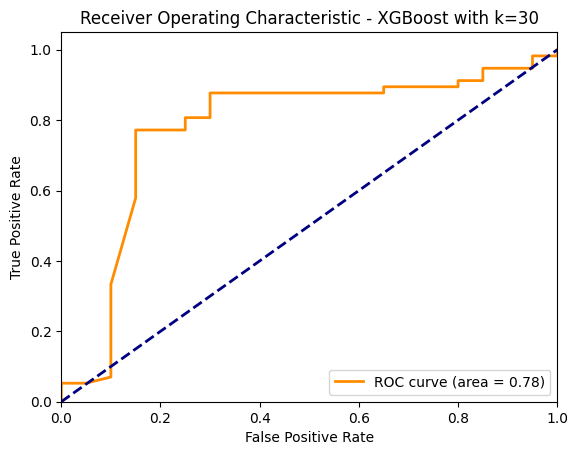

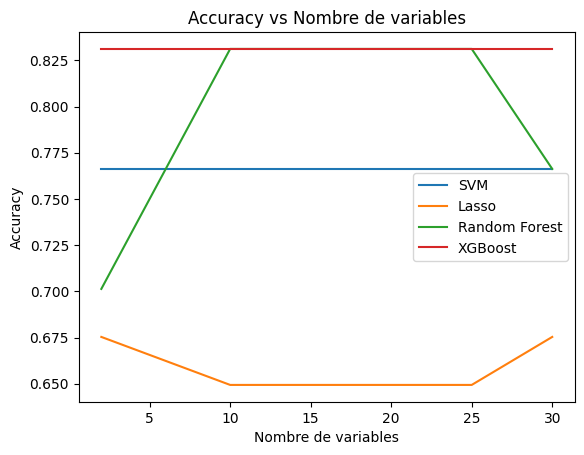

In [7]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Filtrer les caractéristiques constantes
selector_variance = VarianceThreshold()
selector_variance.fit(X_filtered)

# Obtenir les indices des caractéristiques à variance nulle
constant_features_idx = np.where(selector_variance.variances_ == 0)[0]

# Afficher les indices et noms des caractéristiques à variance nulle
constant_feature_names = X_filtered.columns[constant_features_idx]
print("Indices des caractéristiques à variance nulle:", constant_features_idx)
print("Noms des caractéristiques à variance nulle:", constant_feature_names)

# Transformer les données pour éliminer les caractéristiques à variance nulle
X_filtered = selector_variance.transform(X_filtered)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Paramètres pour la sélection de caractéristiques
k_features = [2, 10, 20, 25, 30]

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'selector__k': k_features,
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    'classifier__gamma': [0.02, 0.025, 0.027, 0.03],
    'classifier__kernel': ['linear', 'rbf', 'poly']
}

# Lasso avec GridSearchCV
pipeline_lasso = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', LogisticRegression())
])

param_grid_lasso = {
    'selector__k': k_features,
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09],
    'classifier__solver': ['liblinear'],
    'classifier__penalty': ['l1']
}

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'selector__k': k_features,
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'selector__k': k_features,
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_svm, param_grid_svm, 'SVM'),
    (pipeline_lasso, param_grid_lasso, 'Lasso'),
    (pipeline_rf, param_grid_rf, 'Random Forest'),
    (pipeline_xgb, param_grid_xgb, 'XGBoost')
]

# Entraînement et évaluation de chaque modèle
results = {}
for pipeline, param_grid, model_name in pipelines:
    for k in k_features:
        # Mettre à jour le paramètre de sélection de caractéristiques
        pipeline.set_params(selector__k=k)

        grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_filtered, y_filtered)

        best_params = grid_search.best_params_
        print(f"Best Hyperparameters for {model_name} with k={k}: {best_params}")

        # Meilleur modèle trouvé
        best_pipeline = grid_search.best_estimator_

        y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

        # Matrice de confusion
        cm = confusion_matrix(y_filtered, y_pred)

        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
        disp.plot(cmap='Blues')
        plt.title(f'Matrice de Confusion - {model_name} with k={k}')
        plt.show()

        # Rapport de classification
        accuracy = accuracy_score(y_filtered, y_pred)
        class_report = classification_report(y_filtered, y_pred, zero_division=0)
        print(f"Classification Report for {model_name} with k={k}:")
        print(f"Accuracy: {accuracy:.2f}")
        print(class_report)

        # Sauvegarder les résultats pour le traçage de l'accuracy en fonction du nombre de variables
        if model_name not in results:
            results[model_name] = {'k_features': [], 'accuracies': [], 'important_features': []}
        results[model_name]['k_features'].append(k)
        results[model_name]['accuracies'].append(accuracy)

        # Obtenir les noms des caractéristiques sélectionnées
        selected_features_indices = best_pipeline.named_steps['selector'].get_support(indices=True)
        selected_features = X.columns[selected_features_indices].tolist()
        results[model_name]['important_features'].append(selected_features)
        
        # Afficher les caractéristiques importantes pour chaque valeur de k
        print(f"Selected Features for {model_name} with k={k}: {selected_features}")
        
        # Courbe ROC
        y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
        fpr, tpr, _ = roc_curve(y_filtered, y_proba[:, 1])
        roc_auc = auc(fpr, tpr)

        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic - {model_name} with k={k}')
        plt.legend(loc="lower right")
        plt.show()

# Tracer l'accuracy en fonction du nombre de variables pour chaque modèle
for model_name in results:
    plt.plot(results[model_name]['k_features'], results[model_name]['accuracies'], label=model_name)

plt.xlabel('Nombre de variables')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Nombre de variables')
plt.legend()
plt.show()

Best Hyperparameters for SVM with k=2: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


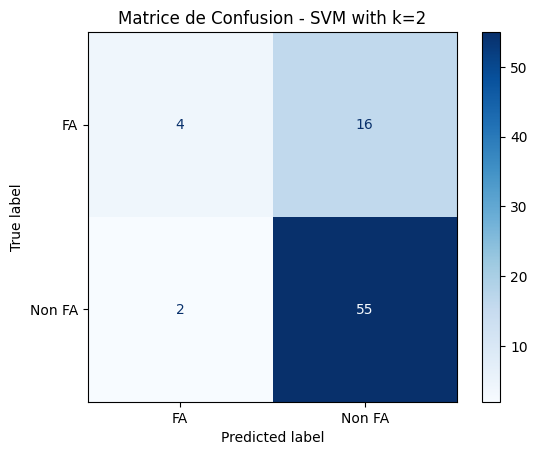

Classification Report for SVM with k=2:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=2: ['ecpl_bio_ntprobnp', 'adm_ec_age']


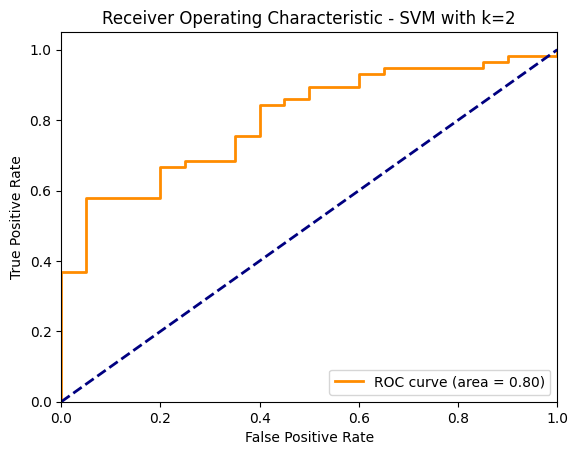

Best Hyperparameters for SVM with k=10: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


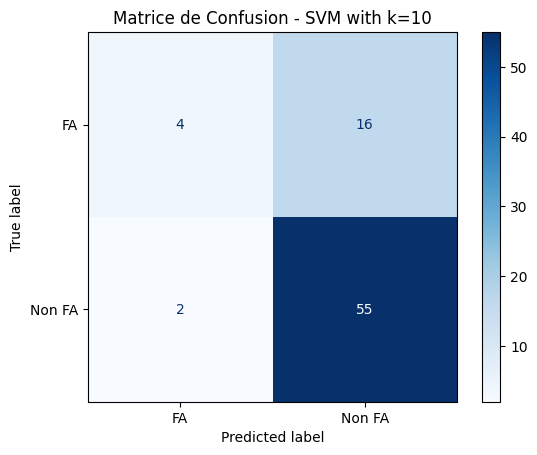

Classification Report for SVM with k=10:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=10: ['ecpl_bio_ntprobnp', 'adm_ec_age']


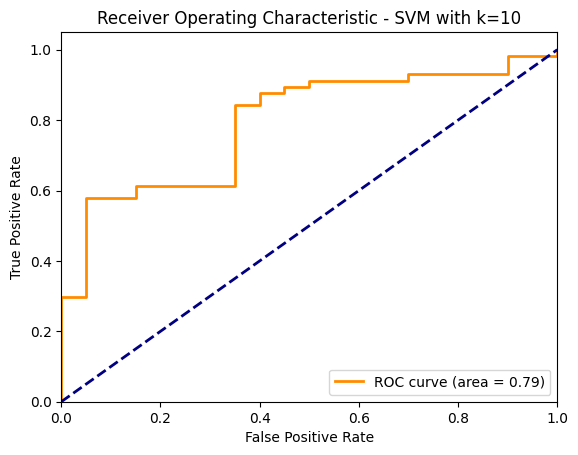

Best Hyperparameters for SVM with k=20: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


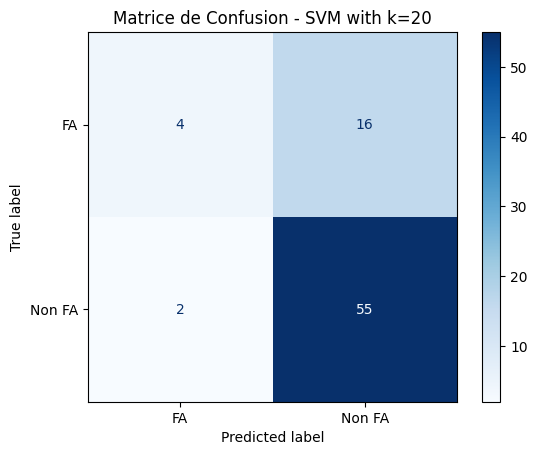

Classification Report for SVM with k=20:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=20: ['ecpl_bio_ntprobnp', 'adm_ec_age']


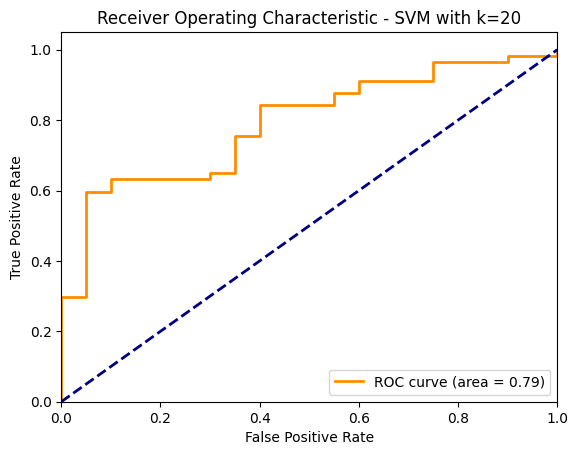

Best Hyperparameters for SVM with k=25: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


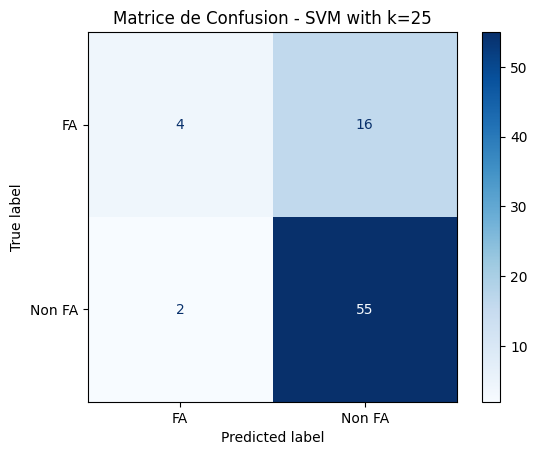

Classification Report for SVM with k=25:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=25: ['ecpl_bio_ntprobnp', 'adm_ec_age']


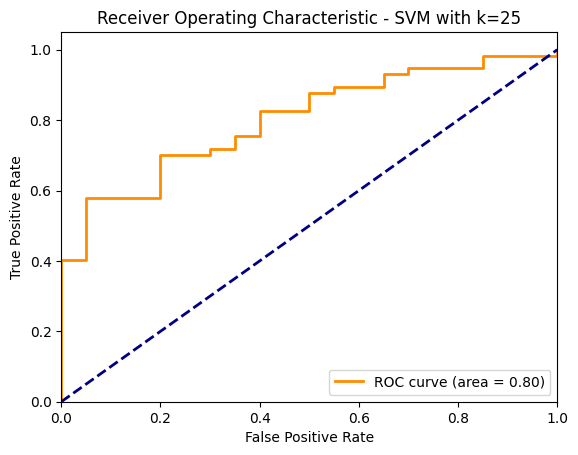

Best Hyperparameters for SVM with k=30: {'classifier__C': 0.05, 'classifier__gamma': 0.025, 'classifier__kernel': 'rbf', 'selector__k': 2}


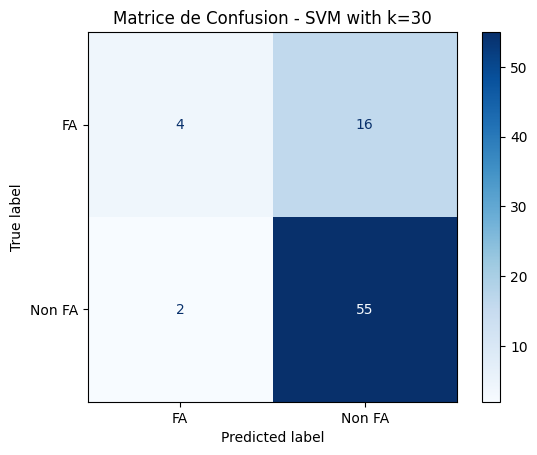

Classification Report for SVM with k=30:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.67      0.20      0.31        20
           1       0.77      0.96      0.86        57

    accuracy                           0.77        77
   macro avg       0.72      0.58      0.58        77
weighted avg       0.75      0.77      0.72        77

Selected Features for SVM with k=30: ['ecpl_bio_ntprobnp', 'adm_ec_age']


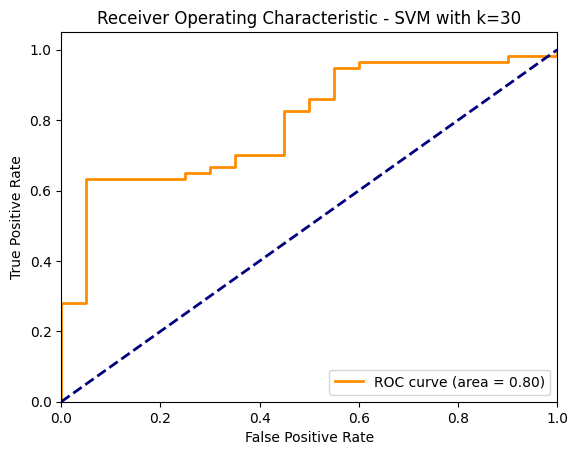

Best Hyperparameters for Lasso with k=2: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 10}


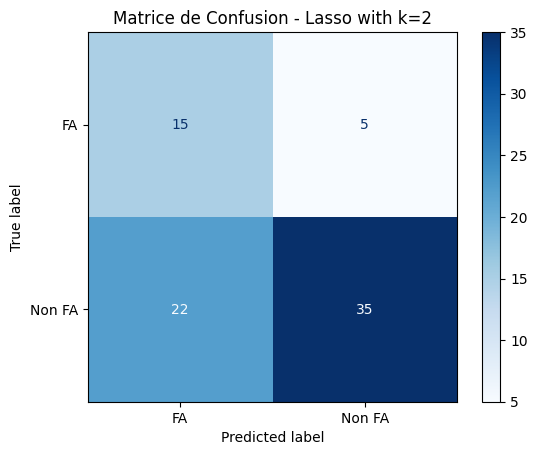

Classification Report for Lasso with k=2:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=2: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'ici_willis_d_terminal']


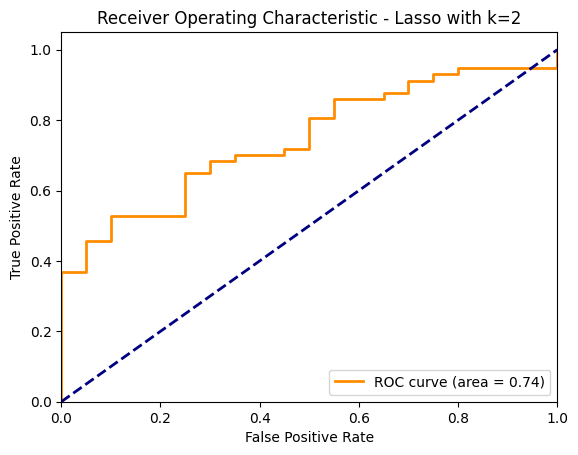

Best Hyperparameters for Lasso with k=10: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 20}


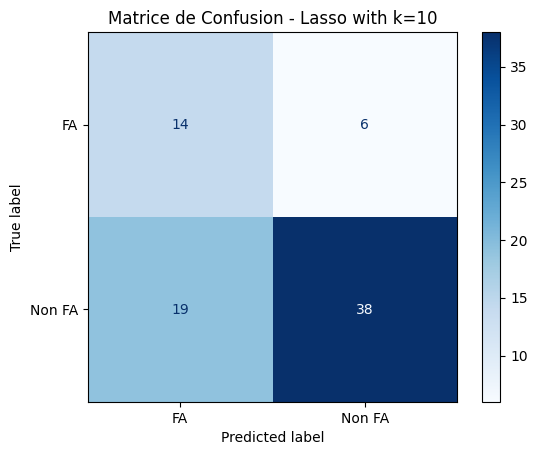

Classification Report for Lasso with k=10:
Accuracy: 0.68
              precision    recall  f1-score   support

           0       0.42      0.70      0.53        20
           1       0.86      0.67      0.75        57

    accuracy                           0.68        77
   macro avg       0.64      0.68      0.64        77
weighted avg       0.75      0.68      0.69        77

Selected Features for Lasso with k=10: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_rv_diabete', 'di_rv_hta', 'ici_acm_profond_d', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_d_terminal', 'NIHSS Initial']


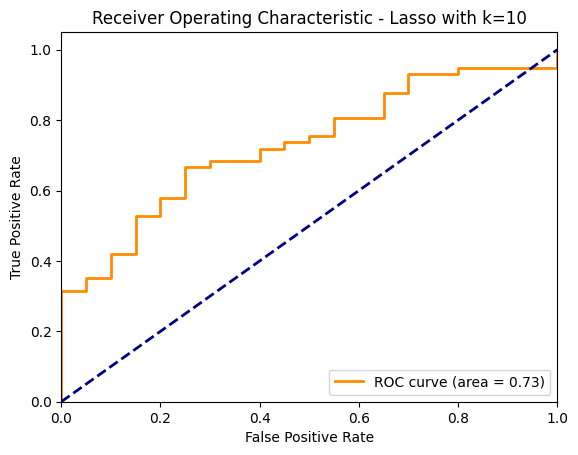

Best Hyperparameters for Lasso with k=20: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 20}


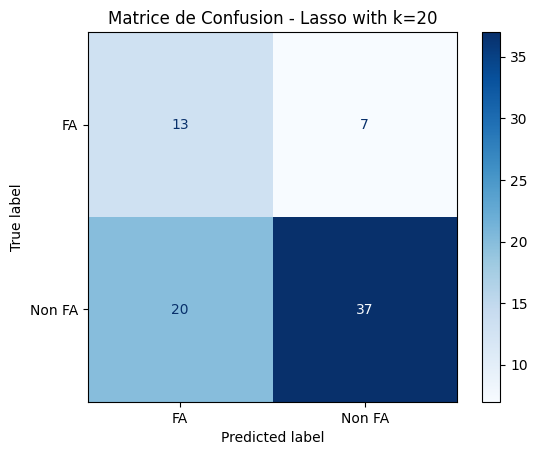

Classification Report for Lasso with k=20:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.39      0.65      0.49        20
           1       0.84      0.65      0.73        57

    accuracy                           0.65        77
   macro avg       0.62      0.65      0.61        77
weighted avg       0.72      0.65      0.67        77

Selected Features for Lasso with k=20: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_rv_hyperchol', 'di_rv_tabac', 'ici_acm_profond_d', 'ici_acm_supant_d', 'ici_swan_thrombus', 'ici_willis_d_interne', 'ici_willis_d_m3m4', 'ici_willis_d_terminal', 'ici_willis_d_vert', 'NIHSS Initial']


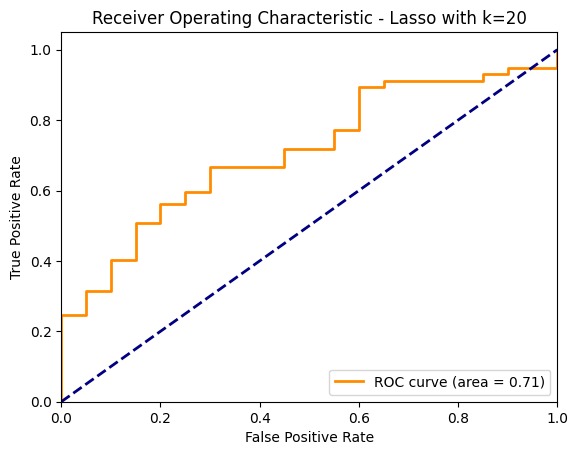

Best Hyperparameters for Lasso with k=25: {'classifier__C': 0.06, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 20}


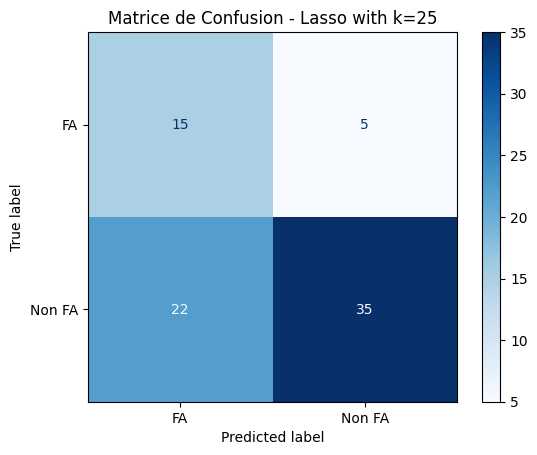

Classification Report for Lasso with k=25:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=25: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hta', 'ici_acm_profond_d', 'ici_acm_suppost_d', 'ici_swan_thrombus', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_m2', 'ici_willis_d_terminal', 'NIHSS Initial']


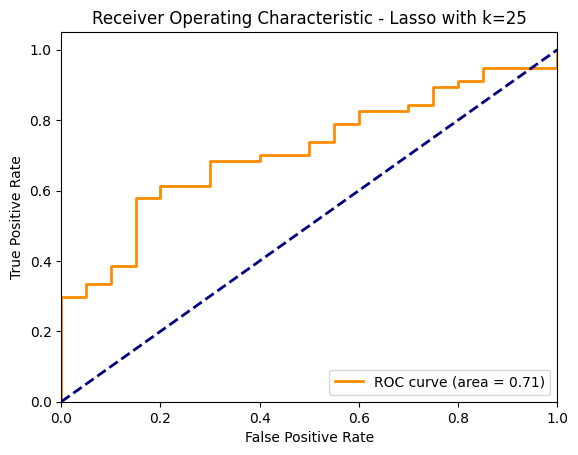

Best Hyperparameters for Lasso with k=30: {'classifier__C': 0.09, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'selector__k': 25}


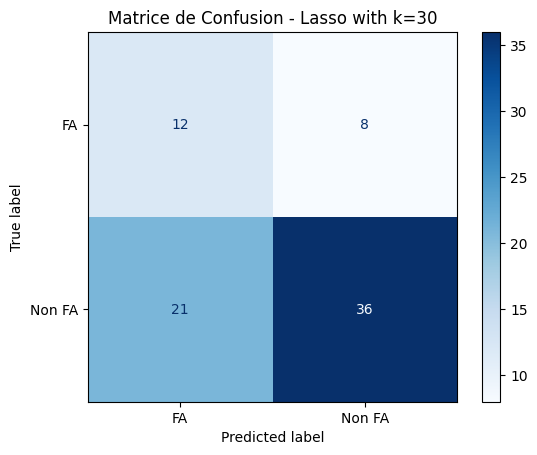

Classification Report for Lasso with k=30:
Accuracy: 0.62
              precision    recall  f1-score   support

           0       0.36      0.60      0.45        20
           1       0.82      0.63      0.71        57

    accuracy                           0.62        77
   macro avg       0.59      0.62      0.58        77
weighted avg       0.70      0.62      0.65        77

Selected Features for Lasso with k=30: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_rv_tabac', 'di_ti_aa', 'ici_acm_profond_d', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_swan_thrombus', 'ici_willis_d_cere', 'ici_willis_m2', 'ici_willis_d_m3m4', 'ici_willis_d_terminal', 'ici_willis_d_vert', 'NIHSS Initial']


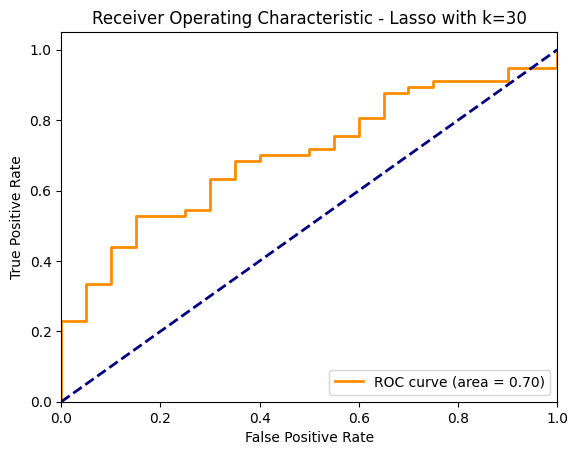

Best Hyperparameters for Random Forest with k=2: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13, 'selector__k': 2}


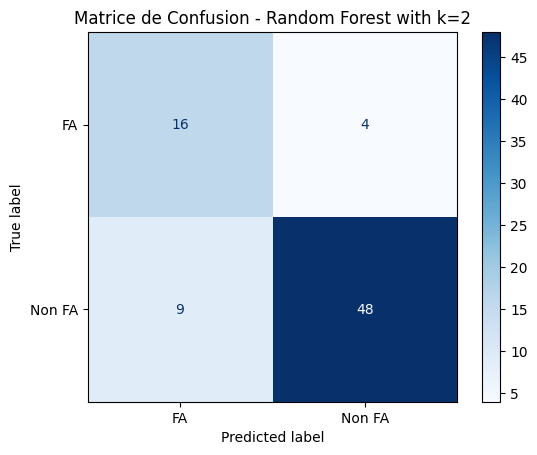

Classification Report for Random Forest with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=2: ['ecpl_bio_ntprobnp', 'adm_ec_age']


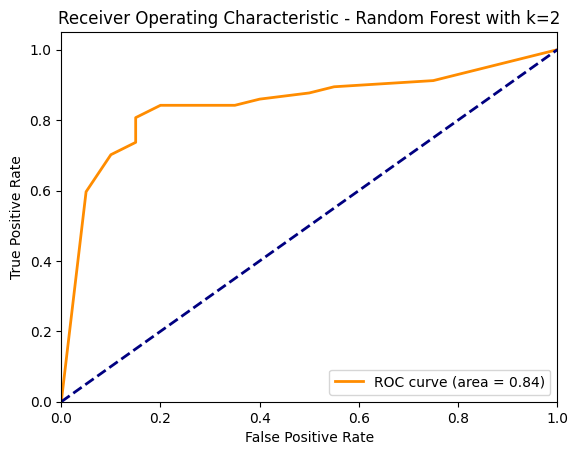

Best Hyperparameters for Random Forest with k=10: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 15, 'selector__k': 20}


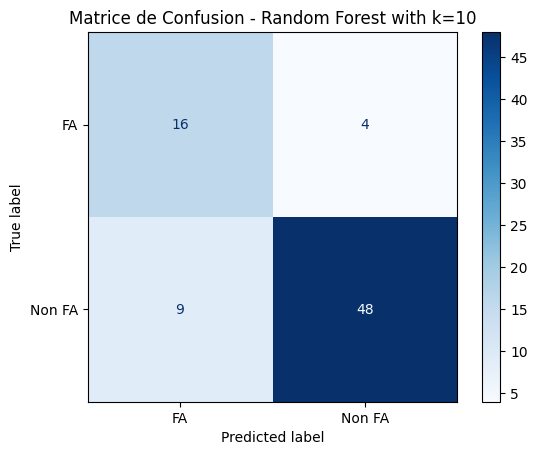

Classification Report for Random Forest with k=10:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=10: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_rv_tabac', 'di_ti_aa', 'ici_acm_supant_d', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_m2', 'ici_willis_d_terminal', 'NIHSS Initial']


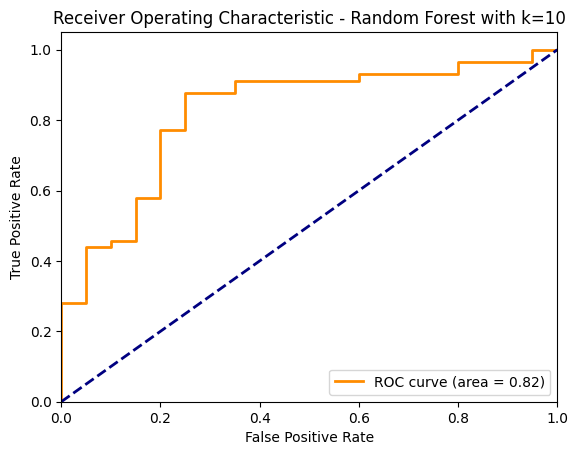

Best Hyperparameters for Random Forest with k=20: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13, 'selector__k': 2}


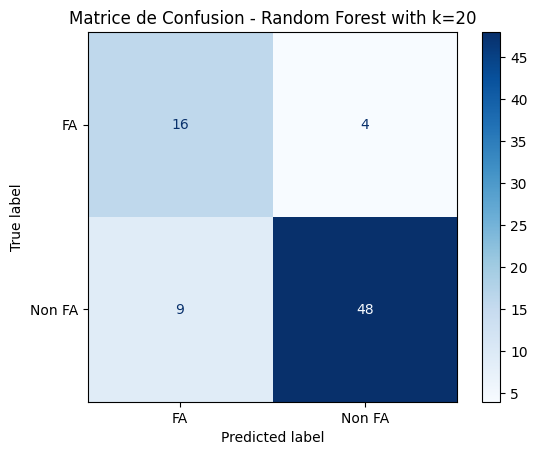

Classification Report for Random Forest with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=20: ['ecpl_bio_ntprobnp', 'adm_ec_age']


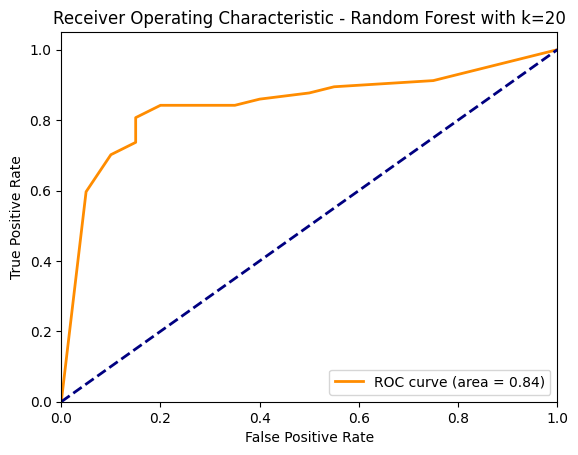

Best Hyperparameters for Random Forest with k=25: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 15, 'selector__k': 20}


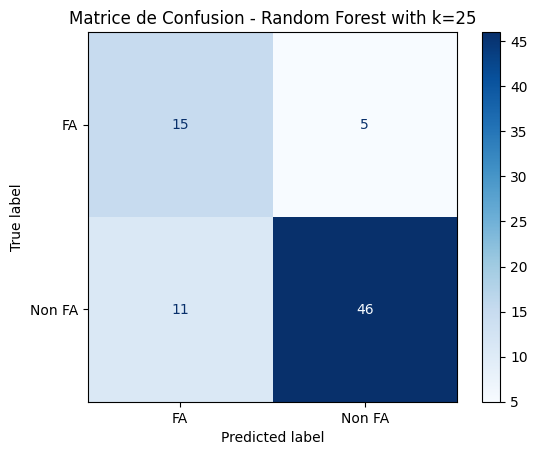

Classification Report for Random Forest with k=25:
Accuracy: 0.79
              precision    recall  f1-score   support

           0       0.58      0.75      0.65        20
           1       0.90      0.81      0.85        57

    accuracy                           0.79        77
   macro avg       0.74      0.78      0.75        77
weighted avg       0.82      0.79      0.80        77

Selected Features for Random Forest with k=25: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_ti_aa', 'di_ti_aod', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_willis_d_m1', 'ici_willis_m2', 'ici_willis_d_terminal', 'NIHSS Initial']


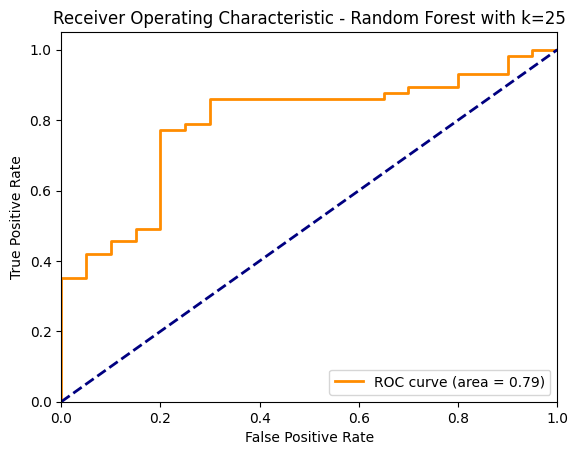

Best Hyperparameters for Random Forest with k=30: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13, 'selector__k': 20}


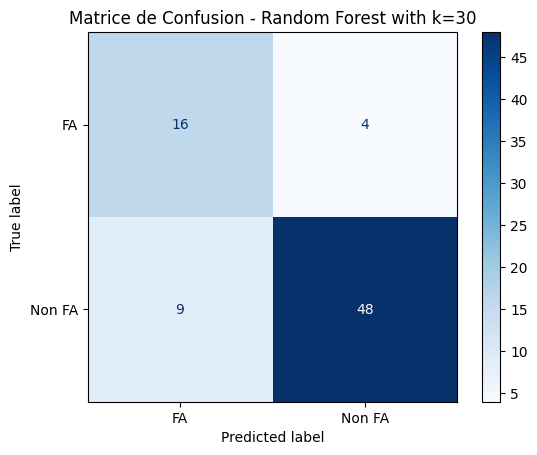

Classification Report for Random Forest with k=30:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=30: ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hta', 'di_rv_hyperchol', 'di_ti_avk', 'ici_acm_profond_d', 'ici_acm_supant_d', 'ici_flair_seqavc', 'ici_willis_m2', 'ici_willis_d_terminal', 'ici_willis_d_vert', 'NIHSS Initial']


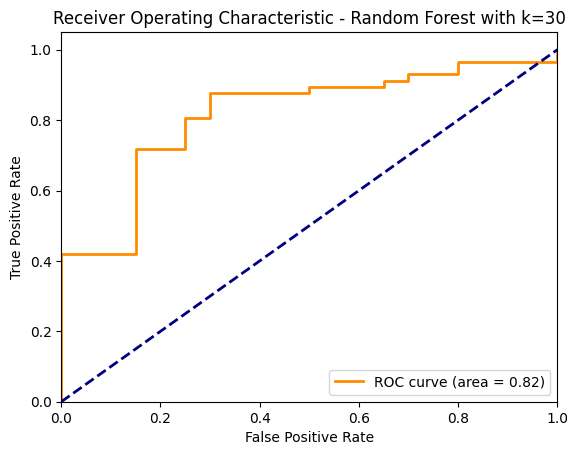

Best Hyperparameters for XGBoost with k=2: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


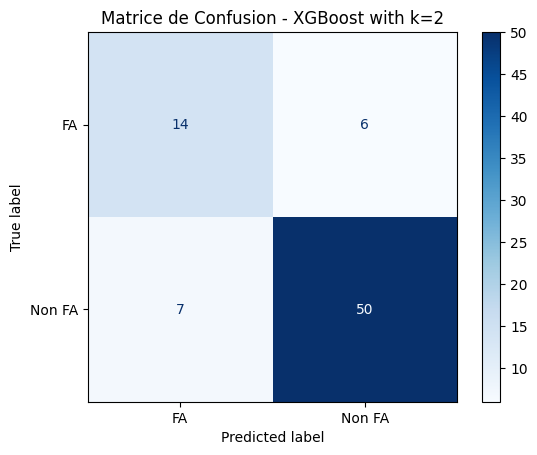

Classification Report for XGBoost with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=2: ['ecpl_bio_ntprobnp', 'adm_ec_age']


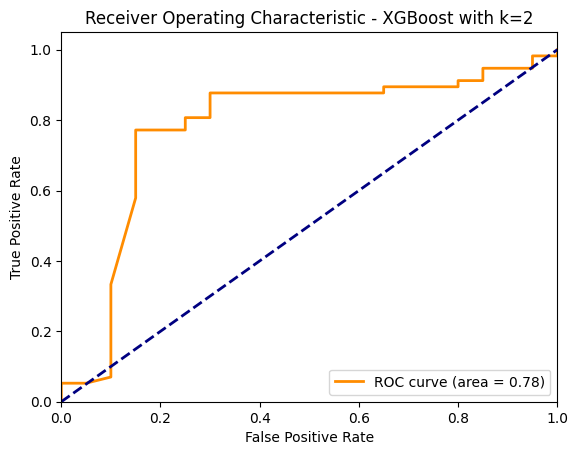

Best Hyperparameters for XGBoost with k=10: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


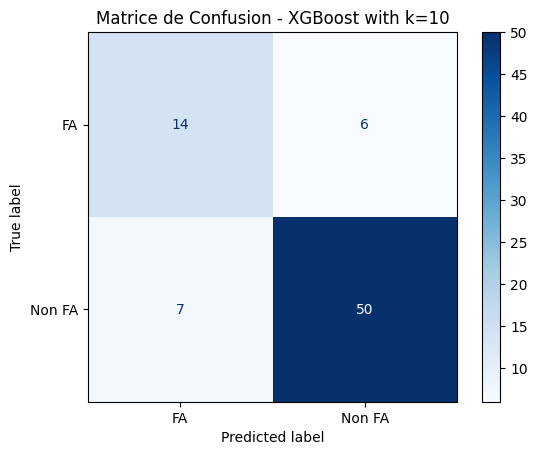

Classification Report for XGBoost with k=10:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=10: ['ecpl_bio_ntprobnp', 'adm_ec_age']


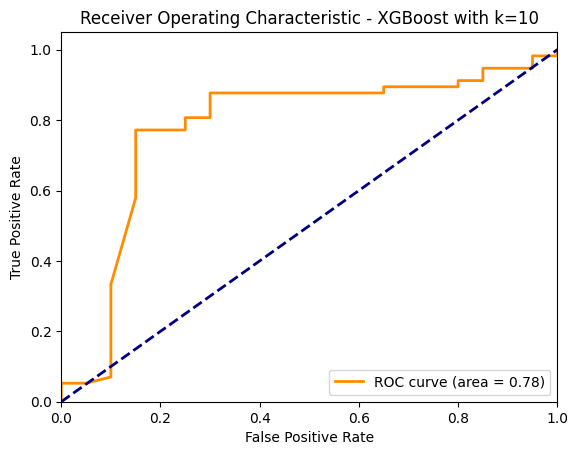

Best Hyperparameters for XGBoost with k=20: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


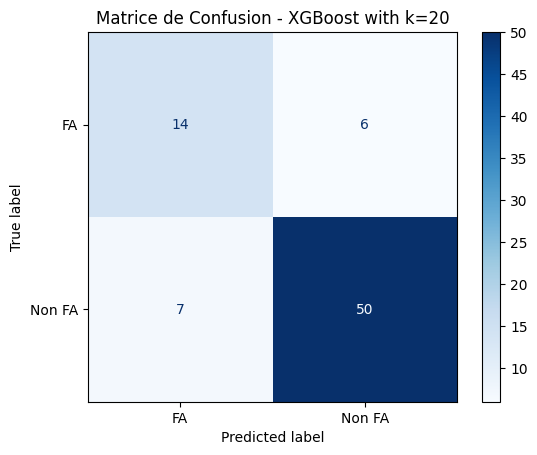

Classification Report for XGBoost with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=20: ['ecpl_bio_ntprobnp', 'adm_ec_age']


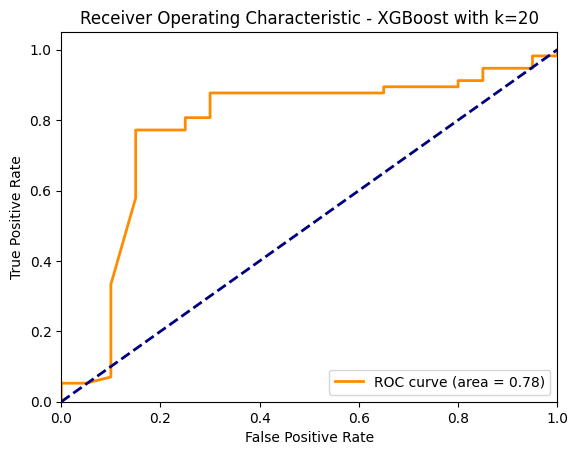

Best Hyperparameters for XGBoost with k=25: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


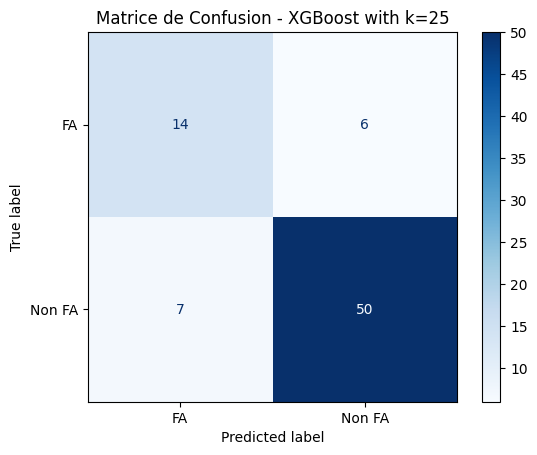

Classification Report for XGBoost with k=25:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=25: ['ecpl_bio_ntprobnp', 'adm_ec_age']


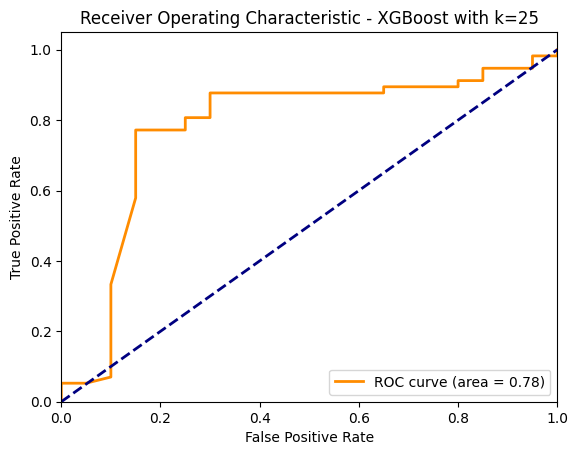

Best Hyperparameters for XGBoost with k=30: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7, 'selector__k': 2}


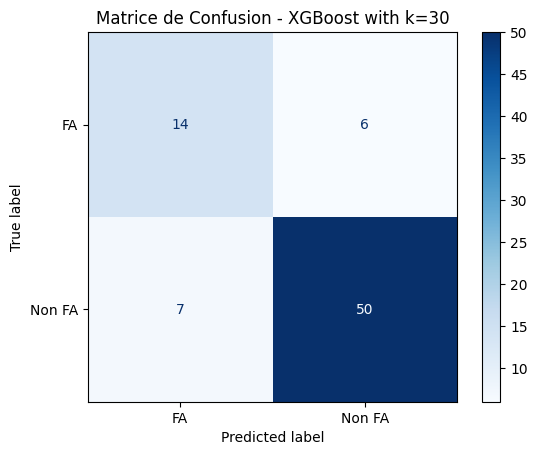

Classification Report for XGBoost with k=30:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=30: ['ecpl_bio_ntprobnp', 'adm_ec_age']


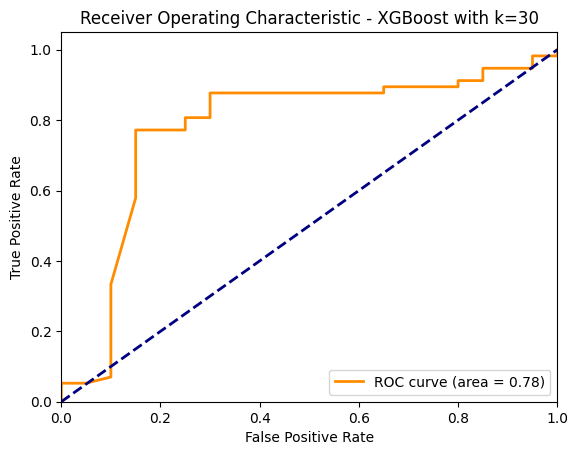

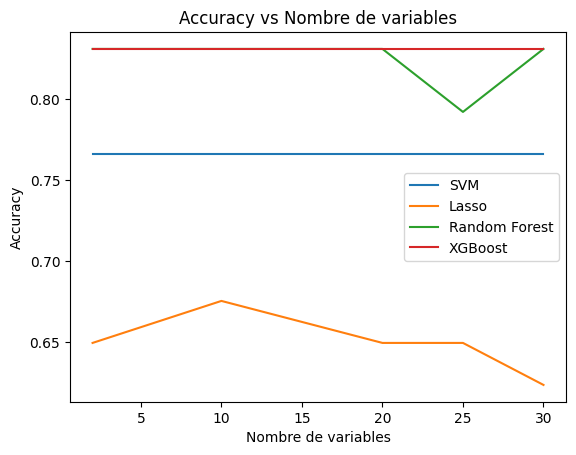

In [2]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Filtrer les caractéristiques constantes
selector_variance = VarianceThreshold()
X_filtered = selector_variance.fit_transform(X_filtered)

# Obtenir les noms des colonnes après l'application de VarianceThreshold
remaining_feature_names = X.columns[selector_variance.get_support()]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Paramètres pour la sélection de caractéristiques
k_features = [2, 10, 20, 25, 30]

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'selector__k': k_features,
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    'classifier__gamma': [0.02, 0.025, 0.027, 0.03],
    'classifier__kernel': ['linear', 'rbf', 'poly']
}

# Lasso avec GridSearchCV
pipeline_lasso = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', LogisticRegression())
])

param_grid_lasso = {
    'selector__k': k_features,
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09],
    'classifier__solver': ['liblinear'],
    'classifier__penalty': ['l1']
}

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'selector__k': k_features,
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'selector__k': k_features,
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_svm, param_grid_svm, 'SVM'),
    (pipeline_lasso, param_grid_lasso, 'Lasso'),
    (pipeline_rf, param_grid_rf, 'Random Forest'),
    (pipeline_xgb, param_grid_xgb, 'XGBoost')
]

# Entraînement et évaluation de chaque modèle
results = {}
for pipeline, param_grid, model_name in pipelines:
    for k in k_features:
        # Mettre à jour le paramètre de sélection de caractéristiques
        pipeline.set_params(selector__k=k)

        grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_filtered, y_filtered)

        best_params = grid_search.best_params_
        print(f"Best Hyperparameters for {model_name} with k={k}: {best_params}")

        # Meilleur modèle trouvé
        best_pipeline = grid_search.best_estimator_

        y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

        # Matrice de confusion
        cm = confusion_matrix(y_filtered, y_pred)

        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
        disp.plot(cmap='Blues')
        plt.title(f'Matrice de Confusion - {model_name} with k={k}')
        plt.show()

        # Rapport de classification
        accuracy = accuracy_score(y_filtered, y_pred)
        class_report = classification_report(y_filtered, y_pred, zero_division=0)
        print(f"Classification Report for {model_name} with k={k}:")
        print(f"Accuracy: {accuracy:.2f}")
        print(class_report)

        # Sauvegarder les résultats pour le traçage de l'accuracy en fonction du nombre de variables
        if model_name not in results:
            results[model_name] = {'k_features': [], 'accuracies': [], 'important_features': []}
        results[model_name]['k_features'].append(k)
        results[model_name]['accuracies'].append(accuracy)

        # Obtenir les noms des caractéristiques sélectionnées
        selected_features_indices = best_pipeline.named_steps['selector'].get_support(indices=True)
        selected_features = remaining_feature_names[selected_features_indices].tolist()
        results[model_name]['important_features'].append(selected_features)

        # Afficher les caractéristiques importantes pour chaque valeur de k
        print(f"Selected Features for {model_name} with k={k}: {selected_features}")

        # Courbe ROC
        y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
        fpr, tpr, _ = roc_curve(y_filtered, y_proba[:, 1])
        roc_auc = auc(fpr, tpr)

        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic - {model_name} with k={k}')
        plt.legend(loc="lower right")
        plt.show()

# Tracer l'accuracy en fonction du nombre de variables pour chaque modèle
for model_name in results:
    plt.plot(results[model_name]['k_features'], results[model_name]['accuracies'], label=model_name)

plt.xlabel('Nombre de variables')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Nombre de variables')
plt.legend()
plt.show()

## Test avec 2 algos

Best Hyperparameters for Lasso with k=2: {'classifier__C': 0.05, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}


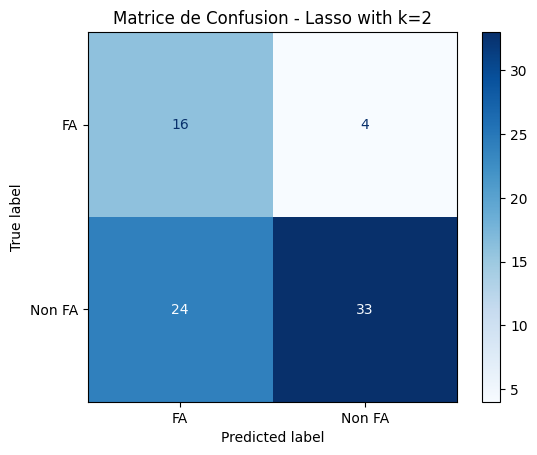

Classification Report for Lasso with k=2:
Accuracy: 0.64
              precision    recall  f1-score   support

           0       0.40      0.80      0.53        20
           1       0.89      0.58      0.70        57

    accuracy                           0.64        77
   macro avg       0.65      0.69      0.62        77
weighted avg       0.76      0.64      0.66        77

Selected Features for Lasso with k=2 (count: 2): ['ecpl_bio_ntprobnp', 'adm_ec_age']


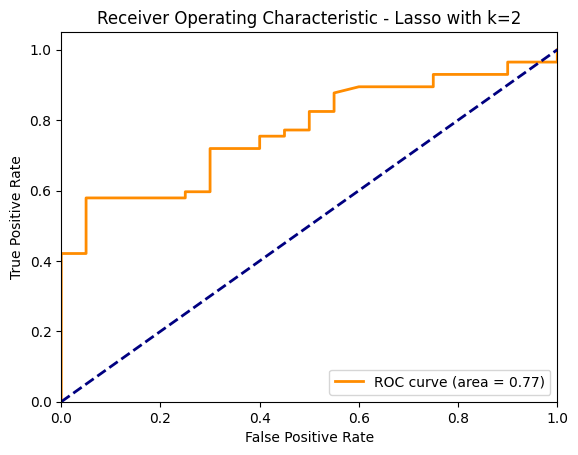

Best Hyperparameters for Lasso with k=10: {'classifier__C': 0.08, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}


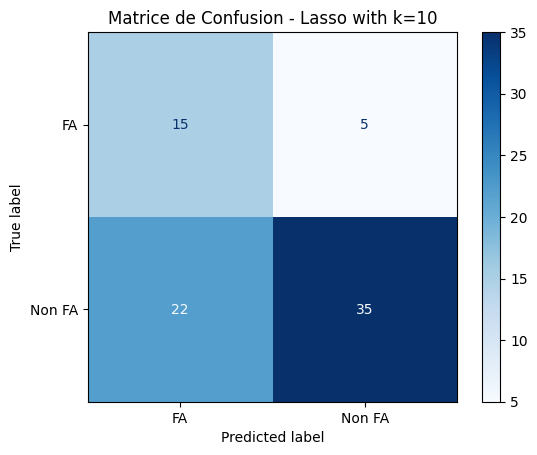

Classification Report for Lasso with k=10:
Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.41      0.75      0.53        20
           1       0.88      0.61      0.72        57

    accuracy                           0.65        77
   macro avg       0.64      0.68      0.62        77
weighted avg       0.75      0.65      0.67        77

Selected Features for Lasso with k=10 (count: 10): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_ti_aa', 'ici_acm_supant_d']


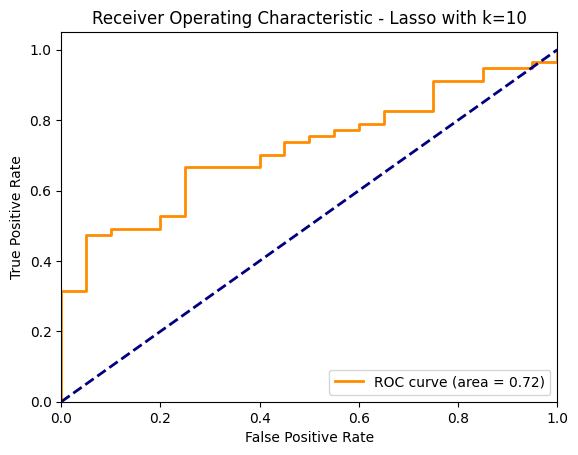

Best Hyperparameters for Lasso with k=20: {'classifier__C': 0.07, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}


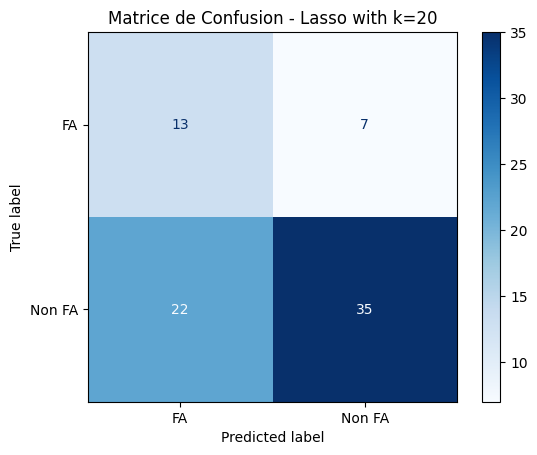

Classification Report for Lasso with k=20:
Accuracy: 0.62
              precision    recall  f1-score   support

           0       0.37      0.65      0.47        20
           1       0.83      0.61      0.71        57

    accuracy                           0.62        77
   macro avg       0.60      0.63      0.59        77
weighted avg       0.71      0.62      0.65        77

Selected Features for Lasso with k=20 (count: 20): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'adm_pds_col3', 'di_rv_diabete', 'di_rv_hyperchol', 'di_rv_tabac', 'di_ti_aa', 'ici_acm_supant_d', 'ici_flair_seqavc', 'ici_swan_thrombus', 'ici_willis_d_m3m4', 'ici_willis_d_post', 'NIHSS Initial']


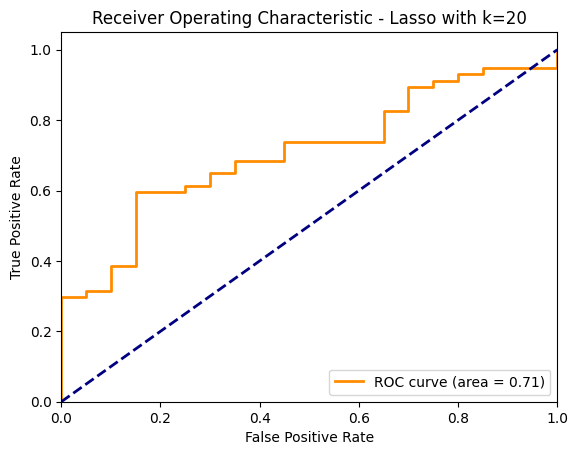

Best Hyperparameters for Random Forest with k=2: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13}


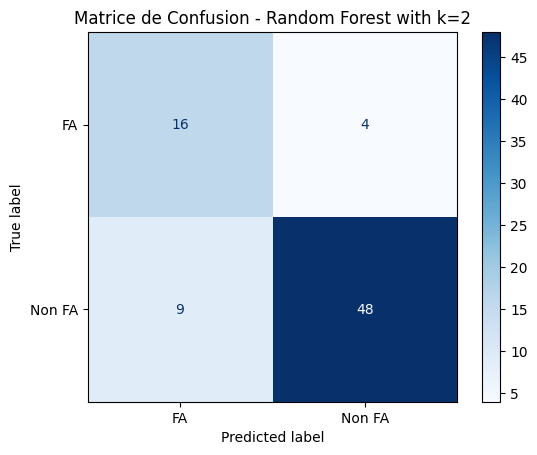

Classification Report for Random Forest with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=2 (count: 2): ['ecpl_bio_ntprobnp', 'adm_ec_age']


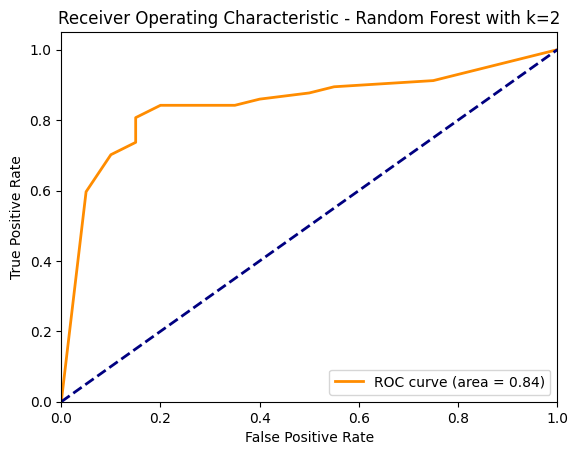

Best Hyperparameters for Random Forest with k=10: {'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 15}


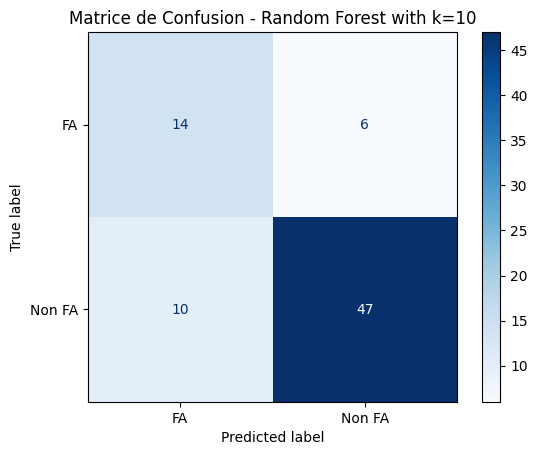

Classification Report for Random Forest with k=10:
Accuracy: 0.79
              precision    recall  f1-score   support

           0       0.58      0.70      0.64        20
           1       0.89      0.82      0.85        57

    accuracy                           0.79        77
   macro avg       0.74      0.76      0.75        77
weighted avg       0.81      0.79      0.80        77

Selected Features for Random Forest with k=10 (count: 10): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_rv_tabac', 'ici_willis_d_terminal']


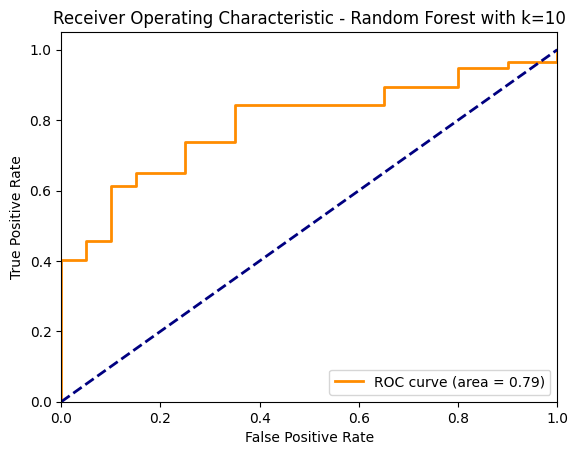

Best Hyperparameters for Random Forest with k=20: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 15}


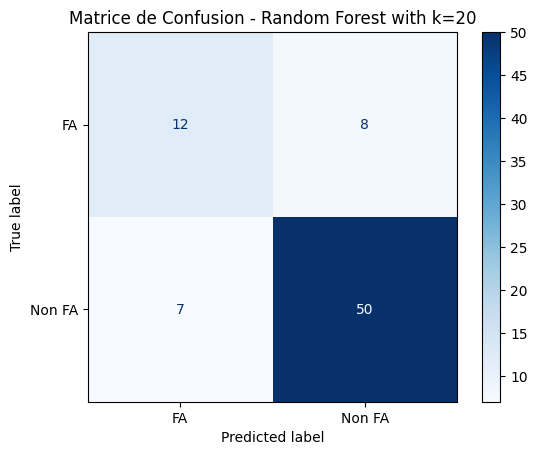

Classification Report for Random Forest with k=20:
Accuracy: 0.81
              precision    recall  f1-score   support

           0       0.63      0.60      0.62        20
           1       0.86      0.88      0.87        57

    accuracy                           0.81        77
   macro avg       0.75      0.74      0.74        77
weighted avg       0.80      0.81      0.80        77

Selected Features for Random Forest with k=20 (count: 20): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_diabete', 'di_rv_hta', 'di_ti_aa', 'di_ti_aod', 'ici_flair_seqavc', 'ici_swan_thrombus', 'ici_willis_d_m1', 'ici_willis_m2', 'ici_willis_d_post', 'ici_willis_d_terminal', 'NIHSS Initial']


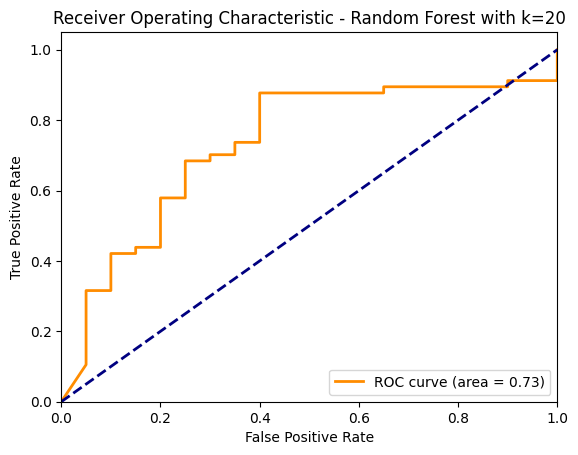

In [5]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Filtrer les caractéristiques constantes
selector_variance = VarianceThreshold()
X_filtered = selector_variance.fit_transform(X_filtered)

# Obtenir les noms des colonnes après l'application de VarianceThreshold
remaining_feature_names = X.columns[selector_variance.get_support()]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Paramètres pour la sélection de caractéristiques
k_features = [2, 10, 20]

# Lasso avec GridSearchCV
pipeline_lasso = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', LogisticRegression())
])

param_grid_lasso = {
    'classifier__C': [0.05, 0.06, 0.07, 0.08, 0.09],
    'classifier__solver': ['liblinear'],
    'classifier__penalty': ['l1']
}

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_lasso, param_grid_lasso, 'Lasso'),
    (pipeline_rf, param_grid_rf, 'Random Forest')
]

# Entraînement et évaluation de chaque modèle
results = {}
for pipeline, param_grid, model_name in pipelines:
    for k in k_features:
        # Mettre à jour le paramètre de sélection de caractéristiques
        pipeline.set_params(selector__k=k)

        grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_filtered, y_filtered)

        best_params = grid_search.best_params_
        print(f"Best Hyperparameters for {model_name} with k={k}: {best_params}")

        # Meilleur modèle trouvé
        best_pipeline = grid_search.best_estimator_

        y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

        # Matrice de confusion
        cm = confusion_matrix(y_filtered, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
        disp.plot(cmap='Blues')
        plt.title(f'Matrice de Confusion - {model_name} with k={k}')
        plt.show()

        # Rapport de classification
        accuracy = accuracy_score(y_filtered, y_pred)
        class_report = classification_report(y_filtered, y_pred, zero_division=0)
        print(f"Classification Report for {model_name} with k={k}:")
        print(f"Accuracy: {accuracy:.2f}")
        print(class_report)

        # Sauvegarder les résultats pour le traçage de l'accuracy en fonction du nombre de variables
        if model_name not in results:
            results[model_name] = {'k_features': [], 'accuracies': [], 'important_features': []}
        results[model_name]['k_features'].append(k)
        results[model_name]['accuracies'].append(accuracy)

        # Obtenir les noms des caractéristiques sélectionnées
        selected_features_indices = best_pipeline.named_steps['selector'].get_support(indices=True)
        selected_features = [remaining_feature_names[i] for i in selected_features_indices]
        results[model_name]['important_features'].append(selected_features)

        # Afficher les caractéristiques importantes pour chaque valeur de k
        print(f"Selected Features for {model_name} with k={k} (count: {len(selected_features)}): {selected_features}")

        # Courbe ROC
        y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
        fpr, tpr, _ = roc_curve(y_filtered, y_proba[:, 1])
        roc_auc = auc(fpr, tpr)

        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic - {model_name} with k={k}')
        plt.legend(loc="lower right")
        plt.show()

# Traçage de la courbe accuracy/nb de variables pour chaque algorithme
plt.figure(figsize=(10, 6))
for model_name, data in results.items():
    plt.plot(data['k_features'], data['accuracies'], marker='o', label=model_name)

plt.title('Accuracy en fonction du nombre de variables sélectionnées')
plt.xlabel('Nombre de variables sélectionnées')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Best Hyperparameters for Random Forest with k=2: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 13}


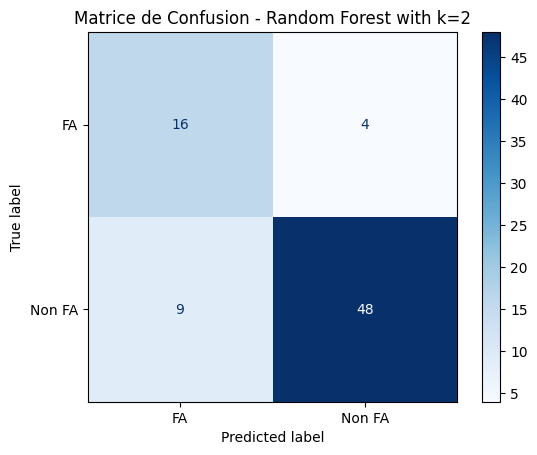

Classification Report for Random Forest with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=2 (count: 2): ['ecpl_bio_ntprobnp', 'adm_ec_age']


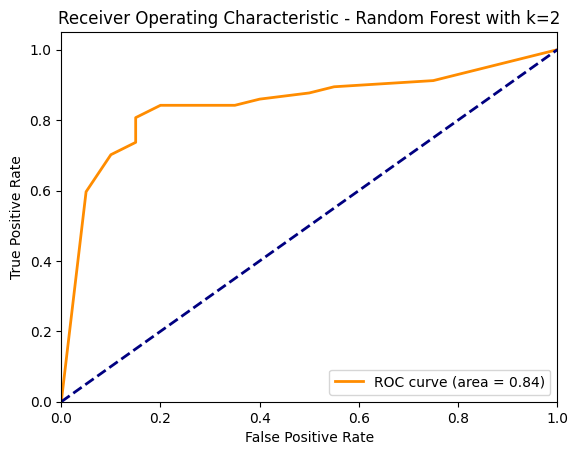

Best Hyperparameters for Random Forest with k=5: {'classifier__max_depth': 2, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 13}


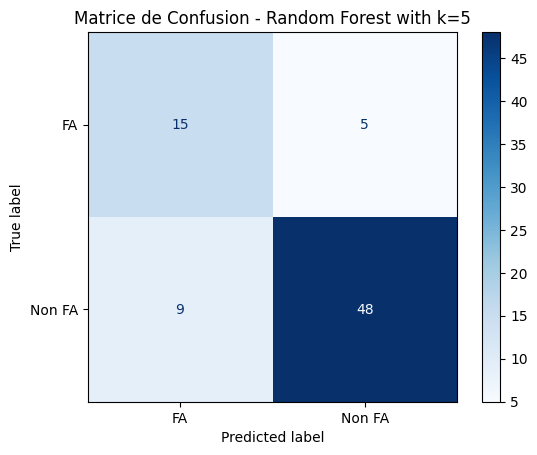

Classification Report for Random Forest with k=5:
Accuracy: 0.82
              precision    recall  f1-score   support

           0       0.62      0.75      0.68        20
           1       0.91      0.84      0.87        57

    accuracy                           0.82        77
   macro avg       0.77      0.80      0.78        77
weighted avg       0.83      0.82      0.82        77

Selected Features for Random Forest with k=5 (count: 5): ['ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age']


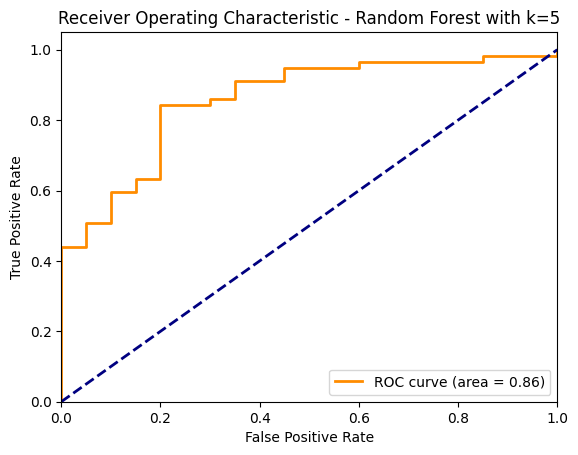

Best Hyperparameters for Random Forest with k=10: {'classifier__max_depth': 5, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 15}


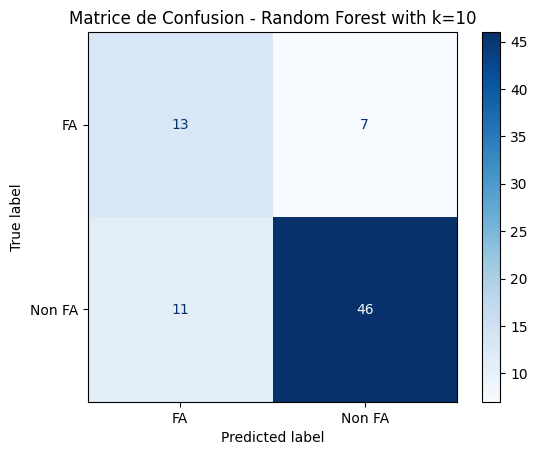

Classification Report for Random Forest with k=10:
Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.54      0.65      0.59        20
           1       0.87      0.81      0.84        57

    accuracy                           0.77        77
   macro avg       0.70      0.73      0.71        77
weighted avg       0.78      0.77      0.77        77

Selected Features for Random Forest with k=10 (count: 10): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_rv_tabac', 'ici_willis_d_terminal']


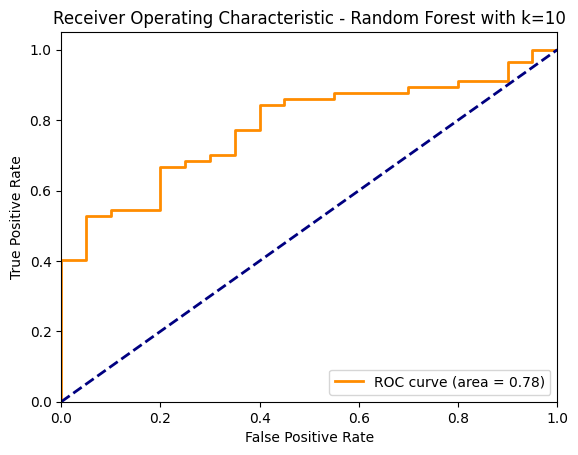

Best Hyperparameters for Random Forest with k=20: {'classifier__max_depth': 3, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 13}


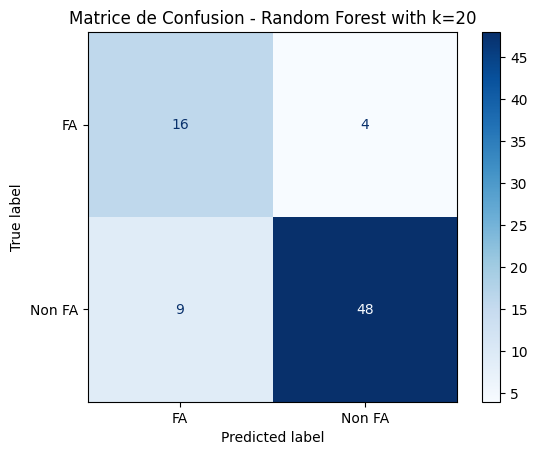

Classification Report for Random Forest with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for Random Forest with k=20 (count: 20): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_av_avc', 'di_rv_diabete', 'di_rv_hta', 'di_rv_tabac', 'di_ti_aa', 'ici_acm_supant_d', 'ici_acm_suppost_d', 'ici_swan_thrombus', 'ici_willis_m2', 'ici_willis_d_terminal', 'NIHSS Initial']


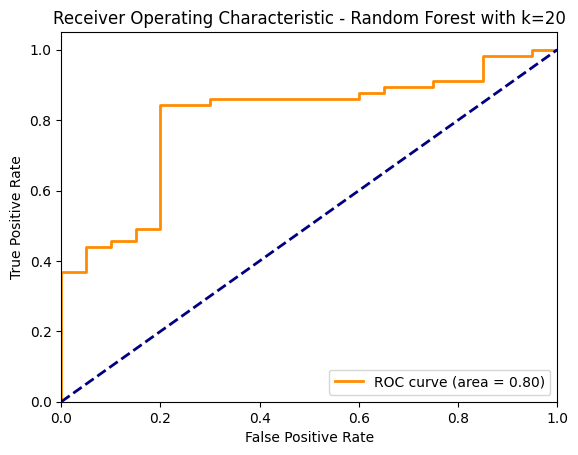

Best Hyperparameters for XGBoost with k=2: {'classifier__learning_rate': 0.006, 'classifier__max_depth': None, 'classifier__n_estimators': 20, 'classifier__subsample': 0.7}


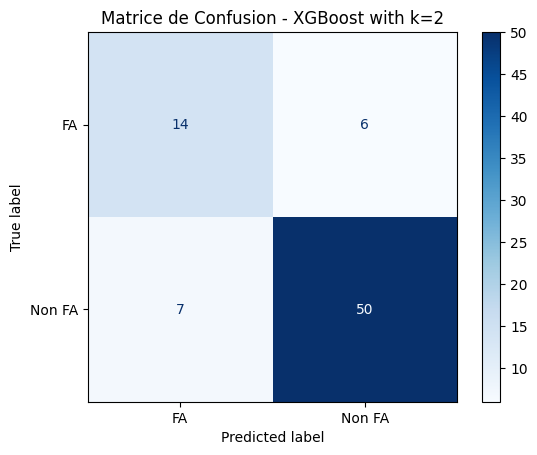

Classification Report for XGBoost with k=2:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.67      0.70      0.68        20
           1       0.89      0.88      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.79      0.78        77
weighted avg       0.83      0.83      0.83        77

Selected Features for XGBoost with k=2 (count: 2): ['ecpl_bio_ntprobnp', 'adm_ec_age']


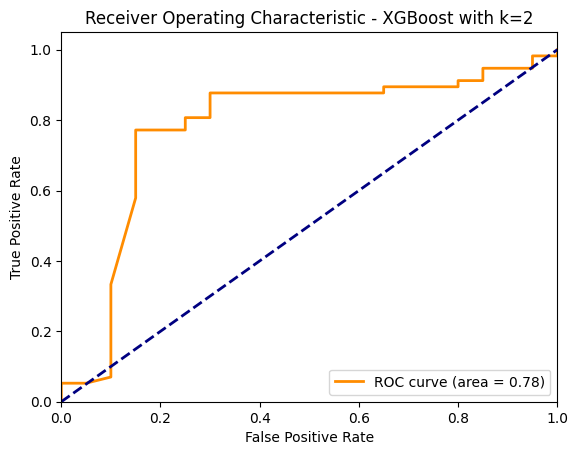

Best Hyperparameters for XGBoost with k=5: {'classifier__learning_rate': 0.005, 'classifier__max_depth': 7, 'classifier__n_estimators': 20, 'classifier__subsample': 0.85}


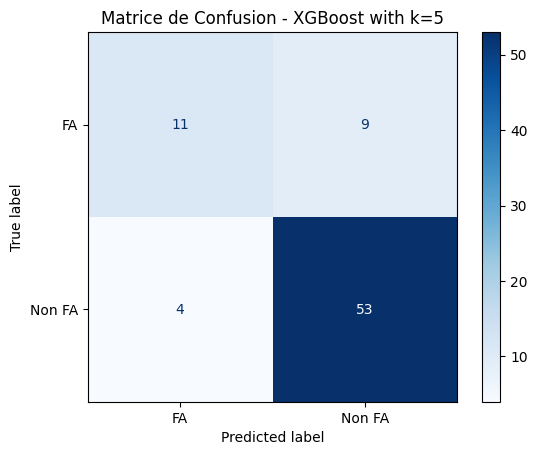

Classification Report for XGBoost with k=5:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.73      0.55      0.63        20
           1       0.85      0.93      0.89        57

    accuracy                           0.83        77
   macro avg       0.79      0.74      0.76        77
weighted avg       0.82      0.83      0.82        77

Selected Features for XGBoost with k=5 (count: 5): ['ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age']


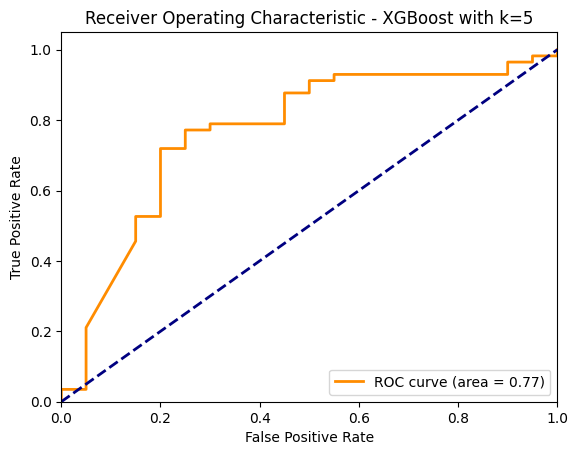

Best Hyperparameters for XGBoost with k=10: {'classifier__learning_rate': 0.006, 'classifier__max_depth': 5, 'classifier__n_estimators': 20, 'classifier__subsample': 0.65}


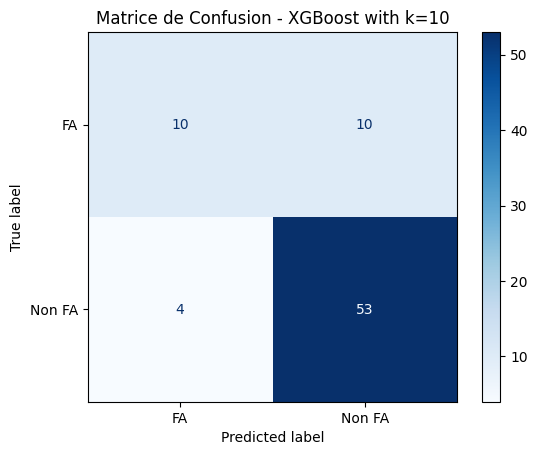

Classification Report for XGBoost with k=10:
Accuracy: 0.82
              precision    recall  f1-score   support

           0       0.71      0.50      0.59        20
           1       0.84      0.93      0.88        57

    accuracy                           0.82        77
   macro avg       0.78      0.71      0.74        77
weighted avg       0.81      0.82      0.81        77

Selected Features for XGBoost with k=10 (count: 10): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'di_rv_hta', 'di_ti_avk']


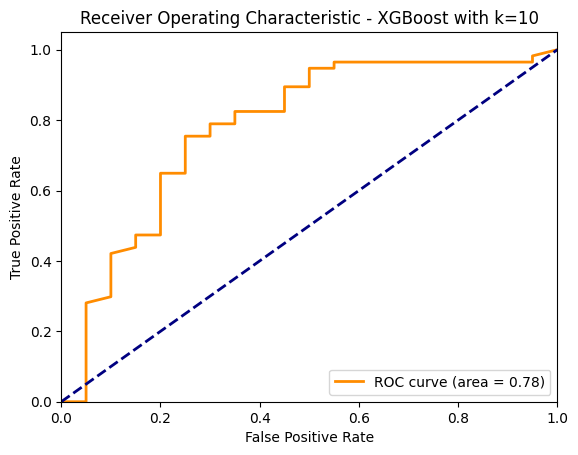

Best Hyperparameters for XGBoost with k=20: {'classifier__learning_rate': 0.005, 'classifier__max_depth': 2, 'classifier__n_estimators': 25, 'classifier__subsample': 0.8}


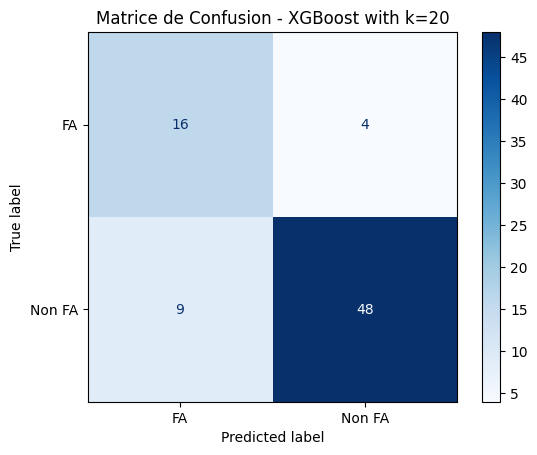

Classification Report for XGBoost with k=20:
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        20
           1       0.92      0.84      0.88        57

    accuracy                           0.83        77
   macro avg       0.78      0.82      0.80        77
weighted avg       0.85      0.83      0.84        77

Selected Features for XGBoost with k=20 (count: 20): ['di_rv_imc', 'ec_pad', 'ec_pas', 'ecpl_bio_cockroft', 'ecpl_bio_crea', 'ecpl_bio_hba1c', 'ecpl_bio_ntprobnp', 'adm_ec_age', 'adm_ec_sexe', 'di_rv_hta', 'di_rv_hyperchol', 'di_rv_tabac', 'di_ti_aa', 'ici_acm_supant_d', 'ici_swan_thrombus', 'ici_willis_d_cere', 'ici_willis_d_interne', 'ici_willis_d_m1', 'ici_willis_d_terminal', 'NIHSS Initial']


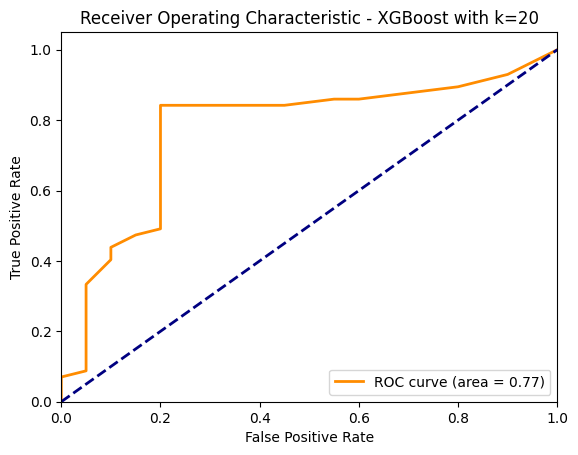

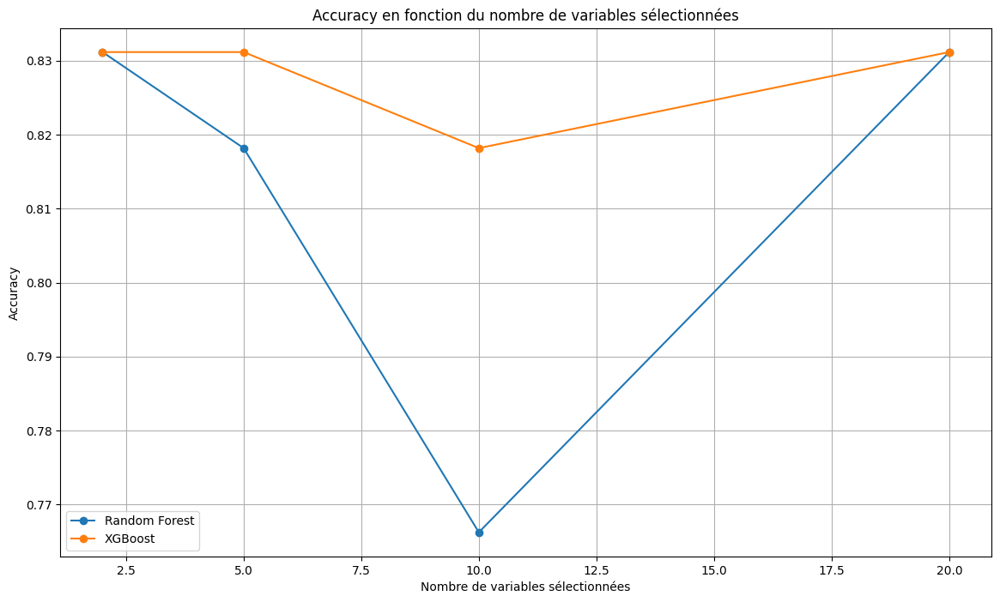

In [30]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Filtrer les caractéristiques constantes
selector_variance = VarianceThreshold()
X_filtered = selector_variance.fit_transform(X_filtered)

# Obtenir les noms des colonnes après l'application de VarianceThreshold
remaining_feature_names = X.columns[selector_variance.get_support()]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Paramètres pour la sélection de caractéristiques
k_features = [2, 5, 10, 20]

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('selector', SelectKBest(score_func=mutual_info_classif)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

# Liste des pipelines et des grilles de recherche pour chaque modèle
pipelines = [
    (pipeline_rf, param_grid_rf, 'Random Forest'),
    (pipeline_xgb, param_grid_xgb, 'XGBoost')
]

# Entraînement et évaluation de chaque modèle
results = {}
for pipeline, param_grid, model_name in pipelines:
    for k in k_features:
        # Mettre à jour le paramètre de sélection de caractéristiques
        pipeline.set_params(selector__k=k)

        grid_search = GridSearchCV(pipeline, param_grid, cv=kfold, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_filtered, y_filtered)

        best_params = grid_search.best_params_
        print(f"Best Hyperparameters for {model_name} with k={k}: {best_params}")

        # Meilleur modèle trouvé
        best_pipeline = grid_search.best_estimator_

        y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

        # Matrice de confusion
        cm = confusion_matrix(y_filtered, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
        disp.plot(cmap='Blues')
        plt.title(f'Matrice de Confusion - {model_name} with k={k}')
        plt.show()

        # Rapport de classification
        accuracy = accuracy_score(y_filtered, y_pred)
        class_report = classification_report(y_filtered, y_pred, zero_division=0)
        print(f"Classification Report for {model_name} with k={k}:")
        print(f"Accuracy: {accuracy:.2f}")
        print(class_report)

        # Sauvegarder les résultats pour le traçage de l'accuracy en fonction du nombre de variables
        if model_name not in results:
            results[model_name] = {'k_features': [], 'accuracies': [], 'important_features': []}
        results[model_name]['k_features'].append(k)
        results[model_name]['accuracies'].append(accuracy)

        # Obtenir les noms des caractéristiques sélectionnées
        selected_features_indices = best_pipeline.named_steps['selector'].get_support(indices=True)
        selected_features = [remaining_feature_names[i] for i in selected_features_indices]
        results[model_name]['important_features'].append(selected_features)

        # Afficher les caractéristiques importantes pour chaque valeur de k
        print(f"Selected Features for {model_name} with k={k} (count: {len(selected_features)}): {selected_features}")

        # Courbe ROC
        y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
        fpr, tpr, _ = roc_curve(y_filtered, y_proba[:, 1])
        roc_auc = auc(fpr, tpr)

        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Receiver Operating Characteristic - {model_name} with k={k}')
        plt.legend(loc="lower right")
        plt.show()

# Traçage de la courbe accuracy/nb de variables pour chaque algorithme
plt.figure(figsize=(14, 8))
for model_name, data in results.items():
    plt.plot(data['k_features'], data['accuracies'], marker='o', label=model_name)

plt.title('Accuracy en fonction du nombre de variables sélectionnées')
plt.xlabel('Nombre de variables sélectionnées')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

## Feature selection avec RFE

### Random Forest

Optimal number of features: 3
Best accuracy: 0.8425


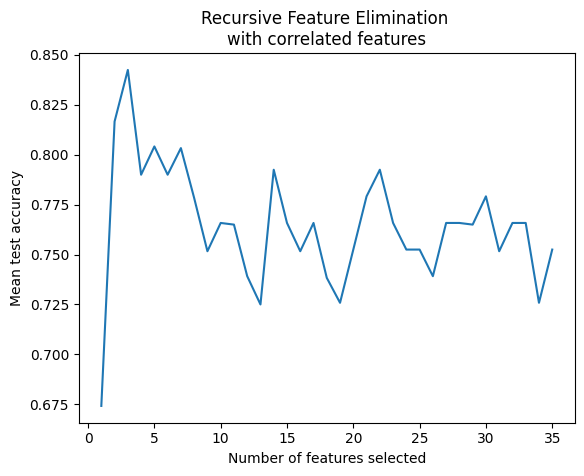

In [7]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

min_features_to_select = 1  # Minimum number of features to consider
clf = RandomForestClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X_filtered, y_filtered)

best_accuracy = max(rfecv.cv_results_['mean_test_score'])
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {best_accuracy:.4f}")

cv_results = pd.DataFrame(rfecv.cv_results_)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()

### XGBoost

Optimal number of features: 3
Best accuracy: 0.8054


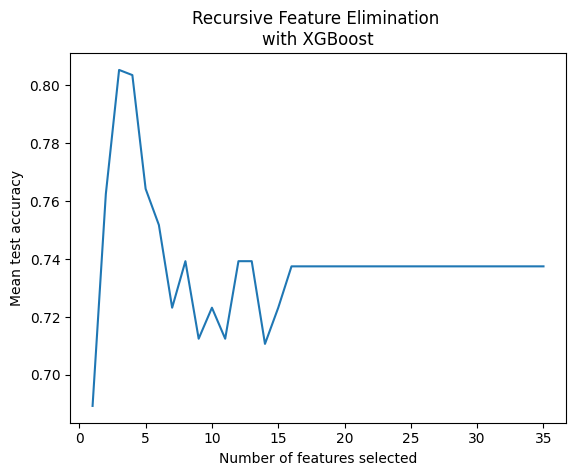

In [34]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

min_features_to_select = 1  # Minimum number of features to consider
clf = XGBClassifier()
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Paramètres pour GridSearchCV
param_grid_xgb = {
    'n_estimators': [20, 25, 30],
    'max_depth': [2, 3, 5, 7, 9],
    'learning_rate': [0.004, 0.005, 0.006],
    'subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=1,
    n_jobs=2,
)
rfecv.fit(X_filtered, y_filtered)

best_accuracy = max(rfecv.cv_results_['mean_test_score'])
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {best_accuracy:.4f}")

# Tracé de l'évolution de l'accuracy en fonction du nombre de caractéristiques
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith XGBoost")
plt.show()

# Test fonction de rejet

## Tentative pour obtenir les probabilités de sortie du random forest

Best Hyperparameters for random forest : {'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 15}


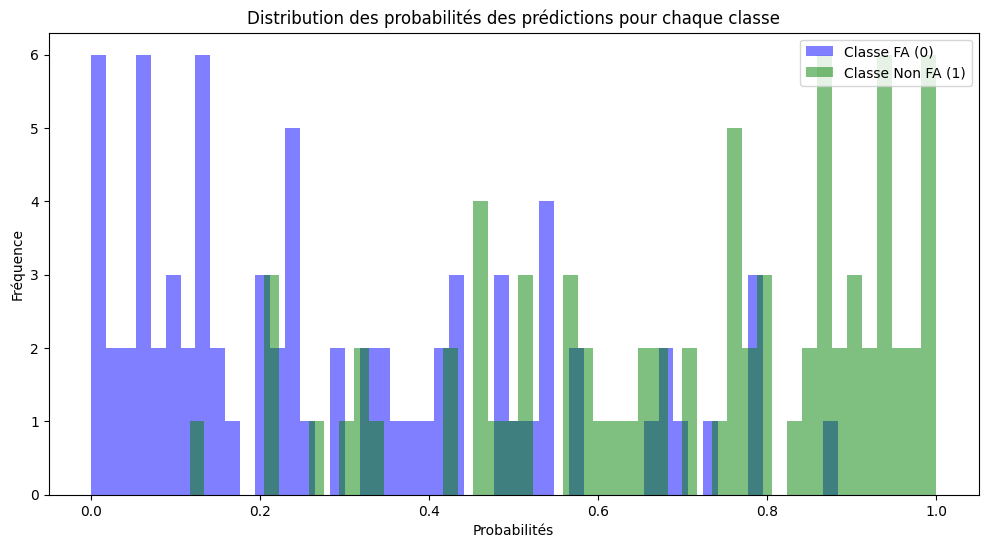

In [7]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for random forest : {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')

# Probabilités de la classe 0 "FA"
proba_FA = y_proba[:, 0]

# Probabilités de la classe 1 "Non FA"
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme pour les probabilités de la classe "FA"
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')

# Histogramme pour les probabilités de la classe "Non FA"
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

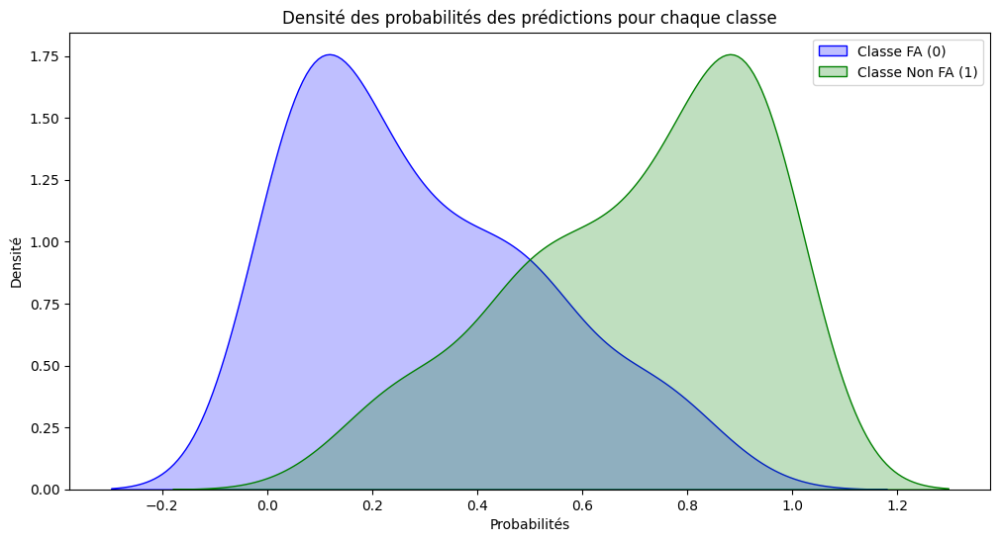

In [8]:
# Création du graphique de densité
plt.figure(figsize=(12, 6))

# Densité pour les probabilités des deux classes
sns.kdeplot(proba_FA, fill=True, label='Classe FA (0)', color='blue')
sns.kdeplot(proba_Non_FA, fill=True, label='Classe Non FA (1)', color='green')

plt.title('Densité des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Densité')
plt.legend(loc='upper right')

plt.show()

Best Hyperparameters for Random Forest: {'classifier__max_depth': 9, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 8}
Accuracy avant filtrage: 0.8051948051948052


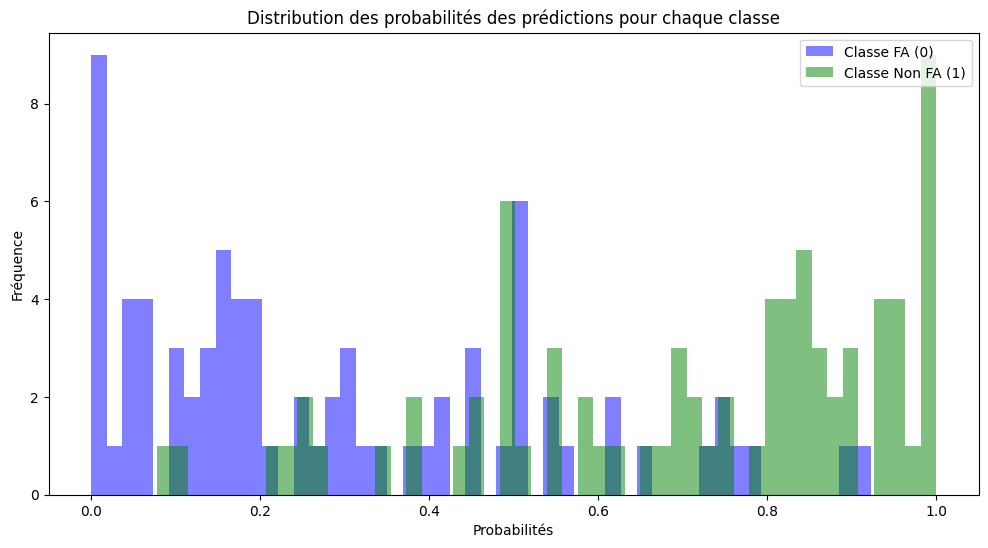

accuracy : 0.8225806451612904
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.50      0.45      0.48        11
      Non FA       0.88      0.90      0.89        51

    accuracy                           0.82        62
   macro avg       0.69      0.68      0.68        62
weighted avg       0.82      0.82      0.82        62



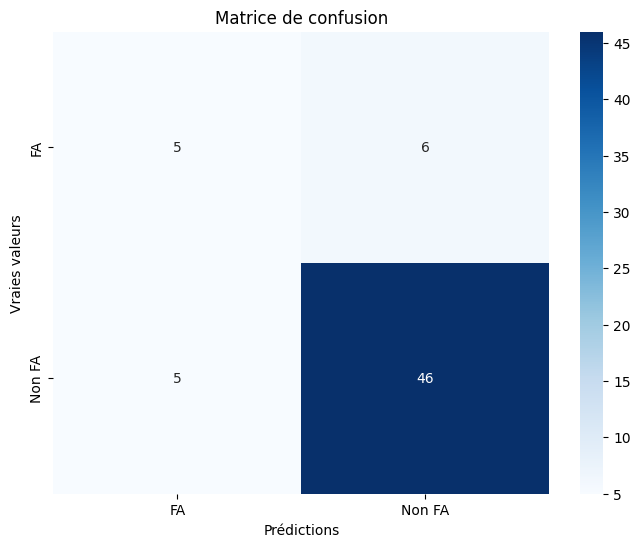

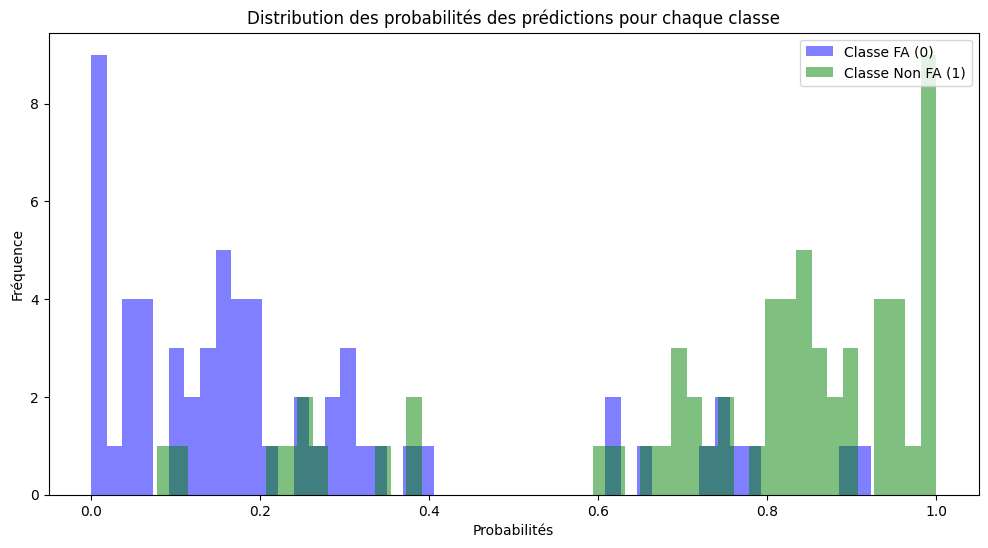

In [38]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Random Forest avec GridSearchCV
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'classifier__n_estimators': [7, 8, 10, 13, 15],
    'classifier__max_depth': [None, 7, 9, 10, 12],
    'classifier__min_samples_split': [2, 5, 10, 12],
    'classifier__min_samples_leaf': [1, 2, 4, 6]
}

grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low=0.4, threshold_high=0.6):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

y_pred_with_rejection = predict_with_rejection(y_proba)

proba_FA = y_proba[:, 0]
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme pour les probabilités de la classe "FA"
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')

# Histogramme pour les probabilités de la classe "Non FA"
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

# Filtrer les prédictions et les vraies valeurs pour exclure les "Indetermine"
filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']

# Rapport de classification
accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
print("accuracy :", accuracy)
print("Rapport de classification :\n", class_report)

# Visualisation de la matrice de confusion
conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
plt.title('Matrice de confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vraies valeurs')
plt.show()

# Histogramme des probabilités pour visualiser les distributions
plt.figure(figsize=(12, 6))

# Filtrage des probabilités
filtered_proba_FA = [p for p in proba_FA if p < 0.4 or p > 0.6]
filtered_proba_Non_FA = [p for p in proba_Non_FA if p < 0.4 or p > 0.6]

# Histogramme
plt.hist(filtered_proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(filtered_proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

## Test fonction de rejet avec XGBoost

Best Hyperparameters for XGBoost : {'classifier__learning_rate': 0.005, 'classifier__max_depth': 2, 'classifier__n_estimators': 25, 'classifier__subsample': 0.8}
[[0.50160947 0.49839053]
 [0.41536403 0.58463597]
 [0.41682106 0.58317894]
 [0.51406441 0.48593559]
 [0.50671774 0.49328226]
 [0.41314682 0.58685318]
 [0.51450654 0.48549346]
 [0.5080831  0.4919169 ]
 [0.51023948 0.48976052]
 [0.41682106 0.58317894]
 [0.4162228  0.5837772 ]
 [0.46526393 0.53473607]
 [0.4121795  0.5878205 ]
 [0.51517345 0.48482655]
 [0.51247565 0.48752435]
 [0.41600048 0.58399952]
 [0.44042847 0.55957153]
 [0.51637703 0.48362297]
 [0.42972987 0.57027013]
 [0.41418885 0.58581115]
 [0.4124041  0.5875959 ]
 [0.51312453 0.48687547]
 [0.41600048 0.58399952]
 [0.41536403 0.58463597]
 [0.51260631 0.48739369]
 [0.41314682 0.58685318]
 [0.41850552 0.58149448]
 [0.41227915 0.58772085]
 [0.41525784 0.58474216]
 [0.4124041  0.5875959 ]
 [0.51450654 0.48549346]
 [0.42254509 0.57745491]
 [0.51637703 0.48362297]
 [0.41418885 

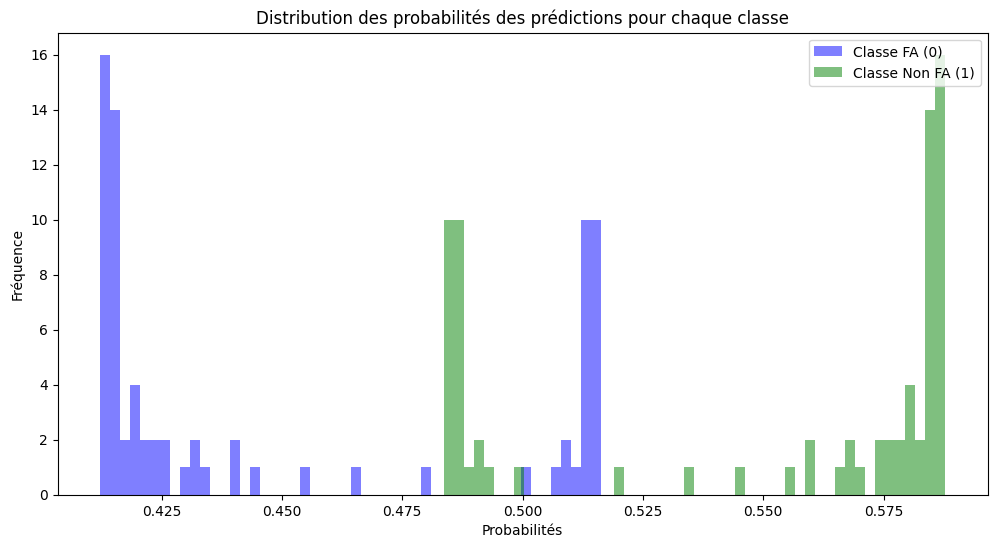

In [11]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

grid_search = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for XGBoost : {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
print(y_proba)

proba_FA = y_proba[:, 0]
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')
plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

Best Hyperparameters for Random Forest: {'classifier__learning_rate': 0.006, 'classifier__max_depth': 2, 'classifier__n_estimators': 25, 'classifier__subsample': 0.65}
Accuracy avant filtrage: 0.8051948051948052


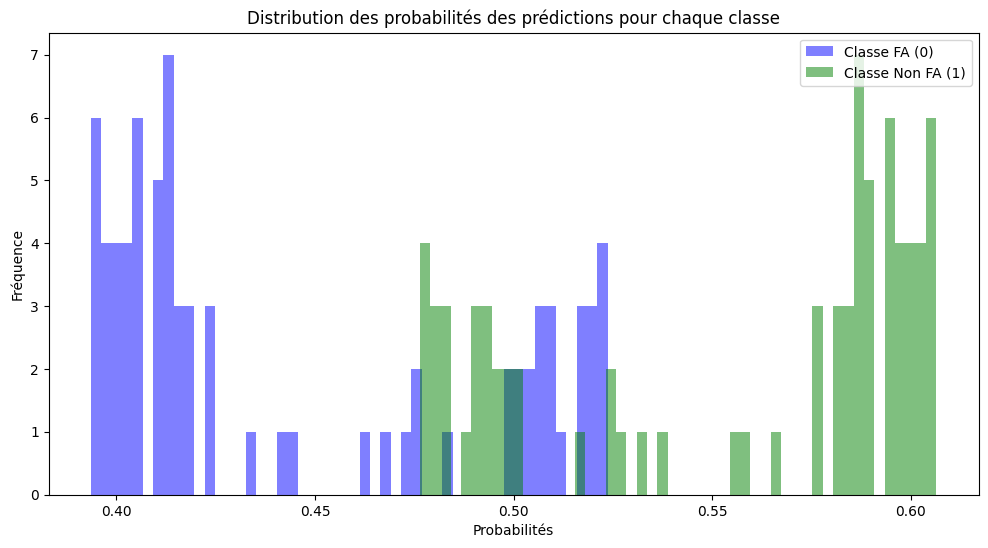

0.8771929824561403
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.50      0.29      0.36         7
      Non FA       0.91      0.96      0.93        50

    accuracy                           0.88        57
   macro avg       0.70      0.62      0.65        57
weighted avg       0.86      0.88      0.86        57



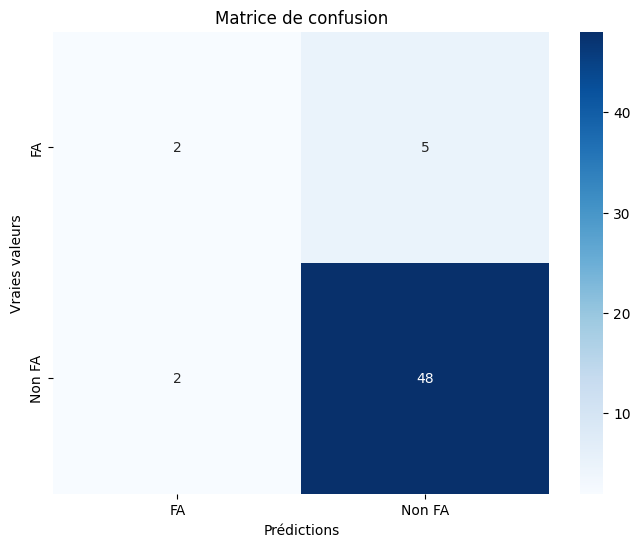

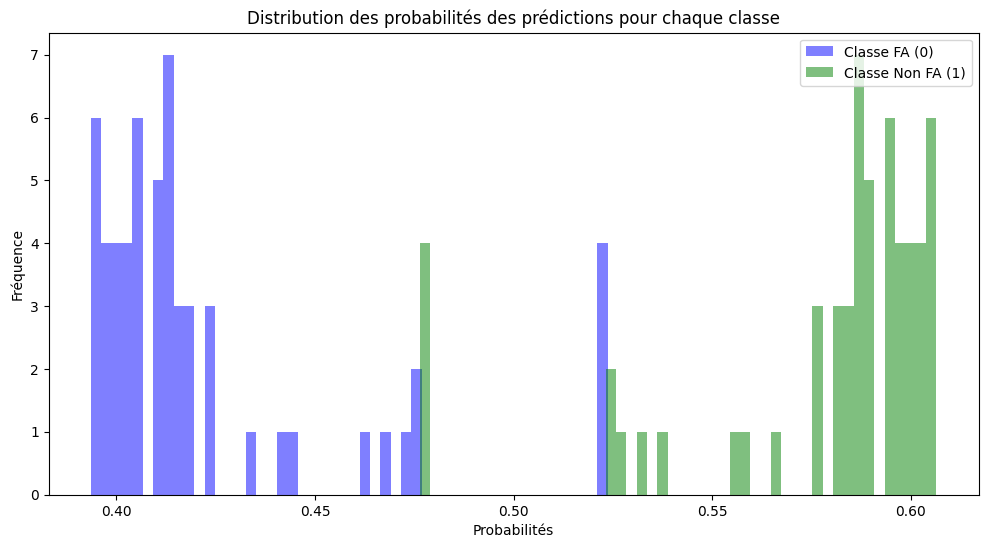

In [41]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

grid_search = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low=0.48, threshold_high=0.52):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

proba_FA = y_proba[:, 0]
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme pour les probabilités de la classe "FA"
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')

# Histogramme pour les probabilités de la classe "Non FA"
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

# Appliquer la fonction de rejet
y_pred_with_rejection = predict_with_rejection(y_proba)

# Filtrer les prédictions et les vraies valeurs pour exclure les "Indetermine"
filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']

# Rapport de classification
accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
print(accuracy)
print("Rapport de classification :\n", class_report)

# Visualisation de la matrice de confusion
conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
plt.title('Matrice de confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vraies valeurs')
plt.show()

# Histogramme des probabilités pour visualiser les distributions
plt.figure(figsize=(12, 6))

# Filtrage des probabilités
filtered_proba_FA = [p for p in proba_FA if p < 0.48 or p > 0.52]
filtered_proba_Non_FA = [p for p in proba_Non_FA if p < 0.48 or p > 0.52]

plt.hist(filtered_proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(filtered_proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

## Test avec le SVM

Best Hyperparameters for XGBoost : {'classifier__C': 0.04, 'classifier__kernel': 'linear'}
[[2.32231958e-01 7.67768042e-01]
 [1.34948779e-06 9.99998651e-01]
 [4.11711707e-03 9.95882883e-01]
 [9.99725666e-01 2.74333925e-04]
 [2.73819138e-03 9.97261809e-01]
 [7.57954586e-01 2.42045414e-01]
 [2.05137681e-09 9.99999998e-01]
 [3.53321490e-01 6.46678510e-01]
 [6.51269356e-01 3.48730644e-01]
 [9.05009830e-07 9.99999095e-01]
 [1.88457068e-02 9.81154293e-01]
 [2.61795050e-02 9.73820495e-01]
 [3.88396400e-01 6.11603600e-01]
 [1.00705991e-01 8.99294009e-01]
 [9.91936433e-01 8.06356655e-03]
 [1.18961350e-02 9.88103865e-01]
 [9.01928976e-01 9.80710239e-02]
 [9.87023143e-01 1.29768575e-02]
 [4.89957500e-01 5.10042500e-01]
 [1.49147493e-02 9.85085251e-01]
 [1.77589482e-06 9.99998224e-01]
 [6.27238416e-01 3.72761584e-01]
 [3.21891925e-02 9.67810808e-01]
 [1.06597825e-05 9.99989340e-01]
 [6.27425773e-03 9.93725742e-01]
 [3.50465003e-03 9.96495350e-01]
 [6.20477005e-02 9.37952300e-01]
 [1.24902330e-07 9

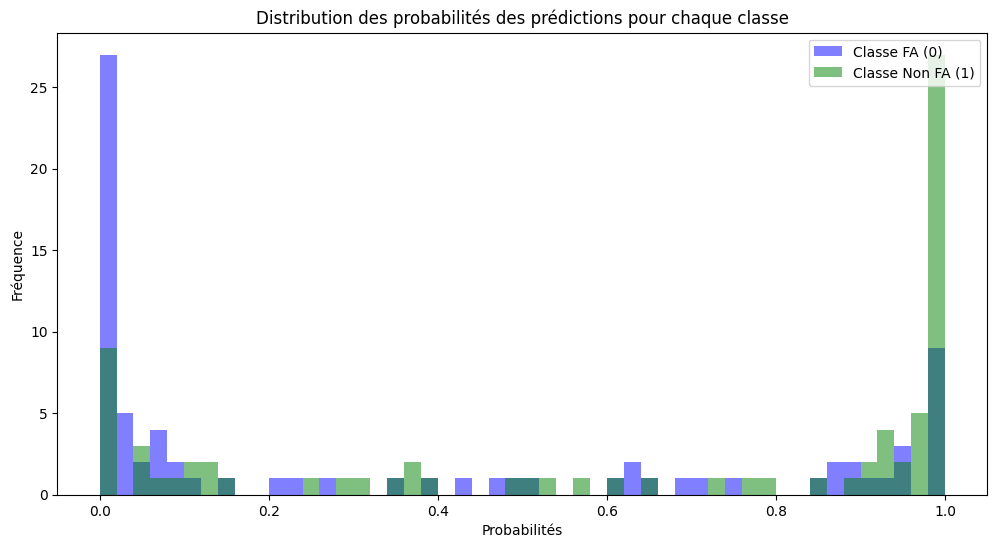

In [36]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'classifier__C': [0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    'classifier__kernel': ['linear']
}

grid_search = GridSearchCV(pipeline_svm, param_grid_svm, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for {model_name} : {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold, method='predict_proba')
print(y_proba)

# Probabilités de la classe 0 "FA"
proba_FA = y_proba[:, 0]

# Probabilités de la classe 1 "Non FA"
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme pour les probabilités de la classe "FA"
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')

# Histogramme pour les probabilités de la classe "Non FA"
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

Best Hyperparameters for SVM : {'classifier__C': 0.04, 'classifier__kernel': 'linear'}


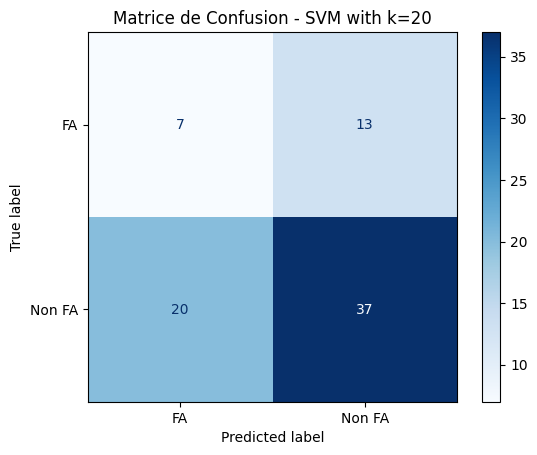

Classification Report for XGBoost :
Accuracy: 0.57
              precision    recall  f1-score   support

           0       0.26      0.35      0.30        20
           1       0.74      0.65      0.69        57

    accuracy                           0.57        77
   macro avg       0.50      0.50      0.49        77
weighted avg       0.62      0.57      0.59        77



In [38]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# SVM avec GridSearchCV
pipeline_svm = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', SVC(probability=True))
])

param_grid_svm = {
    'classifier__C': [0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1],
    'classifier__kernel': ['linear']
}

# Entrainement et prediction
grid_search = GridSearchCV(pipeline_svm, param_grid_svm, cv=kfold, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for SVM : {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

y_pred = cross_val_predict(best_pipeline, X_filtered, y_filtered, cv=kfold)

# Matrice de confusion
cm = confusion_matrix(y_filtered, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['FA', 'Non FA'])
disp.plot(cmap='Blues')
plt.title(f'Matrice de Confusion - SVM with k={k}')
plt.show()

# Rapport de classification
accuracy = accuracy_score(y_filtered, y_pred)
class_report = classification_report(y_filtered, y_pred, zero_division=0)
print(f"Classification Report for {model_name} :")
print(f"Accuracy: {accuracy:.2f}")
print(class_report)

## Assemblage feature selection et fonction de rejet pour rf

Optimal number of features: 4
Best accuracy: 0.8425


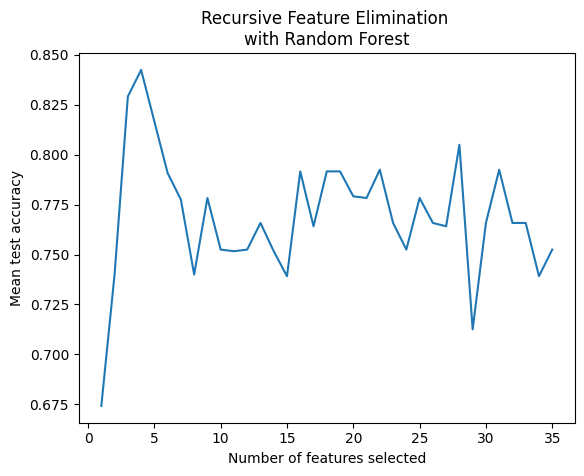

     ecpl_bio_cockroft  ecpl_bio_crea  ecpl_bio_ntprobnp  adm_ec_age
6                 46.0          114.0              270.0          80
8                134.0           47.0               40.0          44
36                70.0           96.0              134.0          67
55               121.0           59.0              421.0          68
68                58.0          101.0              518.0          74
..                 ...            ...                ...         ...
268               98.2           86.0              688.0          77
269               73.0           86.0              134.0          77
270              147.0           66.0               15.0          62
271               77.0           65.0              145.0          76
272               66.0           78.0               42.0          76

[77 rows x 4 columns]
Best Hyperparameters for Random Forest: {'classifier__max_depth': 2, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'classifi

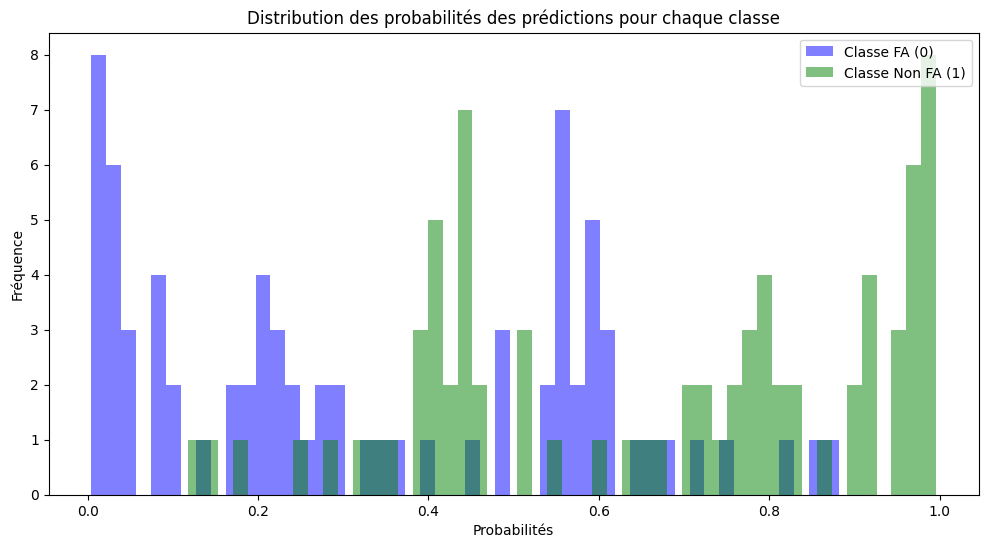

Accuracy après filtrage: 0.8571428571428571
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.64      0.64      0.64        11
      Non FA       0.91      0.91      0.91        45

    accuracy                           0.86        56
   macro avg       0.77      0.77      0.77        56
weighted avg       0.86      0.86      0.86        56



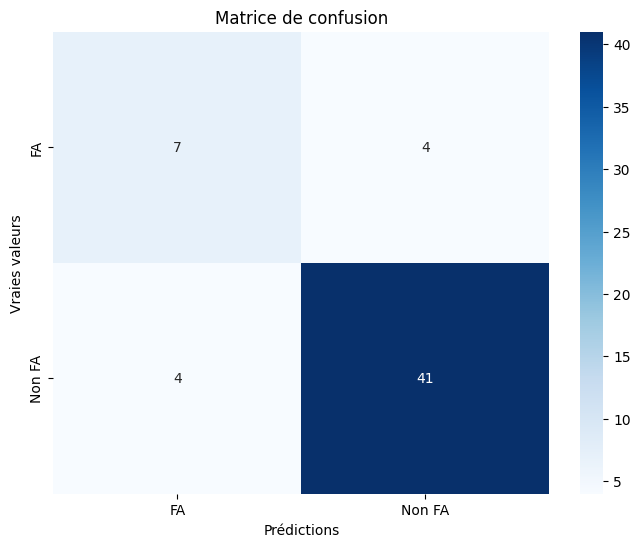

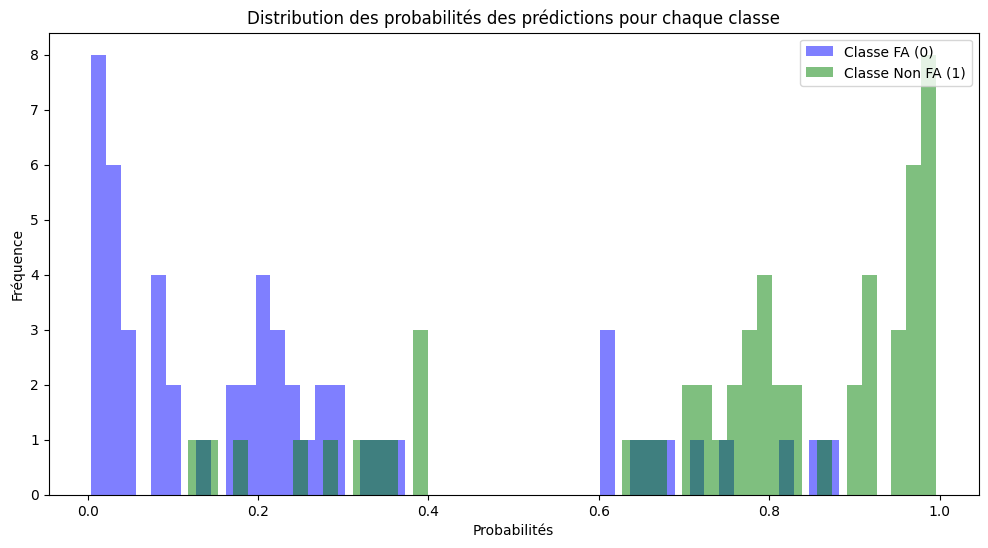

In [30]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = RandomForestClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Graphique de RFECV
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith Random Forest")
plt.show()

# Créer le pipeline avec les caractéristiques sélectionnées
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Paramètres pour GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}
print(X_filtered_reduced)
grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low=0.4, threshold_high=0.6):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

proba_FA = y_proba[:, 0]
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme pour les probabilités de la classe "FA"
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')

# Histogramme pour les probabilités de la classe "Non FA"
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

# Appliquer la fonction de rejet
y_pred_with_rejection = predict_with_rejection(y_proba)

# Filtrer les prédictions et les vraies valeurs pour exclure les "Indetermine"
filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']

# Rapport de classification
accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
print("Accuracy après filtrage:", accuracy)
print("Rapport de classification :\n", class_report)

# Visualisation de la matrice de confusion
conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
plt.title('Matrice de confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vraies valeurs')
plt.show()

# Histogramme des probabilités pour visualiser les distributions
plt.figure(figsize=(12, 6))

# Filtrage des probabilités
filtered_proba_FA = [p for p in proba_FA if p < 0.4 or p > 0.6]
filtered_proba_Non_FA = [p for p in proba_Non_FA if p < 0.4 or p > 0.6]

# Histogramme
plt.hist(filtered_proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(filtered_proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

## Assemblage feature selection et fonction de rejet pour xgboost

Optimal number of features: 8
Best accuracy: 0.8033


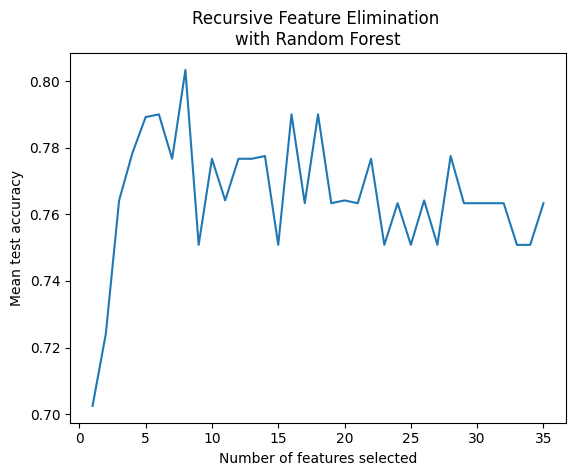

     di_rv_imc  ec_pad  ecpl_bio_cockroft  ecpl_bio_crea  ecpl_bio_hba1c  \
6         24.3   100.0               46.0          114.0            5.70   
8         21.3    65.0              134.0           47.0            5.80   
36        23.7   101.0               70.0           96.0            5.40   
55        30.7    63.0              121.0           59.0            5.60   
68        24.9    90.0               58.0          101.0            6.10   
..         ...     ...                ...            ...             ...   
268       29.1    77.0               98.2           86.0            5.94   
269       27.4    95.0               73.0           86.0            7.20   
270       33.4    86.0              147.0           66.0            5.40   
271       26.0    89.0               77.0           65.0            5.60   
272       26.6    80.0               66.0           78.0            6.30   

     ecpl_bio_ntprobnp  adm_ec_age  adm_pds_col3  
6                270.0          80  

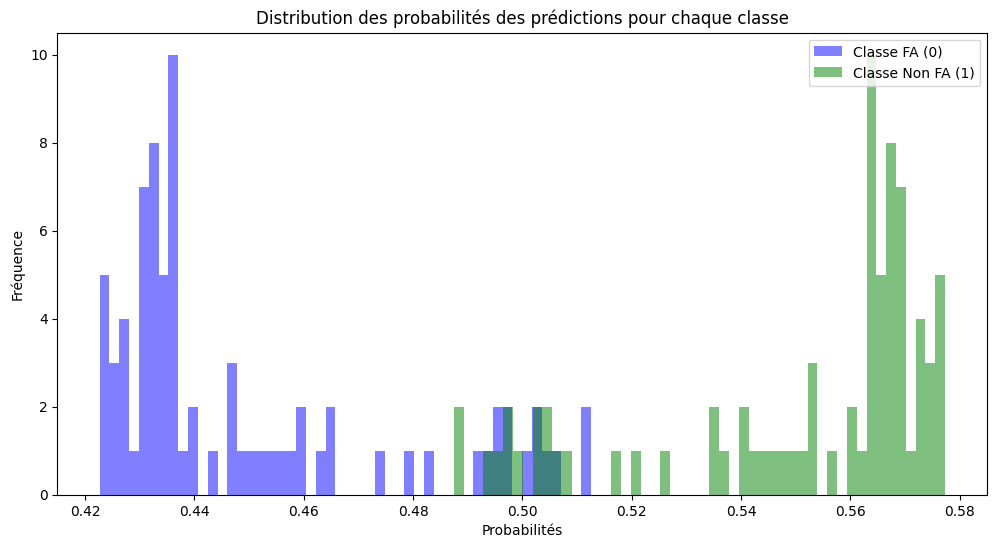

C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

Accuracy après filtrage: 0.7936507936507936
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00        13
      Non FA       0.79      1.00      0.88        50

    accuracy                           0.79        63
   macro avg       0.40      0.50      0.44        63
weighted avg       0.63      0.79      0.70        63



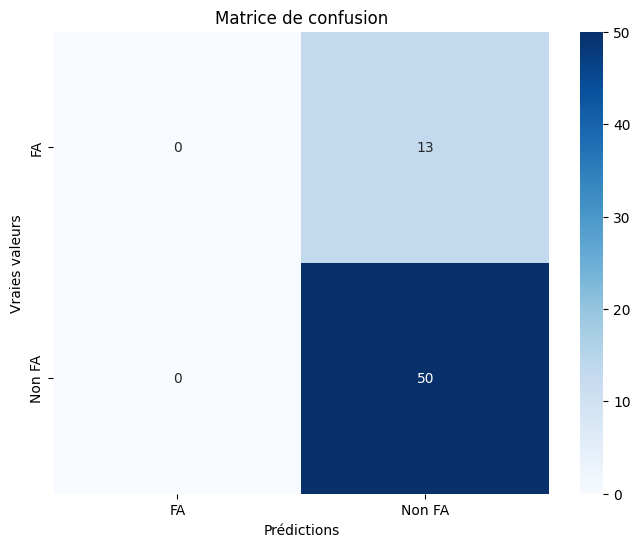

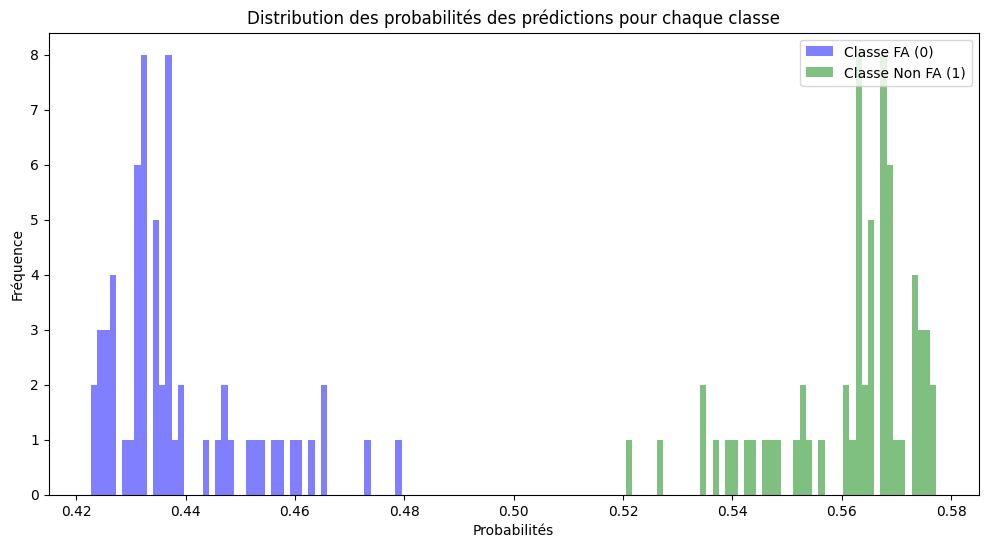

In [33]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = XGBClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Graphique de RFECV
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith Random Forest")
plt.show()

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

print(X_filtered_reduced)
grid_search = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for XGBoost: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low=0.48, threshold_high=0.52):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

proba_FA = y_proba[:, 0]
proba_Non_FA = y_proba[:, 1]

# Création de l'histogramme pour visualiser les distributions de probabilités
plt.figure(figsize=(12, 6))

# Histogramme 
plt.hist(proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

# Appliquer la fonction de rejet
y_pred_with_rejection = predict_with_rejection(y_proba)

# Filtrer les prédictions et les vraies valeurs pour exclure les "Indetermine"
filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']

# Rapport de classification
accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
print("Accuracy après filtrage:", accuracy)
print("Rapport de classification :\n", class_report)

# Visualisation de la matrice de confusion
conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
plt.title('Matrice de confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vraies valeurs')
plt.show()

# Histogramme
plt.figure(figsize=(12, 6))

# Filtrage des probabilités
filtered_proba_FA = [p for p in proba_FA if p < 0.48 or p > 0.52]
filtered_proba_Non_FA = [p for p in proba_Non_FA if p < 0.48 or p > 0.52]

plt.hist(filtered_proba_FA, bins=50, alpha=0.5, label='Classe FA (0)', color='blue')
plt.hist(filtered_proba_Non_FA, bins=50, alpha=0.5, label='Classe Non FA (1)', color='green')

plt.title('Distribution des probabilités des prédictions pour chaque classe')
plt.xlabel('Probabilités')
plt.ylabel('Fréquence')
plt.legend(loc='upper right')

plt.show()

## Feature selection avec courbe accuracy/taux de rejet pour random forest

Optimal number of features: 4
Best accuracy: 0.8300


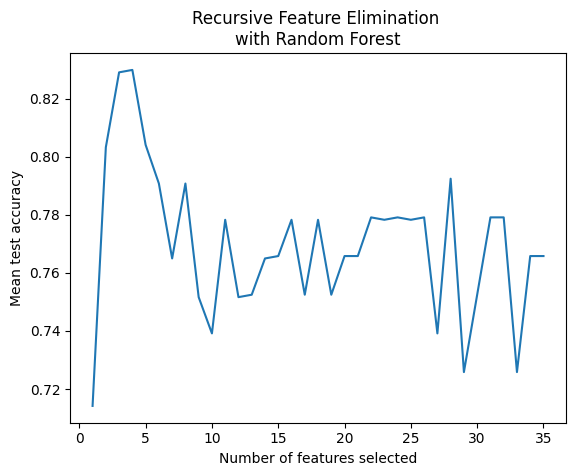

     di_rv_imc  ecpl_bio_crea  ecpl_bio_ntprobnp  adm_ec_age
6         24.3          114.0              270.0          80
8         21.3           47.0               40.0          44
36        23.7           96.0              134.0          67
55        30.7           59.0              421.0          68
68        24.9          101.0              518.0          74
..         ...            ...                ...         ...
268       29.1           86.0              688.0          77
269       27.4           86.0              134.0          77
270       33.4           66.0               15.0          62
271       26.0           65.0              145.0          76
272       26.6           78.0               42.0          76

[77 rows x 4 columns]
Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 10}
Accuracy avant filtrage: 0.8441558441558441

Thresholds: 0.5 - 0.5
Acc

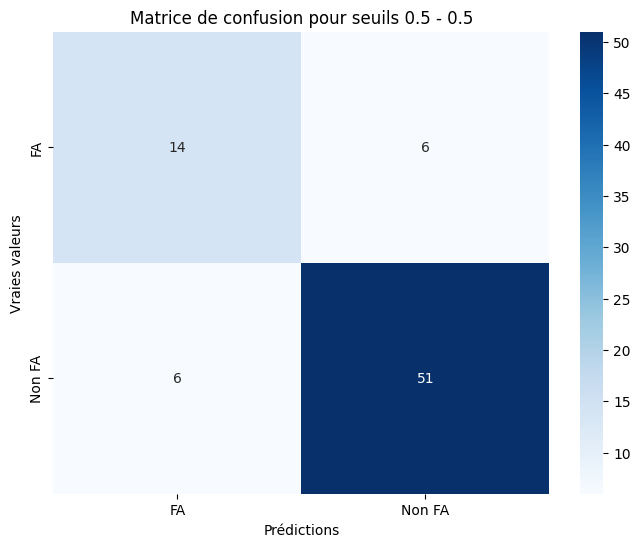

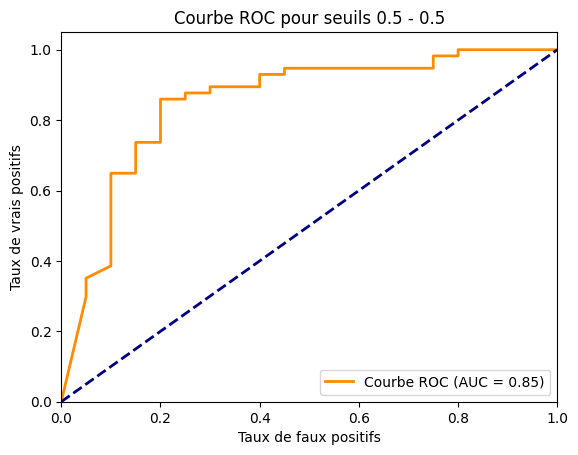

Taux de rejet: 0.0

Thresholds: 0.48 - 0.52
Accuracy après filtrage: 0.8421052631578947
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.70      0.70        20
      Non FA       0.89      0.89      0.89        56

    accuracy                           0.84        76
   macro avg       0.80      0.80      0.80        76
weighted avg       0.84      0.84      0.84        76



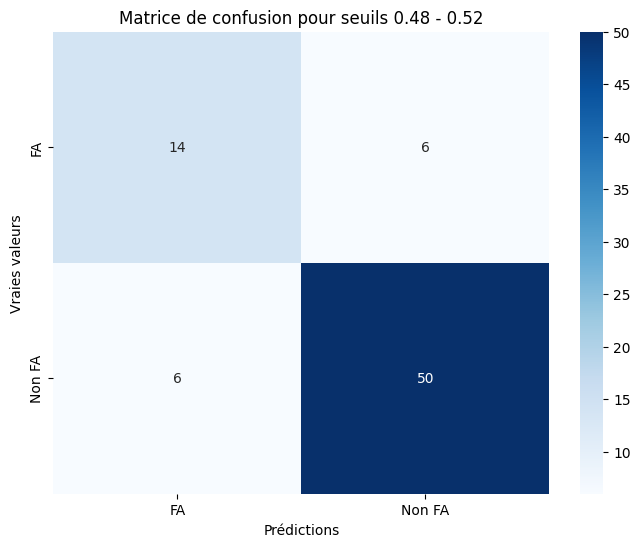

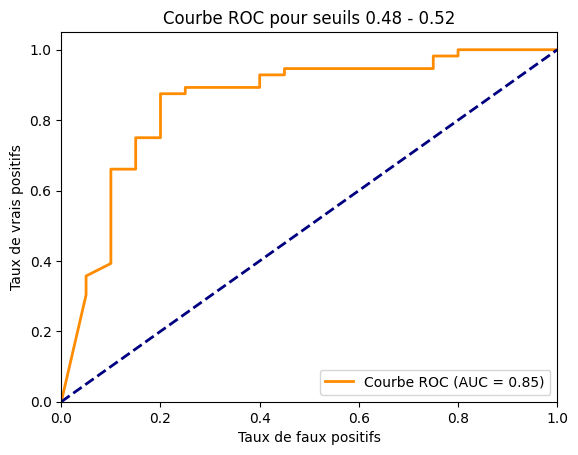

Taux de rejet: 0.012987012987012991

Thresholds: 0.46 - 0.54
Accuracy après filtrage: 0.8513513513513513
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.68      0.72      0.70        18
      Non FA       0.91      0.89      0.90        56

    accuracy                           0.85        74
   macro avg       0.80      0.81      0.80        74
weighted avg       0.85      0.85      0.85        74



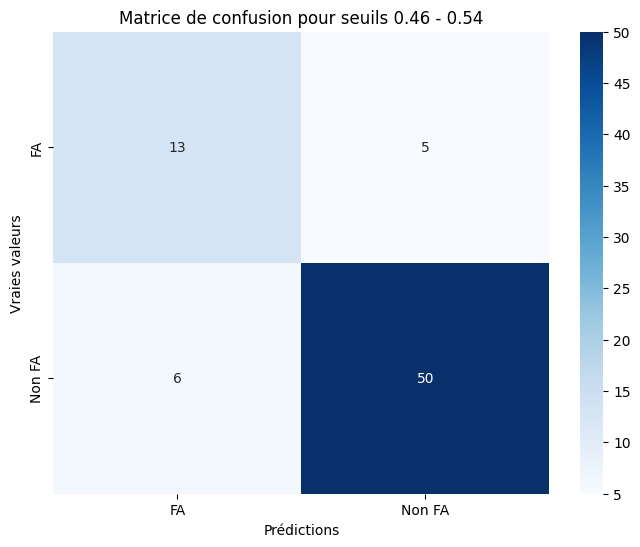

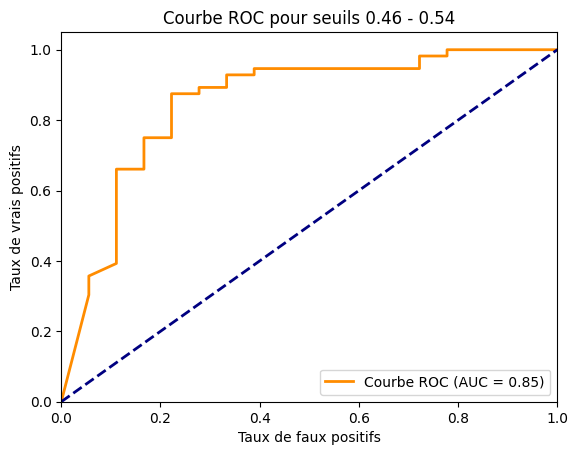

Taux de rejet: 0.038961038961038974

Thresholds: 0.44 - 0.56
Accuracy après filtrage: 0.8493150684931506
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        56

    accuracy                           0.85        73
   macro avg       0.79      0.80      0.79        73
weighted avg       0.85      0.85      0.85        73



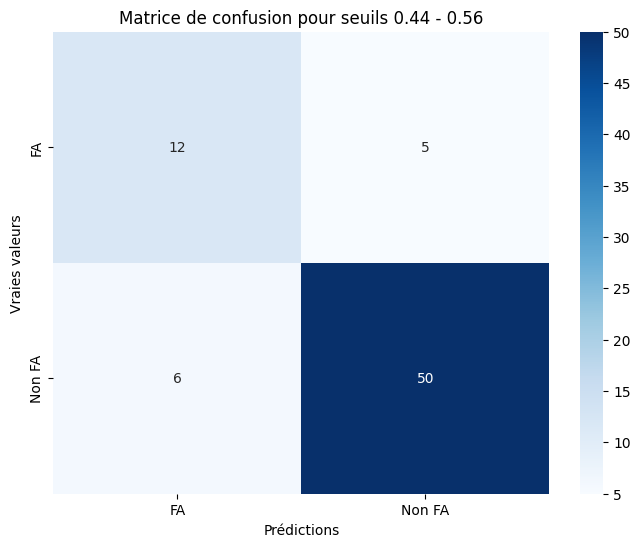

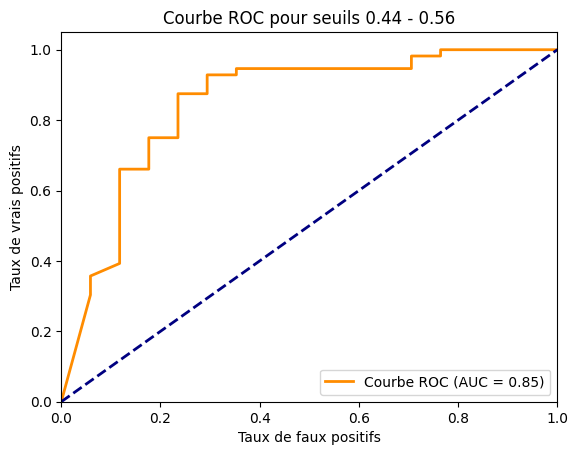

Taux de rejet: 0.051948051948051965

Thresholds: 0.42 - 0.58
Accuracy après filtrage: 0.8472222222222222
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        55

    accuracy                           0.85        72
   macro avg       0.79      0.80      0.79        72
weighted avg       0.85      0.85      0.85        72



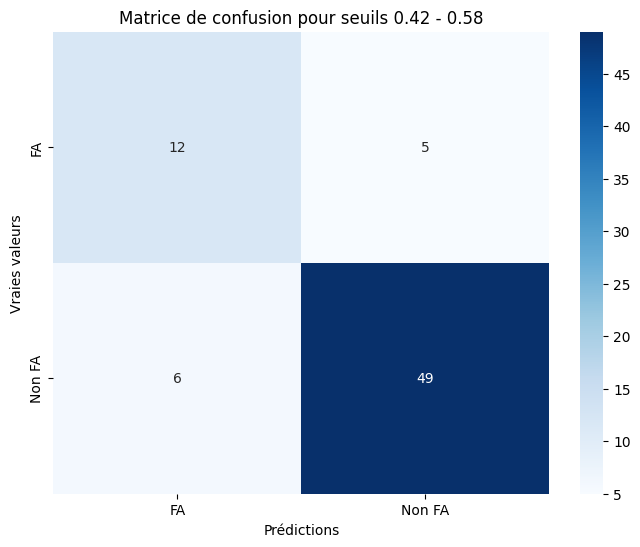

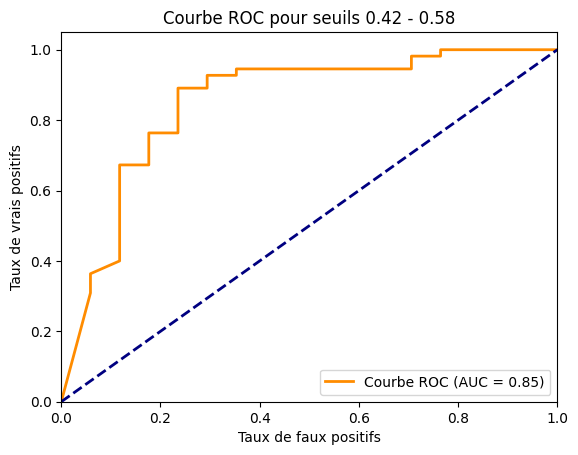

Taux de rejet: 0.06493506493506496

Thresholds: 0.4 - 0.6
Accuracy après filtrage: 0.8472222222222222
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        55

    accuracy                           0.85        72
   macro avg       0.79      0.80      0.79        72
weighted avg       0.85      0.85      0.85        72



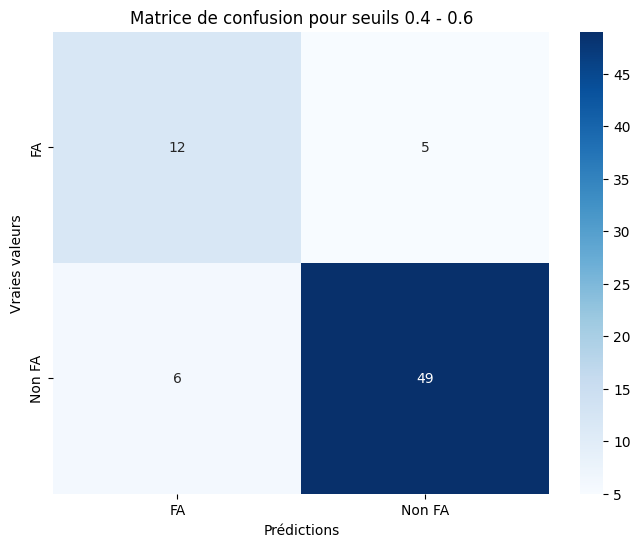

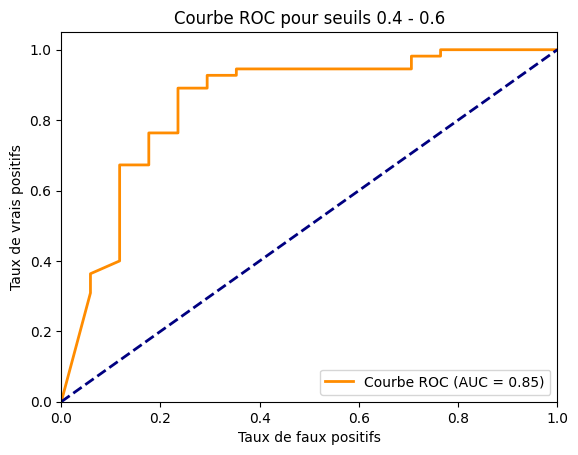

Taux de rejet: 0.06493506493506496


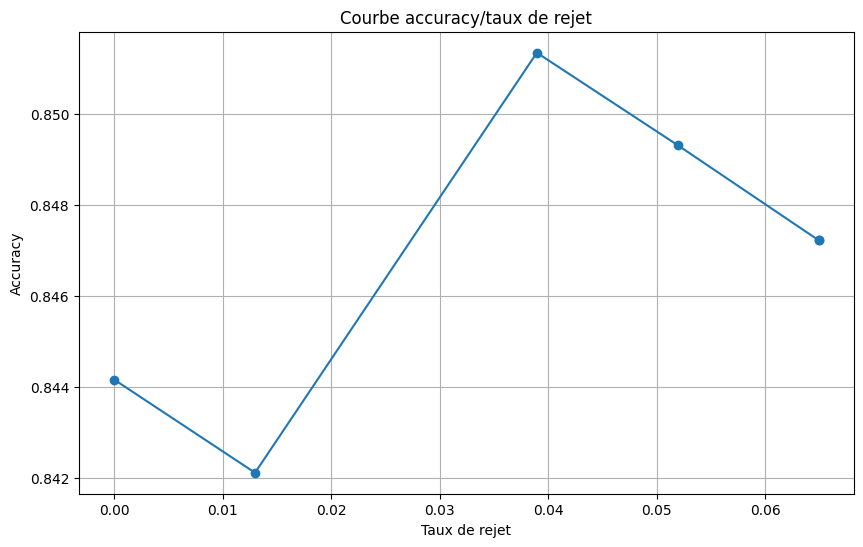

In [9]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = RandomForestClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Graphique de RFECV
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith Random Forest")
plt.show()

# Créer le pipeline avec les caractéristiques sélectionnées
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Paramètres pour GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

print(X_filtered_reduced)

grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low, threshold_high):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

# Plages de taux de rejet spécifiques
thresholds = [(0.5, 0.5), (0.48, 0.52), (0.46, 0.54), (0.44, 0.56), (0.42, 0.58), (0.4, 0.6)]

rejection_rates = []
accuracies = []

for (threshold_low, threshold_high) in thresholds:
    print(f"\nThresholds: {threshold_low} - {threshold_high}")
    y_pred_with_rejection = predict_with_rejection(y_proba, threshold_low, threshold_high)
    filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
    filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']
    
    if len(filtered_y_pred) > 0:  # Pour éviter la division par zéro
        accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
        print(f"Accuracy après filtrage: {accuracy}")
        class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
        print("Rapport de classification :\n", class_report)
        
        # Matrice de confusion
        conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
        plt.title(f'Matrice de confusion pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Prédictions')
        plt.ylabel('Vraies valeurs')
        plt.show()
        
        # Filtrer les probabilités pour la courbe ROC
        filtered_y_probas = [proba for proba, pred in zip(y_proba, y_pred_with_rejection) if pred != 'Indetermine']
        
        # Courbe ROC
        fpr, tpr, _ = roc_curve(filtered_y_true, [proba[1] for proba in filtered_y_probas])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title(f'Courbe ROC pour seuils {threshold_low} - {threshold_high}')
        plt.legend(loc="lower right")
        plt.show()

        # Taux de rejet
        rejection_rate = 1 - len(filtered_y_pred) / len(y_filtered)
        print(f"Taux de rejet: {rejection_rate}")
        rejection_rates.append(rejection_rate)
        accuracies.append(accuracy)

# Courbe accuracy/taux de rejet
plt.figure(figsize=(10, 6))
plt.plot(rejection_rates, accuracies, marker='o')
plt.xlabel('Taux de rejet')
plt.ylabel('Accuracy')
plt.title('Courbe accuracy/taux de rejet')
plt.grid(True)
plt.show()

Optimal number of features: 3
Best accuracy: 0.8425
Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 17}
Accuracy avant filtrage: 0.8311688311688312

Thresholds: 0.0 - 1.0
Accuracy après filtrage: 1.0
Rapport de classification :
               precision    recall  f1-score   support

          FA       1.00      1.00      1.00         1
      Non FA       1.00      1.00      1.00        18

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19



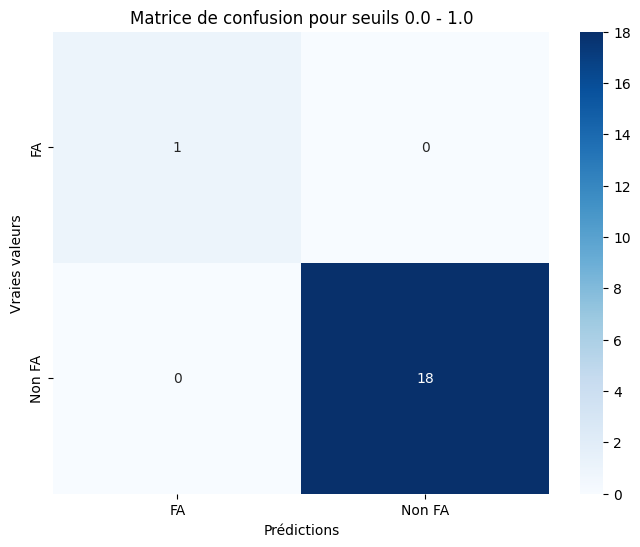

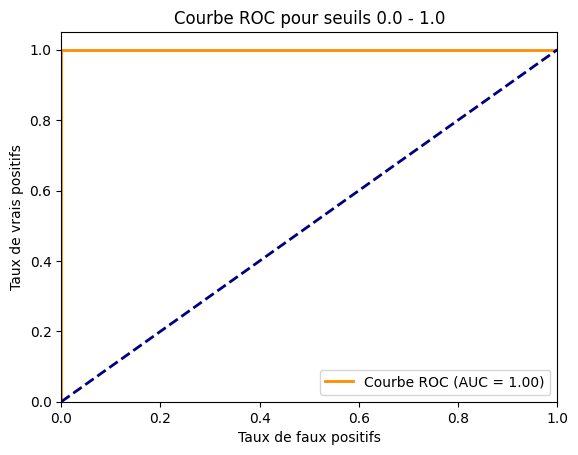

Taux de rejet: 0.7532467532467533


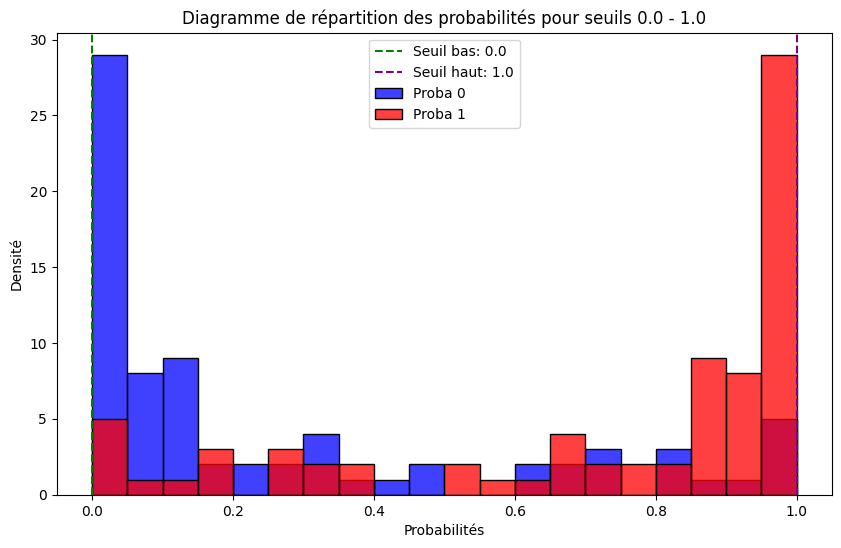


Thresholds: 0.025 - 0.975
Accuracy après filtrage: 0.9285714285714286
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.67      0.67         3
      Non FA       0.96      0.96      0.96        25

    accuracy                           0.93        28
   macro avg       0.81      0.81      0.81        28
weighted avg       0.93      0.93      0.93        28



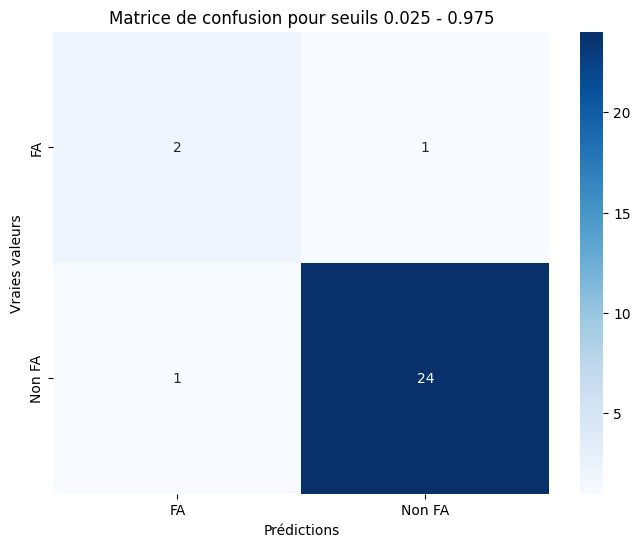

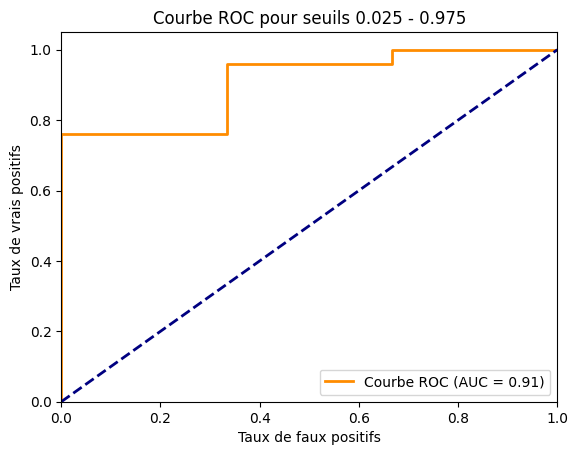

Taux de rejet: 0.6363636363636364


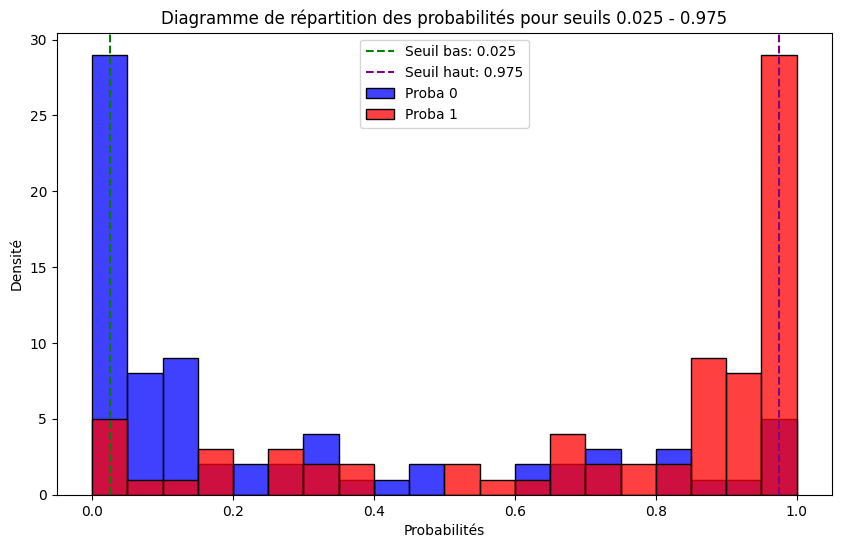


Thresholds: 0.05 - 0.95
Accuracy après filtrage: 0.9117647058823529
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.60      0.75      0.67         4
      Non FA       0.97      0.93      0.95        30

    accuracy                           0.91        34
   macro avg       0.78      0.84      0.81        34
weighted avg       0.92      0.91      0.92        34



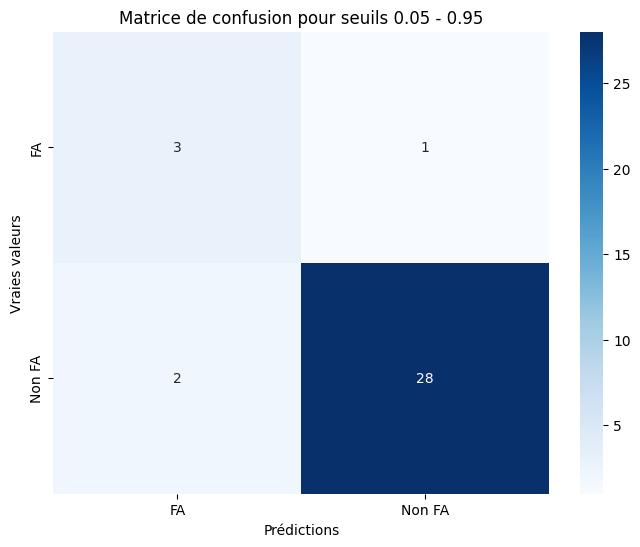

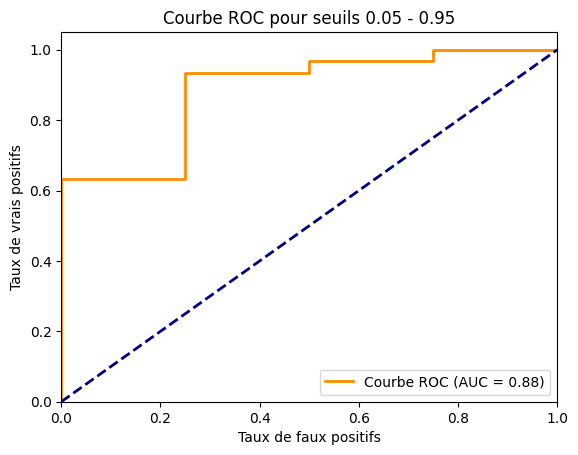

Taux de rejet: 0.5584415584415585


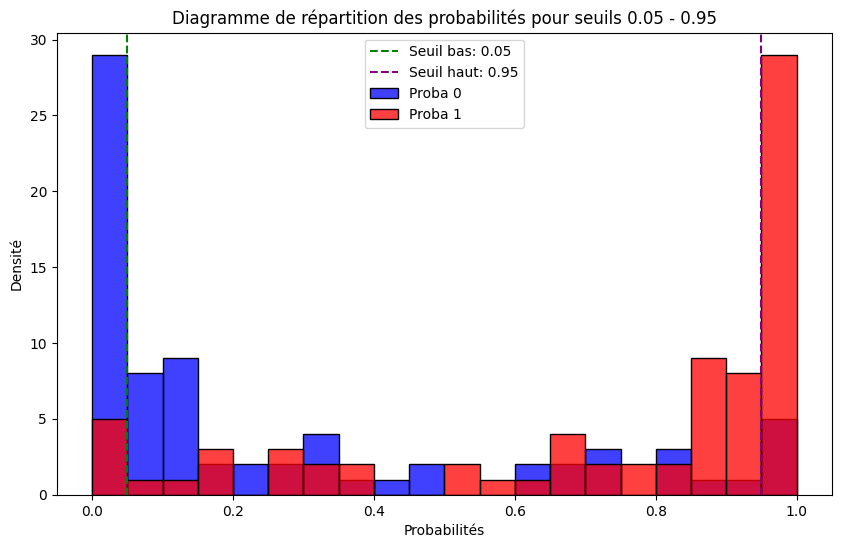


Thresholds: 0.075 - 0.925
Accuracy après filtrage: 0.9
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.67      0.67         6
      Non FA       0.94      0.94      0.94        34

    accuracy                           0.90        40
   macro avg       0.80      0.80      0.80        40
weighted avg       0.90      0.90      0.90        40



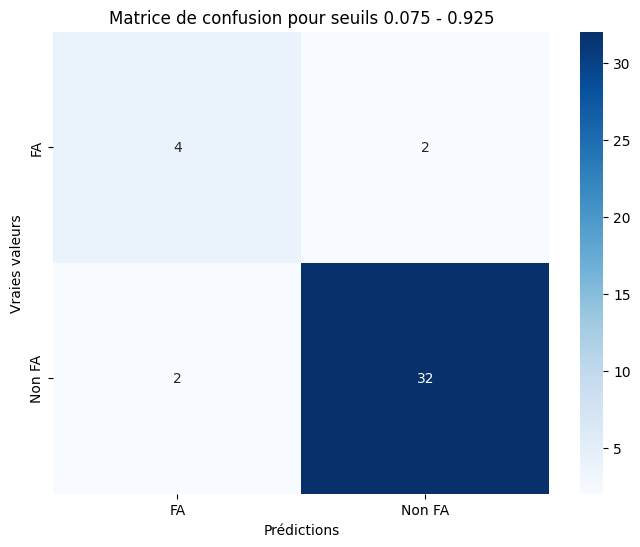

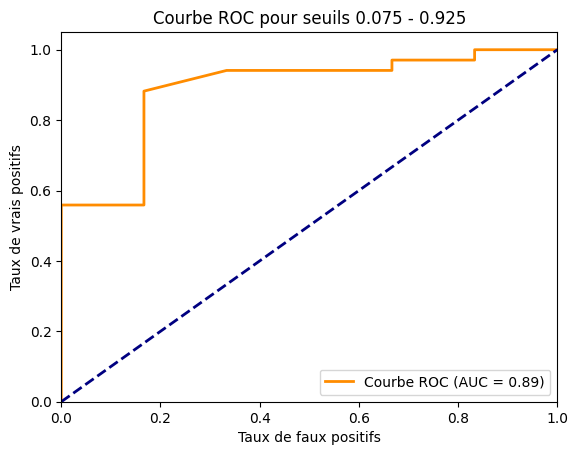

Taux de rejet: 0.48051948051948057


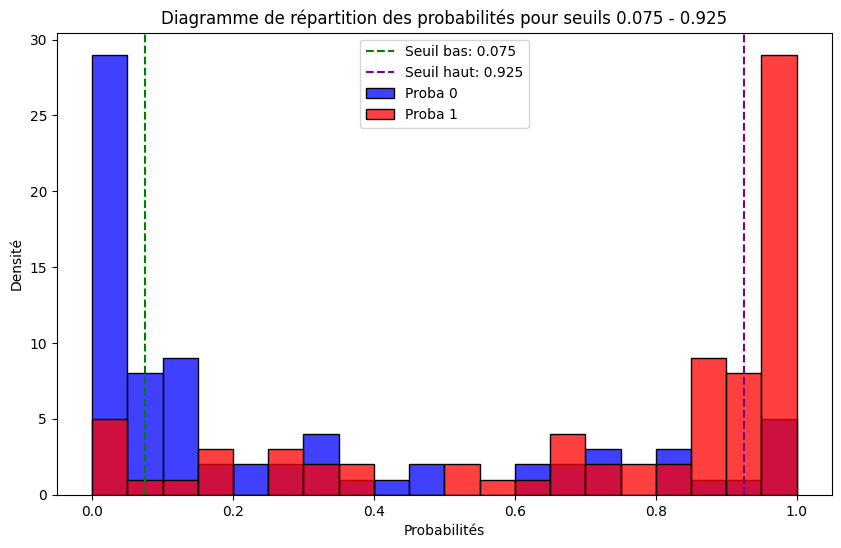


Thresholds: 0.1 - 0.9
Accuracy après filtrage: 0.9069767441860465
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.67      0.67         6
      Non FA       0.95      0.95      0.95        37

    accuracy                           0.91        43
   macro avg       0.81      0.81      0.81        43
weighted avg       0.91      0.91      0.91        43



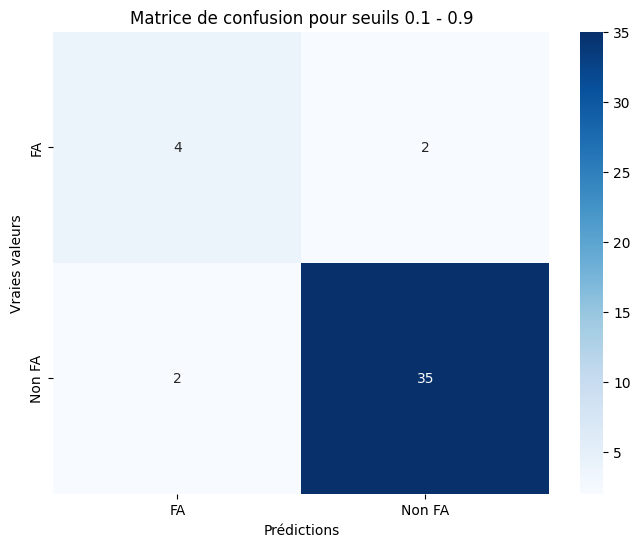

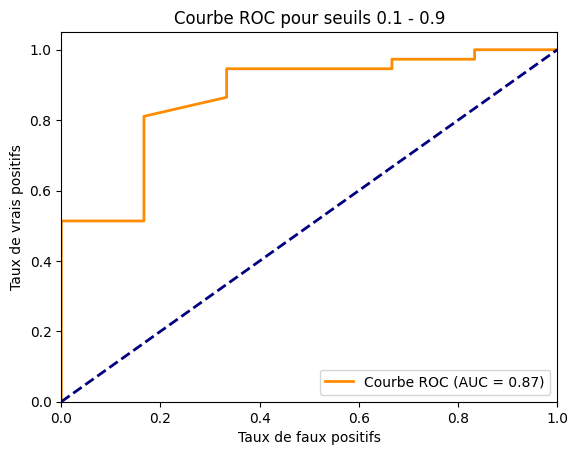

Taux de rejet: 0.4415584415584416


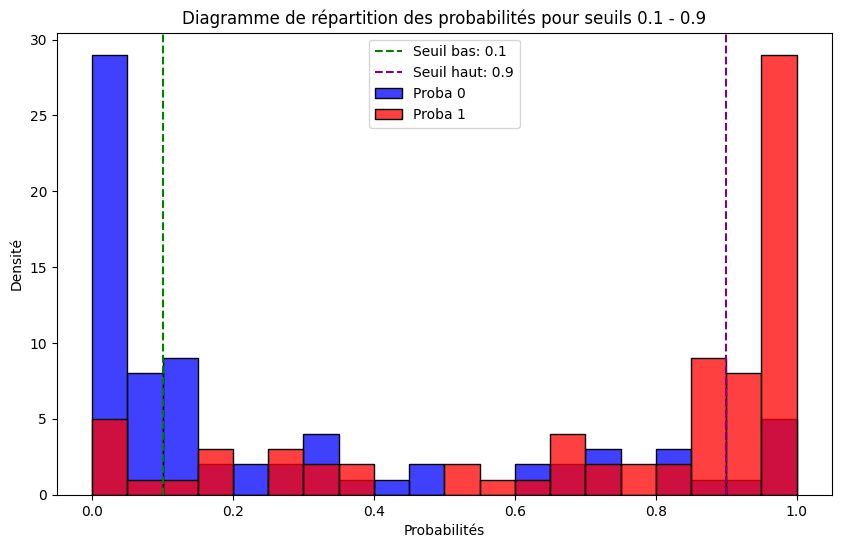


Thresholds: 0.125 - 0.875
Accuracy après filtrage: 0.8478260869565217
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.57      0.50      0.53         8
      Non FA       0.90      0.92      0.91        38

    accuracy                           0.85        46
   macro avg       0.73      0.71      0.72        46
weighted avg       0.84      0.85      0.84        46



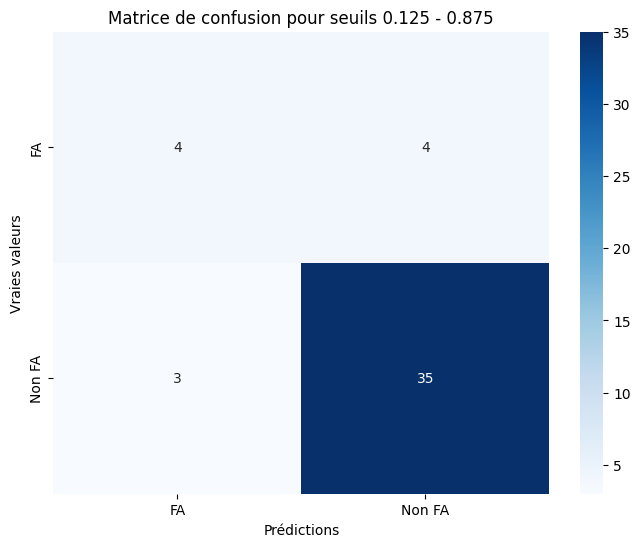

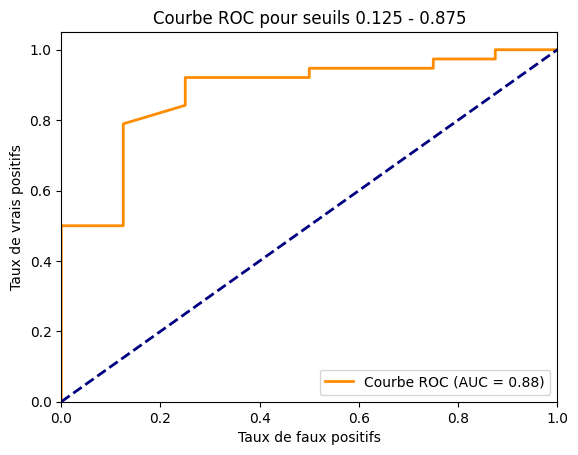

Taux de rejet: 0.4025974025974026


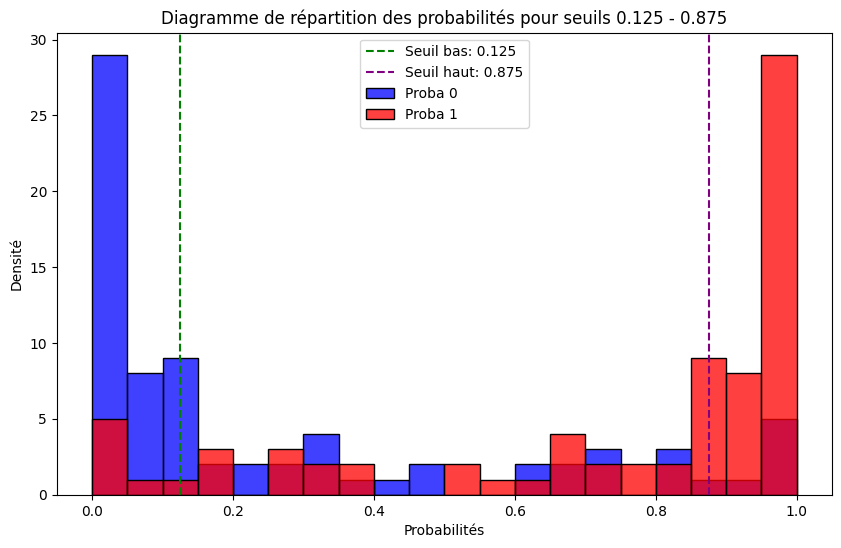


Thresholds: 0.15 - 0.85
Accuracy après filtrage: 0.8490566037735849
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.57      0.44      0.50         9
      Non FA       0.89      0.93      0.91        44

    accuracy                           0.85        53
   macro avg       0.73      0.69      0.71        53
weighted avg       0.84      0.85      0.84        53



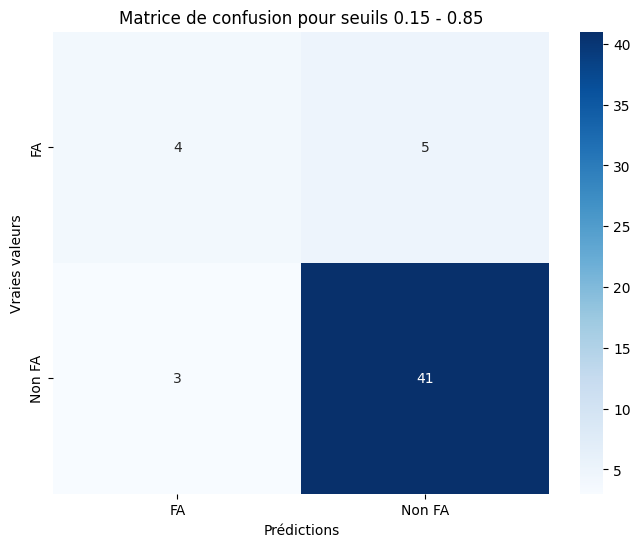

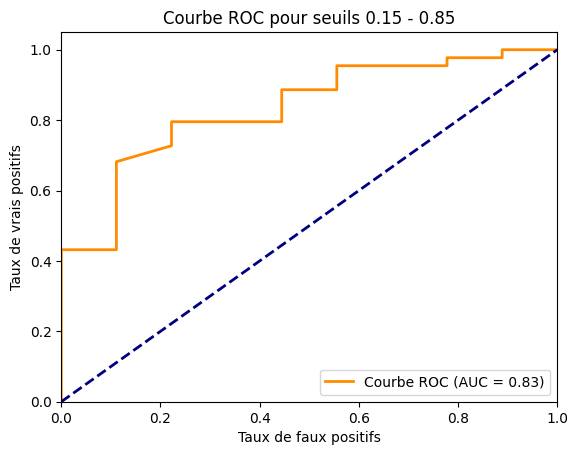

Taux de rejet: 0.3116883116883117


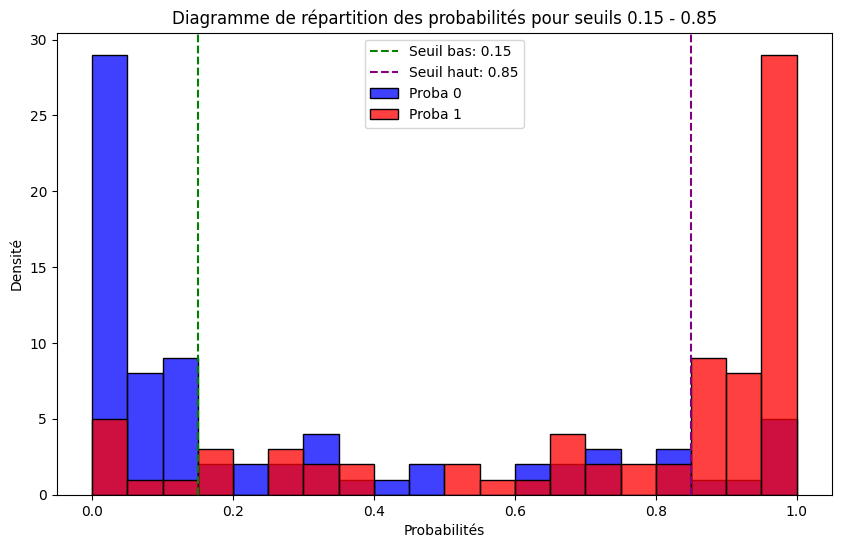


Thresholds: 0.175 - 0.825
Accuracy après filtrage: 0.8545454545454545
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.55      0.60        11
      Non FA       0.89      0.93      0.91        44

    accuracy                           0.85        55
   macro avg       0.78      0.74      0.76        55
weighted avg       0.85      0.85      0.85        55



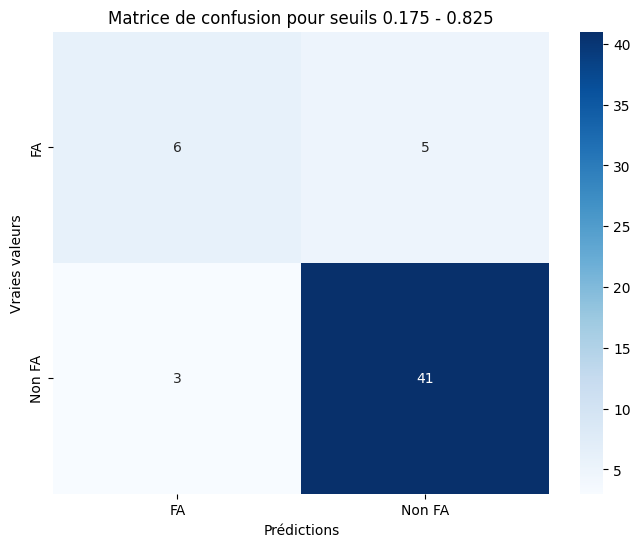

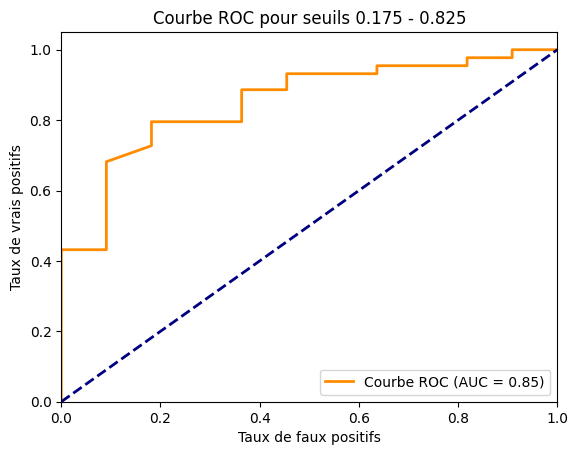

Taux de rejet: 0.2857142857142857


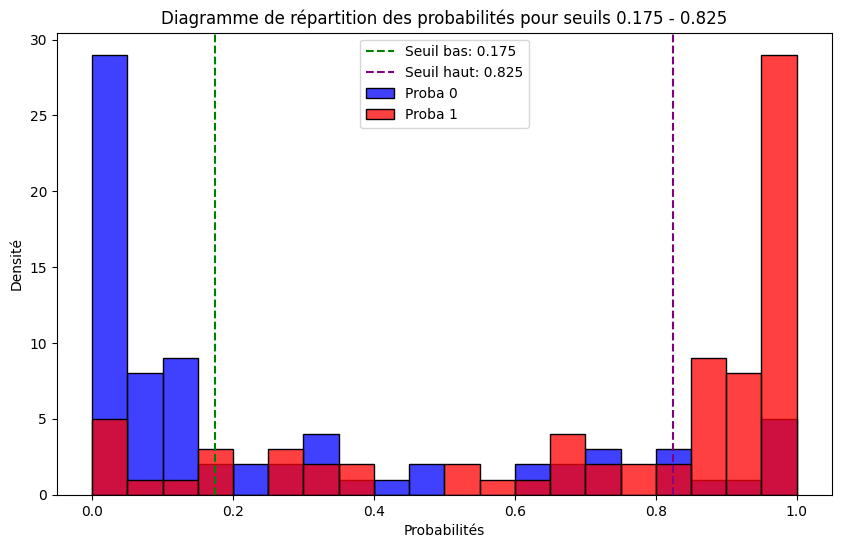


Thresholds: 0.2 - 0.8
Accuracy après filtrage: 0.8448275862068966
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.54      0.61        13
      Non FA       0.88      0.93      0.90        45

    accuracy                           0.84        58
   macro avg       0.79      0.74      0.76        58
weighted avg       0.84      0.84      0.84        58



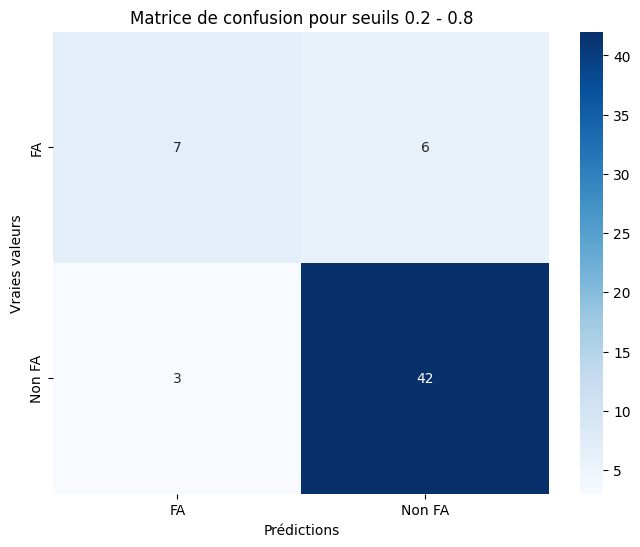

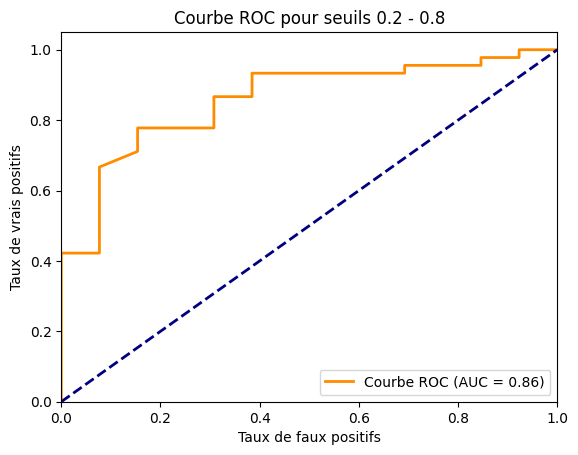

Taux de rejet: 0.24675324675324672


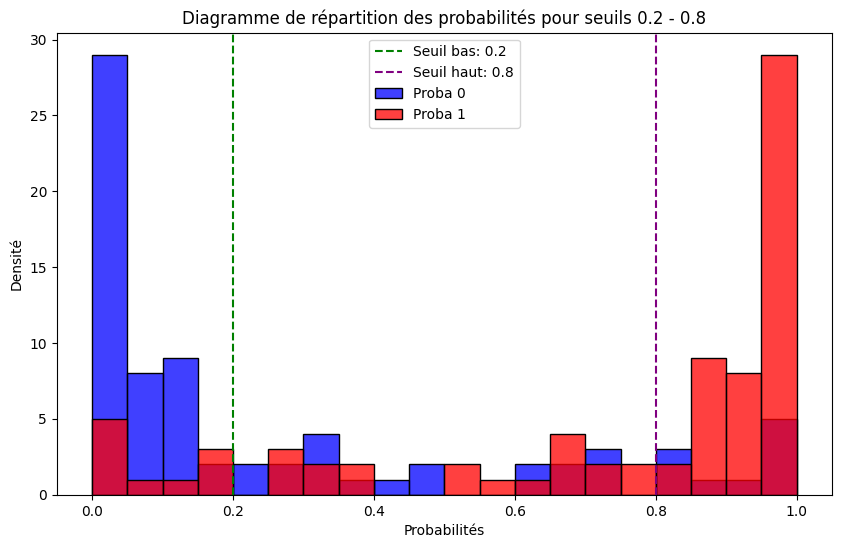


Thresholds: 0.225 - 0.775
Accuracy après filtrage: 0.847457627118644
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.54      0.61        13
      Non FA       0.88      0.93      0.91        46

    accuracy                           0.85        59
   macro avg       0.79      0.74      0.76        59
weighted avg       0.84      0.85      0.84        59



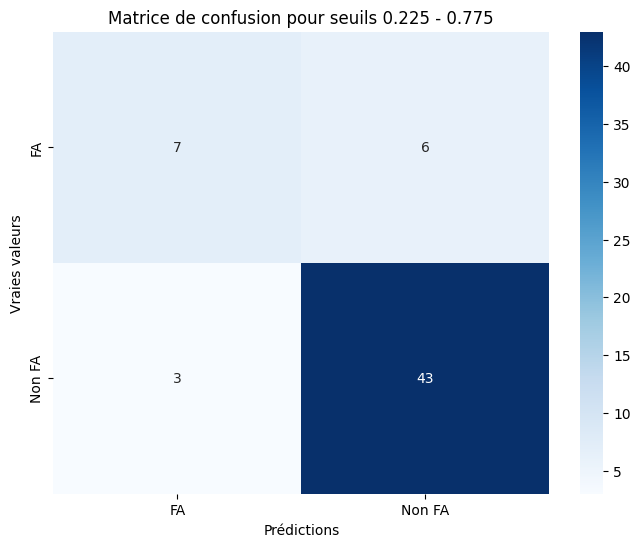

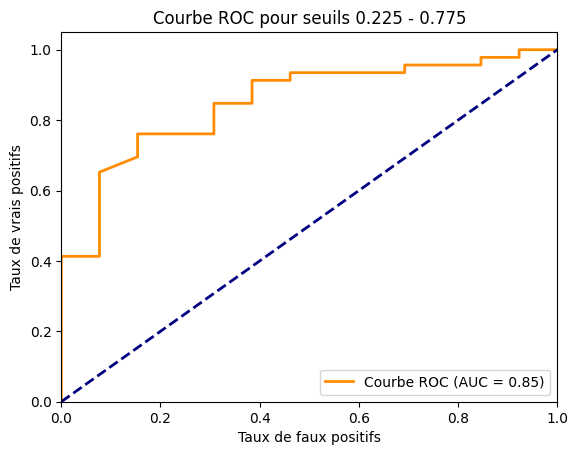

Taux de rejet: 0.23376623376623373


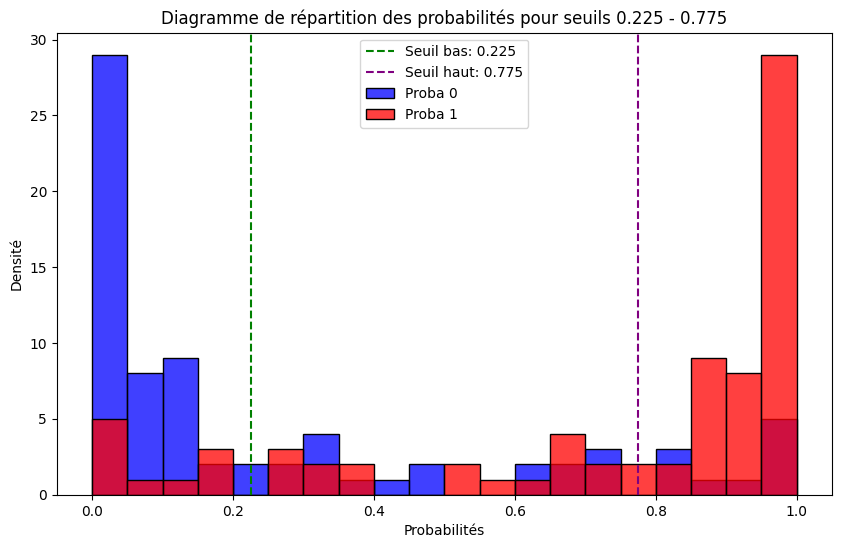


Thresholds: 0.25 - 0.75
Accuracy après filtrage: 0.85
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.54      0.61        13
      Non FA       0.88      0.94      0.91        47

    accuracy                           0.85        60
   macro avg       0.79      0.74      0.76        60
weighted avg       0.84      0.85      0.84        60



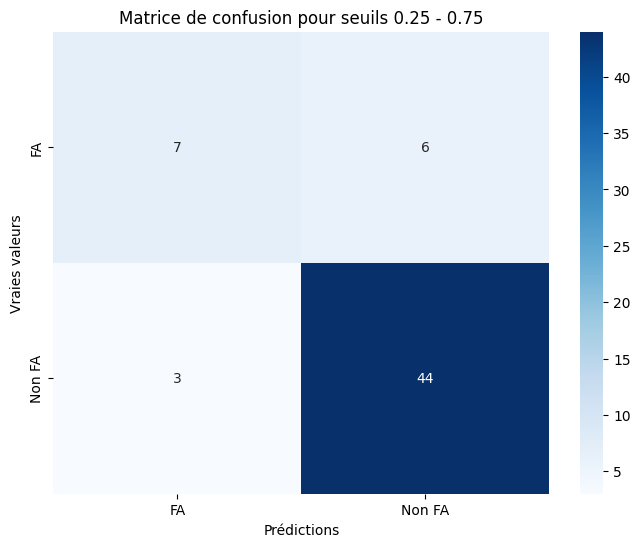

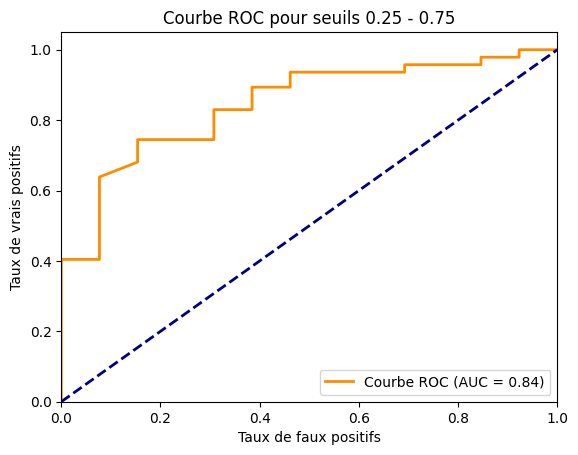

Taux de rejet: 0.22077922077922074


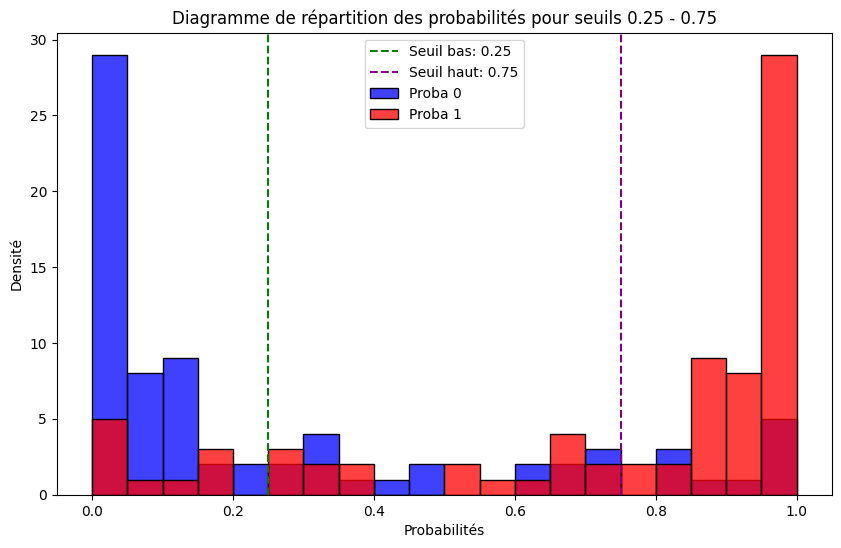


Thresholds: 0.275 - 0.725
Accuracy après filtrage: 0.8387096774193549
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.53      0.62        15
      Non FA       0.86      0.94      0.90        47

    accuracy                           0.84        62
   macro avg       0.80      0.73      0.76        62
weighted avg       0.83      0.84      0.83        62



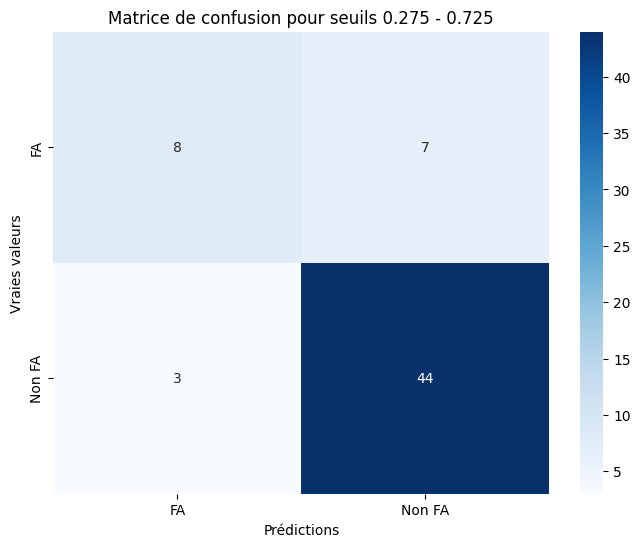

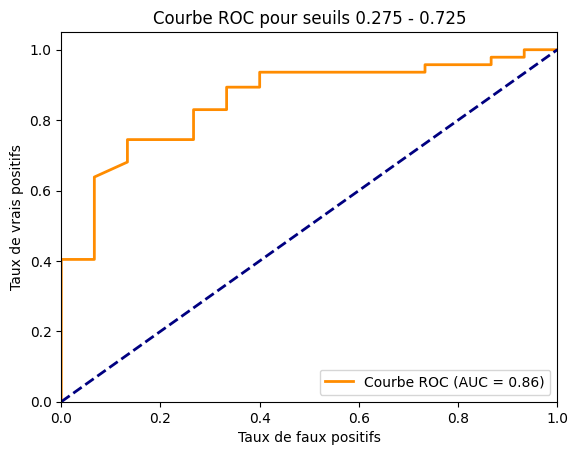

Taux de rejet: 0.19480519480519476


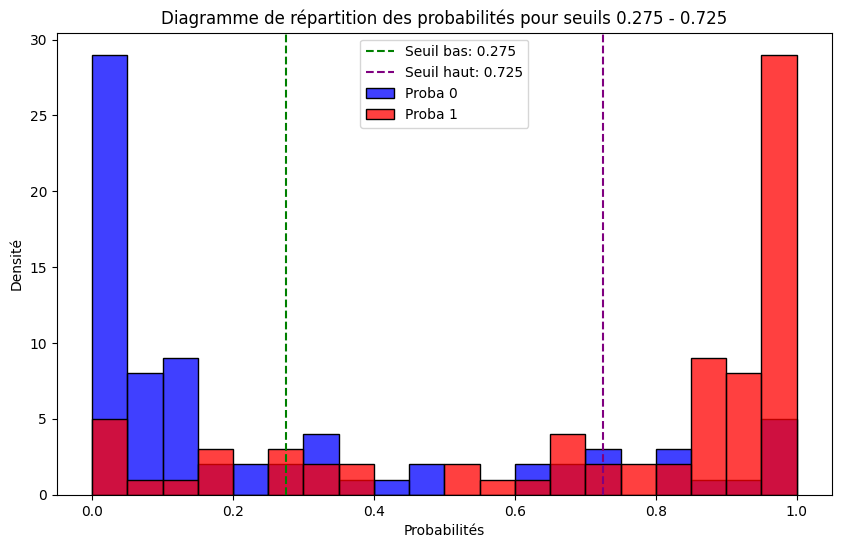


Thresholds: 0.3 - 0.7
Accuracy après filtrage: 0.8461538461538461
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.77      0.59      0.67        17
      Non FA       0.87      0.94      0.90        48

    accuracy                           0.85        65
   macro avg       0.82      0.76      0.78        65
weighted avg       0.84      0.85      0.84        65



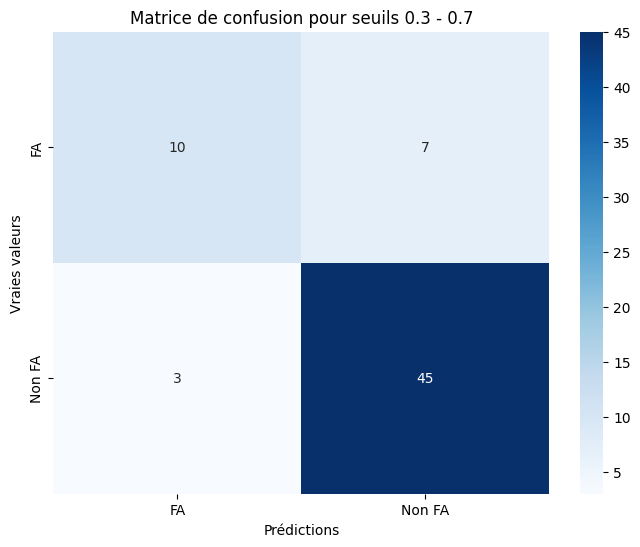

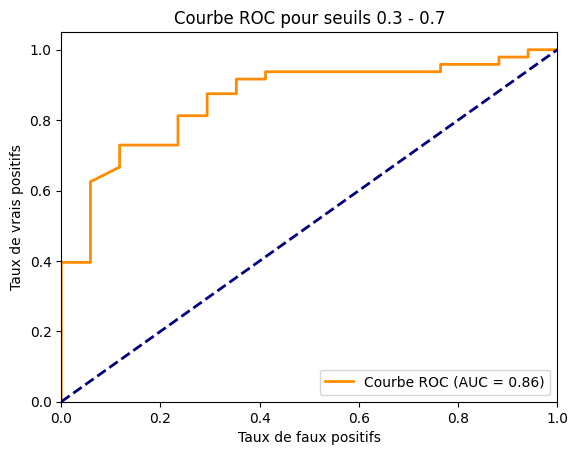

Taux de rejet: 0.1558441558441559


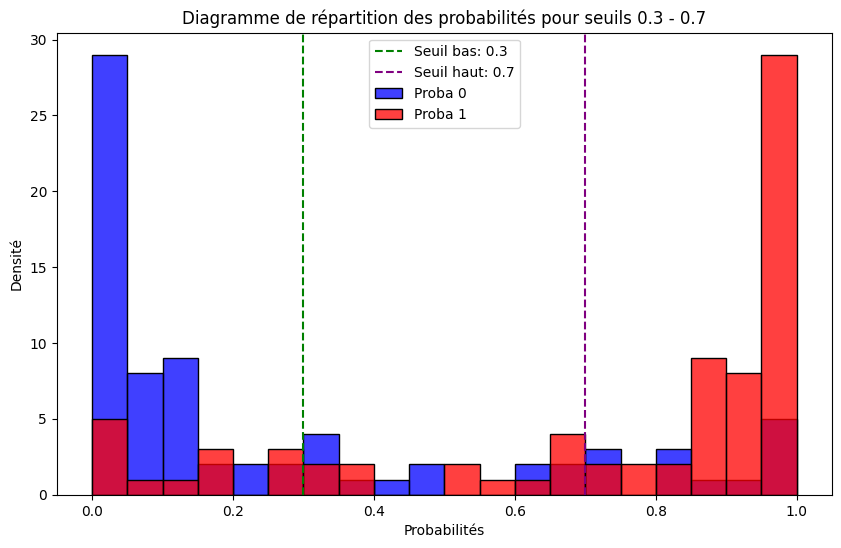


Thresholds: 0.325 - 0.675
Accuracy après filtrage: 0.8285714285714286
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.58      0.65        19
      Non FA       0.85      0.92      0.89        51

    accuracy                           0.83        70
   macro avg       0.79      0.75      0.77        70
weighted avg       0.82      0.83      0.82        70



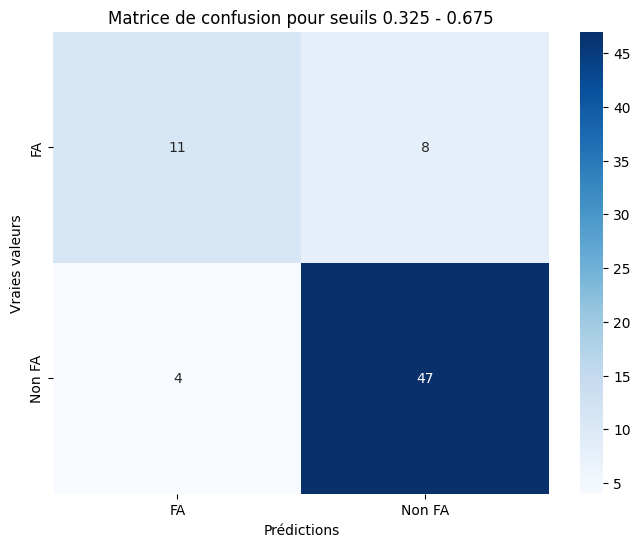

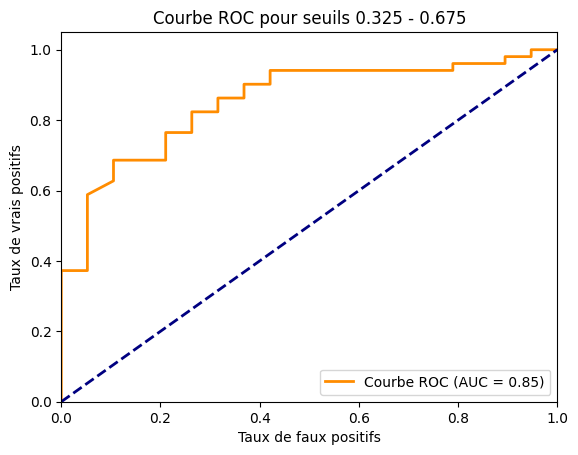

Taux de rejet: 0.09090909090909094


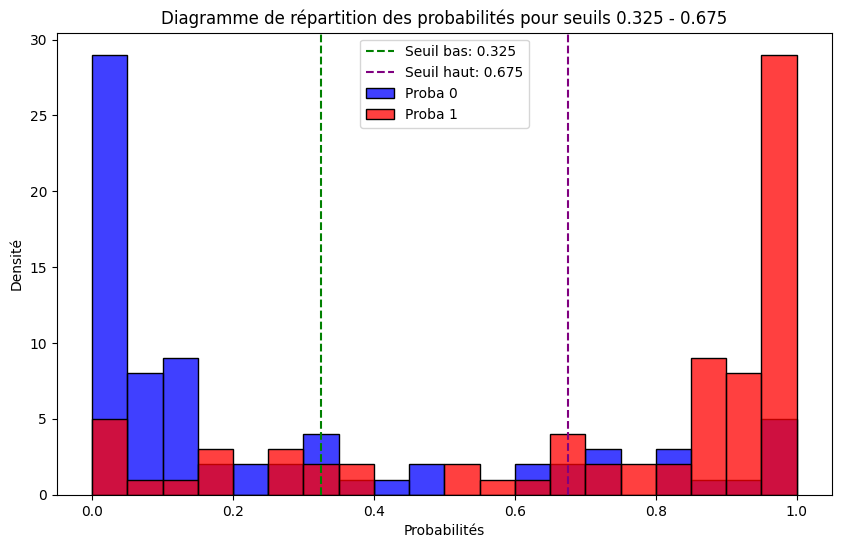


Thresholds: 0.35 - 0.65
Accuracy après filtrage: 0.8309859154929577
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.58      0.65        19
      Non FA       0.86      0.92      0.89        52

    accuracy                           0.83        71
   macro avg       0.80      0.75      0.77        71
weighted avg       0.82      0.83      0.82        71



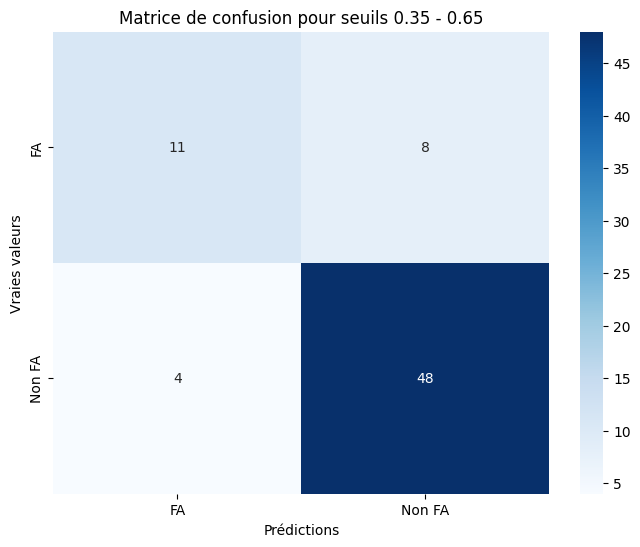

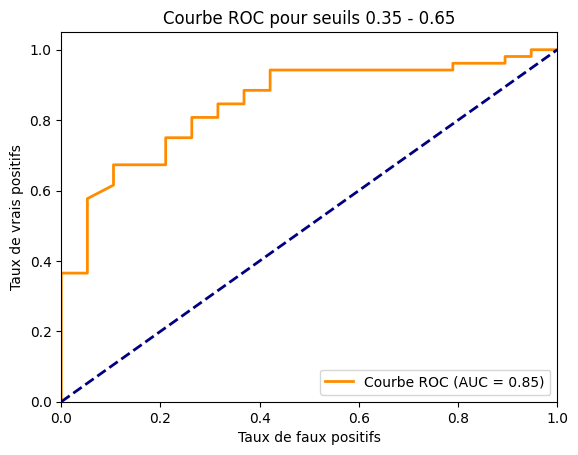

Taux de rejet: 0.07792207792207795


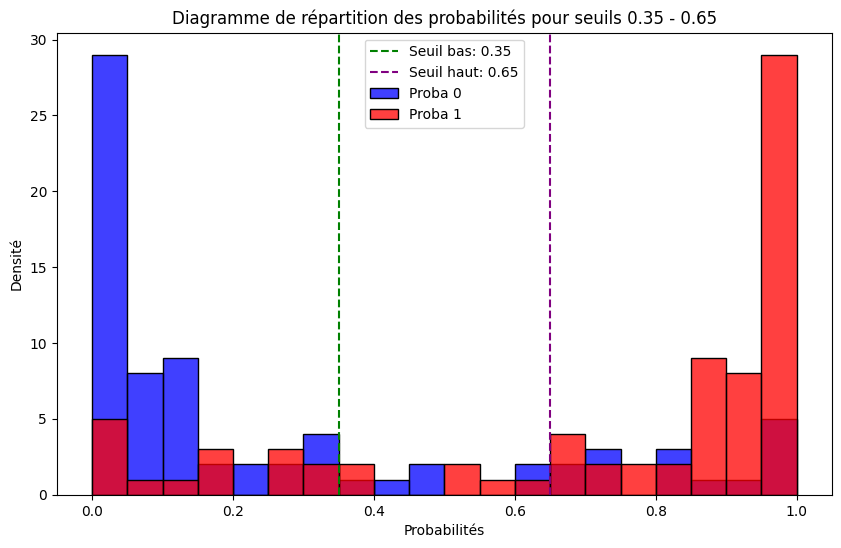


Thresholds: 0.375 - 0.625
Accuracy après filtrage: 0.8333333333333334
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.58      0.65        19
      Non FA       0.86      0.92      0.89        53

    accuracy                           0.83        72
   macro avg       0.80      0.75      0.77        72
weighted avg       0.83      0.83      0.83        72



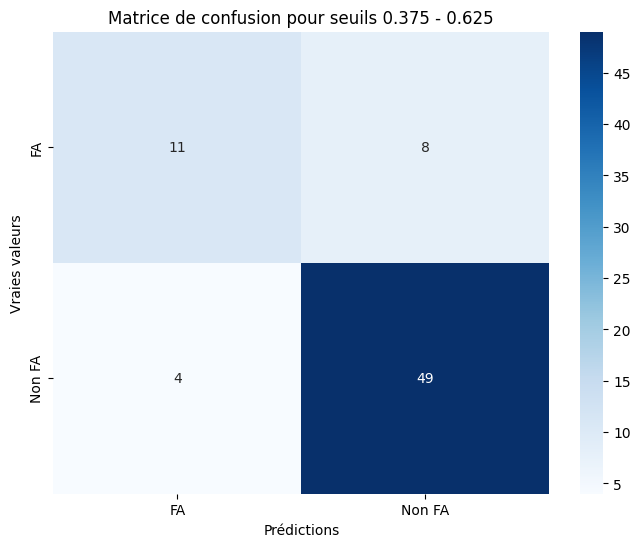

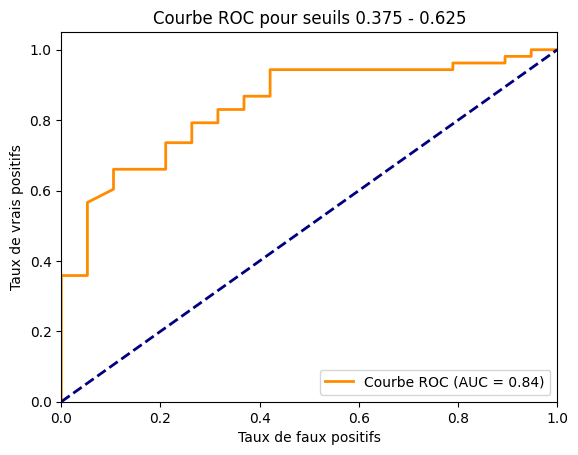

Taux de rejet: 0.06493506493506496


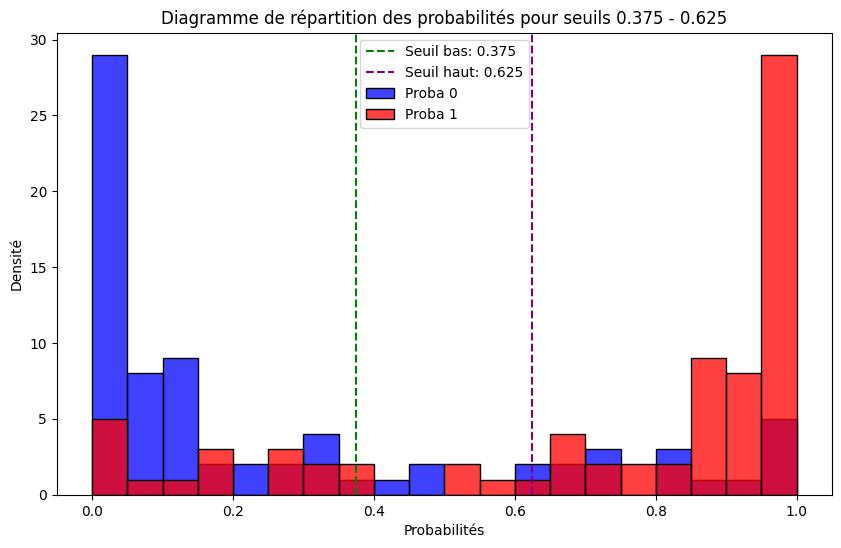


Thresholds: 0.4 - 0.6
Accuracy après filtrage: 0.8243243243243243
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.71      0.60      0.65        20
      Non FA       0.86      0.91      0.88        54

    accuracy                           0.82        74
   macro avg       0.78      0.75      0.77        74
weighted avg       0.82      0.82      0.82        74



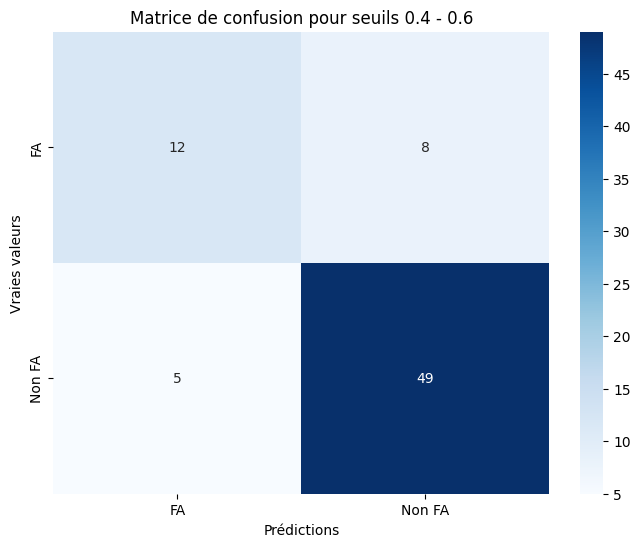

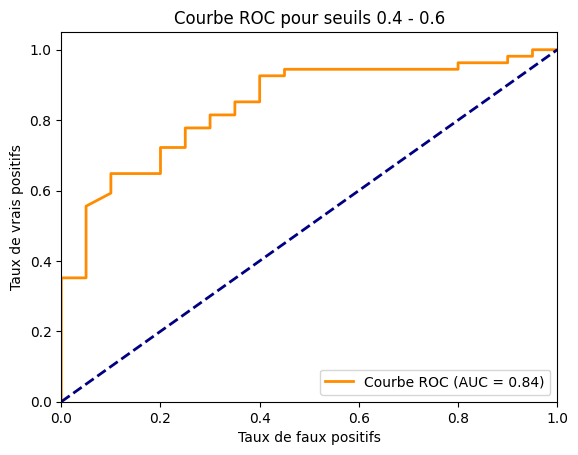

Taux de rejet: 0.038961038961038974


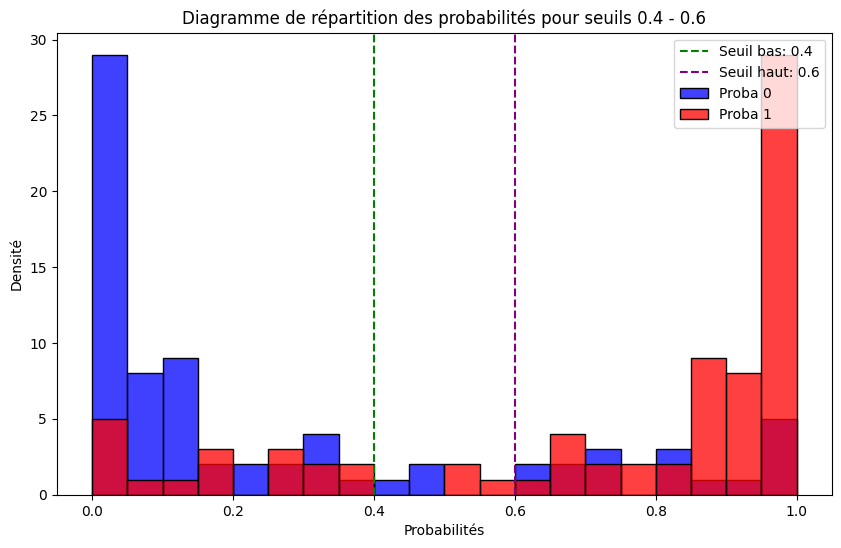


Thresholds: 0.425 - 0.575
Accuracy après filtrage: 0.8243243243243243
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.71      0.60      0.65        20
      Non FA       0.86      0.91      0.88        54

    accuracy                           0.82        74
   macro avg       0.78      0.75      0.77        74
weighted avg       0.82      0.82      0.82        74



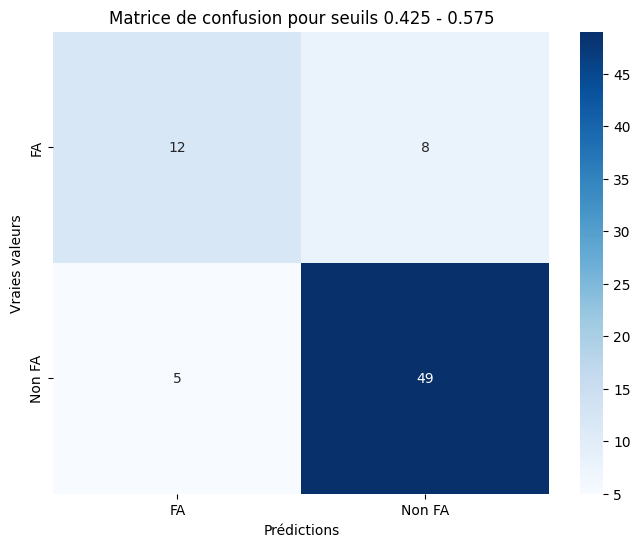

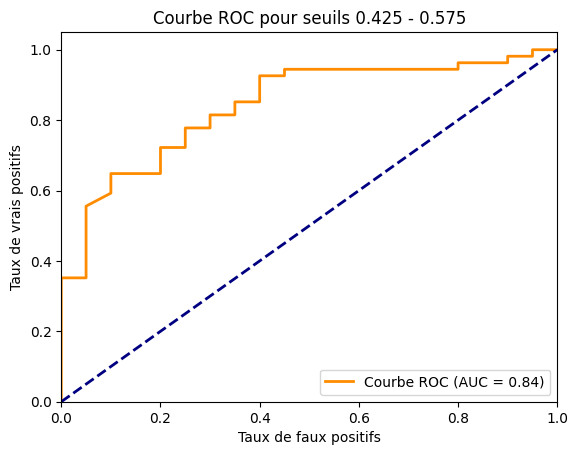

Taux de rejet: 0.038961038961038974


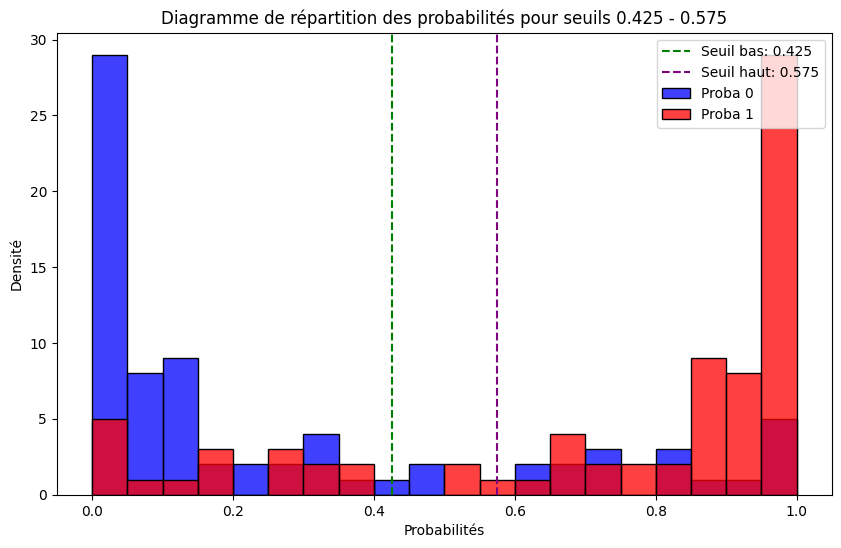


Thresholds: 0.45 - 0.55
Accuracy après filtrage: 0.8266666666666667
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.71      0.60      0.65        20
      Non FA       0.86      0.91      0.88        55

    accuracy                           0.83        75
   macro avg       0.78      0.75      0.77        75
weighted avg       0.82      0.83      0.82        75



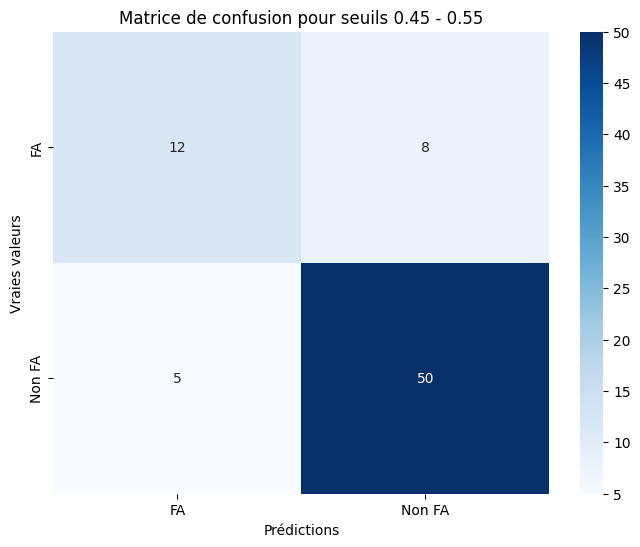

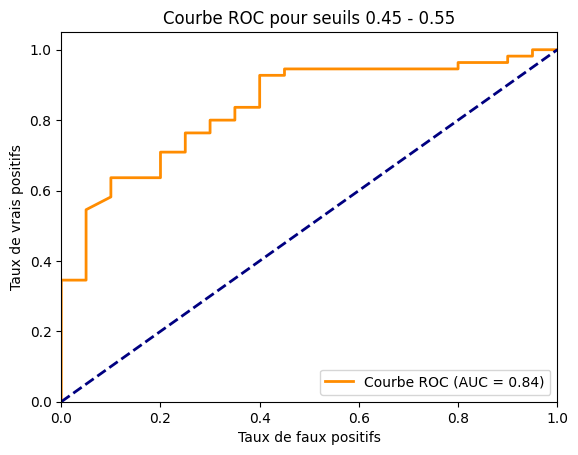

Taux de rejet: 0.025974025974025983


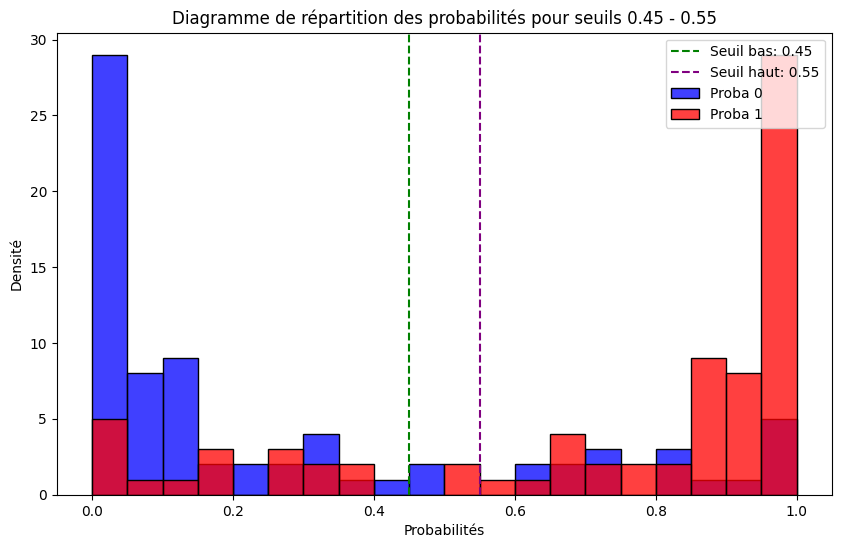


Thresholds: 0.475 - 0.525
Accuracy après filtrage: 0.8289473684210527
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.71      0.60      0.65        20
      Non FA       0.86      0.91      0.89        56

    accuracy                           0.83        76
   macro avg       0.79      0.76      0.77        76
weighted avg       0.82      0.83      0.82        76



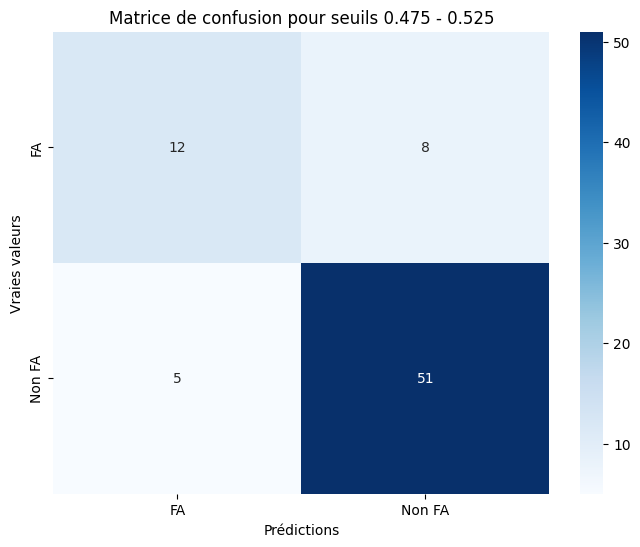

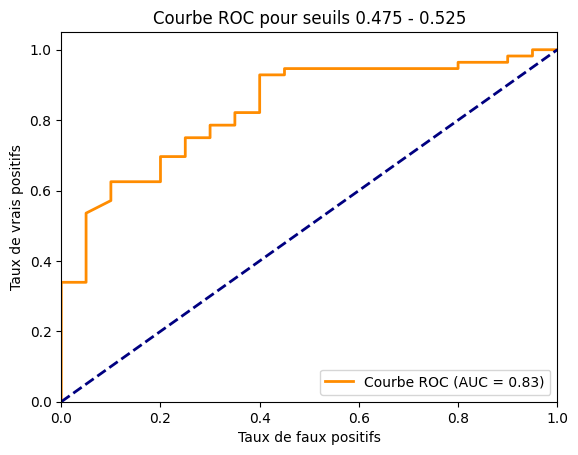

Taux de rejet: 0.012987012987012991


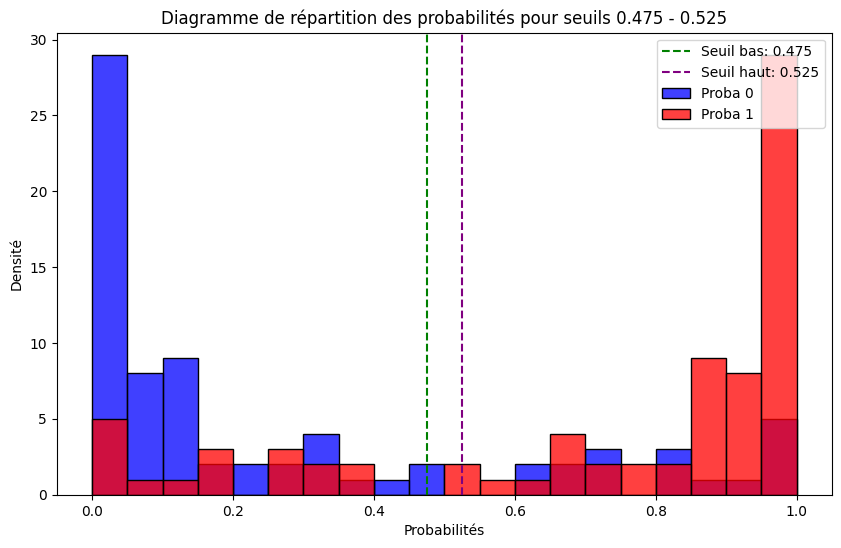

<function matplotlib.pyplot.grid(visible: 'bool | None' = None, which: "Literal['major', 'minor', 'both']" = 'major', axis: "Literal['both', 'x', 'y']" = 'both', **kwargs) -> 'None'>

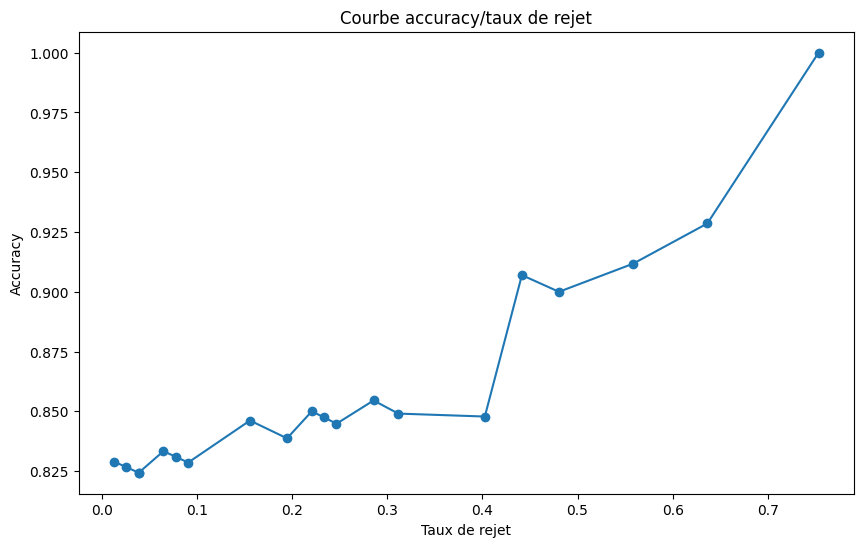

In [7]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = RandomForestClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Créer le pipeline avec les caractéristiques sélectionnées
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Paramètres pour GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low, threshold_high):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

# Étendre les plages de taux de rejet
thresholds = [(i/40.0, 1-i/40.0) for i in range(20)]  # Seuils de 0 à 0.5 avec un pas de 0.025

# Stocker les résultats pour la courbe accuracy/taux de rejet
rejection_rates = []
accuracies = []

for (threshold_low, threshold_high) in thresholds:
    if threshold_low >= 0.5:  # Arrêter si le seuil bas atteint ou dépasse 0.5
        break
    
    print(f"\nThresholds: {threshold_low} - {threshold_high}")
    y_pred_with_rejection = predict_with_rejection(y_proba, threshold_low, threshold_high)
    filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
    filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']
    
    if len(filtered_y_pred) > 0:  # Pour éviter la division par zéro
        accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
        print(f"Accuracy après filtrage: {accuracy}")
        class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
        print("Rapport de classification :\n", class_report)
        
        # Visualisation de la matrice de confusion
        conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
        plt.title(f'Matrice de confusion pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Prédictions')
        plt.ylabel('Vraies valeurs')
        plt.show()
        
        # Filtrer les probabilités pour la courbe ROC
        filtered_y_probas = [proba for proba, pred in zip(y_proba, y_pred_with_rejection) if pred != 'Indetermine']
        
        # Courbe ROC
        fpr, tpr, _ = roc_curve(filtered_y_true, [proba[1] for proba in filtered_y_probas])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title(f'Courbe ROC pour seuils {threshold_low} - {threshold_high}')
        plt.legend(loc="lower right")
        plt.show()

        # Taux de rejet
        rejection_rate = 1 - len(filtered_y_pred) / len(y_filtered)
        print(f"Taux de rejet: {rejection_rate}")

        # Stocker les résultats
        rejection_rates.append(rejection_rate)
        accuracies.append(accuracy)
        
        # Visualisation de la répartition des probabilités
        proba_0 = [proba[0] for proba in y_proba]
        proba_1 = [proba[1] for proba in y_proba]

        plt.figure(figsize=(10, 6))
        sns.histplot(proba_0, bins=20, color='blue', label='Proba 0', kde=False)
        sns.histplot(proba_1, bins=20, color='red', label='Proba 1', kde=False)
        plt.axvline(threshold_low, color='green', linestyle='--', label=f'Seuil bas: {threshold_low}')
        plt.axvline(threshold_high, color='purple', linestyle='--', label=f'Seuil haut: {threshold_high}')
        plt.title(f'Diagramme de répartition des probabilités pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Probabilités')
        plt.ylabel('Densité')
        plt.legend()
        plt.show()

# Tracer la courbe accuracy/taux de rejet
plt.figure(figsize=(10, 6))
plt.plot(rejection_rates, accuracies, marker='o')
plt.xlabel('Taux de rejet')
plt.ylabel('Accuracy')
plt.title('Courbe accuracy/taux de rejet')
plt.grid

## Feature selection avec courbe accuracy/taux de rejet pour xgboost

Optimal number of features: 8
Best accuracy: 0.7900


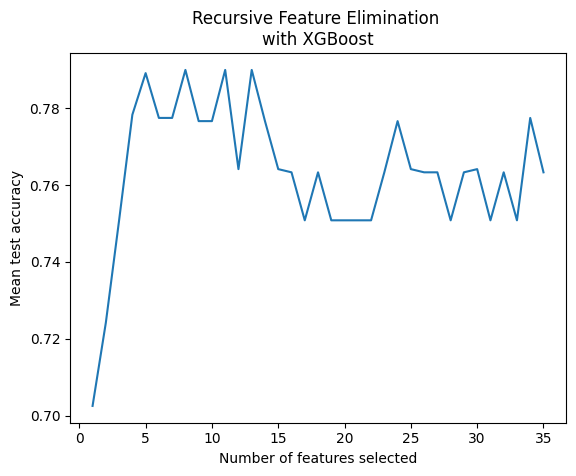

     di_rv_imc  ec_pad  ecpl_bio_cockroft  ecpl_bio_crea  ecpl_bio_hba1c  \
6         24.3   100.0               46.0          114.0            5.70   
8         21.3    65.0              134.0           47.0            5.80   
36        23.7   101.0               70.0           96.0            5.40   
55        30.7    63.0              121.0           59.0            5.60   
68        24.9    90.0               58.0          101.0            6.10   
..         ...     ...                ...            ...             ...   
268       29.1    77.0               98.2           86.0            5.94   
269       27.4    95.0               73.0           86.0            7.20   
270       33.4    86.0              147.0           66.0            5.40   
271       26.0    89.0               77.0           65.0            5.60   
272       26.6    80.0               66.0           78.0            6.30   

     ecpl_bio_ntprobnp  adm_ec_age  adm_pds_col3  
6                270.0          80  

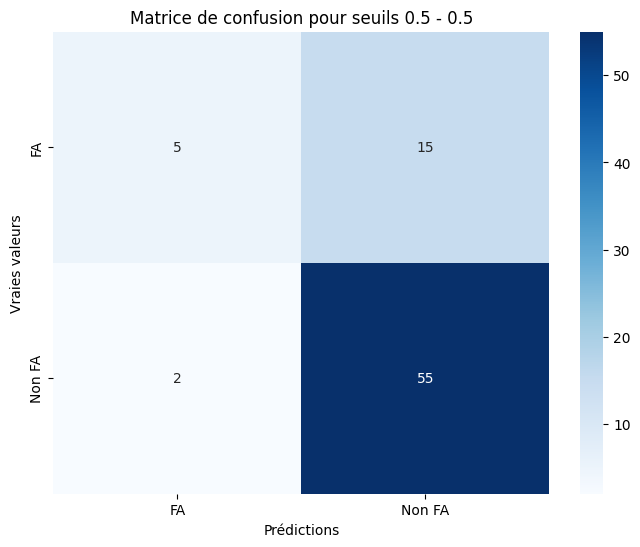

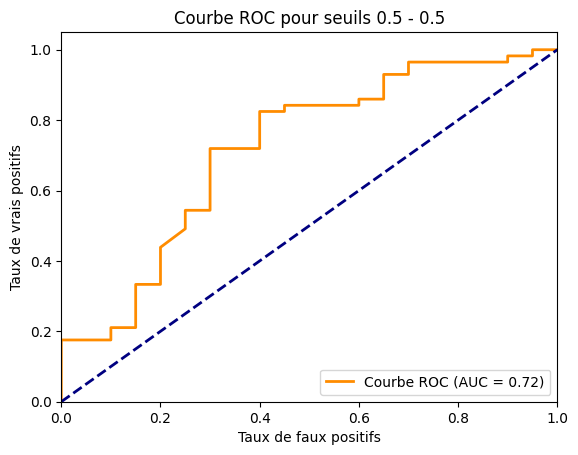

Taux de rejet: 0.0

Thresholds: 0.495 - 0.505
Accuracy après filtrage: 0.7857142857142857
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.12      0.21        16
      Non FA       0.79      0.98      0.88        54

    accuracy                           0.79        70
   macro avg       0.73      0.55      0.54        70
weighted avg       0.76      0.79      0.72        70



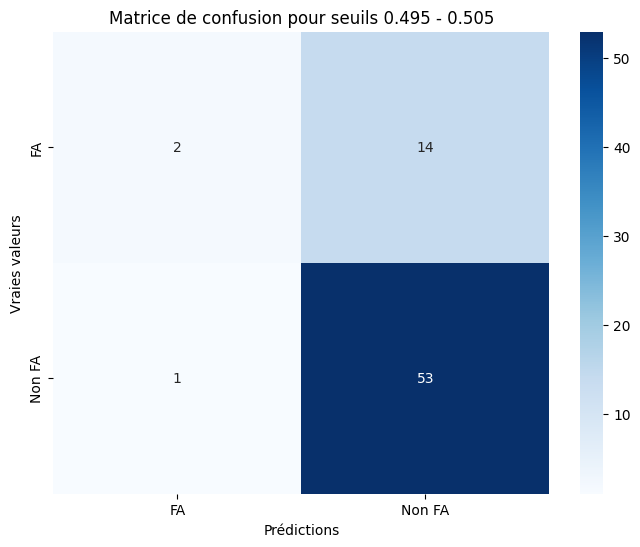

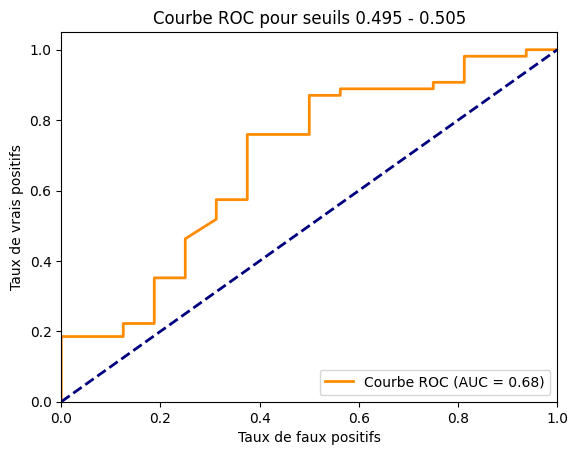

Taux de rejet: 0.09090909090909094

Thresholds: 0.49 - 0.51
Accuracy après filtrage: 0.7878787878787878
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.50      0.07      0.12        14
      Non FA       0.80      0.98      0.88        52

    accuracy                           0.79        66
   macro avg       0.65      0.53      0.50        66
weighted avg       0.73      0.79      0.72        66



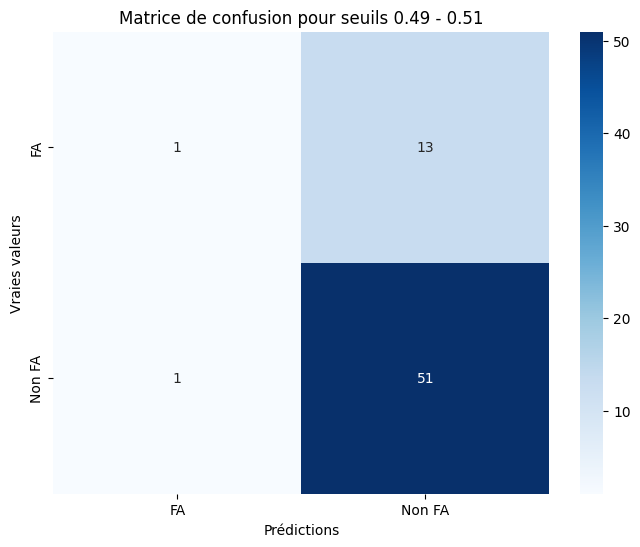

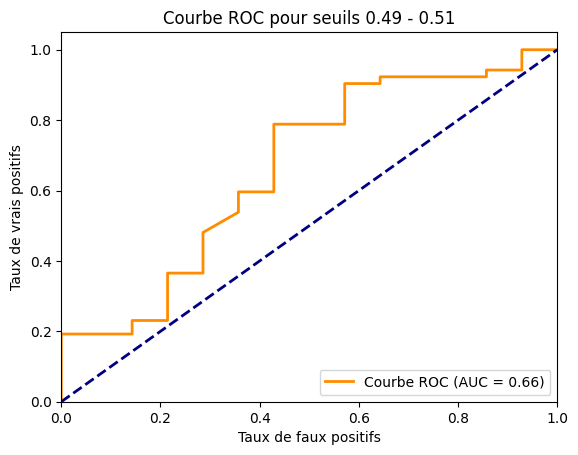

Taux de rejet: 0.1428571428571429

Thresholds: 0.485 - 0.515
Accuracy après filtrage: 0.796875
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00        13
      Non FA       0.80      1.00      0.89        51

    accuracy                           0.80        64
   macro avg       0.40      0.50      0.44        64
weighted avg       0.64      0.80      0.71        64



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

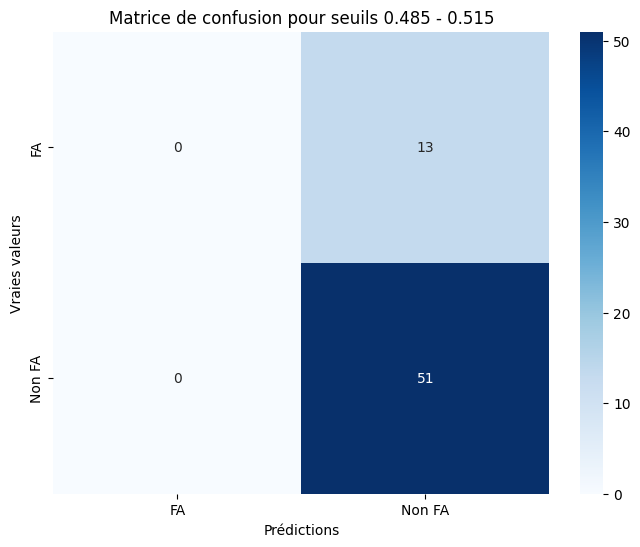

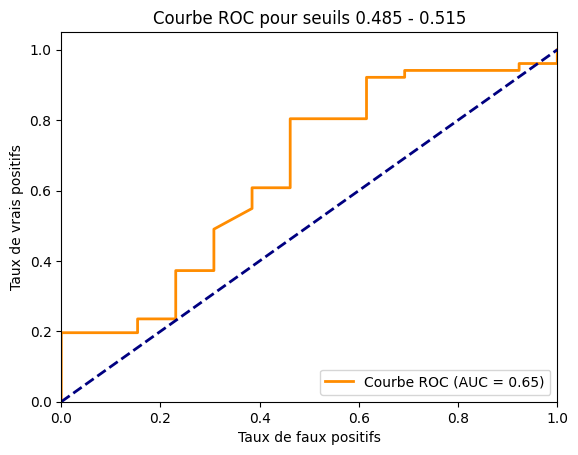

Taux de rejet: 0.16883116883116878

Thresholds: 0.48 - 0.52
Accuracy après filtrage: 0.7936507936507936
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00        13
      Non FA       0.79      1.00      0.88        50

    accuracy                           0.79        63
   macro avg       0.40      0.50      0.44        63
weighted avg       0.63      0.79      0.70        63



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

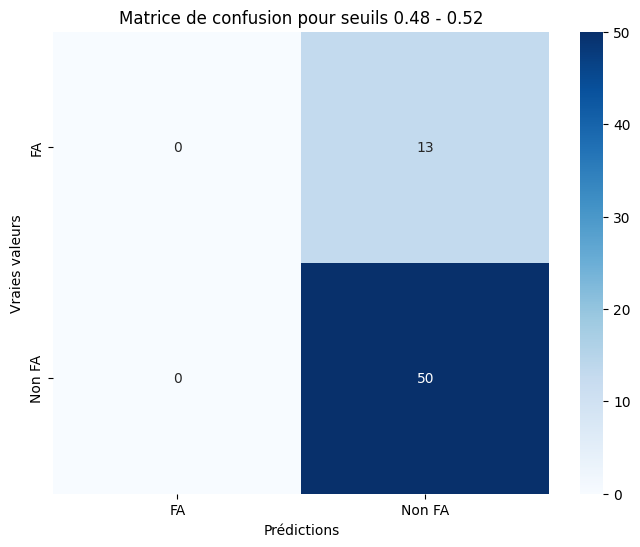

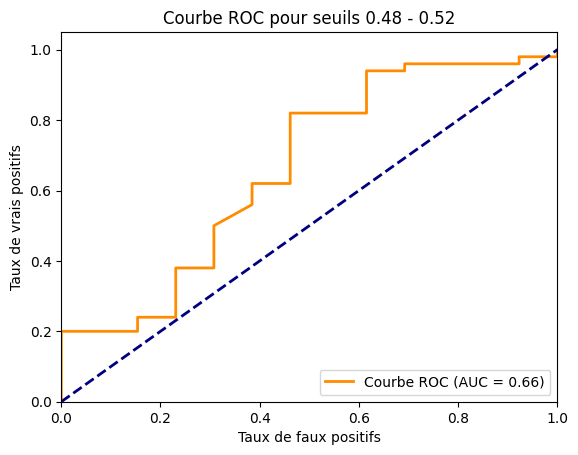

Taux de rejet: 0.18181818181818177


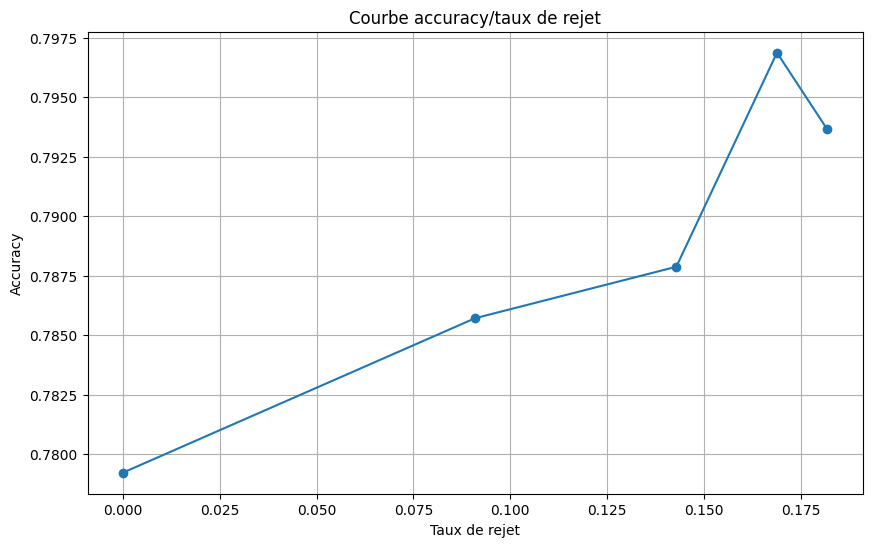

In [12]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = XGBClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Graphique de RFECV
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith XGBoost")
plt.show()

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [None, 2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

print(X_filtered_reduced)
grid_search = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for XGBoost: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low, threshold_high):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

# Plages de taux de rejet spécifiques
thresholds = [(0.5, 0.5), (0.495, 0.505), (0.49, 0.51), (0.485, 0.515), (0.48, 0.52)]

rejection_rates = []
accuracies = []

for (threshold_low, threshold_high) in thresholds:
    print(f"\nThresholds: {threshold_low} - {threshold_high}")
    y_pred_with_rejection = predict_with_rejection(y_proba, threshold_low, threshold_high)
    filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
    filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']
    
    if len(filtered_y_pred) > 0:  # Pour éviter la division par zéro
        accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
        print(f"Accuracy après filtrage: {accuracy}")
        class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
        print("Rapport de classification :\n", class_report)
        
        # Matrice de confusion
        conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
        plt.title(f'Matrice de confusion pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Prédictions')
        plt.ylabel('Vraies valeurs')
        plt.show()
        
        # Filtrer les probabilités pour la courbe ROC
        filtered_y_probas = [proba for proba, pred in zip(y_proba, y_pred_with_rejection) if pred != 'Indetermine']
        
        # Courbe ROC
        fpr, tpr, _ = roc_curve(filtered_y_true, [proba[1] for proba in filtered_y_probas])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title(f'Courbe ROC pour seuils {threshold_low} - {threshold_high}')
        plt.legend(loc="lower right")
        plt.show()

        # Taux de rejet
        rejection_rate = 1 - len(filtered_y_pred) / len(y_filtered)
        print(f"Taux de rejet: {rejection_rate}")
        rejection_rates.append(rejection_rate)
        accuracies.append(accuracy)

# Courbe accuracy/taux de rejet
plt.figure(figsize=(10, 6))
plt.plot(rejection_rates, accuracies, marker='o')
plt.xlabel('Taux de rejet')
plt.ylabel('Accuracy')
plt.title('Courbe accuracy/taux de rejet')
plt.grid(True)
plt.show()

Optimal number of features: 7
Best accuracy: 0.7900


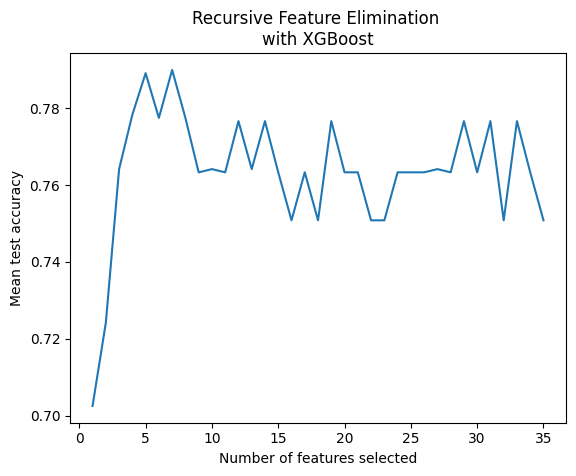

Best Hyperparameters for XGBoost: {'classifier__learning_rate': 0.006, 'classifier__max_depth': 3, 'classifier__n_estimators': 30, 'classifier__subsample': 0.65}
Accuracy avant filtrage: 0.7792207792207793

Thresholds: 0.4 - 0.6
Accuracy après filtrage: 0.9310344827586207
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         2
      Non FA       0.93      1.00      0.96        27

    accuracy                           0.93        29
   macro avg       0.47      0.50      0.48        29
weighted avg       0.87      0.93      0.90        29



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

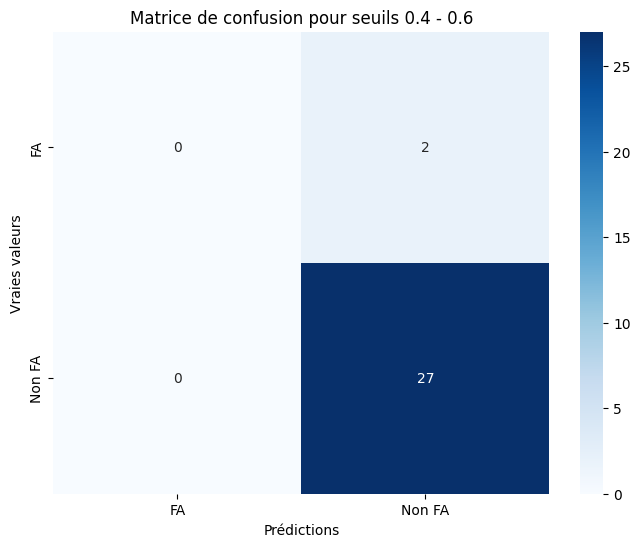

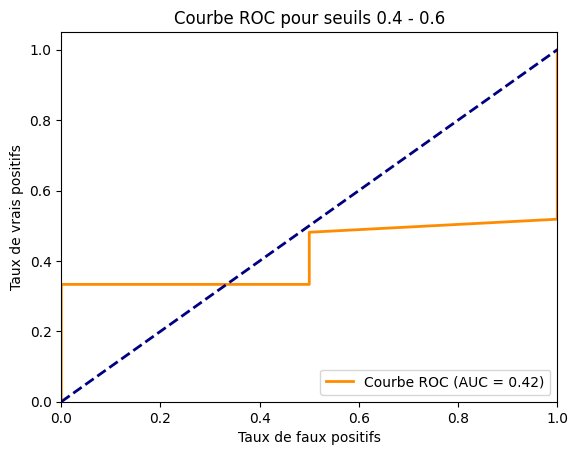

Taux de rejet: 0.6233766233766234


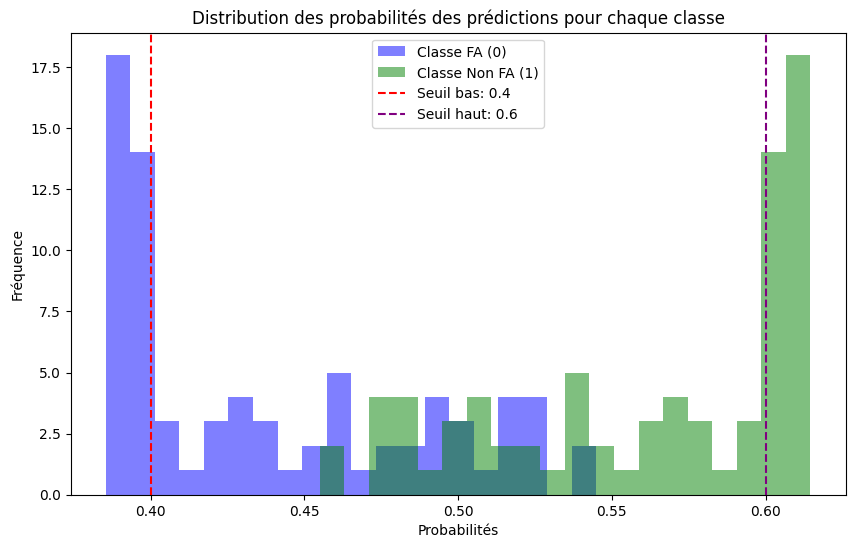


Thresholds: 0.40900000000000003 - 0.591
Accuracy après filtrage: 0.8857142857142857
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         4
      Non FA       0.89      1.00      0.94        31

    accuracy                           0.89        35
   macro avg       0.44      0.50      0.47        35
weighted avg       0.78      0.89      0.83        35



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

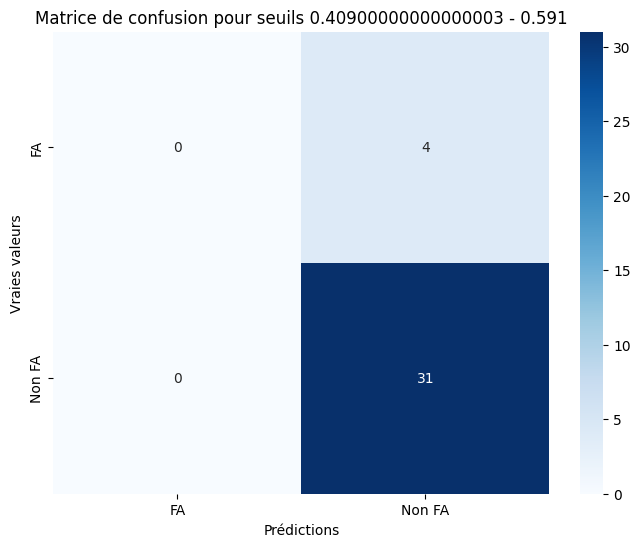

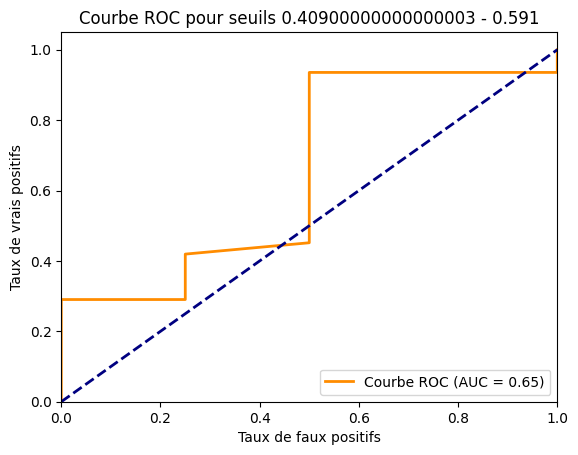

Taux de rejet: 0.5454545454545454


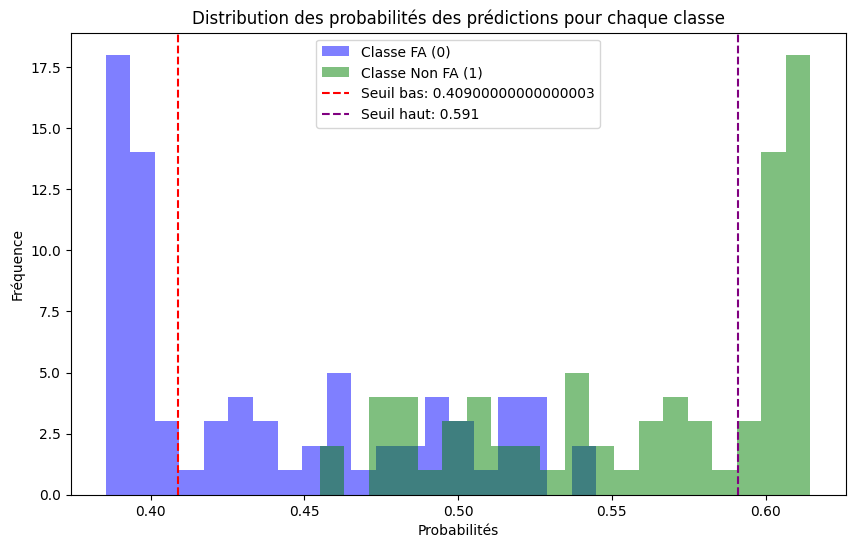


Thresholds: 0.41800000000000004 - 0.582
Accuracy après filtrage: 0.8888888888888888
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         4
      Non FA       0.89      1.00      0.94        32

    accuracy                           0.89        36
   macro avg       0.44      0.50      0.47        36
weighted avg       0.79      0.89      0.84        36



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

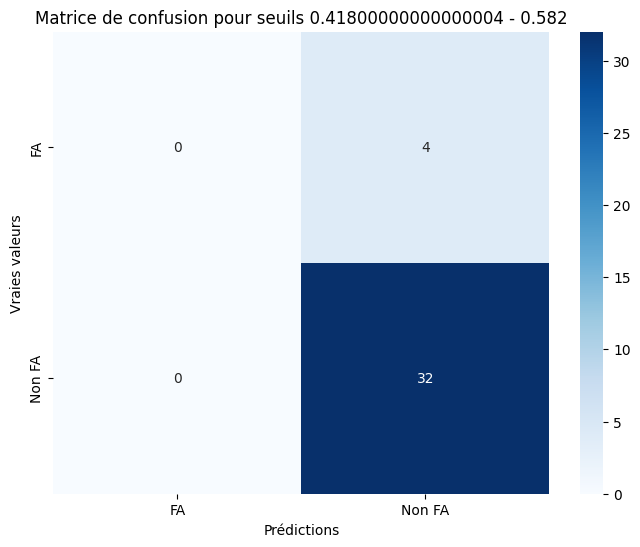

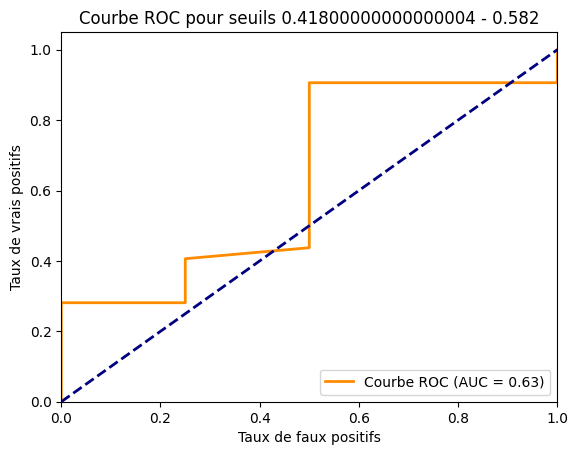

Taux de rejet: 0.5324675324675325


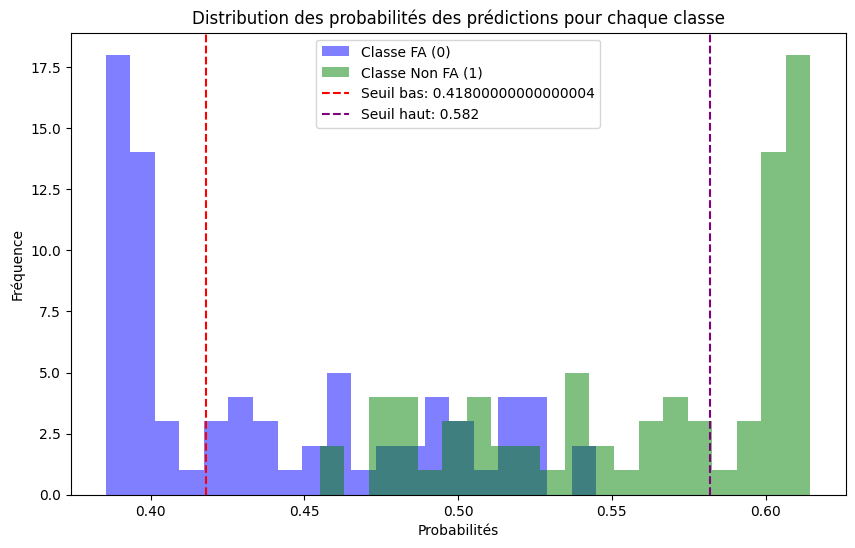


Thresholds: 0.42700000000000005 - 0.573
Accuracy après filtrage: 0.8974358974358975
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         4
      Non FA       0.90      1.00      0.95        35

    accuracy                           0.90        39
   macro avg       0.45      0.50      0.47        39
weighted avg       0.81      0.90      0.85        39



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

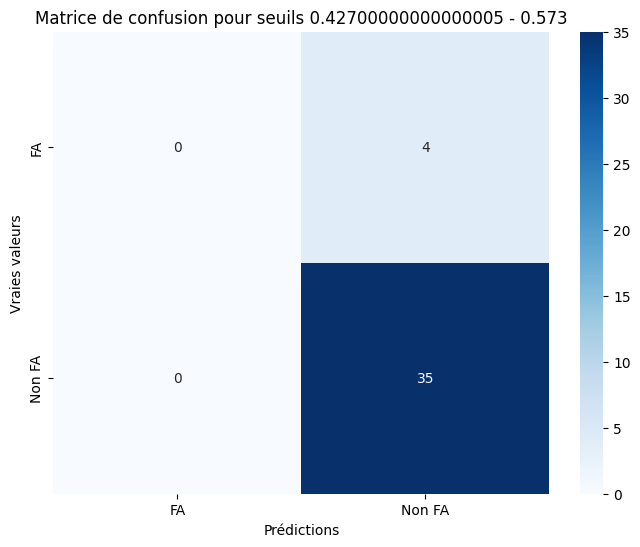

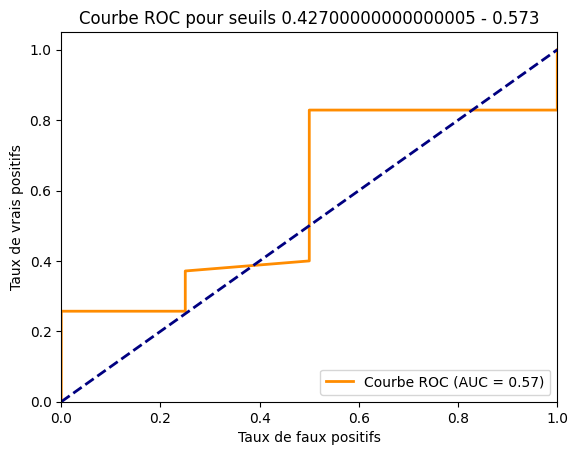

Taux de rejet: 0.49350649350649356


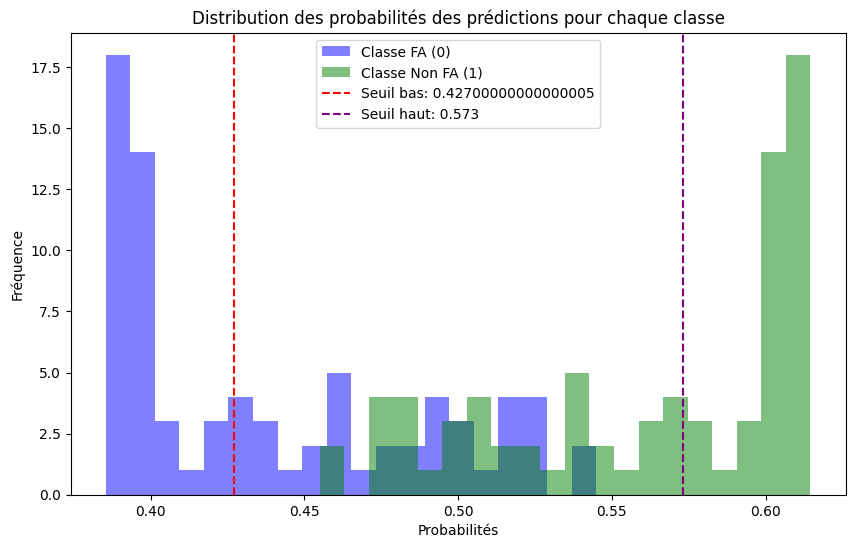


Thresholds: 0.436 - 0.564
Accuracy après filtrage: 0.8837209302325582
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         5
      Non FA       0.88      1.00      0.94        38

    accuracy                           0.88        43
   macro avg       0.44      0.50      0.47        43
weighted avg       0.78      0.88      0.83        43



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

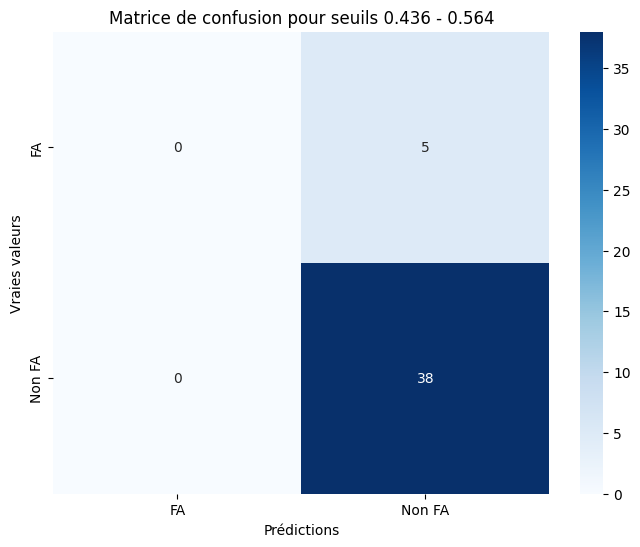

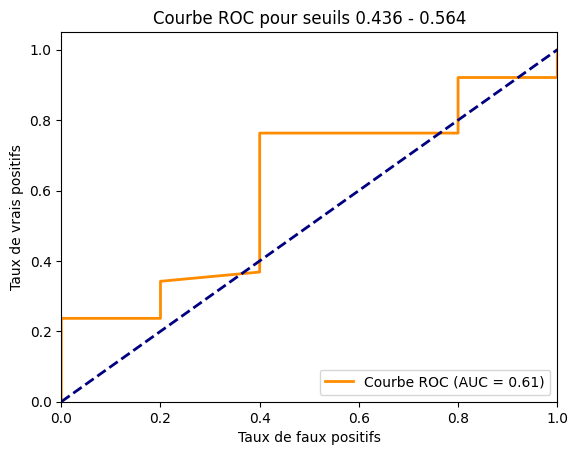

Taux de rejet: 0.4415584415584416


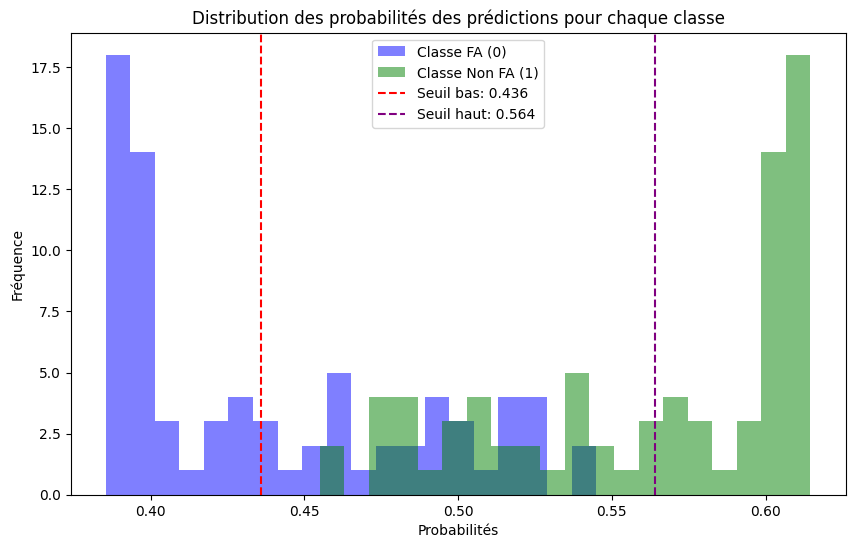


Thresholds: 0.445 - 0.5549999999999999
Accuracy après filtrage: 0.8936170212765957
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         5
      Non FA       0.89      1.00      0.94        42

    accuracy                           0.89        47
   macro avg       0.45      0.50      0.47        47
weighted avg       0.80      0.89      0.84        47



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

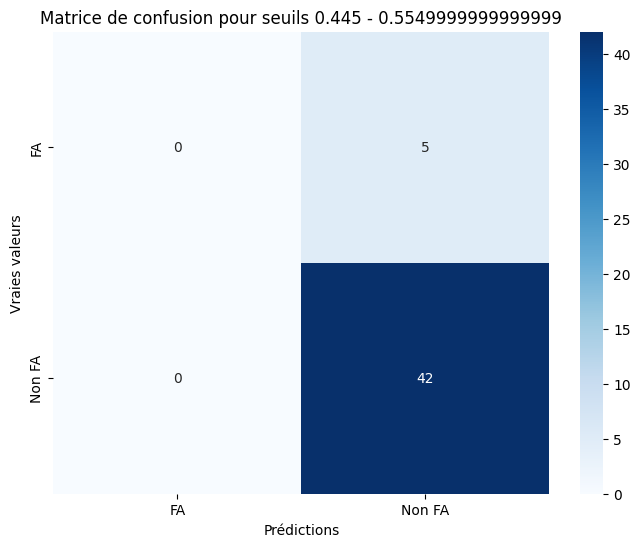

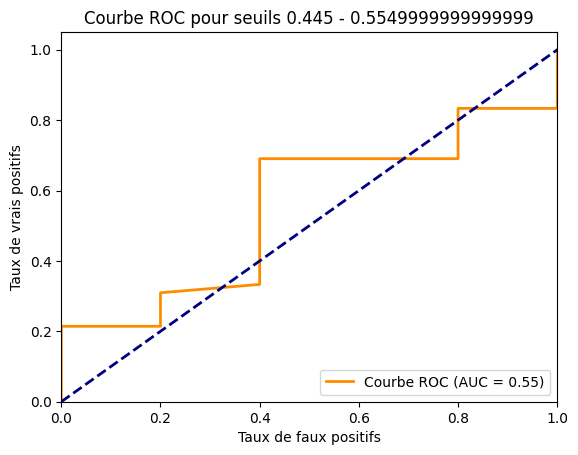

Taux de rejet: 0.38961038961038963


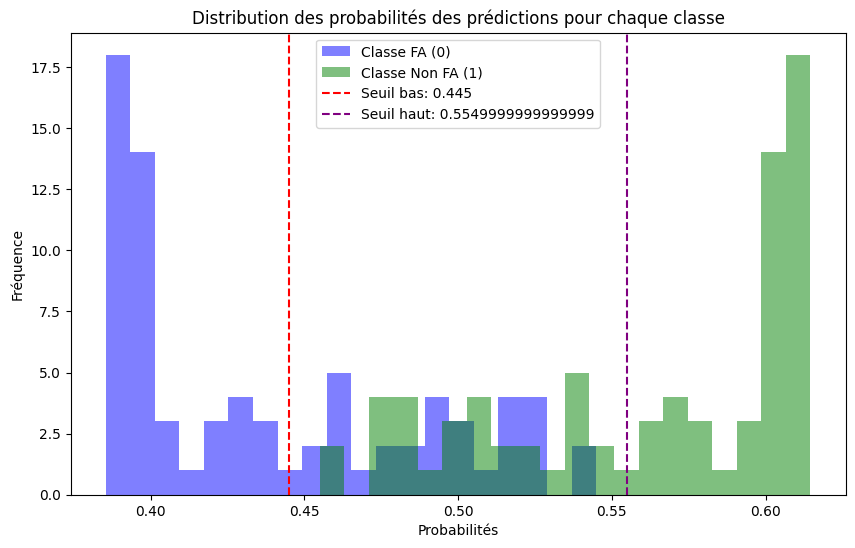


Thresholds: 0.454 - 0.546
Accuracy après filtrage: 0.8958333333333334
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.00      0.00      0.00         5
      Non FA       0.90      1.00      0.95        43

    accuracy                           0.90        48
   macro avg       0.45      0.50      0.47        48
weighted avg       0.80      0.90      0.85        48



C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\sebas\Desktop\EPISEN\ITS-3\Stage\Code\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f

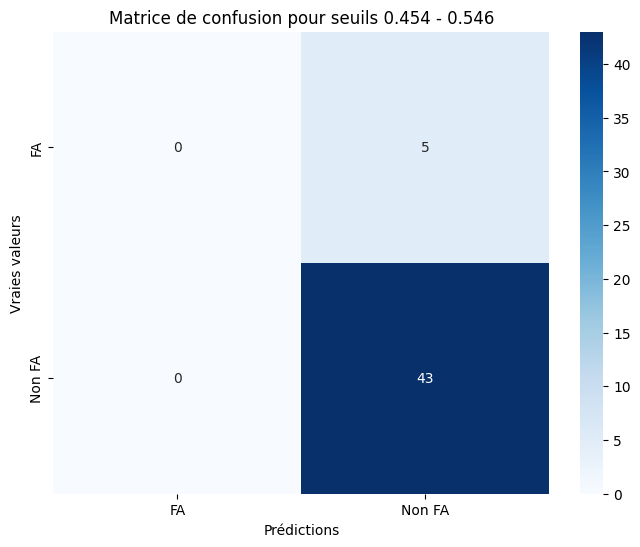

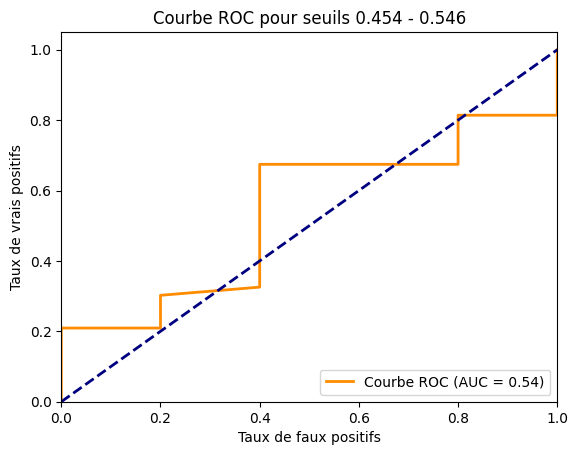

Taux de rejet: 0.37662337662337664


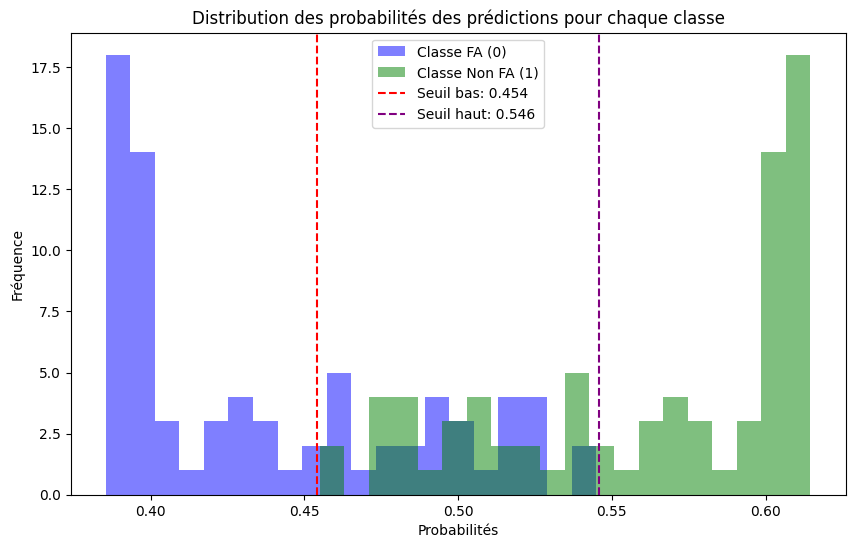


Thresholds: 0.463 - 0.5369999999999999
Accuracy après filtrage: 0.8
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.50      0.09      0.15        11
      Non FA       0.81      0.98      0.89        44

    accuracy                           0.80        55
   macro avg       0.66      0.53      0.52        55
weighted avg       0.75      0.80      0.74        55



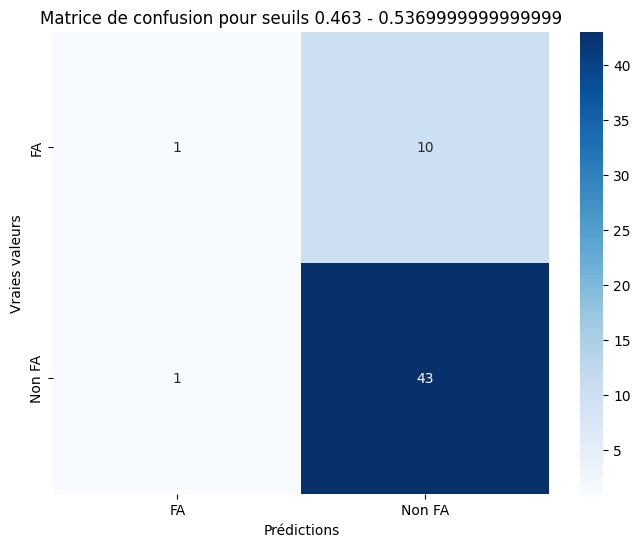

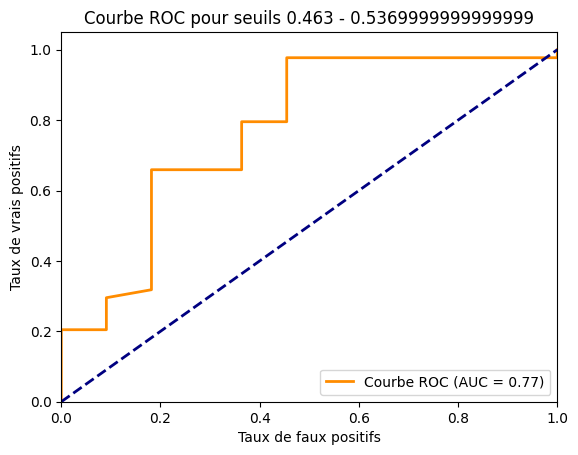

Taux de rejet: 0.2857142857142857


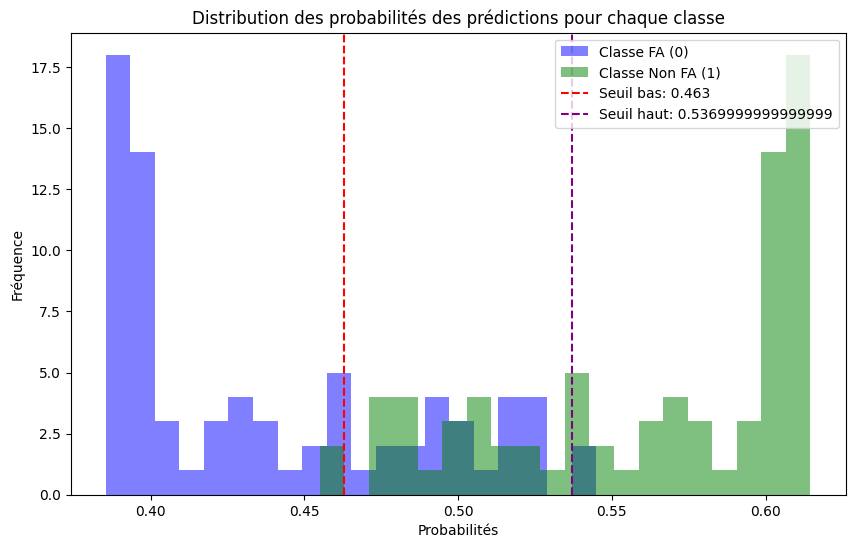


Thresholds: 0.47200000000000003 - 0.528
Accuracy après filtrage: 0.7758620689655172
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.33      0.08      0.13        12
      Non FA       0.80      0.96      0.87        46

    accuracy                           0.78        58
   macro avg       0.57      0.52      0.50        58
weighted avg       0.70      0.78      0.72        58



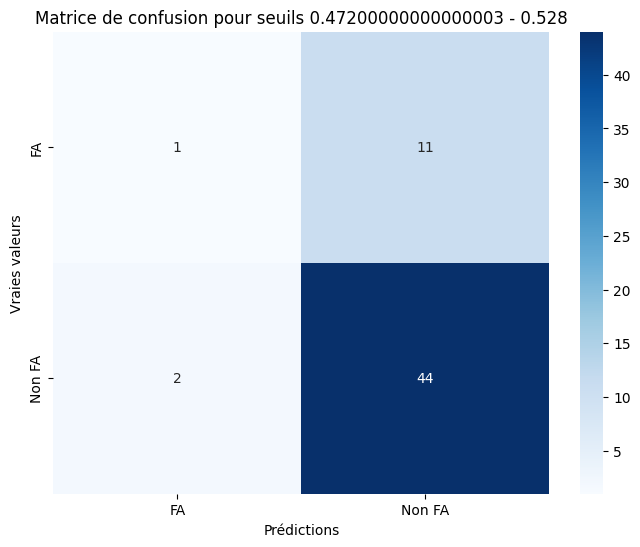

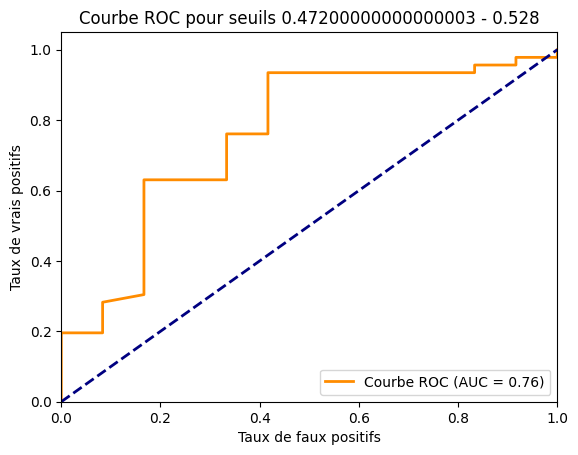

Taux de rejet: 0.24675324675324672


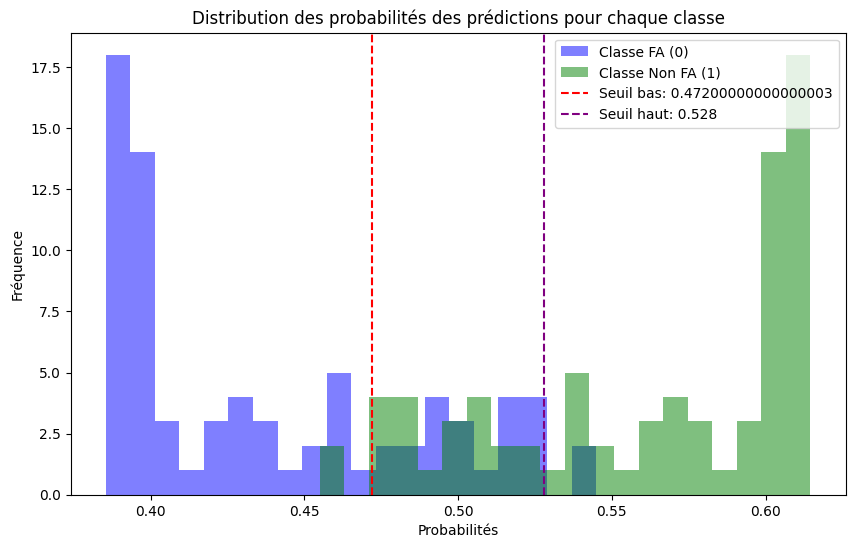


Thresholds: 0.481 - 0.519
Accuracy après filtrage: 0.765625
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.43      0.21      0.29        14
      Non FA       0.81      0.92      0.86        50

    accuracy                           0.77        64
   macro avg       0.62      0.57      0.57        64
weighted avg       0.72      0.77      0.73        64



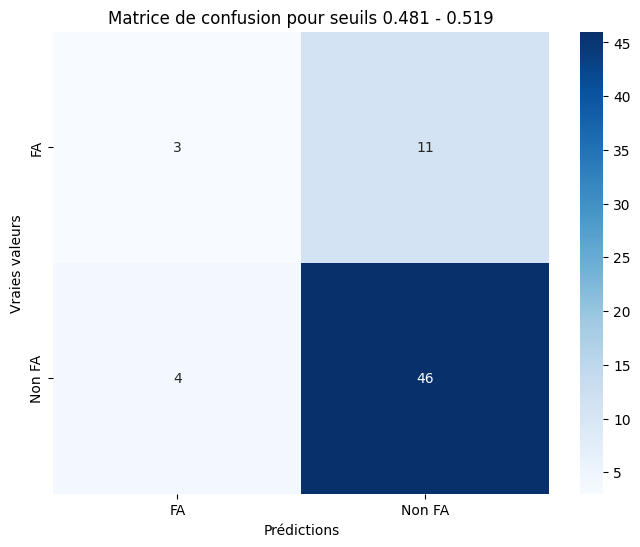

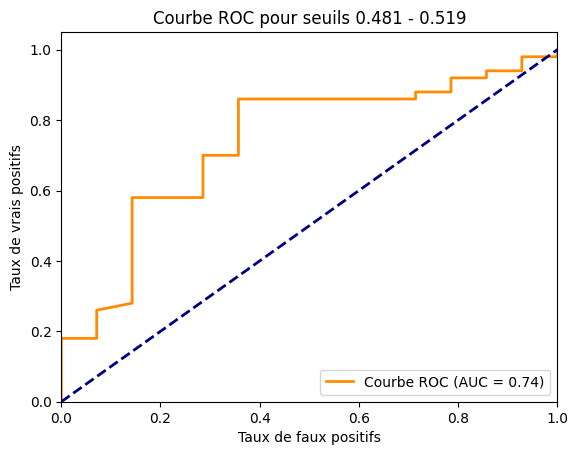

Taux de rejet: 0.16883116883116878


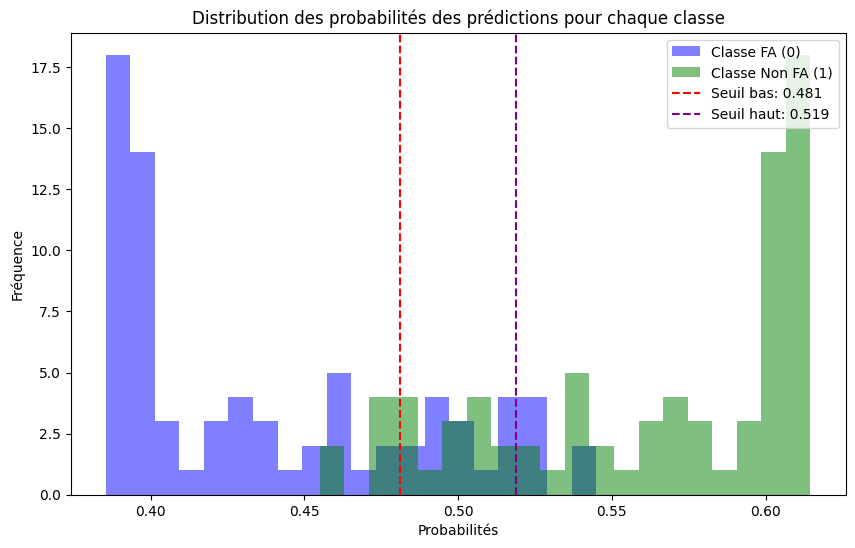

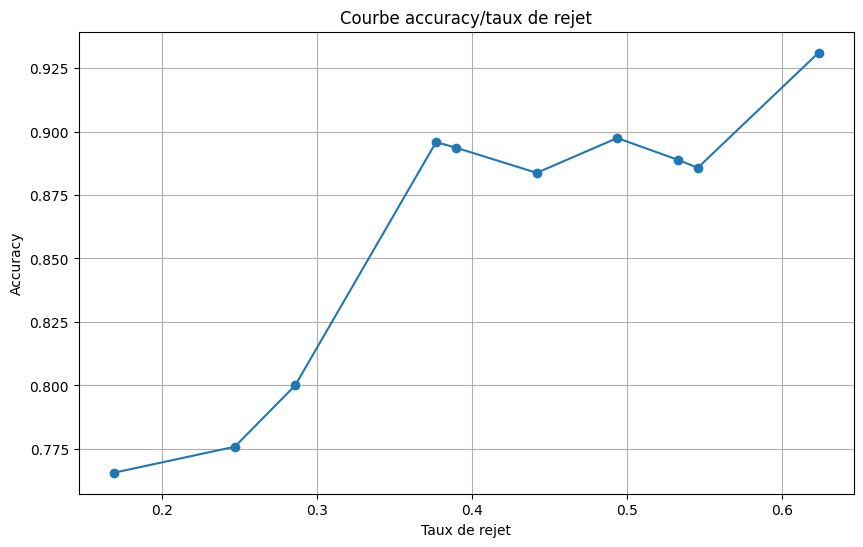

In [2]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Sélection des caractéristiques
min_features_to_select = 1  # Minimum number of features to consider
clf = XGBClassifier()
cv = StratifiedKFold(5)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=-1,
)
rfecv.fit(X_filtered, y_filtered)

best_features = rfecv.support_
print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Best accuracy: {max(rfecv.cv_results_['mean_test_score']):.4f}")

# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Graphique de RFECV
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score']
)
plt.title("Recursive Feature Elimination \nwith XGBoost")
plt.show()

# XGBoost avec GridSearchCV
pipeline_xgb = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', XGBClassifier(random_state=42))
])

param_grid_xgb = {
    'classifier__n_estimators': [20, 25, 30],
    'classifier__max_depth': [2, 3, 5, 7, 9],
    'classifier__learning_rate': [0.004, 0.005, 0.006],
    'classifier__subsample': [0.65, 0.7, 0.75, 0.8, 0.85],
}

grid_search = GridSearchCV(pipeline_xgb, param_grid_xgb, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for XGBoost: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low, threshold_high):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

# Étendre les plages de taux de rejet
thresholds = [(0.4 + i*0.009, 0.6 - i*0.009) for i in range(10)]  # Pas de 0.009

# Stocker les résultats pour la courbe accuracy/taux de rejet
rejection_rates = []
accuracies = []

for (threshold_low, threshold_high) in thresholds:
    if threshold_low >= 0.5 or threshold_high <= 0.5:  # Arrêter si les seuils se croisent
        break
    
    print(f"\nThresholds: {threshold_low} - {threshold_high}")
    y_pred_with_rejection = predict_with_rejection(y_proba, threshold_low, threshold_high)
    filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
    filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']
    
    if len(filtered_y_pred) > 0:  # Pour éviter la division par zéro
        accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
        print(f"Accuracy après filtrage: {accuracy}")
        class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
        print("Rapport de classification :\n", class_report)
        
        # Visualisation de la matrice de confusion
        conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
        plt.title(f'Matrice de confusion pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Prédictions')
        plt.ylabel('Vraies valeurs')
        plt.show()
        
        # Filtrer les probabilités pour la courbe ROC
        filtered_y_probas = [proba for proba, pred in zip(y_proba, y_pred_with_rejection) if pred != 'Indetermine']
        
        # Courbe ROC
        fpr, tpr, _ = roc_curve(filtered_y_true, [proba[1] for proba in filtered_y_probas])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title(f'Courbe ROC pour seuils {threshold_low} - {threshold_high}')
        plt.legend(loc="lower right")
        plt.show()

        # Taux de rejet
        rejection_rate = 1 - len(filtered_y_pred) / len(y_filtered)
        print(f"Taux de rejet: {rejection_rate}")

        # Stocker les résultats
        rejection_rates.append(rejection_rate)
        accuracies.append(accuracy)
        
        # Visualisation de la répartition des probabilités
        proba_0 = [proba[0] for proba in y_proba]
        proba_1 = [proba[1] for proba in y_proba]

        plt.figure(figsize=(10, 6))
        plt.hist(proba_0, bins=20, color='blue', alpha=0.5, label='Classe FA (0)')
        plt.hist(proba_1, bins=20, color='green', alpha=0.5, label='Classe Non FA (1)')
        plt.axvline(threshold_low, color='red', linestyle='--', label=f'Seuil bas: {threshold_low}')
        plt.axvline(threshold_high, color='purple', linestyle='--', label=f'Seuil haut: {threshold_high}')
        plt.title(f'Distribution des probabilités des prédictions pour chaque classe')
        plt.xlabel('Probabilités')
        plt.ylabel('Fréquence')
        plt.legend()
        plt.show()

# Tracer la courbe accuracy/taux de rejet
plt.figure(figsize=(10, 6))
plt.plot(rejection_rates, accuracies, marker='o')
plt.xlabel('Taux de rejet')
plt.ylabel('Accuracy')
plt.title('Courbe accuracy/taux de rejet')
plt.grid(True)
plt.show()

Feature selection
Iteration 1:
Optimal number of features: 3
Best accuracy: 0.8167
Iteration 2:
Optimal number of features: 3
Best accuracy: 0.8292
Iteration 3:
Optimal number of features: 6
Best accuracy: 0.8308
Iteration 4:
Optimal number of features: 4
Best accuracy: 0.8558
Iteration 5:
Optimal number of features: 7
Best accuracy: 0.8308

 4 Selected features:
Index(['di_rv_imc', 'ecpl_bio_crea', 'ecpl_bio_ntprobnp', 'adm_ec_age'], dtype='object')

----------------------------------------------------------------------------------------

Best Hyperparameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 10}
Accuracy avant filtrage: 0.8441558441558441

Thresholds: 0.0 - 1.0
Accuracy après filtrage: 0.95
Rapport de classification :
               precision    recall  f1-score   support

          FA       1.00      0.67      0.80         3
      Non FA       0.94      1.00      0.97 

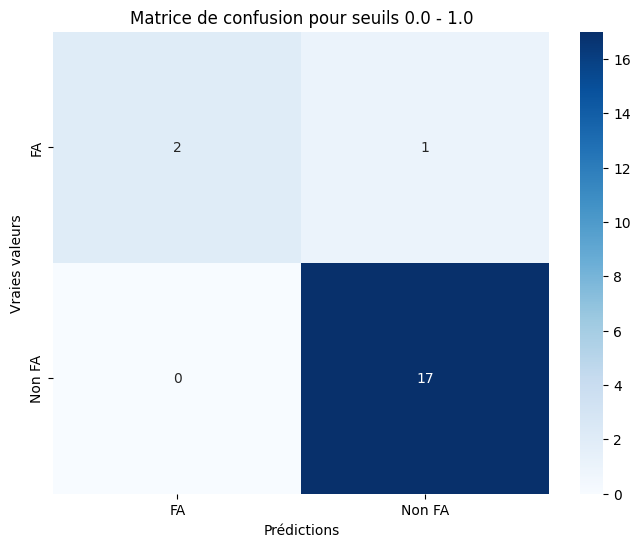

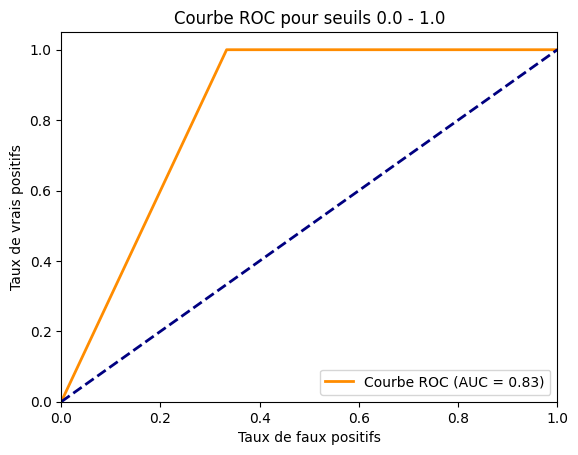

Taux de rejet: 0.7402597402597403


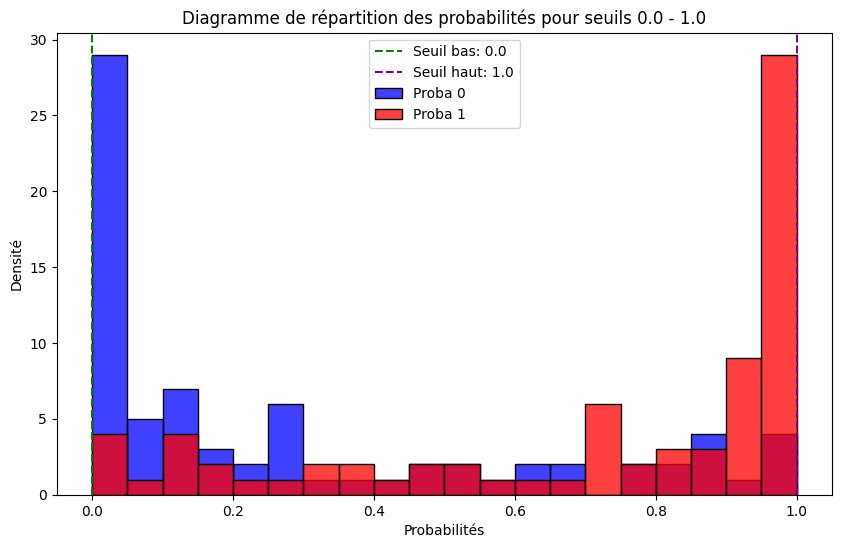


Thresholds: 0.025 - 0.975
Accuracy après filtrage: 0.9285714285714286
Rapport de classification :
               precision    recall  f1-score   support

          FA       1.00      0.60      0.75         5
      Non FA       0.92      1.00      0.96        23

    accuracy                           0.93        28
   macro avg       0.96      0.80      0.85        28
weighted avg       0.93      0.93      0.92        28



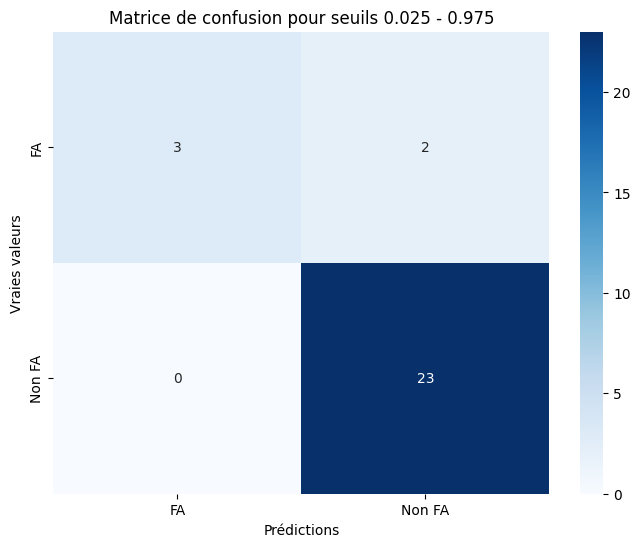

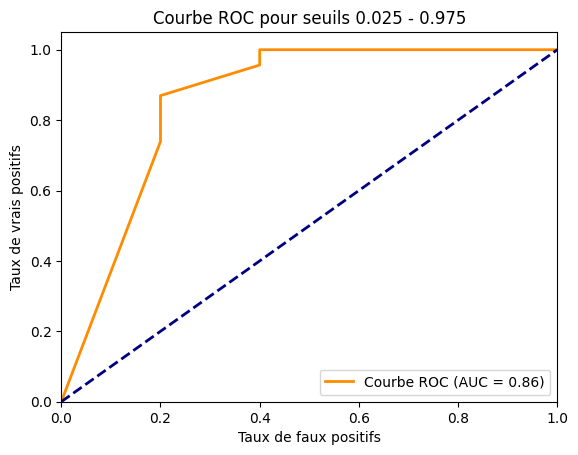

Taux de rejet: 0.6363636363636364


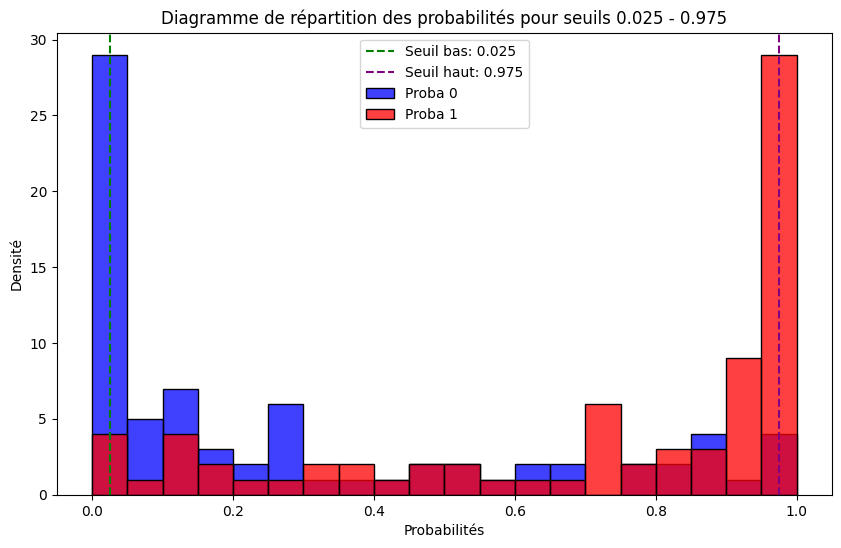


Thresholds: 0.05 - 0.95
Accuracy après filtrage: 0.9393939393939394
Rapport de classification :
               precision    recall  f1-score   support

          FA       1.00      0.67      0.80         6
      Non FA       0.93      1.00      0.96        27

    accuracy                           0.94        33
   macro avg       0.97      0.83      0.88        33
weighted avg       0.94      0.94      0.93        33



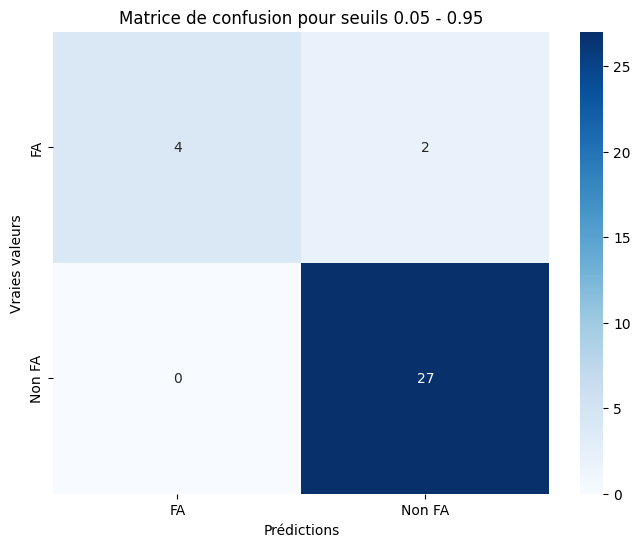

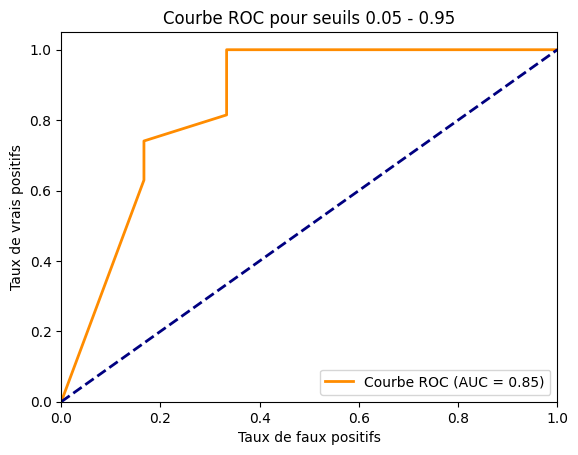

Taux de rejet: 0.5714285714285714


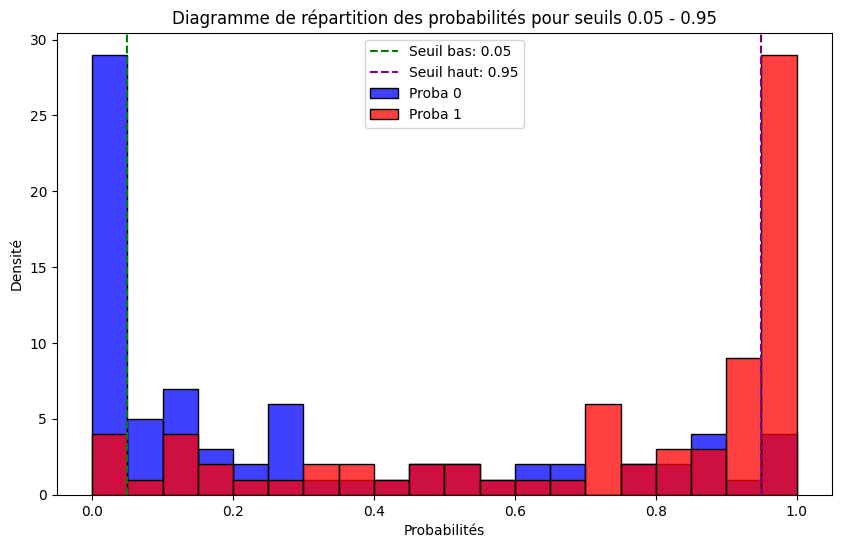


Thresholds: 0.075 - 0.925
Accuracy après filtrage: 0.9444444444444444
Rapport de classification :
               precision    recall  f1-score   support

          FA       1.00      0.67      0.80         6
      Non FA       0.94      1.00      0.97        30

    accuracy                           0.94        36
   macro avg       0.97      0.83      0.88        36
weighted avg       0.95      0.94      0.94        36



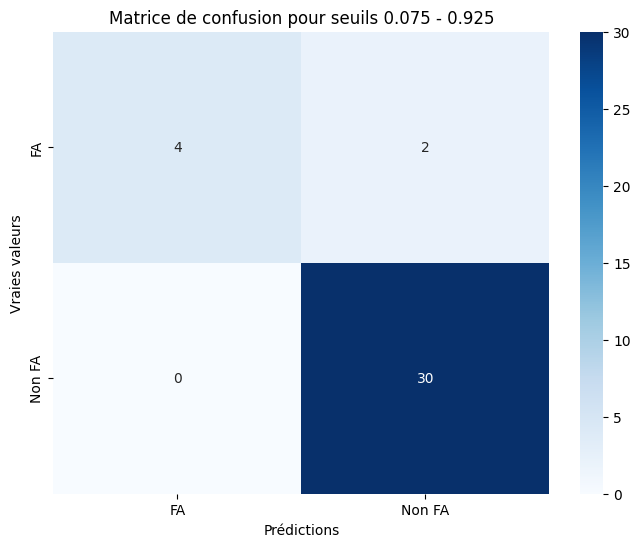

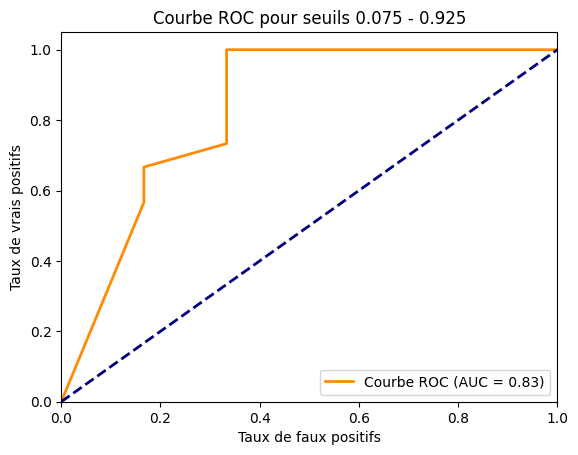

Taux de rejet: 0.5324675324675325


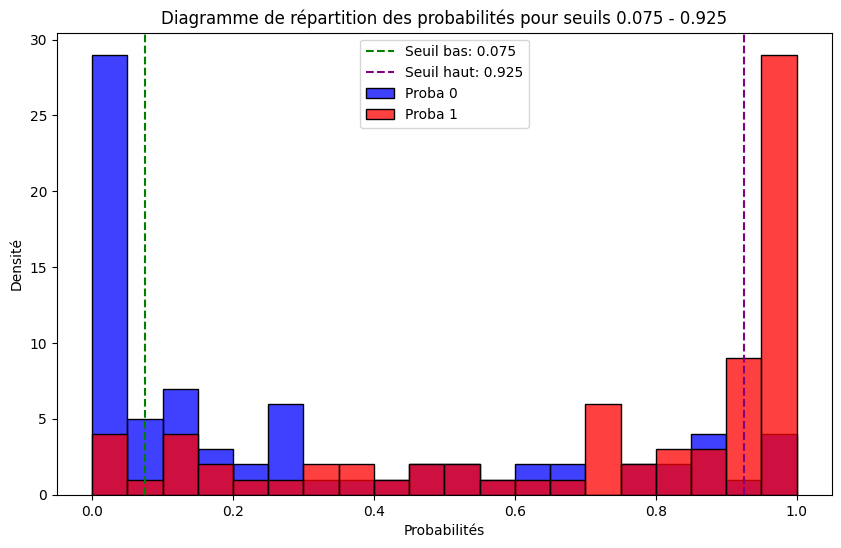


Thresholds: 0.1 - 0.9
Accuracy après filtrage: 0.9302325581395349
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.80      0.67      0.73         6
      Non FA       0.95      0.97      0.96        37

    accuracy                           0.93        43
   macro avg       0.87      0.82      0.84        43
weighted avg       0.93      0.93      0.93        43



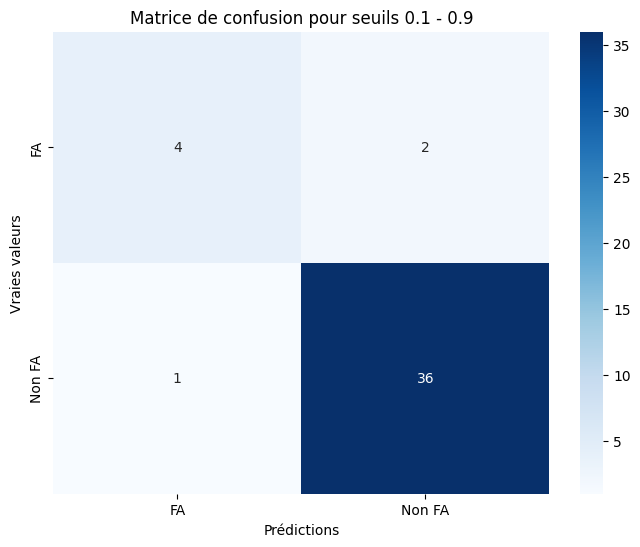

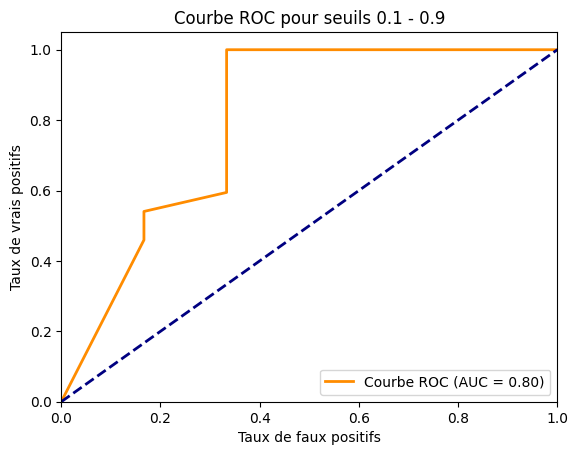

Taux de rejet: 0.4415584415584416


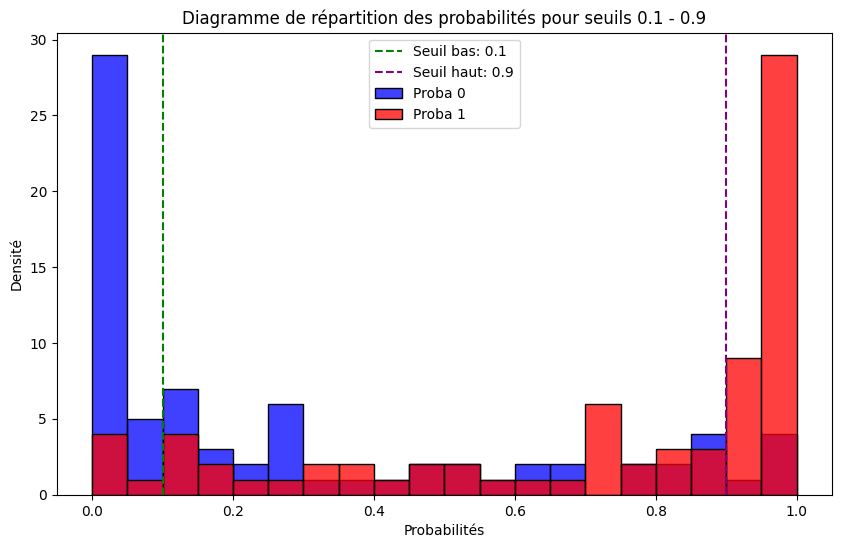


Thresholds: 0.125 - 0.875
Accuracy après filtrage: 0.8936170212765957
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.71      0.62      0.67         8
      Non FA       0.93      0.95      0.94        39

    accuracy                           0.89        47
   macro avg       0.82      0.79      0.80        47
weighted avg       0.89      0.89      0.89        47



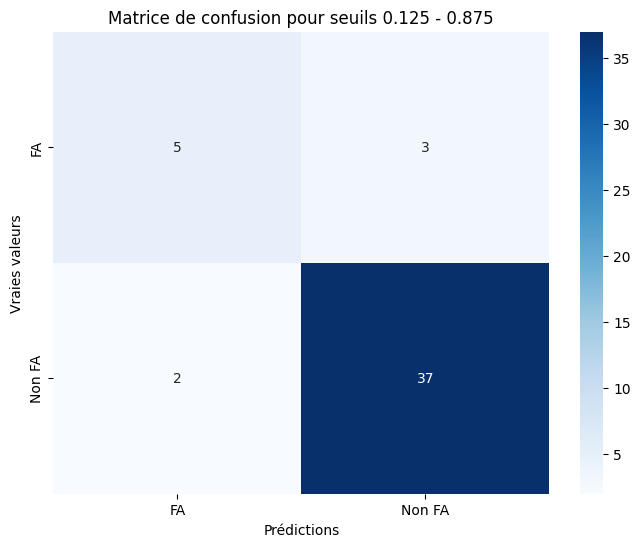

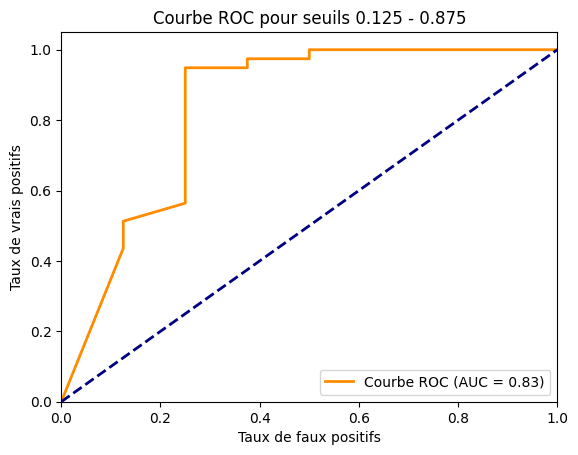

Taux de rejet: 0.38961038961038963


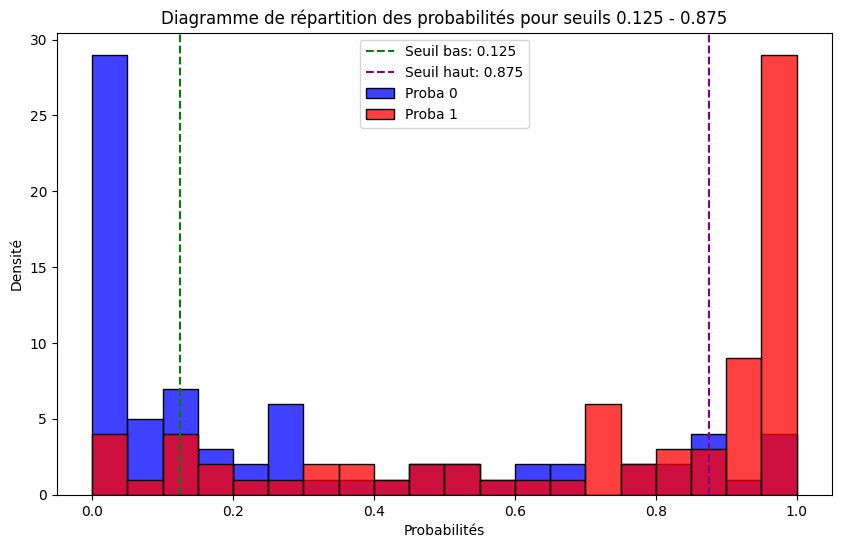


Thresholds: 0.15 - 0.85
Accuracy après filtrage: 0.88
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.67      0.67         9
      Non FA       0.93      0.93      0.93        41

    accuracy                           0.88        50
   macro avg       0.80      0.80      0.80        50
weighted avg       0.88      0.88      0.88        50



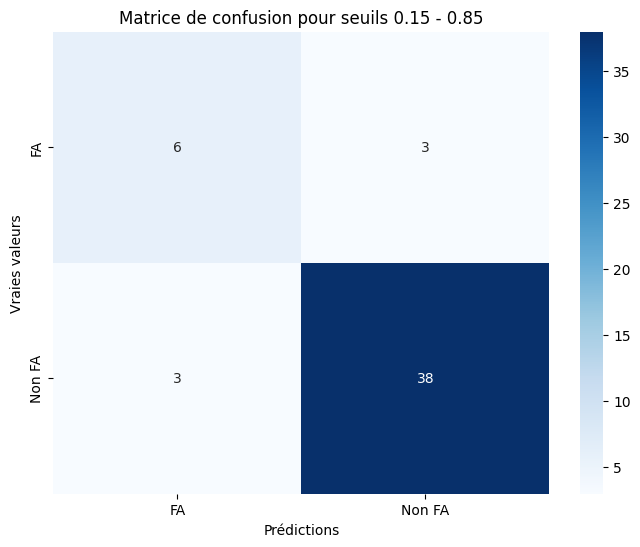

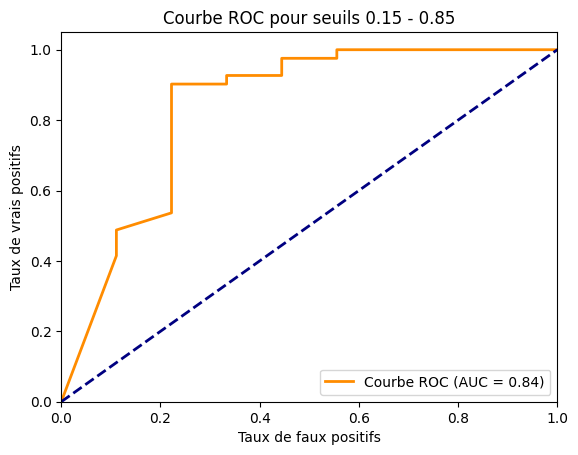

Taux de rejet: 0.35064935064935066


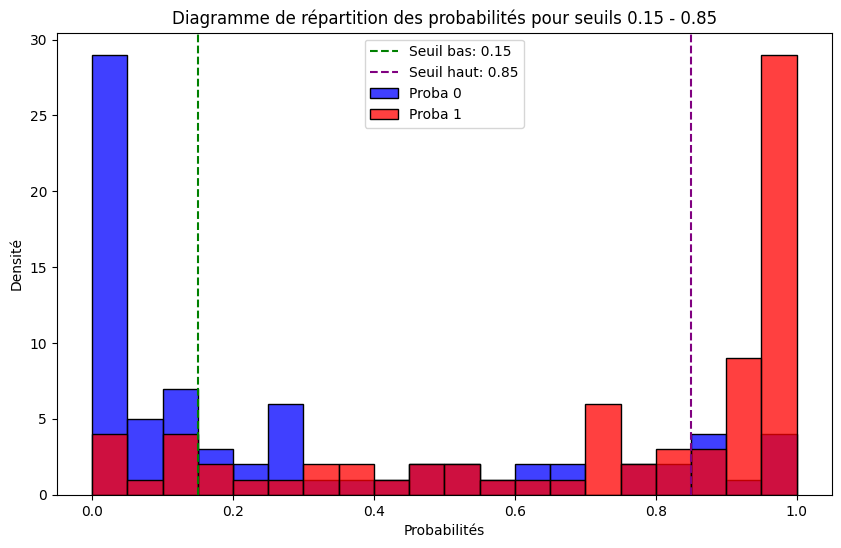


Thresholds: 0.175 - 0.825
Accuracy après filtrage: 0.8846153846153846
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.70      0.70        10
      Non FA       0.93      0.93      0.93        42

    accuracy                           0.88        52
   macro avg       0.81      0.81      0.81        52
weighted avg       0.88      0.88      0.88        52



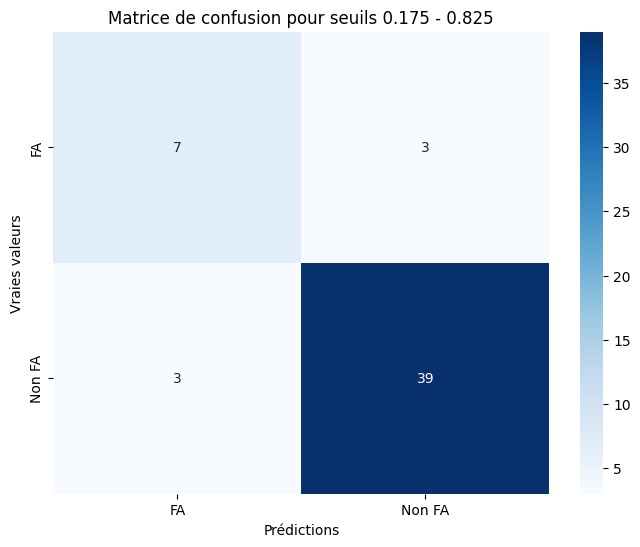

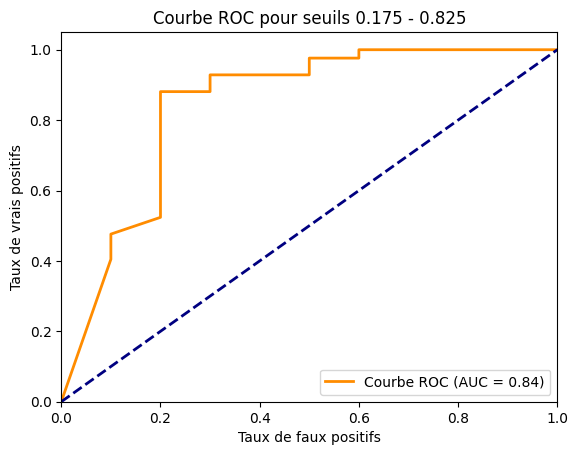

Taux de rejet: 0.3246753246753247


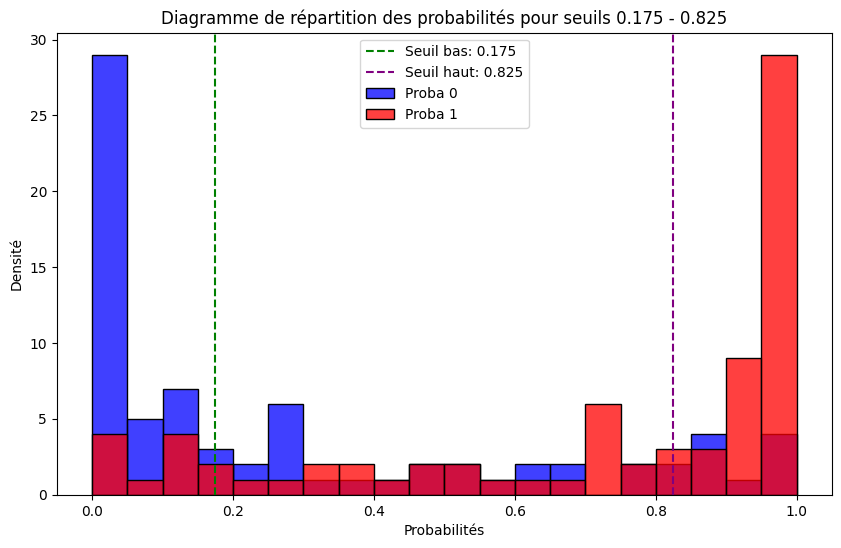


Thresholds: 0.2 - 0.8
Accuracy après filtrage: 0.8909090909090909
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.73      0.73        11
      Non FA       0.93      0.93      0.93        44

    accuracy                           0.89        55
   macro avg       0.83      0.83      0.83        55
weighted avg       0.89      0.89      0.89        55



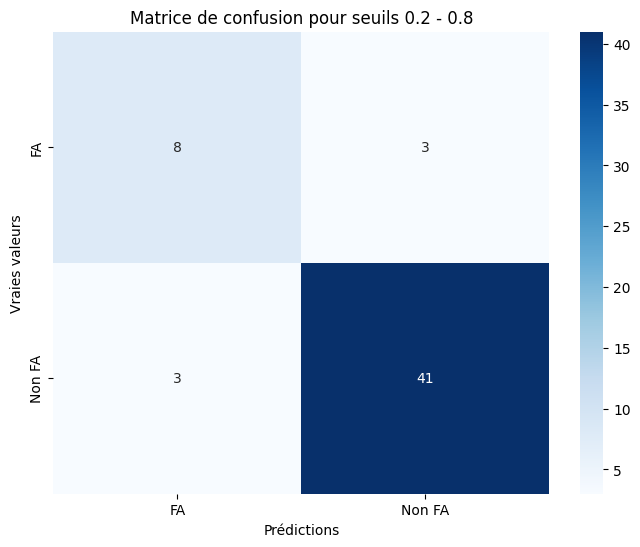

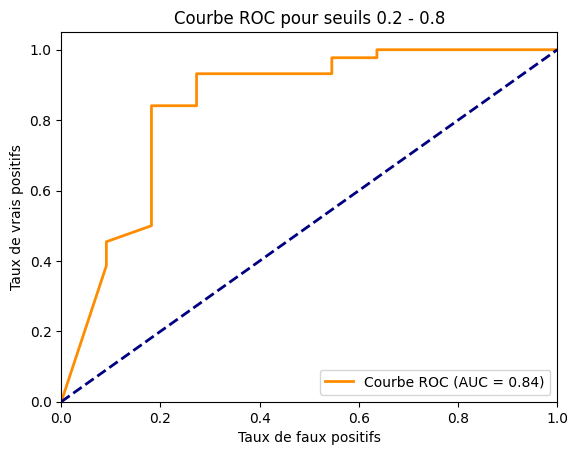

Taux de rejet: 0.2857142857142857


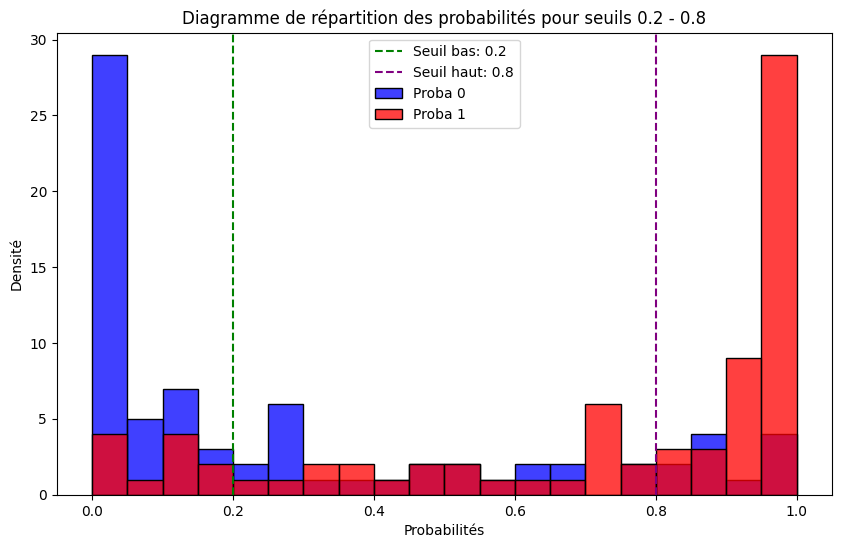


Thresholds: 0.225 - 0.775
Accuracy après filtrage: 0.8793103448275862
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.75      0.69      0.72        13
      Non FA       0.91      0.93      0.92        45

    accuracy                           0.88        58
   macro avg       0.83      0.81      0.82        58
weighted avg       0.88      0.88      0.88        58



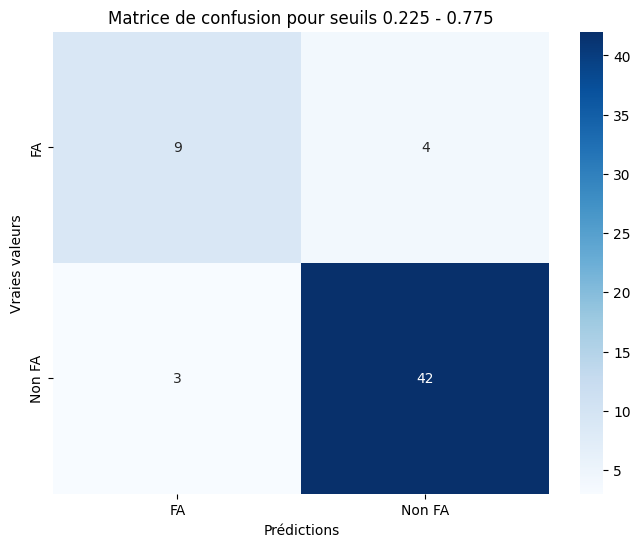

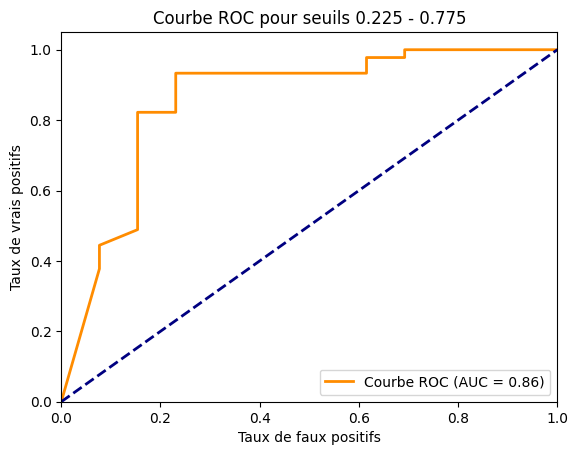

Taux de rejet: 0.24675324675324672


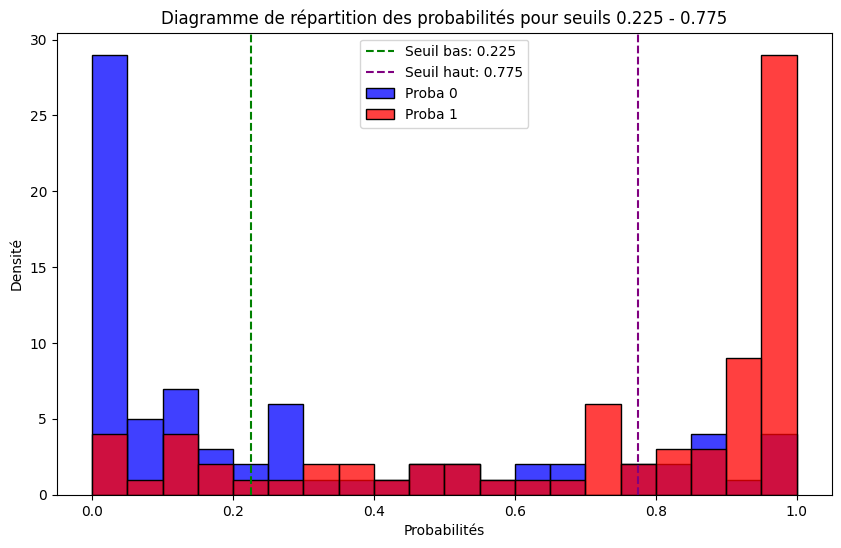


Thresholds: 0.25 - 0.75
Accuracy après filtrage: 0.8813559322033898
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.77      0.71      0.74        14
      Non FA       0.91      0.93      0.92        45

    accuracy                           0.88        59
   macro avg       0.84      0.82      0.83        59
weighted avg       0.88      0.88      0.88        59



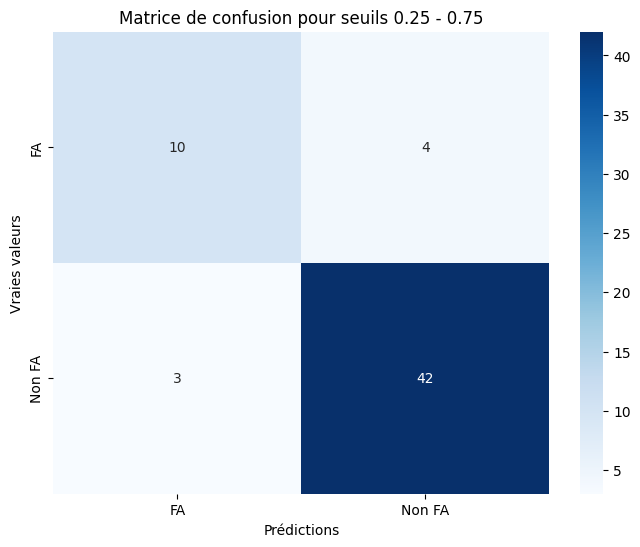

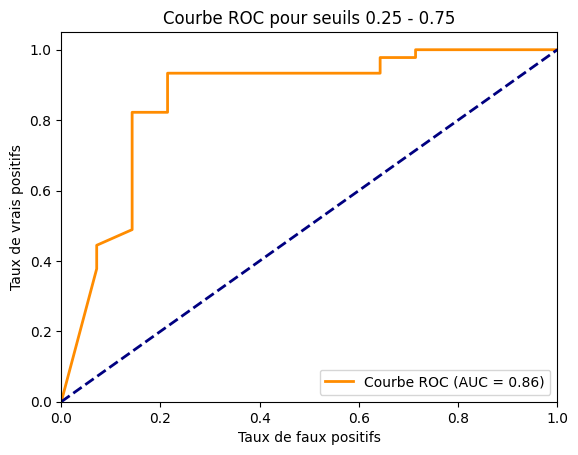

Taux de rejet: 0.23376623376623373


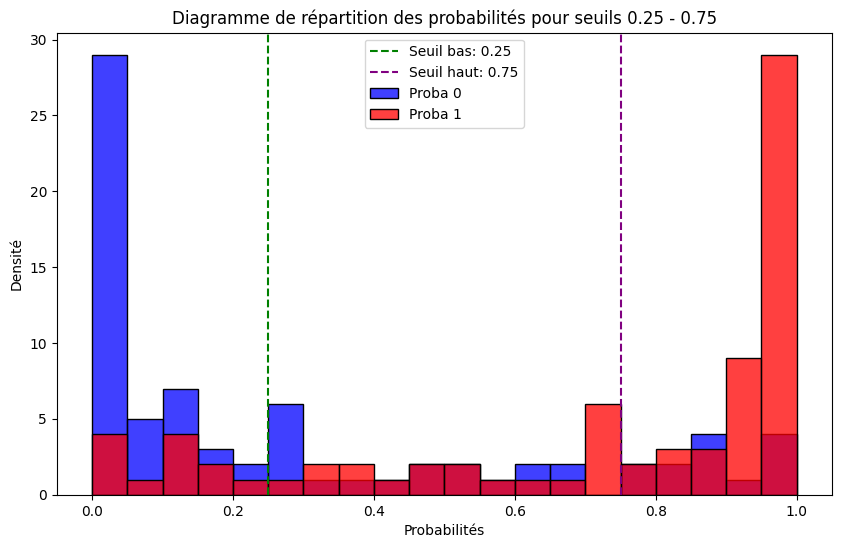


Thresholds: 0.275 - 0.725
Accuracy après filtrage: 0.890625
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.77      0.71      0.74        14
      Non FA       0.92      0.94      0.93        50

    accuracy                           0.89        64
   macro avg       0.85      0.83      0.84        64
weighted avg       0.89      0.89      0.89        64



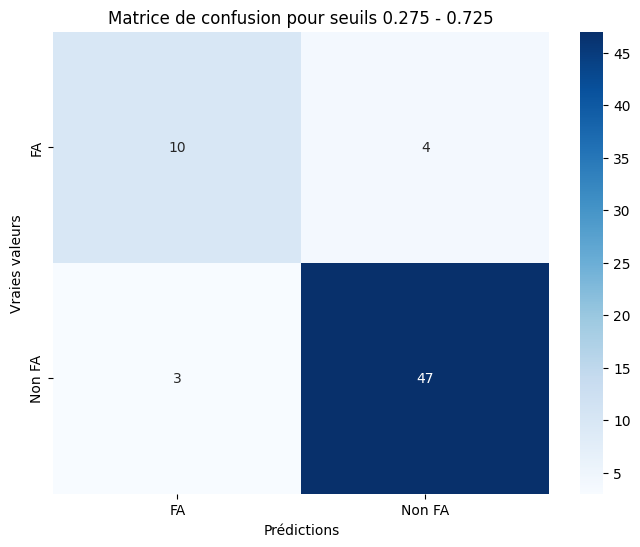

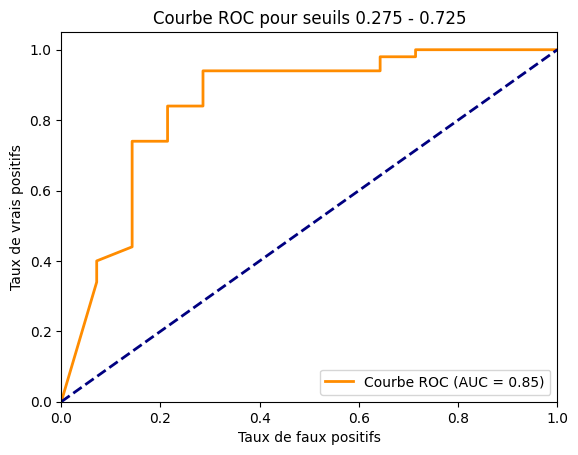

Taux de rejet: 0.16883116883116878


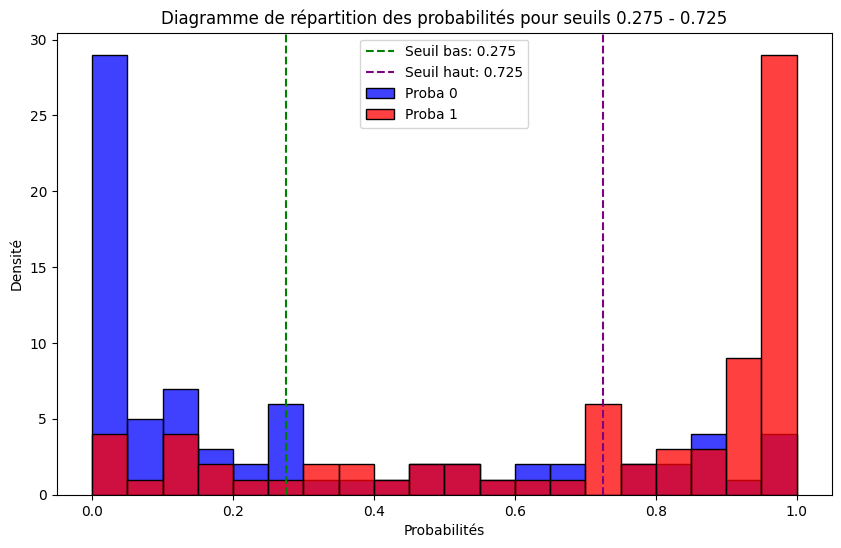


Thresholds: 0.3 - 0.7
Accuracy après filtrage: 0.8923076923076924
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.77      0.71      0.74        14
      Non FA       0.92      0.94      0.93        51

    accuracy                           0.89        65
   macro avg       0.85      0.83      0.84        65
weighted avg       0.89      0.89      0.89        65



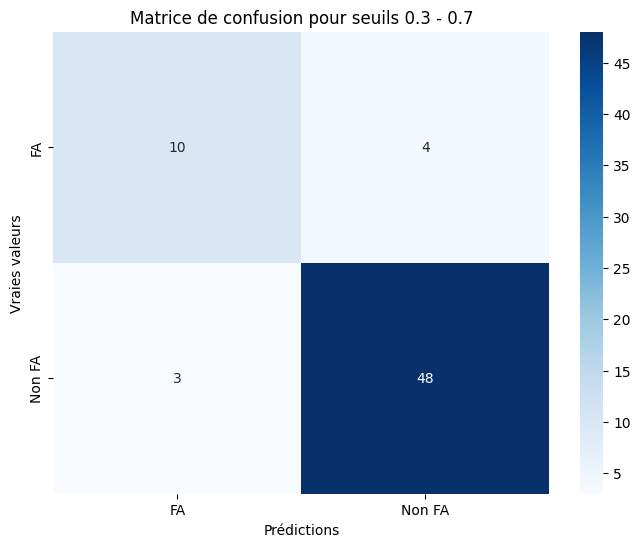

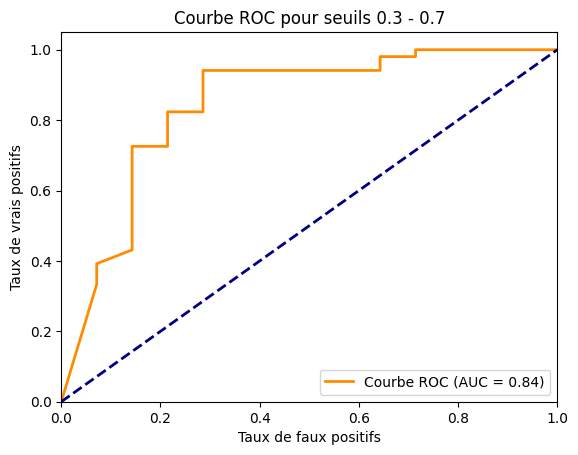

Taux de rejet: 0.1558441558441559


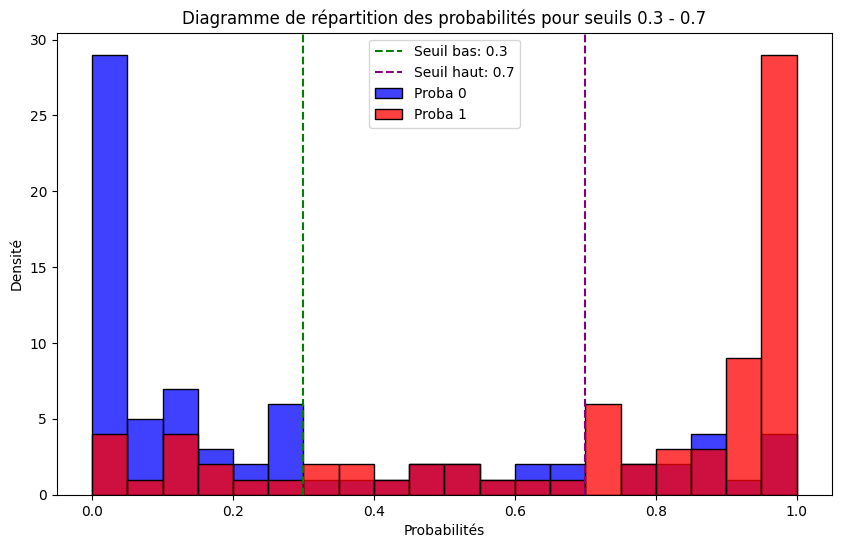


Thresholds: 0.325 - 0.675
Accuracy après filtrage: 0.8955223880597015
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.79      0.73      0.76        15
      Non FA       0.92      0.94      0.93        52

    accuracy                           0.90        67
   macro avg       0.86      0.84      0.85        67
weighted avg       0.89      0.90      0.89        67



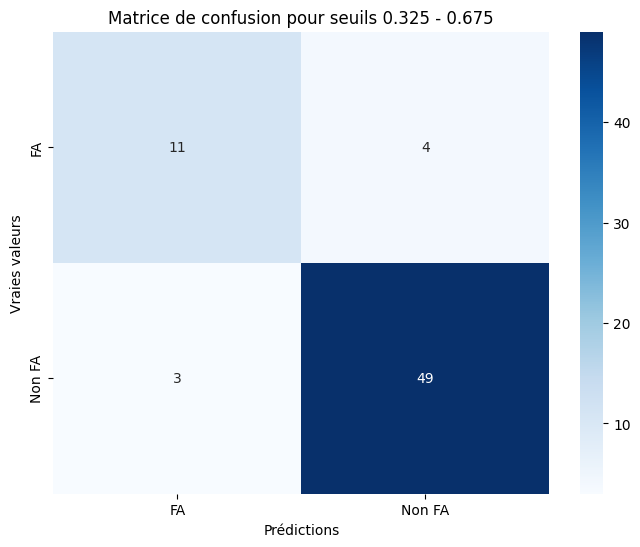

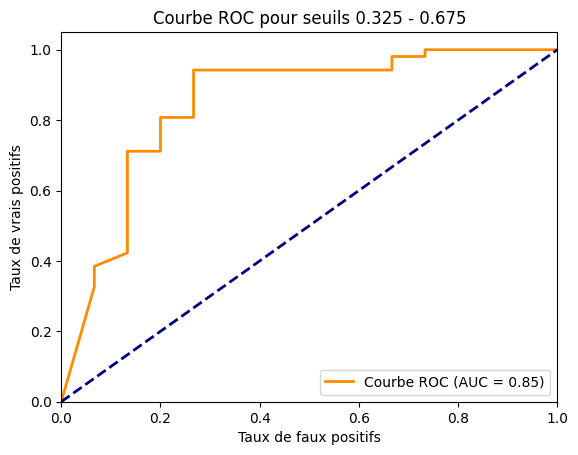

Taux de rejet: 0.1298701298701299


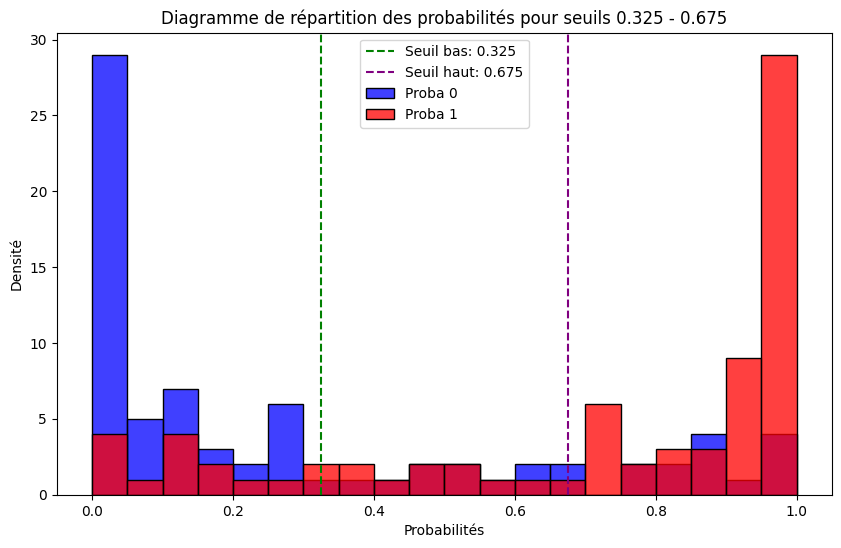


Thresholds: 0.35 - 0.65
Accuracy après filtrage: 0.8823529411764706
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.73      0.73        15
      Non FA       0.92      0.92      0.92        53

    accuracy                           0.88        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.88      0.88      0.88        68



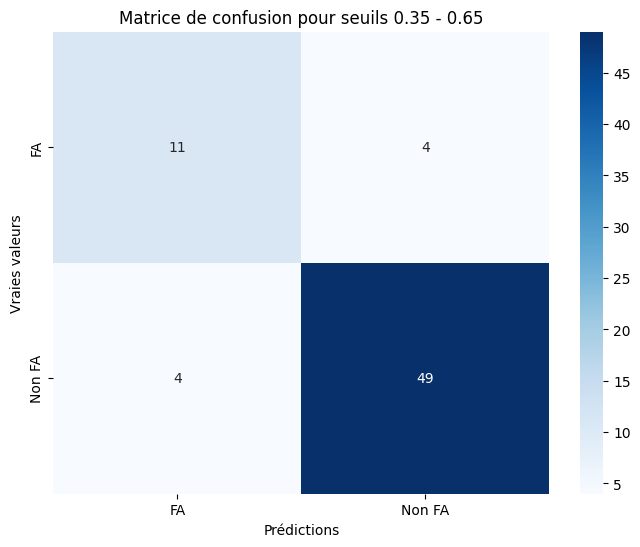

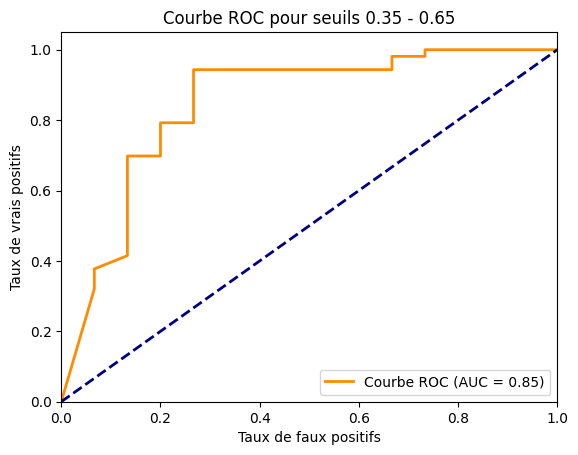

Taux de rejet: 0.11688311688311692


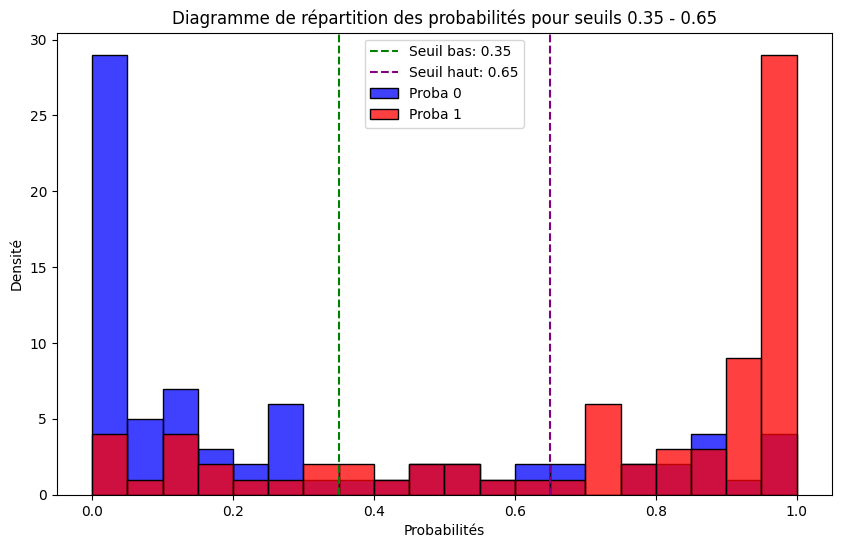


Thresholds: 0.375 - 0.625
Accuracy après filtrage: 0.8823529411764706
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.73      0.73      0.73        15
      Non FA       0.92      0.92      0.92        53

    accuracy                           0.88        68
   macro avg       0.83      0.83      0.83        68
weighted avg       0.88      0.88      0.88        68



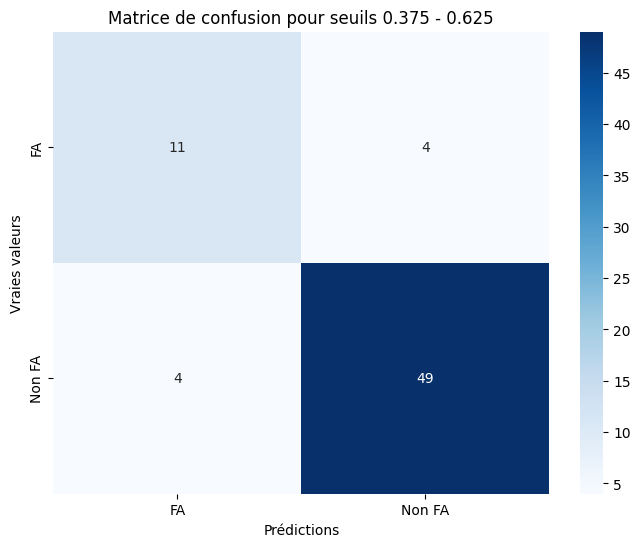

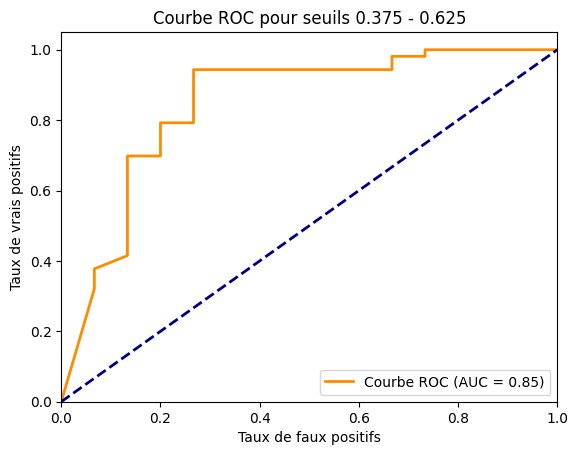

Taux de rejet: 0.11688311688311692


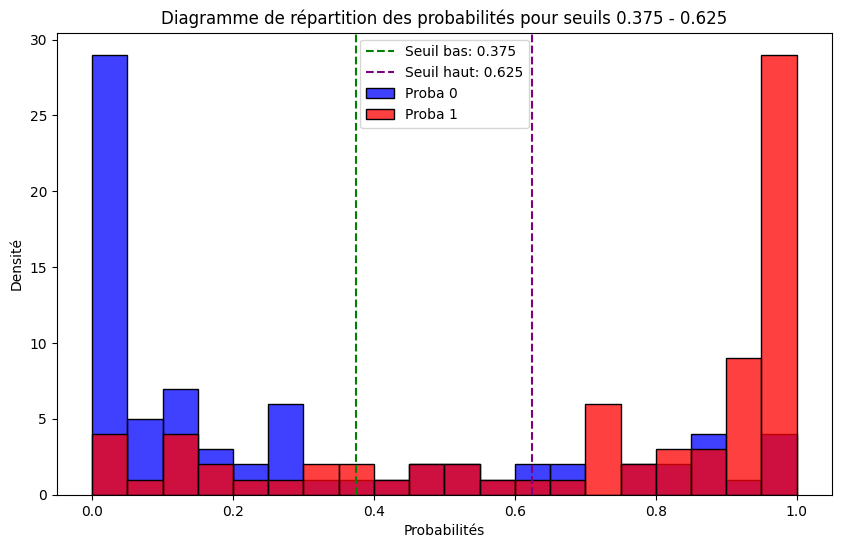


Thresholds: 0.4 - 0.6
Accuracy après filtrage: 0.8472222222222222
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        55

    accuracy                           0.85        72
   macro avg       0.79      0.80      0.79        72
weighted avg       0.85      0.85      0.85        72



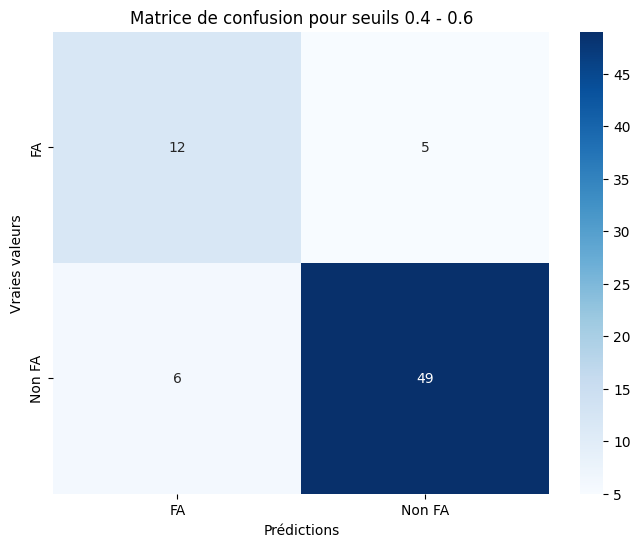

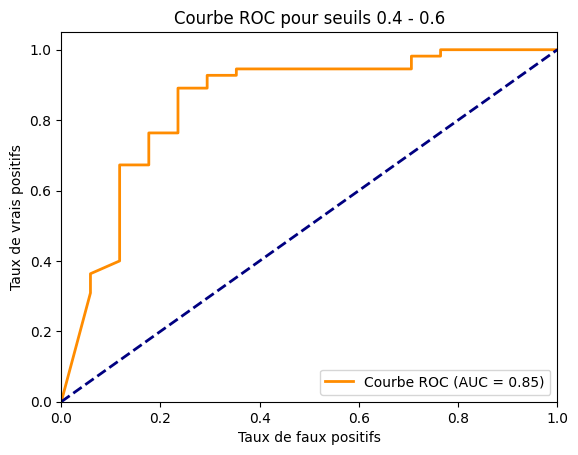

Taux de rejet: 0.06493506493506496


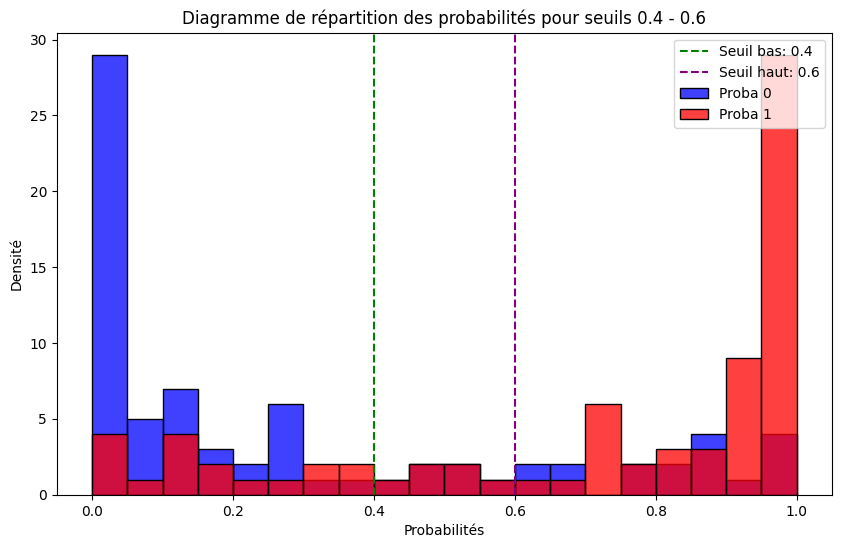


Thresholds: 0.425 - 0.575
Accuracy après filtrage: 0.8472222222222222
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        55

    accuracy                           0.85        72
   macro avg       0.79      0.80      0.79        72
weighted avg       0.85      0.85      0.85        72



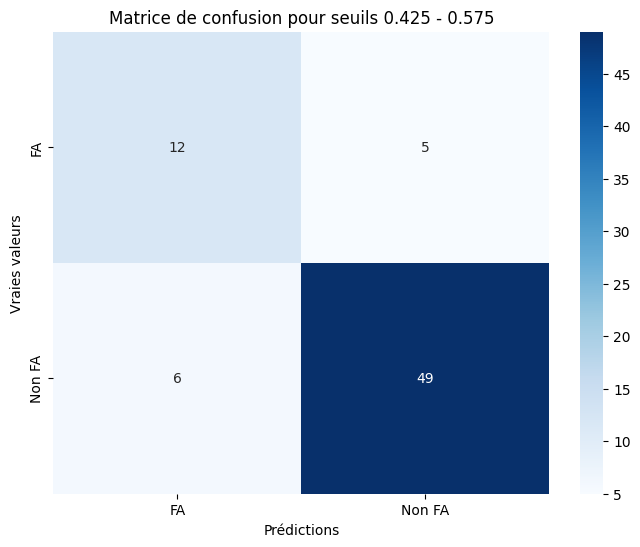

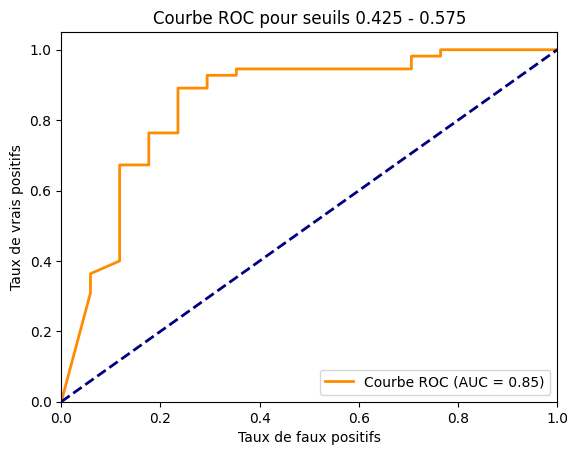

Taux de rejet: 0.06493506493506496


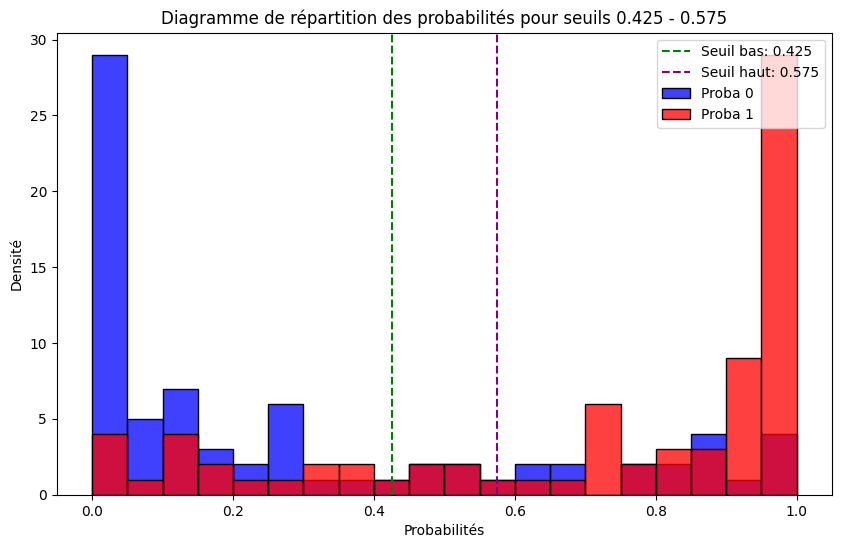


Thresholds: 0.45 - 0.55
Accuracy après filtrage: 0.8493150684931506
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.67      0.71      0.69        17
      Non FA       0.91      0.89      0.90        56

    accuracy                           0.85        73
   macro avg       0.79      0.80      0.79        73
weighted avg       0.85      0.85      0.85        73



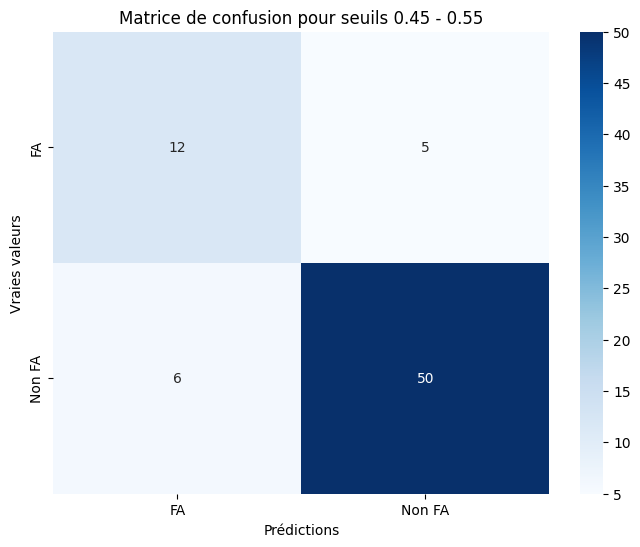

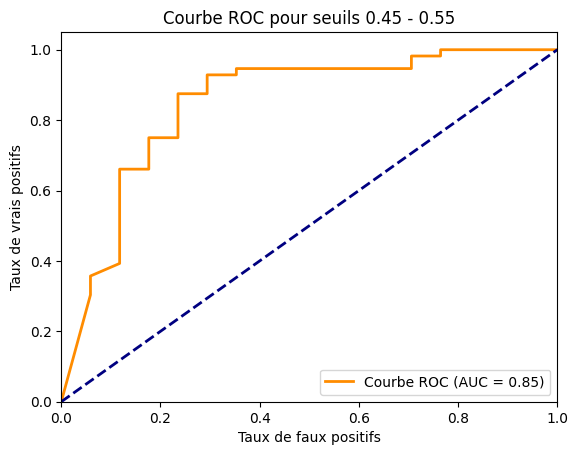

Taux de rejet: 0.051948051948051965


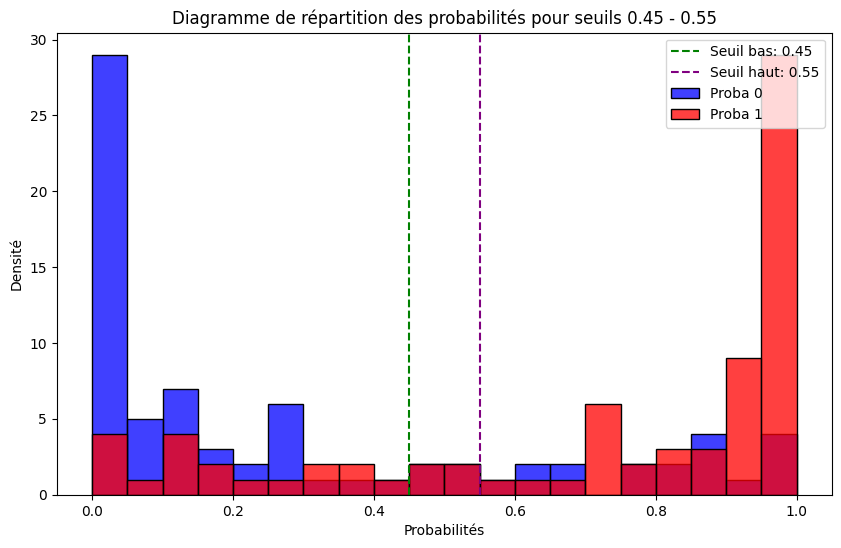


Thresholds: 0.475 - 0.525
Accuracy après filtrage: 0.8421052631578947
Rapport de classification :
               precision    recall  f1-score   support

          FA       0.70      0.70      0.70        20
      Non FA       0.89      0.89      0.89        56

    accuracy                           0.84        76
   macro avg       0.80      0.80      0.80        76
weighted avg       0.84      0.84      0.84        76



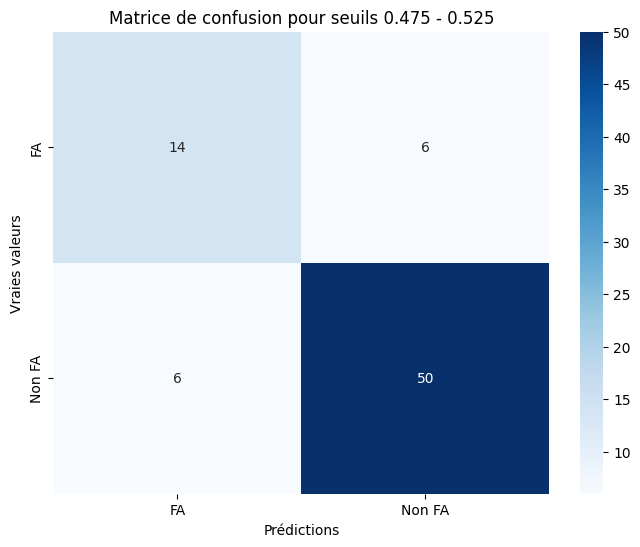

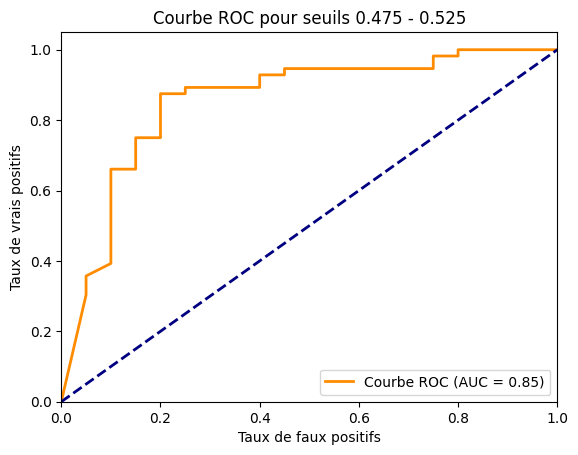

Taux de rejet: 0.012987012987012991


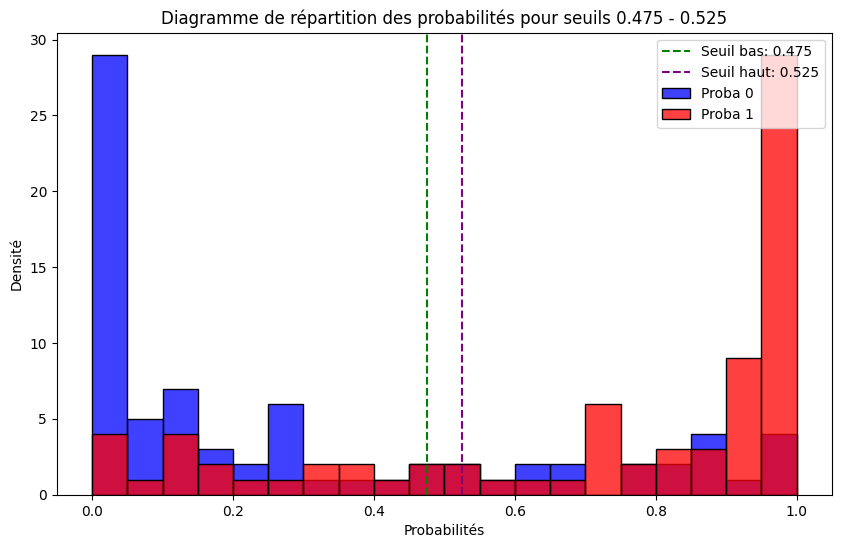

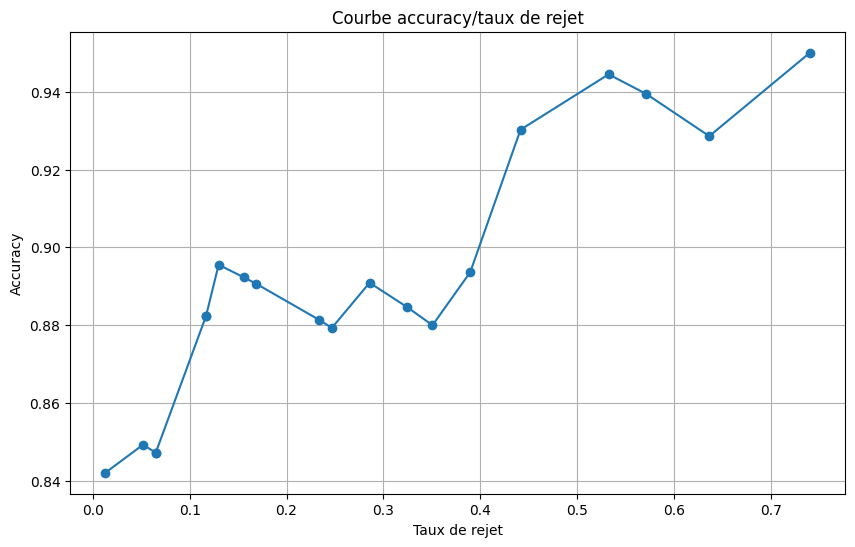

In [23]:
# Charger les données depuis le fichier Excel
df = pd.read_excel("encoded_database.xlsx")

# Préparation des données
X = df.drop(columns=['pavc.Etio CE'])
y = df['pavc.Etio CE']
mask = y != 2
X_filtered = X[mask]
y_filtered = y[mask]

# Paramètres pour la boucle
n_iterations = 5
best_accuracy = 0
best_features = None

print('Feature selection')
for i in range(n_iterations):
    # Sélection des caractéristiques
    min_features_to_select = 1  # Minimum number of features to consider
    clf = RandomForestClassifier()
    cv = StratifiedKFold(5)

    rfecv = RFECV(
        estimator=clf,
        step=1,
        cv=cv,
        scoring="accuracy",
        min_features_to_select=min_features_to_select,
        n_jobs=-1,
    )
    rfecv.fit(X_filtered, y_filtered)

    current_best_features = rfecv.support_
    current_best_accuracy = max(rfecv.cv_results_['mean_test_score'])

    print(f"Iteration {i+1}:")
    print(f"Optimal number of features: {rfecv.n_features_}")
    print(f"Best accuracy: {current_best_accuracy:.4f}")

    if current_best_accuracy > best_accuracy:
        best_accuracy = current_best_accuracy
        best_features = current_best_features

# Imprimer les caractéristiques sélectionnées
selected_features = X_filtered.columns[best_features]
print("\n", len(selected_features), "Selected features:")
print(selected_features)

print('\n----------------------------------------------------------------------------------------\n')
# Filtrer les caractéristiques
X_filtered_reduced = X_filtered.loc[:, best_features]

# Créer le pipeline avec les caractéristiques sélectionnées
pipeline_rf = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', ADASYN(sampling_strategy={0: int(10 * sum(y_filtered == 0)), 1: int(4 * sum(y_filtered == 1))}, random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Paramètres pour GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [10, 13, 15, 17],
    'classifier__max_depth': [None, 2, 3, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(pipeline_rf, param_grid_rf, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_filtered_reduced, y_filtered)

best_params = grid_search.best_params_
print(f"Best Hyperparameters for Random Forest: {best_params}")

# Meilleur modèle trouvé
best_pipeline = grid_search.best_estimator_

# Sauvegarder le modèle
joblib.dump(best_pipeline, 'model_random_forest.joblib')

# Probabilités en sortie de modèle
y_proba = cross_val_predict(best_pipeline, X_filtered_reduced, y_filtered, cv=10, method='predict_proba')

# Prédictions directes avant filtrage
y_pred = [0 if proba[0] > 0.5 else 1 for proba in y_proba]

# Calculer l'accuracy avant filtrage
accuracy_before_filter = accuracy_score(y_filtered, y_pred)
print("Accuracy avant filtrage:", accuracy_before_filter)

# Fonction de rejet pour les prédictions
def predict_with_rejection(probas, threshold_low, threshold_high):
    predictions = []
    for proba in probas:
        if proba[0] >= threshold_high:
            predictions.append(0)
        elif proba[1] >= threshold_high:
            predictions.append(1)
        elif threshold_low <= proba[0] <= threshold_high or threshold_low <= proba[1] <= threshold_high:
            predictions.append('Indetermine')
        else:
            predictions.append('Indetermine')
    return predictions

# Étendre les plages de taux de rejet
thresholds = [(i/40.0, 1-i/40.0) for i in range(20)]  # Seuils de 0 à 0.5 avec un pas de 0.025

# Stocker les résultats pour la courbe accuracy/taux de rejet
rejection_rates = []
accuracies = []

for (threshold_low, threshold_high) in thresholds:
    if threshold_low >= 0.5:  # Arrêter si le seuil bas atteint ou dépasse 0.5
        break
    
    print(f"\nThresholds: {threshold_low} - {threshold_high}")
    y_pred_with_rejection = predict_with_rejection(y_proba, threshold_low, threshold_high)
    filtered_y_pred = [pred for pred in y_pred_with_rejection if pred != 'Indetermine']
    filtered_y_true = [true for pred, true in zip(y_pred_with_rejection, y_filtered) if pred != 'Indetermine']
    
    if len(filtered_y_pred) > 0:  # Pour éviter la division par zéro
        accuracy = accuracy_score(filtered_y_true, filtered_y_pred)
        print(f"Accuracy après filtrage: {accuracy}")
        class_report = classification_report(filtered_y_true, filtered_y_pred, target_names=["FA", "Non FA"])
        print("Rapport de classification :\n", class_report)
        
        # Visualisation de la matrice de confusion
        conf_matrix = confusion_matrix(filtered_y_true, filtered_y_pred)
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["FA", "Non FA"], yticklabels=["FA", "Non FA"])
        plt.title(f'Matrice de confusion pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Prédictions')
        plt.ylabel('Vraies valeurs')
        plt.show()
        
        # Filtrer les probabilités pour la courbe ROC
        filtered_y_probas = [proba for proba, pred in zip(y_proba, y_pred_with_rejection) if pred != 'Indetermine']
        
        # Courbe ROC
        fpr, tpr, _ = roc_curve(filtered_y_true, [proba[1] for proba in filtered_y_probas])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('Taux de faux positifs')
        plt.ylabel('Taux de vrais positifs')
        plt.title(f'Courbe ROC pour seuils {threshold_low} - {threshold_high}')
        plt.legend(loc="lower right")
        plt.show()

        # Taux de rejet
        rejection_rate = 1 - len(filtered_y_pred) / len(y_filtered)
        print(f"Taux de rejet: {rejection_rate}")

        # Stocker les résultats
        rejection_rates.append(rejection_rate)
        accuracies.append(accuracy)
        
        # Visualisation de la répartition des probabilités
        proba_0 = [proba[0] for proba in y_proba]
        proba_1 = [proba[1] for proba in y_proba]

        plt.figure(figsize=(10, 6))
        sns.histplot(proba_0, bins=20, color='blue', label='Proba 0', kde=False)
        sns.histplot(proba_1, bins=20, color='red', label='Proba 1', kde=False)
        plt.axvline(threshold_low, color='green', linestyle='--', label=f'Seuil bas: {threshold_low}')
        plt.axvline(threshold_high, color='purple', linestyle='--', label=f'Seuil haut: {threshold_high}')
        plt.title(f'Diagramme de répartition des probabilités pour seuils {threshold_low} - {threshold_high}')
        plt.xlabel('Probabilités')
        plt.ylabel('Densité')
        plt.legend()
        plt.show()

# Tracer la courbe accuracy/taux de rejet
plt.figure(figsize=(10, 6))
plt.plot(rejection_rates, accuracies, marker='o')
plt.xlabel('Taux de rejet')
plt.ylabel('Accuracy')
plt.title('Courbe accuracy/taux de rejet')
plt.grid()
plt.show()